In [11]:
pwd

'/workspace'

In [12]:
import os
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [13]:
import os
import sys

#  Set the working directory to the folder containing the top-level ultralytics package
os.chdir("/workspace")  # change to your workspace root where ultralytics folder exists
print("Current working directory:", os.getcwd())


Current working directory: /workspace


In [4]:
#  Add the top-level ultralytics folder to Python path
os.chdir("/workspace/yolo-distiller")
print("Current working directory:", os.getcwd())

Current working directory: /workspace/yolo-distiller


In [14]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Setup complete ✅ (224 CPUs, 2015.6 GB RAM, 665.6/3515.6 GB disk)


In [15]:
from ultralytics import YOLO

import ultralytics
print(ultralytics.__file__)


/workspace/yolo-distiller/ultralytics/__init__.py


In [7]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_ciou_sgd/weights/best.pt")
model.info()


Model summary: 225 layers, 3,012,993 parameters, 0 gradients


(225, 3012993, 0, 0.0)

In [8]:
from ultralytics.nn import tasks
from ultralytics.models.yolo.model import YOLO

model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_ciou_sgd/weights/best.pt")
model.info()


Model summary: 365 layers, 43,638,321 parameters, 0 gradients


(365, 43638321, 0, 0.0)

In [9]:
import os
print(os.getcwd())


/workspace/yolo-distiller


In [10]:
import torch
from ultralytics import YOLO

# --- Load model ---
model = YOLO("yolov8.yaml")  # your custom model
model.eval()  # evaluation mode

# --- Create dummy input ---
dummy_img = torch.randn(1, 3, 640, 640)  # batch_size=1, 3 channels, 640x640

# --- Forward pass through the model ---
with torch.no_grad():
    preds = model.model(dummy_img)  # list of outputs from YOLO layers

# --- Pick one output and compute a dummy EIoU loss ---
from ultralytics.utils.loss import BboxLoss
from ultralytics.utils.metrics import bbox_iou

# fake target boxes (x1,y1,x2,y2)
target_boxes = torch.tensor([[100, 100, 200, 200]], dtype=torch.float32)
pred_boxes = torch.tensor([[110, 110, 210, 210]], dtype=torch.float32)

bbox_loss_fn = BboxLoss()
# Mask & dummy target scores
fg_mask = torch.tensor([True])
target_scores = torch.tensor([[1.0]])
target_scores_sum = torch.tensor(1.0)

loss_iou, loss_dfl = bbox_loss_fn(
    pred_dist=torch.zeros(1, 16, 4),      # dummy DFL input
    pred_bboxes=pred_boxes,
    anchor_points=torch.zeros(1, 2),      # dummy anchors
    target_bboxes=target_boxes,
    target_scores=target_scores,
    target_scores_sum=target_scores_sum,
    fg_mask=fg_mask
)

print(f"[Sanity Check] loss_iou = {loss_iou.item()}, loss_dfl = {loss_dfl.item()}")


WARNING ⚠️ no model scale passed. Assuming scale='n'.
New https://pypi.org/project/ultralytics/8.3.239 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
engine/trainer: task=detect, mode=train, model=yolov8.yaml, data=coco8.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n


Unzipping /workspace/datasets/coco8.zip to /workspace/datasets/coco8...: 100%|██████████| 25/25 [00:00<00:00, 948.89file/s]

Dataset download success ✅ (1.2s), saved to /workspace/datasets



Overriding model.yaml nc=11 with nc=80
WARNING ⚠️ no model scale passed. Assuming scale='n'.

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]      

train: Scanning /workspace/datasets/coco8/labels/train... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1220.87it/s]

train: New cache created: /workspace/datasets/coco8/labels/train.cache



val: Scanning /workspace/datasets/coco8/labels/val... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<00:00, 1295.24it/s]

val: New cache created: /workspace/datasets/coco8/labels/val.cache


Plotting labels to /workspace/yolo-distiller/runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 46.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 58.78it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.13it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.72it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.47it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 50.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 83.84it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 84.57it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 82.79it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 85.64it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 84.75it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.90it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.48it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.39it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.75it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 83.53it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.35it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.08it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.23it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.64it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.94it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.38it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.91it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 83.93it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 80.32it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.43it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 76.99it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 84.05it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.80it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.52it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.20it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.73it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.68it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 74.30it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.46it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.01it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.74it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.66it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.70it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.23it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.92it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 83.31it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.07it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.82it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.72it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.18it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 62.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 85.95it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 86.02it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.36it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.94it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.53it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 76.80it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 79.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.80it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.75it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 84.27it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.11it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.36it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.87it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.46it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.01it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.04it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.90it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.57it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.62it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 76.60it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 86.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.59it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.86it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 82.67it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 85.61it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.64it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.55it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.11it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.60it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.54it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.96it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.64it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 87.11it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.34it/s]

                   all          4         17          0          0          0          0


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 53.14it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 63.71it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 62.51it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.39it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.06it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 78.37it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.71it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 88.65it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 89.08it/s]

                   all          4         17          0          0          0          0



100 epochs completed in 0.010 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/train/weights/last.pt, 6.5MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/train/weights/best.pt, 6.5MB

Validating /workspace/yolo-distiller/runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
YOLOv8 summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 143.21it/s]

                   all          4         17          0          0          0          0


Speed: 0.1ms preprocess, 0.9ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to /workspace/yolo-distiller/runs/detect/train
[Sanity Check] loss_iou = 0.3275921940803528, loss_dfl = 2.7725887298583984


In [11]:
from ultralytics import YOLO
import time
import torch

# === Load teacher and student models ===
teacher_model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_ciou_sgd/weights/best.pt")
student_model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_ciou_sgd/weights/best.pt")

# === Training parameters ===
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
run_name = "try"
epochs = 1
imgsz = 640
batch_size = 64
workers = 8
device = "cuda:0" if torch.cuda.is_available() else "cpu"
cache_images = "disk"
amp = True  
save_interval = 40
patience = 20

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    amp=amp,
    patience=patience,
    save_period=save_interval,
    
    # AdamW hyperparameters
    optimizer="AdamW",
    lr0=0.001,                 # base learning rate
    weight_decay=0.0001,       # AdamW-style decay

    # LR scheduling
    cos_lr=True,               # Cosine annealing
    lrf=0.01,                  # final LR factor (LR_min = lr0*lrf)

    # Training augmentations
    augment=True
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.240 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
engine/trainer: task=detect, mode=train, model=/workspace/ultralytics/runs/detect/yolov8n_idd_ciou_sgd/weights/best.pt, data=/workspace/datasets/IDD_YOLO/idd.yaml, epochs=1, time=None, patience=20, batch=64, imgsz=640, save=True, save_period=40, cache=disk, device=cuda:0, workers=8, project=None, name=try, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None

train: Scanning /workspace/datasets/IDD_YOLO/labels/train.cache... 31569 images, 314 backgrounds, 0 corrupt: 100%|██████████| 31569/31569 [00:00<?, ?it/s]

train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_BLR-2018-06-22-05-05-26_part_45_0001125.jpg: 1 duplicate labels removed
train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_HYD-2018-06-15_11-55-11_frontNear_left_0004560.jpg: 1 duplicate labels removed


train: 266.9GB disk space required, with 50% safety margin but only 47.6/285.0GB free, not caching images to disk ⚠️


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed


val: 82.4GB disk space required, with 50% safety margin but only 47.6/285.0GB free, not caching images to disk ⚠️
Plotting labels to /workspace/yolo-distiller/runs/detect/try/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/try
Starting training for 1 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.8835530281066895. Dividing input by 255.
0: 640x640 (no detections), 5.7ms
Speed: 0.0ms preprocess, 5.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 4 cars, 2 trucks, 3.2ms
1: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.2ms
2: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.2ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.2ms
4: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.2ms
5: 640x640 1 car, 3.2ms
6: 640x640 1 car, 3.2ms
7: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 6 motorcycles, 3.2ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.2ms
9: 640x640 1 rider, 7 cars, 1 motorcycle, 1 autorickshaw, 3.2ms
10: 640x640 1 person, 3.2ms
11: 640x640 1 rider, 1 motorcycle, 3.2ms
12: 640x640 1 person, 1 car, 1 truck, 3.2ms
13: 640x640 2 persons, 1 rider, 3 motorcycles, 3.2ms
14: 640x640 1 rider, 1 truck, 1 bus, 4 motorcycles, 3.2ms
15: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.2ms
16: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.2ms
17: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.2ms
18: 640x6

        1/1      14.9G      1.013     0.5979     0.9509        798        640:   0%|          | 1/494 [00:01<08:42,  1.06s/it]


0: 640x640 1 car, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 8 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 37 persons, 6 riders, 6 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 4 cars, 1 truck, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 18 persons, 3 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 1 car, 2 trucks, 3.1ms
15: 640x640 1 person, 6 riders, 6 cars, 3 t

        1/1      14.9G      1.084     0.6212      0.969       1288        640:   0%|          | 2/494 [00:01<05:59,  1.37it/s]


0: 640x640 1 person, 1 rider, 3.1ms
1: 640x640 1 person, 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 7 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 19 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3.1ms
8: 640x640 1 rider, 5 cars, 4 trucks, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 4 persons, 1 car, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 rider, 10 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 riders, 5 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 2 trucks, 1 motorcycle, 3

        1/1      14.9G      1.132     0.6354     0.9766       1419        640:   1%|          | 3/494 [00:02<05:10,  1.58it/s]


0: 640x640 4 persons, 19 riders, 31 cars, 4 trucks, 16 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 buss, 3.1ms
2: 640x640 2 persons, 6 riders, 10 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 riders, 7 cars, 2 trucks, 6 buss, 8 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 5 cars, 4 buss, 3 motorcycles, 3.1ms
8: 640x640 10 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic light, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 4 cars, 3 trucks, 3 motorcycles, 1 traffi

        1/1      14.9G      1.138     0.6577     0.9794       1324        640:   1%|          | 4/494 [00:02<04:53,  1.67it/s]


0: 640x640 10 cars, 2 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 cars, 1 bus, 3.1ms
3: 640x640 1 person, 4 cars, 3 buss, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 animals, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 5 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 1 person, 1 bus, 3.1ms
16: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
17: 640x640 9 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
18: 640x640 3 persons, 2 cars, 1 truck, 1 autoricksh

        1/1      14.9G      1.132     0.6575     0.9814        963        640:   1%|          | 5/494 [00:03<04:24,  1.85it/s]


0: 640x640 2 persons, 2 cars, 18 trucks, 3.1ms
1: 640x640 27 persons, 7 riders, 2 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 1 rider, 2 cars, 6 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 14 persons, 2 riders, 4 cars, 7 trucks, 3 motorcycles, 3.1ms
12: 640x640 39 persons, 3 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 11 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640

        1/1      14.9G      1.194     0.6867     0.9871       1406        640:   1%|          | 6/494 [00:03<04:08,  1.97it/s]


0: 640x640 1 person, 4 riders, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
2: 640x640 1 person, 14 riders, 7 cars, 6 buss, 5 motorcycles, 7 bicycles, 3.1ms
3: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 2 bicycles, 3.1ms
4: 640x640 7 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 2 cars, 2 buss, 3 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 3 bicycles, 3.1ms
8: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 rider, 1 car, 1 motor

        1/1      14.9G      1.207      0.696     0.9917       1416        640:   1%|▏         | 7/494 [00:03<03:58,  2.04it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 5 cars, 3 buss, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 3 buss, 2 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 12 riders, 7 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 buss, 3.1ms
16: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
17: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
18: 

        1/1      14.9G      1.231     0.7087     0.9953       1209        640:   2%|▏         | 8/494 [00:04<03:51,  2.10it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 1 truck, 3.1ms
2: 640x640 2 persons, 6 cars, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 riders, 7 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 8 persons, 5 riders, 4 cars, 1 bus, 12 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 15 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 riders, 4 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 9 persons, 5 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 5 pers

        1/1      14.9G      1.225     0.7111     0.9944       1063        640:   2%|▏         | 9/494 [00:04<03:45,  2.15it/s]


0: 640x640 7 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3 animals, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 2 animals, 1 traffic light, 3.1ms
5: 640x640 3 persons, 9 riders, 4 cars, 4 trucks, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 14 riders, 17 cars, 2 trucks, 12 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 8 riders, 14 cars, 2 trucks, 4 motorcycles, 2 bicycles, 1 animal, 3.1ms
10: 640x640 4 persons, 4 riders, 1 truck, 5 motorcycles, 1 bicycle, 7 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks,

        1/1      14.9G       1.23     0.7126     0.9952       1170        640:   2%|▏         | 10/494 [00:05<03:41,  2.18it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 9 riders, 2 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 4 motorcycles, 3.1ms
4: 640x640 10 persons, 7 riders, 1 car, 11 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 2 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 trucks, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 7 cars, 3 trucks, 3 buss, 3 

        1/1      14.9G      1.232     0.7169     0.9982       1045        640:   2%|▏         | 11/494 [00:05<03:39,  2.21it/s]


0: 640x640 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 persons, 3 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 3 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 12 persons, 2 trucks, 3.1ms
16: 640x640 4 persons, 5 riders, 2 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
17: 640x640 5 persons, 12 ri

        1/1      14.9G      1.221     0.7148      0.998        954        640:   2%|▏         | 12/494 [00:06<03:37,  2.22it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 3 cars, 2 buss, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 3 cars, 7 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 6 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 5 motorcycles, 3.1ms
7: 640x640 3 persons, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 7 riders, 9 cars, 1 bus, 18 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 5 cars, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 rider, 5 cars, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 8 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 trucks, 1 bicycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 9 persons, 8 riders, 4 cars, 1 truck, 1 bus, 9 motor

        1/1      14.9G      1.226     0.7196     0.9983       1298        640:   3%|▎         | 13/494 [00:06<03:35,  2.23it/s]


0: 640x640 6 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 3 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 7 riders, 2 cars, 1 bus, 7 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 6 autorickshaws, 5 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 1 rider, 4 cars, 7 trucks, 1 bus, 3 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 5 riders, 10 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 3.1ms
14: 640x640 6 

        1/1      14.9G      1.231     0.7244     0.9984       1339        640:   3%|▎         | 14/494 [00:07<03:34,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 6 riders, 9 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 buss, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 5 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 10 riders, 4 cars, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 7 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
10: 640x640 2 persons, 8 riders, 15 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
11: 640x640 4 riders, 5 cars, 1 bu

        1/1      14.9G      1.231     0.7241     0.9965       1352        640:   3%|▎         | 15/494 [00:07<03:33,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 5 motorcycles, 2 bicycles, 3.1ms
4: 640x640 1 person, 7 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 2 cars, 1 truck, 2 buss, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 car, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 4 cars, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14

        1/1      14.9G       1.24     0.7298     0.9969       1427        640:   3%|▎         | 16/494 [00:07<03:33,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 2 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 7 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 riders, 1 car, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bicycle, 3.1ms
11: 640x640 6 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 10 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
14

        1/1      14.9G      1.235     0.7266      0.996       1278        640:   3%|▎         | 17/494 [00:08<03:34,  2.22it/s]


0: 640x640 4 riders, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 5 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 5 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 9 riders, 5 trucks, 10 motorcycles, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 12 riders, 11 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 cars, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 truck, 2 motorcycles, 3.

        1/1      14.9G      1.237     0.7262     0.9953       1323        640:   4%|▎         | 18/494 [00:08<03:34,  2.22it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 7 cars, 7 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 4 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 5 riders, 10 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 15 persons, 3 riders, 5 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 12 persons, 6 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 4 cars, 1 t

        1/1      14.9G      1.238     0.7271     0.9946       1251        640:   4%|▍         | 19/494 [00:09<03:33,  2.22it/s]


0: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 truck, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 7 cars, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
9: 640x640 3 persons, 9 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 8 cars, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 4 trucks, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3.1ms
16:

        1/1      14.9G      1.234     0.7264     0.9936       1317        640:   4%|▍         | 20/494 [00:09<03:32,  2.23it/s]


0: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 21 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 5 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 cars, 3 trucks, 3.1ms
14: 640x640 5 riders, 2 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 2 m

        1/1      14.9G      1.235     0.7272     0.9944       1079        640:   4%|▍         | 21/494 [00:10<03:31,  2.24it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 8 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 5 motorcycles, 2 bicycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 bus, 3.1ms
13: 640x640 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 3 cars, 1

        1/1      14.9G       1.24     0.7301      0.995       1261        640:   4%|▍         | 22/494 [00:10<03:30,  2.24it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 6 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 3 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 3.1ms
10: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 animals, 3.1ms
13: 640x640 2 persons, 13 riders, 2 cars, 1 truck, 3 buss, 11 motorcycles, 1 bicycle, 3.1ms
14: 640x640 3 riders, 13 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 r

        1/1      14.9G      1.237     0.7278     0.9941       1267        640:   5%|▍         | 23/494 [00:11<03:29,  2.25it/s]


0: 640x640 5 cars, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 8 riders, 12 cars, 4 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 3 trucks, 1 bicycle, 3.1ms
10: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 4 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 7 persons, 2 riders, 6 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
17:

        1/1      14.9G       1.24     0.7296     0.9938       1137        640:   5%|▍         | 24/494 [00:11<03:28,  2.25it/s]


0: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 6 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 8 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 8 persons, 3 motorcycles, 3.1ms
9: 640x640 6 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 8 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 3.1ms
13: 640x640 4 animals, 3.1ms
14: 640x640 8 pers

        1/1      14.9G       1.24     0.7301     0.9941       1242        640:   5%|▌         | 25/494 [00:11<03:28,  2.25it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 motorcycles, 1 animal, 2 traffic lights, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 truck, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 10 riders, 13 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 2 motorcycles, 1 bicycle, 7 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car,

        1/1      14.9G      1.238     0.7286     0.9931       1284        640:   5%|▌         | 26/494 [00:12<03:29,  2.24it/s]


0: 640x640 2 riders, 7 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 11 riders, 3 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 10 persons, 7 riders, 2 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 bicycle, 3.1ms
8: 640x640 3 riders, 13 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 6 trucks, 3.1ms
12: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 8 cars, 3 trucks

        1/1      14.9G       1.24     0.7289     0.9936       1429        640:   5%|▌         | 27/494 [00:12<03:28,  2.24it/s]


0: 640x640 14 persons, 13 riders, 10 cars, 3 trucks, 14 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 cars, 4 buss, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 rider, 1 truck, 1 bus, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
15: 640x640 1 ri

        1/1      14.9G      1.238      0.728     0.9929       1273        640:   6%|▌         | 28/494 [00:13<03:28,  2.24it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 5 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcyc

        1/1      14.9G       1.24     0.7301     0.9938       1325        640:   6%|▌         | 29/494 [00:13<03:27,  2.24it/s]


0: 640x640 3 cars, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 12 persons, 11 riders, 22 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 6 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 14 riders, 10 cars, 3 trucks, 13 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 10 persons, 8 riders, 5 cars, 4 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 riders, 6 cars, 7 trucks, 2 motorcycles, 5 autorickshaws, 6 traffic lights, 2

        1/1      14.9G      1.241     0.7307     0.9936       1538        640:   6%|▌         | 30/494 [00:14<03:27,  2.23it/s]


0: 640x640 1 person, 6 riders, 11 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 3 trucks, 5 buss, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 cars, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 8 motorcycles, 3.1ms
7: 640x640 2 motorcycles, 2 bicycles, 3.1ms
8: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 5 buss, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 6 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 3 motorcycles

        1/1      14.9G      1.241     0.7295     0.9933       1242        640:   6%|▋         | 31/494 [00:14<03:26,  2.24it/s]


0: 640x640 13 persons, 9 riders, 1 car, 8 motorcycles, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 8 riders, 4 cars, 12 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 12 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars,

        1/1      14.9G       1.24     0.7295     0.9937       1398        640:   6%|▋         | 32/494 [00:15<03:25,  2.25it/s]


0: 640x640 1 car, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 10 cars, 2 trucks, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 10 riders, 10 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 8 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 4 traffic signs, 3.1ms
12: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 3 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms

        1/1      14.9G      1.239     0.7301     0.9934       1196        640:   7%|▋         | 33/494 [00:15<03:25,  2.25it/s]


0: 640x640 2 persons, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 13 persons, 8 riders, 6 cars, 3 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 2 riders, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 5 persons, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 8 riders, 9 cars, 2 trucks, 1 bus, 14 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 5 buss, 3 motorcycles, 1 autoricksh

        1/1      14.9G      1.237     0.7295     0.9927       1238        640:   7%|▋         | 34/494 [00:15<03:25,  2.24it/s]


0: 640x640 5 persons, 3 riders, 6 cars, 3 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 car, 3.1ms
2: 640x640 8 persons, 3 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 2 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 6 persons, 5 riders, 8 cars, 5 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 1 animal, 3.1ms
9: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 10 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 person, 2 ride

        1/1      14.9G      1.236     0.7288     0.9922       1321        640:   7%|▋         | 35/494 [00:16<03:24,  2.25it/s]


0: 640x640 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 cars, 2 buss, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 7 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 2 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 3 per

        1/1      14.9G      1.233     0.7278     0.9912       1050        640:   7%|▋         | 36/494 [00:16<03:23,  2.25it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 5 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 5 persons, 6 riders, 3 cars, 5 trucks, 2 buss, 11 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 3.1ms
7: 640x640 2 riders, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 4 riders, 3 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 8 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 4 riders, 9 car

        1/1      14.9G      1.232     0.7273     0.9911       1257        640:   7%|▋         | 37/494 [00:17<03:23,  2.25it/s]


0: 640x640 2 persons, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 1 person, 3 riders, 8 cars, 4 trucks, 4 buss, 3 motorcycles, 5 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
11: 640x640 27 person

        1/1      14.9G      1.233      0.728     0.9915       1511        640:   8%|▊         | 38/494 [00:17<03:23,  2.25it/s]


0: 640x640 3 persons, 10 riders, 10 cars, 4 trucks, 12 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 8 riders, 8 cars, 6 trucks, 16 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 11 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 2 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
13: 640x6

        1/1      14.9G      1.232     0.7275      0.991       1205        640:   8%|▊         | 39/494 [00:18<03:22,  2.25it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3.1ms
1: 640x640 1 person, 8 riders, 5 cars, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 6 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars, 9 motorcycles, 1 traffic light, 3.1ms
13: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 2 r

        1/1      14.9G      1.232     0.7274     0.9918       1049        640:   8%|▊         | 40/494 [00:18<03:20,  2.26it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 8 persons, 7 riders, 17 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
8: 640x640 4 persons, 2 riders, 8 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 6 cars, 2 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 6 cars, 5 trucks, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 rider

        1/1      14.9G      1.234     0.7281     0.9921       1168        640:   8%|▊         | 41/494 [00:19<03:19,  2.27it/s]


0: 640x640 1 person, 4 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 8 riders, 2 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 8 persons, 4 riders, 3 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 bicycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 6 riders, 7 cars, 1 truck, 6 buss, 13 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 3 trucks, 5 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
8: 640x640 1 person, 2 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 3 bicycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 motorcycles, 

        1/1      14.9G      1.232      0.728     0.9919       1164        640:   9%|▊         | 42/494 [00:19<03:19,  2.27it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 3 riders, 13 cars, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 1 rider, 3 cars, 3 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 18 persons, 6 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 19 persons, 6 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 1 person, 21 riders, 3 cars, 1 truck, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 7 riders, 13 cars, 3 trucks, 10 buss, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 tru

        1/1      14.9G      1.233     0.7278     0.9923       1238        640:   9%|▊         | 43/494 [00:19<03:19,  2.26it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 5 motorcycles, 1 animal, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 trucks, 1 bus, 3.1ms
4: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 16 riders, 6 trucks, 13 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 9 cars, 3 trucks, 1 bus, 8 motorcycles, 2 bicycles, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic

        1/1      14.9G      1.233     0.7272     0.9926       1267        640:   9%|▉         | 44/494 [00:20<03:19,  2.26it/s]


0: 640x640 2 riders, 7 cars, 3 motorcycles, 3.1ms
1: 640x640 1 car, 5 trucks, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 4 cars, 4 trucks, 7 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 3.1ms
5: 640x640 2 persons, 6 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 10 riders, 6 cars, 7 motorcycles, 3.1ms
10: 640x640 5 riders, 8 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 cars, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 5 cars, 2 buss, 3.1ms
15: 640x640 11 persons, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 640x640 6 persons, 5 ri

        1/1      14.9G      1.233     0.7271     0.9927       1397        640:   9%|▉         | 45/494 [00:20<03:19,  2.25it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 3 cars, 2 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 15 persons, 3 riders, 8 cars, 10 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 4 cars, 4 motorcycles, 3.1ms
8: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 11 persons, 11 riders, 7 cars, 12 motorcycles, 4 autorickshaws, 5 traffic lights, 1 traffic si

        1/1      14.9G      1.233      0.727      0.993       1293        640:   9%|▉         | 46/494 [00:21<03:18,  2.25it/s]


0: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 2 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 3 persons, 5 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 8 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 10 riders, 7 cars, 2 buss, 10 mo

        1/1      14.9G      1.233      0.727     0.9927       1375        640:  10%|▉         | 47/494 [00:21<03:17,  2.26it/s]


0: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 rider, 1 truck, 9 autorickshaws, 3.1ms
2: 640x640 10 persons, 16 riders, 5 cars, 4 trucks, 16 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 1 person, 2 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 13 cars, 4 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 11 riders, 6 cars, 2 trucks, 2 buss, 12 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 cars, 3.1ms
10: 640x640 1 car, 4 trucks, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 6 riders, 11 cars, 5 motorcycles, 3.1ms
12: 640x640 2 cars, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x64

        1/1      14.9G      1.234     0.7276     0.9932       1518        640:  10%|▉         | 48/494 [00:22<03:18,  2.25it/s]


0: 640x640 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 5 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 5 cars, 1 truck, 6 buss, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 6 trucks, 4 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 3 cars, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus

        1/1      14.9G      1.235     0.7276     0.9935       1297        640:  10%|▉         | 49/494 [00:22<03:18,  2.24it/s]


0: 640x640 5 persons, 16 riders, 16 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 24 persons, 5 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 5 riders, 12 cars, 7 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 7 riders, 3 cars, 3 trucks, 1

        1/1      14.9G      1.235     0.7271     0.9934       1442        640:  10%|█         | 50/494 [00:23<03:18,  2.24it/s]


0: 640x640 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 motorcycles, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 4 riders, 11 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 7 persons, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 15 persons, 7 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 

        1/1      14.9G      1.234     0.7255     0.9932       1170        640:  10%|█         | 51/494 [00:23<03:16,  2.25it/s]


0: 640x640 3 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 2 riders, 9 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle,

        1/1      14.9G      1.233     0.7249     0.9929       1249        640:  11%|█         | 52/494 [00:23<03:15,  2.26it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 3 animals, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 7 persons, 5 riders, 9 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 2 riders, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 4

        1/1      14.9G      1.233     0.7247      0.993       1268        640:  11%|█         | 53/494 [00:24<03:15,  2.25it/s]


0: 640x640 14 persons, 5 riders, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 10 riders, 2 cars, 8 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 bicycles, 3.1ms
8: 640x640 1 rider, 1 truck, 3 buss, 3.1ms
9: 640x640 1 person, 2 riders, 10 cars, 1 bus, 21 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 11 riders, 2 cars, 3 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 6 persons, 7 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
13: 6

        1/1      14.9G      1.234     0.7257     0.9929       1382        640:  11%|█         | 54/494 [00:24<03:14,  2.26it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 10 persons, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 5 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 15 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 bicycle, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 7 persons, 3 riders,

        1/1      14.9G      1.234     0.7252     0.9926       1283        640:  11%|█         | 55/494 [00:25<03:14,  2.26it/s]


0: 640x640 4 persons, 5 riders, 9 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 9 riders, 4 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 4 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 1 rider, 7 cars, 1 truck, 10 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 5 traffic lights, 3.1ms
1

        1/1      14.9G      1.235     0.7255     0.9929       1261        640:  11%|█▏        | 56/494 [00:25<03:13,  2.26it/s]


0: 640x640 5 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 5 persons, 6 riders, 1 bus, 4 motorcycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 3 cars, 6 trucks, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 14 cars, 3 trucks, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 7 persons, 10 riders, 18 cars, 6 trucks, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 7 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 15 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640

        1/1      14.9G      1.235     0.7251     0.9926       1662        640:  12%|█▏        | 57/494 [00:26<03:14,  2.25it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 9 riders, 7 trucks, 9 motorcycles, 3.1ms
2: 640x640 3 cars, 1 bus, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 4 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 4 persons, 3.1ms
9: 640x640 2 persons, 9 riders, 8 cars, 1 truck, 2 buss, 14 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 64

        1/1      14.9G      1.237     0.7252     0.9928       1641        640:  12%|█▏        | 58/494 [00:26<03:14,  2.24it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 cars, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 8 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 10 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 6 persons, 4 riders, 11 cars, 2 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 1 person, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 5 riders, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x

        1/1      14.9G      1.237      0.725     0.9931       1674        640:  12%|█▏        | 59/494 [00:27<03:14,  2.24it/s]


0: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 5 riders, 4 cars, 2 trucks, 9 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 10 cars, 4 trucks, 4 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
7: 640x640 3 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 10 riders, 14 cars, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 5 cars, 7 motorcycles, 3.1ms
11: 640x640 5 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 6 cars, 2 trucks, 3.1ms
13: 640x640 6 persons, 17 riders, 10 cars, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 4 riders, 12 cars, 3 trucks, 3 buss, 10 motorcycles, 3 au

        1/1      14.9G      1.237     0.7247      0.993       1477        640:  12%|█▏        | 60/494 [00:27<03:13,  2.24it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 3 trucks, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 cars, 1 bus, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 cars, 3.1ms
9: 640x640 5 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 riders, 1 car, 5 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 pers

        1/1      14.9G      1.237     0.7242     0.9932       1346        640:  12%|█▏        | 61/494 [00:27<03:12,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 7 riders, 7 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 6 persons, 20 riders, 13 cars, 2 trucks, 22 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 6 animals, 3.1ms
13: 640x6

        1/1      14.9G      1.237     0.7241     0.9933       1348        640:  13%|█▎        | 62/494 [00:28<03:13,  2.23it/s]


0: 640x640 4 persons, 9 riders, 6 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 6 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 2 cars, 2 

        1/1      14.9G      1.237     0.7236     0.9935       1115        640:  13%|█▎        | 63/494 [00:28<03:12,  2.24it/s]


0: 640x640 3 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 16 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 9 cars, 7 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 8 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 1 animal, 3.1ms
6: 640x640 8 persons, 5 riders, 10 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 1 person, 7 riders, 8 cars, 3 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3

        1/1      14.9G      1.237     0.7235     0.9935       1464        640:  13%|█▎        | 64/494 [00:29<03:12,  2.24it/s]


0: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 truck, 3.1ms
10: 640x640 5 riders, 9 cars, 4 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 19 persons, 7 riders, 7 cars, 4 trucks, 4 buss, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 11 persons, 9 riders, 4 cars, 2 trucks, 13 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
15: 6

        1/1      14.9G      1.238     0.7237     0.9939       1282        640:  13%|█▎        | 65/494 [00:29<03:11,  2.24it/s]


0: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 26 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 15 riders, 10 cars, 2 trucks, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 1 car, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms

        1/1      14.9G      1.238     0.7235      0.994       1333        640:  13%|█▎        | 66/494 [00:30<03:10,  2.24it/s]


0: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 2 buss, 20 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 7 riders, 15 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 truck, 3.1ms
12: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
1

        1/1      14.9G      1.238     0.7233     0.9943       1340        640:  14%|█▎        | 67/494 [00:30<03:09,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 2 motorcycles, 6 bicycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 rider, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 8 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 23 persons, 2 riders, 1 car, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 14 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
15: 6

        1/1      14.9G      1.238     0.7232     0.9945       1238        640:  14%|█▍        | 68/494 [00:31<03:09,  2.25it/s]


0: 640x640 2 persons, 6 cars, 3 trucks, 2 buss, 3.1ms
1: 640x640 13 persons, 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 3.1ms
4: 640x640 12 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 10 riders, 12 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 8 riders, 5 cars, 1 truck, 13 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 4 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 6 riders, 4 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 8 cars, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 4 cars, 3 trucks, 

        1/1      14.9G      1.238     0.7227     0.9944       1416        640:  14%|█▍        | 69/494 [00:31<03:09,  2.24it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 trucks, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 9 persons, 11 riders, 5 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 5 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 6 persons, 7 riders, 2 cars, 1 truck, 6 motorcy

        1/1      14.9G      1.238     0.7229     0.9946       1279        640:  14%|█▍        | 70/494 [00:32<03:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 10 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 2 buss, 10 motorcycles, 8 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 3.1ms
14: 640x640 7 person

        1/1      14.9G      1.236      0.722     0.9939       1055        640:  14%|█▍        | 71/494 [00:32<03:09,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 4 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 16 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles,

        1/1      14.9G      1.236     0.7227     0.9941       1089        640:  15%|█▍        | 72/494 [00:32<03:07,  2.25it/s]


0: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 6 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 cars, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 6 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 8 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 2 riders, 2 cars, 4 truck

        1/1      14.9G      1.236     0.7229     0.9943       1248        640:  15%|█▍        | 73/494 [00:33<03:07,  2.24it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 10 motorcycles, 3.1ms
9: 640x640 17 persons, 8 riders, 3 cars, 3 trucks, 10 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 14 persons, 1 rider, 5 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 buss, 3.1ms
13: 640x640 3 persons, 3 riders, 9 cars, 3 trucks, 1 bus, 3

        1/1      14.9G      1.236     0.7231     0.9941       1254        640:  15%|█▍        | 74/494 [00:33<03:06,  2.25it/s]


0: 640x640 3 cars, 1 bus, 3.1ms
1: 640x640 3 riders, 11 cars, 4 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 6 riders, 12 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 13 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 2 buss, 1 bicycle, 1 animal, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 8 persons, 5 riders, 3 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 8 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 3 rider

        1/1      14.9G      1.235     0.7223     0.9942       1155        640:  15%|█▌        | 75/494 [00:34<03:06,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 6 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 8 persons, 2 riders, 4 cars, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 2 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 5 riders, 5 cars, 14 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 2 cars, 8 motorcycles, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 riders, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 5 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3

        1/1      14.9G      1.235      0.722     0.9941       1451        640:  15%|█▌        | 76/494 [00:34<03:07,  2.23it/s]


0: 640x640 6 persons, 10 riders, 13 cars, 4 trucks, 6 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 5 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 4 riders, 11 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 4 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 12 riders, 12 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 13 riders, 8 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.

        1/1      14.9G      1.235     0.7222     0.9939       1371        640:  16%|█▌        | 77/494 [00:35<03:07,  2.22it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 10 persons, 2 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 11 cars, 1 bus, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 9 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 5 animals, 3.1ms
10: 640x640 3 persons, 1 rider, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 2 trucks, 3.1ms
13: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 3 riders, 2 cars, 2 buss, 8 motorcycles, 1 

        1/1      14.9G      1.235     0.7221     0.9939       1328        640:  16%|█▌        | 78/494 [00:35<03:06,  2.24it/s]


0: 640x640 10 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic light, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 4 cars, 1 truck, 8 motorcycles, 3.1ms
9: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 8 persons, 11 riders, 12 cars, 1 truck, 4 buss, 3 motorcycles, 18 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 14 riders, 16 cars, 1 truck, 1 bus, 13 motorcycles, 1 traffic sign, 3.1ms
13:

        1/1      14.9G      1.236     0.7224     0.9942       1259        640:  16%|█▌        | 79/494 [00:36<03:05,  2.23it/s]


0: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
1: 640x640 7 persons, 3 riders, 8 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 3 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 20 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 5 riders, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 6 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 3 cars, 3 trucks, 1 bus, 3.

        1/1      14.9G      1.236     0.7224      0.994       1541        640:  16%|█▌        | 80/494 [00:36<03:05,  2.24it/s]


0: 640x640 3 persons, 16 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 4 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 6 persons, 5 riders, 3 cars, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 

        1/1      14.9G      1.237     0.7229     0.9944       1438        640:  16%|█▋        | 81/494 [00:36<03:05,  2.23it/s]


0: 640x640 1 person, 1 rider, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 riders, 3 cars, 6 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 cars, 1 bus, 8 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 5 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 8 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars

        1/1      14.9G      1.237     0.7226     0.9944       1374        640:  17%|█▋        | 82/494 [00:37<03:04,  2.23it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 5 cars, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 person, 8 riders, 7 cars, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons,

        1/1      14.9G      1.236     0.7221     0.9942       1261        640:  17%|█▋        | 83/494 [00:37<03:04,  2.23it/s]


0: 640x640 5 persons, 1 car, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 9 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 5 riders, 12 cars, 6 trucks, 1 bus, 8 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 6 riders, 14 cars, 4 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4 persons, 4 riders, 2 truc

        1/1      14.9G      1.236     0.7216      0.994       1457        640:  17%|█▋        | 84/494 [00:38<03:03,  2.23it/s]


0: 640x640 1 person, 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 traffic light, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 trucks, 1 bus, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 10 riders, 19 cars, 3 trucks, 6 buss, 13 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 7 cars, 2 buss, 4 motorcycles,

        1/1      14.9G      1.235     0.7213     0.9938       1073        640:  17%|█▋        | 85/494 [00:38<03:03,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 14 cars, 8 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 13 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 buss, 4 autorickshaws, 3.1ms
4: 640x640 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 4 persons, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 1 person

        1/1      14.9G      1.235     0.7215     0.9939       1218        640:  17%|█▋        | 86/494 [00:39<03:02,  2.24it/s]


0: 640x640 5 persons, 1 rider, 1 car, 1 bus, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 2 buss, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3.1ms
8: 640x640 1 rider, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
12: 640x640 3 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 18 persons, 3 riders, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 8 riders, 10 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
15: 640x640 3 persons, 3 r

        1/1      14.9G      1.235     0.7213     0.9937       1178        640:  18%|█▊        | 87/494 [00:39<03:01,  2.24it/s]


0: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 buss, 6 animals, 3.1ms
4: 640x640 15 persons, 7 riders, 2 cars, 1 truck, 18 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 2 cars, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 cars, 1 truck, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3 riders, 7 cars, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
16: 6

        1/1      14.9G      1.234     0.7209     0.9935        976        640:  18%|█▊        | 88/494 [00:40<03:00,  2.25it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 17 riders, 6 cars, 3 trucks, 3 buss, 19 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 7 riders, 9 cars, 1 truck, 14 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 9 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 5 motorcycles, 3 bicycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 3 motorcycles, 

        1/1      14.9G      1.233     0.7206     0.9934       1142        640:  18%|█▊        | 89/494 [00:40<02:59,  2.25it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 9 cars, 4 trucks, 4 buss, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 13 cars, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 4 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 autorickshaw, 5 animals, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 buss, 3.1ms
15: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1

        1/1      14.9G      1.233     0.7207     0.9933       1142        640:  18%|█▊        | 90/494 [00:40<02:59,  2.25it/s]


0: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 8 motorcycles, 3.1ms
2: 640x640 9 persons, 4 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 13 persons, 16 riders, 10 cars, 1 truck, 18 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 15 persons, 4 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 truck, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3 animals, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 3 rider

        1/1      14.9G      1.233     0.7206     0.9932       1086        640:  18%|█▊        | 91/494 [00:41<02:59,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 riders, 10 cars, 2 trucks, 2 buss, 8 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 2 mo

        1/1      14.9G      1.232     0.7204      0.993       1250        640:  19%|█▊        | 92/494 [00:41<02:59,  2.24it/s]


0: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bicycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 buss, 3.1ms
6: 640x640 10 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 5 persons, 8 riders, 2 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 5 animals, 3.1ms
12: 640x640 3 persons, 1 truck, 1 bus, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 4 persons, 8 riders, 15 cars, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
15: 6

        1/1      14.9G      1.231     0.7201     0.9929       1079        640:  19%|█▉        | 93/494 [00:42<02:58,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
2: 640x640 6 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 11 persons, 4 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
5: 640x640 3 cars, 1 bus, 3.1ms
6: 640x640 9 riders, 9 cars, 1 truck, 5 buss, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 persons, 14 riders, 2 cars, 2 buss, 20 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 19 persons, 8 riders, 2 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 2 buss, 2 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 rider,

        1/1      14.9G      1.231     0.7201     0.9931       1421        640:  19%|█▉        | 94/494 [00:42<02:59,  2.23it/s]


0: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 6 riders, 14 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 5 persons, 11 riders, 15 cars, 1 truck, 14 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 7 riders, 2 cars, 6 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars

        1/1      14.9G      1.231     0.7199      0.993       1351        640:  19%|█▉        | 95/494 [00:43<02:59,  2.22it/s]


0: 640x640 18 persons, 9 riders, 1 car, 3 trucks, 2 buss, 9 motorcycles, 3.1ms
1: 640x640 5 persons, 10 riders, 11 cars, 5 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 6 riders, 2 trucks, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 15 persons, 3 riders, 7 cars, 1 truck, 8 motorcycles, 2 bicycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 4 autorickshaws, 3.1ms
7: 640x640 28 persons, 4 riders, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 2 trucks, 3 motorcycles, 4 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 3 buss, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 7 cars, 3.1ms
12: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
13: 64

        1/1      14.9G      1.232     0.7206     0.9931       1434        640:  19%|█▉        | 96/494 [00:43<02:58,  2.23it/s]


0: 640x640 3 riders, 2 cars, 2 bicycles, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 5 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 2 cars, 3.1ms
4: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 25 persons, 3 riders, 3 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 1 car, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 6 motorcycles, 3.1ms
15: 640x640 1 person, 3 ri

        1/1      14.9G      1.231     0.7206     0.9931        941        640:  20%|█▉        | 97/494 [00:44<02:58,  2.22it/s]


0: 640x640 1 person, 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 15 cars, 4 buss, 2 autorickshaws, 2 animals, 3.1ms
5: 640x640 17 persons, 6 riders, 2 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 16 riders, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 2 persons, 3 motorcycles, 3.1ms
10: 640x640 8 riders, 2 cars, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15: 640x640 1 person, 8 riders, 2 cars, 2 

        1/1      14.9G       1.23     0.7203     0.9931       1467        640:  20%|█▉        | 98/494 [00:44<02:59,  2.20it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 buss, 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 14 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3.1ms
10: 640x640 2 persons, 2 riders, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 5 riders, 4 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 person, 4 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 trucks, 3.1ms
15: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
17: 64

        1/1      14.9G       1.23       0.72     0.9927       1170        640:  20%|██        | 99/494 [00:44<02:59,  2.20it/s]


0: 640x640 5 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 5 motorcycles, 3.1ms
5: 640x640 4 riders, 11 cars, 5 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 9 trucks, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 11 riders, 4 cars, 1 bus, 14 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 3 autorickshaws, 

        1/1      14.9G      1.231       0.72     0.9927       1299        640:  20%|██        | 100/494 [00:45<02:58,  2.21it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 2 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 9 riders, 6 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 4 trucks, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 14 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 6 riders, 8 cars, 4 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 5 riders, 2 cars, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 moto

        1/1      14.9G       1.23     0.7198     0.9925       1589        640:  20%|██        | 101/494 [00:45<02:58,  2.20it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 5 persons, 7 riders, 11 cars, 6 trucks, 3 buss, 9 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
3: 640x640 1 car, 4 traffic signs, 3.1ms
4: 640x640 8 persons, 12 riders, 5 cars, 2 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 car, 1 

        1/1      14.9G       1.23     0.7197     0.9924       1142        640:  21%|██        | 102/494 [00:46<02:56,  2.22it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 9 riders, 2 cars, 3 buss, 8 motorcycles, 7 traffic signs, 3.1ms
2: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 5 riders, 1 car, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 5 riders, 9 cars, 4 trucks, 13 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 5 animals, 3.1ms
7: 640x640 2 persons, 3 riders, 2 trucks, 6 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 6 cars, 5 trucks, 18 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
1

        1/1      14.9G       1.23     0.7195     0.9923       1350        640:  21%|██        | 103/494 [00:46<02:56,  2.22it/s]


0: 640x640 3 persons, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 3 persons, 5 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 4 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 cars, 1 truck, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
16: 640x640 5

        1/1      14.9G       1.23     0.7196     0.9925        979        640:  21%|██        | 104/494 [00:47<02:55,  2.23it/s]


0: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 animals, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 9 motorcycles, 3.1ms
3: 640x640 11 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 11 persons, 7 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 6 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 10 riders, 1 car, 8 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 8 riders, 4 cars, 3 trucks, 2 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 

        1/1      14.9G      1.229     0.7192     0.9924        980        640:  21%|██▏       | 105/494 [00:47<02:54,  2.23it/s]


0: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 7 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 4 cars, 9 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 19 persons, 1 rider, 7 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 5 riders, 7 cars, 5 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 6 cars, 1 truck, 3 buss, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 12 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
12: 640x640 9 persons, 5 rider

        1/1      14.9G      1.229     0.7192     0.9924       1303        640:  21%|██▏       | 106/494 [00:48<02:54,  2.23it/s]


0: 640x640 4 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 4 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 5 motorcycles, 3.1ms
4: 640x640 9 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 car, 4 trucks, 5 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 13 persons, 7 riders, 10 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 9 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640

        1/1      14.9G       1.23     0.7195     0.9928       1213        640:  22%|██▏       | 107/494 [00:48<02:53,  2.24it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 23 persons, 4 riders, 5 cars, 1 truck, 4 buss, 7 motorcycles, 2 bicycles, 1 traffic light, 3.1ms
3: 640x640 4 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 10 cars, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 7 cars, 3 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 

        1/1      14.9G      1.231     0.7192     0.9927       1523        640:  22%|██▏       | 108/494 [00:49<02:52,  2.24it/s]


0: 640x640 2 riders, 10 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 7 riders, 14 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 autorickshaws, 3.1ms
9: 640x640 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 9 riders, 9 cars, 1 truck, 10 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 trucks, 3.1ms
12: 640x640 13 riders, 1 car, 2 trucks, 8 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 4 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 2 riders, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus, 3.1

        1/1      14.9G      1.231     0.7196      0.993       1250        640:  22%|██▏       | 109/494 [00:49<02:51,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 5 motorcycles, 5 animals, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 6 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 9 persons, 8 riders, 4 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 8 cars, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 2 trucks, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 5 cars, 1 truck, 4 buss, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 3 motorcycles, 3.1ms
15: 640x640 3 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycl

        1/1      14.9G      1.231     0.7197      0.993       1254        640:  22%|██▏       | 110/494 [00:49<02:51,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 2 cars, 7 motorcycles, 7 animals, 3.1ms
3: 640x640 4 riders, 14 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 8 cars, 2 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 7 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 3 cars, 1 bus, 4 traffic signs, 3.1ms
15: 640x640 1 truck, 3.1ms
16: 640x64

        1/1      14.9G      1.231     0.7198     0.9934       1195        640:  22%|██▏       | 111/494 [00:50<02:50,  2.24it/s]


0: 640x640 23 persons, 3 riders, 1 car, 5 trucks, 1 bus, 9 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
4: 640x640 1 person, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 5 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 4 traffic signs, 3.1ms
13: 640x640 2 riders, 6 cars, 1 truck, 2 motorcycles, 9 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 

        1/1      14.9G      1.231     0.7196     0.9933       1358        640:  23%|██▎       | 112/494 [00:50<02:49,  2.25it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 10 riders, 4 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 7 cars, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 7 riders, 10 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 13 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 2 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms


        1/1      14.9G      1.231     0.7196     0.9934       1098        640:  23%|██▎       | 113/494 [00:51<02:48,  2.26it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 3 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 8 trucks, 2 motorcycles, 3.1ms
7: 640x640 6 persons, 4 riders, 7 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 20 persons, 10 riders, 1 car, 1 truck, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 6 riders, 6 cars, 9 motorcycles, 1 

        1/1      14.9G      1.231     0.7197     0.9933       1526        640:  23%|██▎       | 114/494 [00:51<02:49,  2.25it/s]


0: 640x640 5 persons, 29 riders, 8 cars, 2 trucks, 25 motorcycles, 5 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 9 motorcycles, 3.1ms
2: 640x640 3 persons, 4 riders, 4 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 8 riders, 12 cars, 5 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 20 riders, 4 cars, 2 trucks, 8 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 7 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
15: 640x640 5 persons, 3 riders, 16 cars, 1 truck,

        1/1      14.9G      1.231     0.7196     0.9933       1419        640:  23%|██▎       | 115/494 [00:52<02:48,  2.24it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 4 riders, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 19 persons, 3 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
10: 640x640 7 persons, 6 riders, 11 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 7 traffic signs, 3.1ms
11: 640x640 2 animals, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 2 persons, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 

        1/1      14.9G      1.232     0.7201     0.9936       1139        640:  23%|██▎       | 116/494 [00:52<02:48,  2.25it/s]


0: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 5 riders, 6 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 8 riders, 2 cars, 12 motorcycles, 3 autoricksha

        1/1      14.9G      1.232     0.7202     0.9936       1440        640:  24%|██▎       | 117/494 [00:53<02:48,  2.24it/s]


0: 640x640 3 persons, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 2 traffic signs, 3.1ms
3: 640x640 2 cars, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 6 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 19 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 4 riders, 6 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3 autoricksha

        1/1      14.9G      1.232     0.7199     0.9934       1298        640:  24%|██▍       | 118/494 [00:53<02:47,  2.24it/s]


0: 640x640 1 car, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 7 cars, 2 motorcycles, 3 animals, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 19 persons, 6 riders, 3 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 6 cars, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 3 trucks, 3 buss, 3 motorcycles, 1

        1/1      14.9G      1.232     0.7198     0.9932       1287        640:  24%|██▍       | 119/494 [00:53<02:48,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 riders, 3 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 4 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 22 persons, 10 riders, 2 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 11 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 4 persons, 1 rider, 1 motor

        1/1      14.9G      1.232     0.7199     0.9933       1285        640:  24%|██▍       | 120/494 [00:54<02:48,  2.22it/s]


0: 640x640 12 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 2 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 11 cars, 7 trucks, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 1 person, 1 truck, 2 buss, 3.1ms
7: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 5 riders, 15 cars, 2 trucks, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 3 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 1 person, 4 riders,

        1/1      14.9G      1.231     0.7195     0.9932       1268        640:  24%|██▍       | 121/494 [00:54<02:47,  2.23it/s]


0: 640x640 1 rider, 2 cars, 3 buss, 3.1ms
1: 640x640 13 persons, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 8 persons, 4 riders, 4 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 21 riders, 2 cars, 3 trucks, 2 buss, 14 motorcycles, 4 traffic lights, 3.1ms
4: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 1 truck, 6 motorcycles, 5 autorickshaws, 2 animals, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 car, 1 bus, 3.1ms
14: 640x640 2 cars, 5 trucks, 2 buss, 1 motorcycle, 3.1ms
1

        1/1      14.9G      1.231     0.7197     0.9933       1165        640:  25%|██▍       | 122/494 [00:55<02:46,  2.23it/s]


0: 640x640 1 animal, 3.1ms
1: 640x640 4 persons, 9 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 8 persons, 2 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 10 persons, 5 riders, 3 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 5 cars, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 5 cars, 4 trucks, 3 motorcycles, 10 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 b

        1/1      14.9G      1.231     0.7196     0.9933       1345        640:  25%|██▍       | 123/494 [00:55<02:46,  2.23it/s]


0: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
3: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 7 persons, 7 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 6 cars, 2 buss, 1 motorcycle, 1 bicycle, 5 autorickshaws, 3.1ms
13

        1/1      14.9G      1.231     0.7191     0.9934       1148        640:  25%|██▌       | 124/494 [00:56<02:45,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 3.1ms
3: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 4 riders, 1 car, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 12 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
15: 640x640 7 persons, 2 riders, 4 cars, 1 

        1/1      14.9G      1.231     0.7194     0.9936       1262        640:  25%|██▌       | 125/494 [00:56<02:45,  2.23it/s]


0: 640x640 3 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 10 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 animal, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 1 rider, 11 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 riders, 5 cars, 5 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 6 cars, 3 motorcycles, 1

        1/1      14.9G      1.231     0.7195     0.9936       1248        640:  26%|██▌       | 126/494 [00:57<02:44,  2.23it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 20 persons, 2 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 13 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 7 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 9 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 cars, 5 buss, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 5 persons, 4 riders, 1 car, 5 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
14: 640x6

        1/1      14.9G      1.232     0.7197     0.9937       1216        640:  26%|██▌       | 127/494 [00:57<02:43,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 5 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 4 traffic signs, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 8 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 truck, 3.

        1/1      14.9G      1.231     0.7194     0.9937       1207        640:  26%|██▌       | 128/494 [00:57<02:43,  2.24it/s]


0: 640x640 1 truck, 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 3 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 8 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1m

        1/1      14.9G      1.231      0.719     0.9938       1044        640:  26%|██▌       | 129/494 [00:58<02:42,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 8 riders, 2 cars, 5 trucks, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 cars, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 15 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 8 riders, 2 cars, 6 trucks, 10 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 cars, 3 buss, 3.1ms
10: 640x640 15 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 9 riders, 2 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 7 trucks, 2 motorcycl

        1/1      14.9G       1.23      0.719     0.9938       1227        640:  26%|██▋       | 130/494 [00:58<02:42,  2.25it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 2 persons, 3 riders, 2 cars, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 15 riders, 1 car, 8 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 3 riders

        1/1      14.9G       1.23     0.7189     0.9938       1377        640:  27%|██▋       | 131/494 [00:59<02:41,  2.24it/s]


0: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 11 riders, 12 cars, 1 truck, 3 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 5 riders, 4 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
6: 640x640 4 persons, 16 riders, 1 car, 1 truck, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 3 cars, 1 truck, 3.1ms
8: 640x640 4 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 2 trucks, 4 m

        1/1      14.9G       1.23     0.7189     0.9938       1011        640:  27%|██▋       | 132/494 [00:59<02:40,  2.25it/s]


0: 640x640 3 riders, 4 cars, 1 bus, 2 motorcycles, 8 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 9 cars, 4 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 15 persons, 2 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 13 persons, 5 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 1 rider, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 1 bus, 1 motorcycle, 2 animals, 3.1ms
10: 640x640 6 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 6 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12:

        1/1      14.9G      1.231     0.7191     0.9938       1617        640:  27%|██▋       | 133/494 [01:00<02:40,  2.25it/s]


0: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 2 riders, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 11 cars, 2 trucks, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 2 buss, 12 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 23 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 4 riders, 9 cars, 2 buss, 6 motorcycles, 3 autorickshaws

        1/1      14.9G       1.23     0.7189     0.9939       1208        640:  27%|██▋       | 134/494 [01:00<02:40,  2.24it/s]


0: 640x640 17 persons, 2 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 3 persons, 5 riders, 4 cars, 2 buss, 13 motorcycles, 9 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 10 persons, 4 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
6: 640x640 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcyc

        1/1      14.9G       1.23     0.7189     0.9939       1325        640:  27%|██▋       | 135/494 [01:01<02:40,  2.24it/s]


0: 640x640 1 person, 5 cars, 4 trucks, 4 buss, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 7 riders, 11 cars, 2 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 5 cars, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 car, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 8 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 9 riders, 12 cars, 6 trucks, 5 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 7 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1

        1/1      14.9G       1.23     0.7188     0.9938       1091        640:  28%|██▊       | 136/494 [01:01<02:39,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 8 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 9 riders, 3 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 17 riders, 9 cars, 2 trucks, 4 buss, 13 motorcycles, 8 aut

        1/1      14.9G      1.229     0.7183     0.9939       1163        640:  28%|██▊       | 137/494 [01:01<02:38,  2.25it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 rider, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 4 persons, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 9 cars, 5 trucks, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 riders, 15 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 4 autorickshaws,

        1/1      14.9G      1.229     0.7179     0.9939       1033        640:  28%|██▊       | 138/494 [01:02<02:38,  2.25it/s]


0: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 5 buss, 14 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 6 riders, 9 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 persons, 16 riders, 7 cars, 6 trucks, 4 buss, 21 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 13 riders, 10 cars, 3 trucks, 4 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 4 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3 autorickshaws, 1 tr

        1/1      14.9G      1.228     0.7177     0.9938       1319        640:  28%|██▊       | 139/494 [01:02<02:38,  2.24it/s]


0: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 5 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 43 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 8 cars, 3 trucks, 11 motorcycles, 3.1

        1/1      14.9G      1.228     0.7176     0.9937       1357        640:  28%|██▊       | 140/494 [01:03<02:39,  2.22it/s]


0: 640x640 1 person, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 3 riders, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 21 riders, 16 cars, 1 truck, 14 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 6 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 16 riders, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 4 persons, 7 riders, 14 cars, 10 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 3 buss, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 2 tr

        1/1      14.9G      1.229     0.7178     0.9936       1240        640:  29%|██▊       | 141/494 [01:03<02:37,  2.24it/s]


0: 640x640 12 persons, 8 riders, 3 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 3 trucks, 1 autorickshaw, 3.1ms
2: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 5 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 8 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 4 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 9 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
13: 640x640 5 persons, 5 riders, 14 cars, 5 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1

        1/1      14.9G      1.229     0.7177     0.9937       1308        640:  29%|██▊       | 142/494 [01:04<02:36,  2.24it/s]


0: 640x640 1 person, 5 riders, 1 car, 11 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 7 persons, 13 riders, 4 cars, 4 buss, 4 motorcycles, 2 animals, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3.1ms
8: 640x640 4 persons, 7 riders, 6 cars, 4 trucks, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 14 persons, 3 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 animal, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 6 riders, 4 cars, 1 t

        1/1      14.9G      1.229     0.7181     0.9938       1200        640:  29%|██▉       | 143/494 [01:04<02:37,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 7 persons, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 14 cars, 3 trucks, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 2 riders, 3 cars, 2 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 8 riders, 8 cars, 5 trucks, 8 motorcycles, 1 bicycle, 4

        1/1      14.9G      1.229     0.7182     0.9938       1335        640:  29%|██▉       | 144/494 [01:05<02:36,  2.23it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 23 persons, 3 riders, 3 cars, 1 truck, 4 buss, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
4: 640x640 9 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 8 cars, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 5 cars, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 3 trucks, 1 autorickshaw, 3.1ms
15: 640x640 2 

        1/1      14.9G       1.23     0.7185      0.994       1240        640:  29%|██▉       | 145/494 [01:05<02:36,  2.23it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 5 persons, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 3 buss, 14 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 7 riders, 17 cars, 2 trucks, 7 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 riders, 1 bus, 10 motorcycles, 9 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 13 riders, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 4 aut

        1/1      14.9G      1.229     0.7183     0.9938       1434        640:  30%|██▉       | 146/494 [01:05<02:36,  2.23it/s]


0: 640x640 4 persons, 1 rider, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 bicycle, 5 autorickshaws, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 2 persons, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 2 riders, 9 cars, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 1 motorcycle, 2 traffic signs, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 ca

        1/1      14.9G      1.229     0.7182     0.9936       1114        640:  30%|██▉       | 147/494 [01:06<02:34,  2.24it/s]


0: 640x640 7 persons, 9 riders, 2 cars, 1 truck, 14 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 7 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 13 riders, 4 cars, 3 trucks, 2 buss, 13 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640

        1/1      14.9G      1.229     0.7181     0.9936       1105        640:  30%|██▉       | 148/494 [01:06<02:34,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 6 cars, 9 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 13 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 1 truck, 4 motorcycles, 2 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 6 riders, 8 cars, 6 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 8 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 5 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 

        1/1      14.9G      1.228     0.7182     0.9936       1250        640:  30%|███       | 149/494 [01:07<02:33,  2.24it/s]


0: 640x640 3 persons, 7 riders, 12 cars, 2 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 truck, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
10: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 2 trucks, 3.1ms
13: 640x640 1 person, 11 riders, 7 cars, 5 trucks, 21 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 8 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 riders, 8 cars, 

        1/1      14.9G      1.229     0.7182     0.9938       1602        640:  30%|███       | 150/494 [01:07<02:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 3 riders, 13 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 5 motorcycles, 3.1ms
3: 640x640 6 riders, 6 cars, 4 motorcycles, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 cars, 3 animals, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 7 cars, 6 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 6 riders, 4 cars, 2

        1/1      14.9G      1.229     0.7181     0.9936       1414        640:  31%|███       | 151/494 [01:08<02:33,  2.24it/s]


0: 640x640 10 persons, 1 rider, 1 car, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 car, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 9 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
6: 640x640 1 person, 5 trucks, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 8 persons, 5 riders, 8 cars, 2 trucks, 18 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 10 riders, 3 cars, 11 motorcycles, 5 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 12 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 car,

        1/1      14.9G      1.229     0.7181     0.9936       1141        640:  31%|███       | 152/494 [01:08<02:32,  2.24it/s]


0: 640x640 10 persons, 4 riders, 3 cars, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 7 riders, 11 cars, 2 buss, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 person, 3 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 2 buss, 3.1ms
13: 640x640 1 truck, 3 motorcycles, 1 bicycl

        1/1      14.9G      1.229      0.718     0.9937       1296        640:  31%|███       | 153/494 [01:09<02:32,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 2 cars, 3 buss, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 6 traffic signs, 3.1ms
6: 640x640 8 persons, 3 riders, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 2 persons, 1 car, 3.1ms
10: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 person

        1/1      14.9G      1.229     0.7182     0.9937       1068        640:  31%|███       | 154/494 [01:09<02:31,  2.24it/s]


0: 640x640 3 persons, 9 riders, 9 cars, 5 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 2 riders, 1 car, 3 trucks, 9 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 4 cars, 8 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 cars, 3 trucks, 4 buss, 3.1ms
13: 640x640 1 person, 8 riders, 7 cars, 1 truck, 5 buss, 9

        1/1      14.9G      1.229      0.718     0.9936       1251        640:  31%|███▏      | 155/494 [01:09<02:30,  2.25it/s]


0: 640x640 10 persons, 3 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 8 riders, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 20 cars, 5 trucks, 8 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 7 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 3 riders, 9 ca

        1/1      14.9G      1.229      0.718     0.9937       1488        640:  32%|███▏      | 156/494 [01:10<02:30,  2.24it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 5 motorcycles, 3.1ms
2: 640x640 8 persons, 5 riders, 7 cars, 2 trucks, 6 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 6 buss, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
5: 640x640 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 8 riders, 12 cars, 2 trucks, 13 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 5 riders, 4 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 motorcycle, 3.1ms
13: 6

        1/1      14.9G      1.229     0.7179     0.9936       1395        640:  32%|███▏      | 157/494 [01:10<02:30,  2.24it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 bus, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 cars, 3 buss, 3.1ms
10: 640x640 4 riders, 6 cars, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 cars, 2 trucks, 2 autorickshaws, 3.1ms
15: 640x640 1 person,

        1/1      14.9G      1.229     0.7181     0.9937       1362        640:  32%|███▏      | 158/494 [01:11<02:29,  2.24it/s]


0: 640x640 7 persons, 21 riders, 6 cars, 8 trucks, 1 bus, 16 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 5 persons, 1 rider, 4 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 5 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 4 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 14 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3 riders, 12 ca

        1/1      14.9G      1.229      0.718     0.9937       1286        640:  32%|███▏      | 159/494 [01:11<02:29,  2.24it/s]


0: 640x640 1 rider, 5 cars, 1 truck, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 8 cars, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 8 riders, 4 cars, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 5 traffic signs, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 12 riders, 11 cars, 2 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 6 cars, 2 buss, 3 motorcyc

        1/1      14.9G      1.229     0.7177     0.9936       1139        640:  32%|███▏      | 160/494 [01:12<02:29,  2.24it/s]


0: 640x640 3 persons, 9 riders, 4 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 9 persons, 11 riders, 3 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 6 riders, 8 cars, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 11 riders, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 5 riders, 7 cars, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 10 persons, 9 riders, 6 cars, 1 truck, 11 motorcycles, 3 autorickshaws,

        1/1      14.9G      1.229     0.7176     0.9936       1300        640:  33%|███▎      | 161/494 [01:12<02:28,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 1 car, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 6 riders, 4 cars, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 5 persons, 6 riders, 5 cars, 9 motorcycles, 11 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 12 persons, 1 truck, 1 animal, 1 traffic light, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 4 persons, 5 riders, 6 cars, 1 truck, 10 motorcycles, 2 a

        1/1      14.9G      1.229     0.7178     0.9937       1070        640:  33%|███▎      | 162/494 [01:13<02:27,  2.25it/s]


0: 640x640 2 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 7 riders, 4 cars, 4 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 6 riders, 10 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 4 cars, 1 bus, 3.1ms
12: 640x640 3 persons, 4 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 9 cars, 1 truck, 6 buss, 5 motorcycles, 2 autoricksh

        1/1      14.9G      1.229     0.7178     0.9937       1104        640:  33%|███▎      | 163/494 [01:13<02:26,  2.25it/s]


0: 640x640 2 riders, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 5 cars, 3 trucks, 3.1ms
3: 640x640 1 person, 14 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 16 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 6 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 r

        1/1      14.9G      1.229     0.7179     0.9938       1398        640:  33%|███▎      | 164/494 [01:14<02:27,  2.24it/s]


0: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 cars, 1 truck, 3.1ms
2: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 6 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 15 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 7 motorcycles, 3.1ms


        1/1      14.9G      1.229     0.7177     0.9938       1235        640:  33%|███▎      | 165/494 [01:14<02:26,  2.25it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 2 riders, 17 cars, 5 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 7 riders, 6 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 17 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 10 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 8 riders, 11 cars, 4 trucks, 4 buss, 7 moto

        1/1      14.9G      1.229     0.7177     0.9938       1630        640:  34%|███▎      | 166/494 [01:14<02:26,  2.24it/s]


0: 640x640 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 8 persons, 11 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 2 riders, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 2 traffic lights, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 6 riders, 14 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640

        1/1      14.9G      1.229     0.7176     0.9938       1302        640:  34%|███▍      | 167/494 [01:15<02:25,  2.24it/s]


0: 640x640 1 car, 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 8 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 rider, 10 cars, 1 truck, 6 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 10 persons, 3 riders, 5 cars, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 3.1ms
11: 640x640 2 cars, 3 trucks, 5 buss, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640

        1/1      14.9G      1.229     0.7175     0.9937       1139        640:  34%|███▍      | 168/494 [01:15<02:24,  2.25it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 8 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 11 autorickshaws, 6 traffic lights, 3.1ms
4: 640x640 17 persons, 12 riders, 11 cars, 2 trucks, 7 buss, 12 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 9 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 5 persons, 5 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1

        1/1      14.9G      1.229     0.7175     0.9937       1478        640:  34%|███▍      | 169/494 [01:16<02:24,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 3 trucks, 2 buss, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 5 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3.1ms
8: 640x640 6 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 2 trucks, 2 buss, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 2 cars, 5 trucks, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 8 riders, 4 c

        1/1      14.9G      1.229     0.7174     0.9936       1059        640:  34%|███▍      | 170/494 [01:16<02:23,  2.25it/s]


0: 640x640 2 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 10 persons, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 1 person, 2 riders, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 5 animals, 3.1ms
14: 640x640 2 riders, 2 cars, 2 tru

        1/1      14.9G      1.229     0.7172     0.9936       1090        640:  35%|███▍      | 171/494 [01:17<02:23,  2.26it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 animal, 3.1ms
2: 640x640 2 persons, 6 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 2 cars, 3 bicycles, 3.1ms
5: 640x640 1 car, 1 animal, 3.1ms
6: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 2 riders, 4 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 5 persons, 5 riders, 9 cars, 2 trucks, 

        1/1      14.9G      1.229     0.7174     0.9937       1355        640:  35%|███▍      | 172/494 [01:17<02:22,  2.25it/s]


0: 640x640 23 persons, 18 riders, 3 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 10 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 10 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 8 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 6 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 1 per

        1/1      14.9G      1.229     0.7175     0.9939       1471        640:  35%|███▌      | 173/494 [01:18<02:22,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 6 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 8 persons, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 persons, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 4 cars, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 5 riders, 1 car, 1 truck, 7 motorcyc

        1/1      14.9G      1.229     0.7175     0.9938       1175        640:  35%|███▌      | 174/494 [01:18<02:22,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 persons, 4 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 4 persons, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 7 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 4 motorcycles, 2 traf

        1/1      14.9G      1.229     0.7174     0.9939       1041        640:  35%|███▌      | 175/494 [01:18<02:21,  2.26it/s]


0: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 6 riders, 7 cars, 2 trucks, 4 buss, 11 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
7: 640x640 7 persons, 6 riders, 4 cars, 4 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 5 riders, 10 cars, 3 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 9 ride

        1/1      14.9G      1.229     0.7174     0.9939       1275        640:  36%|███▌      | 176/494 [01:19<02:21,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 cars, 4 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 17 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 10 riders, 7 cars, 1 truck, 4 buss, 8 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 3 riders, 2 cars, 4 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 18 riders, 10 cars, 7 trucks, 5 buss, 21 motorcycles, 6 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 3 cars, 4 trucks, 6 buss, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 11 riders, 4 cars, 3 buss, 16 motorcycles, 1 bicycle, 6 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 3 persons, 9 rid

        1/1      14.9G       1.23     0.7174      0.994       1716        640:  36%|███▌      | 177/494 [01:19<02:22,  2.23it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 6 cars, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 7 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic 

        1/1      14.9G       1.23     0.7175     0.9941       1068        640:  36%|███▌      | 178/494 [01:20<02:21,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
5: 640x640 3 persons, 7 cars, 1 truck, 3.1ms
6: 640x640 5 persons, 6 riders, 5 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
8: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 2 cars, 1 truck, 3.1ms
11: 640x640 2 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 4 persons, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 2 riders

        1/1      14.9G       1.23     0.7176     0.9941       1435        640:  36%|███▌      | 179/494 [01:20<02:21,  2.23it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 10 persons, 1 rider, 2 cars, 3 trucks, 4 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 9 persons, 3 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 car, 3.1ms
10: 640x640 4 persons, 8 riders, 14 cars, 3 trucks, 4 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 5 riders, 6 cars, 4 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 au

        1/1      14.9G       1.23     0.7173     0.9941       1539        640:  36%|███▋      | 180/494 [01:21<02:20,  2.23it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 persons, 5 riders, 11 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 14 cars, 3 trucks, 11 motorcycles, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 cars, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcyc

        1/1      14.9G       1.23     0.7174     0.9941       1452        640:  37%|███▋      | 181/494 [01:21<02:20,  2.23it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 1 car, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 5 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 13 riders, 3 cars, 4 trucks, 16 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 21 persons, 7 riders, 5 cars, 3 trucks, 2 buss, 10 motorc

        1/1      14.9G       1.23     0.7175     0.9941       1218        640:  37%|███▋      | 182/494 [01:22<02:19,  2.24it/s]


0: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 3 trucks, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 11 persons, 7 riders, 1 car, 18 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 10 persons, 6 riders, 3 cars, 4 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 car, 6 trucks, 3.1ms
10: 640x640 3 riders, 6 cars, 2 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 

        1/1      14.9G       1.23     0.7176     0.9941       1155        640:  37%|███▋      | 183/494 [01:22<02:18,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 13 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 cars, 1 truck, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 person, 4 riders, 12 cars, 1 truck, 5 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 2 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 2 riders, 2 cars, 1 motorcycle, 1 

        1/1      14.9G       1.23     0.7176     0.9941       1339        640:  37%|███▋      | 184/494 [01:22<02:18,  2.24it/s]


0: 640x640 9 persons, 3 riders, 10 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 6 cars, 2 trucks, 3 buss, 3 motorcycles, 2 traffic lights, 3.1ms
2: 640x640 4 riders, 3 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 cars, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 2 trucks, 4 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 person, 3 riders, 1 truck, 1 bus, 4 motorcycles, 3 traffic lights, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 6 riders, 8 cars, 2 trucks, 1 bus, 6 mot

        1/1      14.9G       1.23     0.7175     0.9941       1253        640:  37%|███▋      | 185/494 [01:23<02:19,  2.21it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 13 riders, 9 cars, 4 trucks, 3 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 7 riders, 1 car, 1 truck, 13 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 7 riders, 1 car, 4 trucks, 4 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 

        1/1      14.9G       1.23     0.7173     0.9939       1200        640:  38%|███▊      | 186/494 [01:23<02:18,  2.22it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 7 persons, 3 riders, 5 cars, 5 motorcycles, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 10 riders, 2 cars, 1 truck, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 3 riders, 5 cars, 5 trucks, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 3 persons, 2 riders, 9 cars, 1 bus

        1/1      14.9G      1.229     0.7171     0.9939       1027        640:  38%|███▊      | 187/494 [01:24<02:17,  2.23it/s]


0: 640x640 6 persons, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 2 cars, 2 buss, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 3 riders, 4 motorcycles, 3.1ms
4: 640x640 11 persons, 5 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 4 cars, 3 trucks, 6 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 6 riders, 1 car, 2 buss, 6 motorcycles, 3.1ms
8: 640x640 2 persons, 6 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 8 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 7 riders, 6 cars, 2 tru

        1/1      14.9G       1.23     0.7171     0.9939       1241        640:  38%|███▊      | 188/494 [01:24<02:17,  2.23it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 car, 3.1ms
4: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 1 person, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 5 riders, 3 cars, 3 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 3 riders, 7 cars, 1 truck,

        1/1      14.9G       1.23     0.7171     0.9939       1613        640:  38%|███▊      | 189/494 [01:25<02:16,  2.23it/s]


0: 640x640 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 11 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 14 persons, 11 riders, 4 cars, 4 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 8 riders, 8 cars, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 1 bus,

        1/1      14.9G       1.23     0.7172     0.9939       1579        640:  38%|███▊      | 190/494 [01:25<02:16,  2.23it/s]


0: 640x640 1 person, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 rider, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 cars, 1 truck, 5 buss, 7 bicycles, 3.1ms
8: 640x640 1 person, 1 bus, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 5 riders, 12 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 4 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 cars, 2 trucks, 3 buss, 6 motorcycles, 1 traffic s

        1/1      14.9G       1.23     0.7172     0.9939       1446        640:  39%|███▊      | 191/494 [01:26<02:15,  2.23it/s]


0: 640x640 3 persons, 1 rider, 13 cars, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 2 traffic signs, 3.1ms
2: 640x640 8 persons, 4 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 7 riders, 6 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 9 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 6 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 5 cars, 1 truck, 2 animals, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 22 persons, 7 riders, 3 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traff

        1/1      14.9G       1.23     0.7172     0.9939       1506        640:  39%|███▉      | 192/494 [01:26<02:14,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 13 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 17 riders, 3 cars, 3 trucks, 3 buss, 14 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 2 motorcycles, 7 autorickshaws, 2 animals, 3.1ms
6: 640x640 3 persons, 7 riders, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 5 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 5 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 26 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
13: 640x640 2 persons,

        1/1      14.9G       1.23     0.7174     0.9941       1337        640:  39%|███▉      | 193/494 [01:26<02:14,  2.24it/s]


0: 640x640 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 9 riders, 3 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 21 riders, 7 cars, 3 trucks, 6 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 12 persons, 6 riders, 3 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffi

        1/1      14.9G      1.231     0.7175     0.9941       1420        640:  39%|███▉      | 194/494 [01:27<02:14,  2.23it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 4 cars, 3 buss, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 7 riders, 2 cars, 2 trucks, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 4 cars, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 3.1ms
13: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
15

        1/1      14.9G      1.231     0.7175     0.9941       1109        640:  39%|███▉      | 195/494 [01:27<02:13,  2.23it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 4 motorcycles, 2 bicycles, 3.1ms
3: 640x640 2 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 bicycle, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 cars, 2 motorcycles, 3.1ms
15: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 6 persons, 2 riders, 1 car, 1 truck, 5 mot

        1/1      14.9G      1.231     0.7175     0.9941       1124        640:  40%|███▉      | 196/494 [01:28<02:13,  2.23it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 5 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 9 persons, 2 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 2 cars, 3.1ms
10: 640x640 3 riders, 3 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 motorcycles, 1 traffic sig

        1/1      14.9G      1.231     0.7177     0.9941       1714        640:  40%|███▉      | 197/494 [01:28<02:13,  2.22it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 14 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 6 cars, 1 truck, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 4 persons, 8 riders, 11 cars, 8 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 1 motorcycle, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 6 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 12 riders, 12 cars, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 (n

        1/1      14.9G      1.231     0.7177     0.9941       1595        640:  40%|████      | 198/494 [01:29<02:12,  2.23it/s]


0: 640x640 5 riders, 3 cars, 5 buss, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 1 rider, 3 cars, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 persons, 6 riders, 2 cars, 4 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 4 cars, 4 trucks, 11 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 car, 2 trucks, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 1 car, 1 bus, 6 mo

        1/1      14.9G      1.231     0.7177      0.994       1309        640:  40%|████      | 199/494 [01:29<02:12,  2.23it/s]


0: 640x640 6 persons, 10 riders, 2 cars, 1 bus, 11 motorcycles, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 6 cars, 6 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 13 persons, 22 riders, 7 cars, 1 truck, 1 bus, 18 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 riders, 6 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 5 rider

        1/1      14.9G      1.231     0.7177     0.9941       1166        640:  40%|████      | 200/494 [01:30<02:11,  2.24it/s]


0: 640x640 11 persons, 12 riders, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 17 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 persons, 6 riders, 6 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 5 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 1 car, 5 trucks, 8 motorcycles, 2 traffic lights, 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 1 rider, 1 traffic sign

        1/1      14.9G      1.232     0.7177     0.9942       1312        640:  41%|████      | 201/494 [01:30<02:10,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 motorcycles, 3.1ms
8: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 1 bus, 17 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 7 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 27 persons, 3 riders, 3 cars, 6 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 3 cars, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 6 motor

        1/1      14.9G      1.232     0.7177     0.9942       1159        640:  41%|████      | 202/494 [01:30<02:10,  2.25it/s]


0: 640x640 6 persons, 7 riders, 4 cars, 9 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 11 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 1 bus, 3.1ms
6: 640x640 8 persons, 11 riders, 13 motorcycles, 3 bicycles, 7 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 6 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 1 bicycle, 1 traffic sig

        1/1      14.9G      1.232     0.7178     0.9942       1461        640:  41%|████      | 203/494 [01:31<02:10,  2.23it/s]


0: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 6 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 9 persons, 12 riders, 6 cars, 1 truck, 6 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 7 riders, 6 cars, 7 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 8 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 15 persons, 3 riders, 7 motorcycles, 3.1ms
13: 640x640 1 car, 1 autorickshaw, 2 traff

        1/1      14.9G      1.232     0.7177     0.9942       1137        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 4 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 4 riders, 11 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 11 cars, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 truck, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 1 car, 1 motorcycle, 1 traffic light, 3.1ms
7: 640x640 2 persons, 2 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 16 persons, 20 riders, 14 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 7 riders, 6 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 31 animals, 3.1ms
12: 640x640 1 car, 6 animals, 3.1ms
13: 640x640 1 rider, 6 ca

        1/1      14.9G      1.233      0.718     0.9943       1614        640:  41%|████▏     | 205/494 [01:32<02:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 1 car, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 trucks, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 22 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 1 car, 3 buss, 3.1ms
13: 64

        1/1      14.9G      1.232     0.7179     0.9943       1462        640:  42%|████▏     | 206/494 [01:32<02:10,  2.22it/s]


0: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
6: 640x640 2 riders, 4 cars, 4 motorcycles, 3.1ms
7: 640x640 8 persons, 5 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 3 animals, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1m

        1/1      14.9G      1.232     0.7177     0.9943       1020        640:  42%|████▏     | 207/494 [01:33<02:09,  2.22it/s]


0: 640x640 24 persons, 1 rider, 1 car, 5 motorcycles, 3.1ms
1: 640x640 1 person, 10 riders, 7 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 car, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 6 trucks, 3 buss, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 5 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 3 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 5 persons, 2 cars,

        1/1      14.9G      1.232     0.7176     0.9943       1477        640:  42%|████▏     | 208/494 [01:33<02:08,  2.23it/s]


0: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 12 riders, 4 cars, 2 trucks, 4 buss, 11 motorcycles, 1 bicycle, 3.1ms
2: 640x640 9 riders, 1 car, 3 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 10 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 4 motorcycles, 2 bicycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 1 animal, 3.1ms
10: 640x640 14 persons, 4 riders, 9 cars, 2 buss, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 trucks, 3 motorcycles, 

        1/1      14.9G      1.232     0.7176     0.9944       1603        640:  42%|████▏     | 209/494 [01:34<02:07,  2.24it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 3 persons, 5 autorickshaws, 2 animals, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 1 animal, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 6 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 5 persons, 8 riders, 7 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 1 animal, 3.1ms
16: 640x640 (no detections), 3.1ms
17: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
18: 640x640 1 person

        1/1      14.9G      1.233     0.7177     0.9944        874        640:  43%|████▎     | 210/494 [01:34<02:06,  2.25it/s]


0: 640x640 4 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 5 motorcycles, 3.1ms
6: 640x640 2 persons, 8 cars, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 6 trucks, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 2 buss, 5 motorcycles, 2 bicycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 11 animals, 3.1ms
13: 640x640 10 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1

        1/1      14.9G      1.232     0.7179     0.9943       1289        640:  43%|████▎     | 211/494 [01:35<02:06,  2.23it/s]


0: 640x640 3 persons, 1 car, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 3.1ms
2: 640x640 4 riders, 6 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 1 truck, 5 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 5 riders, 4 cars, 5 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 1 person, 1 rider, 2 cars, 7 bu

        1/1      14.9G      1.233     0.7181     0.9945       1018        640:  43%|████▎     | 212/494 [01:35<02:05,  2.24it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 7 riders, 8 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 3 autorickshaws, 3.1ms
3: 640x640 9 cars, 4 trucks, 1 motorcycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 14 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 2 riders, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person,

        1/1      14.9G      1.233     0.7184     0.9945       1398        640:  43%|████▎     | 213/494 [01:35<02:05,  2.24it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 bicycle, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 7 riders, 9 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 13 cars, 5 buss, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 4 persons, 6 riders,

        1/1      14.9G      1.233     0.7182     0.9944       1367        640:  43%|████▎     | 214/494 [01:36<02:04,  2.24it/s]


0: 640x640 6 cars, 4 trucks, 4 buss, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 6 cars, 1 bus, 3.1ms
6: 640x640 6 riders, 4 cars, 14 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 3 trucks, 6 motorcycles, 1 traffic light, 3.1ms
9: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 5 cars, 1 truck, 3 buss, 5 motorcycles, 1 traffic s

        1/1      14.9G      1.233     0.7182     0.9945       1066        640:  44%|████▎     | 215/494 [01:36<02:04,  2.25it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 8 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 2 cars, 3 buss, 5 motorcycles, 3.1ms
7: 640x640 4 persons, 1 bus, 3.1ms
8: 640x640 6 persons, 4 riders, 9 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 trucks, 3.1ms
11: 640x640 1 rider, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 11 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 19 persons, 6 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 4 rider

        1/1      14.9G      1.233     0.7182     0.9945       1309        640:  44%|████▎     | 216/494 [01:37<02:04,  2.24it/s]


0: 640x640 7 riders, 8 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 6 persons, 2 riders, 28 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 5 riders, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 8 riders, 5 cars, 10 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 cars, 2 buss, 3.1ms

        1/1      14.9G      1.233     0.7183     0.9945       1228        640:  44%|████▍     | 217/494 [01:37<02:03,  2.24it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 5 riders, 8 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 7 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 2 riders

        1/1      14.9G      1.233     0.7185     0.9946       1252        640:  44%|████▍     | 218/494 [01:38<02:02,  2.25it/s]


0: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 5 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 3.1ms
14: 640x64

        1/1      14.9G      1.233     0.7184     0.9945       1085        640:  44%|████▍     | 219/494 [01:38<02:02,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 5 cars, 4 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 13 riders, 13 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 buss, 17 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 11 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autoricksha

        1/1      14.9G      1.233     0.7184     0.9946       1264        640:  45%|████▍     | 220/494 [01:39<02:02,  2.24it/s]


0: 640x640 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 5 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 5 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 28 persons, 2 riders, 5 cars, 5 motorcycles, 3.1ms
9: 640x640 8 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 64

        1/1      14.9G      1.233     0.7186     0.9946       1542        640:  45%|████▍     | 221/494 [01:39<02:02,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 13 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 7 persons, 9 riders, 4 cars, 1 truck, 1 bus, 16 motorcycles, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 6 persons, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 6 persons, 9 riders, 1 car, 3 buss, 5 motorcycles, 1 autorickshaw, 1 a

        1/1      14.9G      1.234     0.7189     0.9947       1414        640:  45%|████▍     | 222/494 [01:39<02:01,  2.24it/s]


0: 640x640 1 person, 1 rider, 13 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 cars, 4 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 6 riders, 4 cars, 7 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 13 persons, 6 riders, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 4 riders, 9 cars, 5 trucks, 1 bus, 10 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 4 persons, 5 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x64

        1/1      14.9G      1.234      0.719     0.9946       1247        640:  45%|████▌     | 223/494 [01:40<02:01,  2.23it/s]


0: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 14 riders, 1 car, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 riders, 12 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 16 persons, 1 rider, 2 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 3.1ms
9: 640x640 2 persons, 4 riders, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 18 riders, 8 cars, 2 trucks, 15 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 3 riders, 12 cars, 4 motorcycles, 2 animals, 3.1ms
12: 640x640 4 persons, 6 riders, 10 cars, 5 mot

        1/1      14.9G      1.234     0.7189     0.9946       1487        640:  45%|████▌     | 224/494 [01:40<02:00,  2.23it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 9 riders, 9 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 21 cars, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 13 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 15 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 3 cars, 3.1ms
15: 640x640 22 persons, 3 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x

        1/1      14.9G      1.234      0.719     0.9946       1216        640:  46%|████▌     | 225/494 [01:41<02:00,  2.24it/s]


0: 640x640 1 person, 1 car, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 rider, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 5 persons, 6 riders, 11 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 7 cars, 3 buss, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 8 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 6 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
12: 640x640 3 ca

        1/1      14.9G      1.234     0.7192     0.9945       1290        640:  46%|████▌     | 226/494 [01:41<01:59,  2.24it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 4 persons, 16 riders, 3 cars, 5 trucks, 2 buss, 14 motorcycles, 9 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 bicycles, 5 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 car, 1 traffic sign, 3.1ms
5: 640x640 7 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 3 cars, 7 motorcycles, 7 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 1 traffic light, 1 traffic sig

        1/1      14.9G      1.234     0.7194     0.9945       1229        640:  46%|████▌     | 227/494 [01:42<01:58,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3 buss, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
11: 640x640 9 riders, 6 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autoric

        1/1      14.9G      1.234     0.7192     0.9944       1037        640:  46%|████▌     | 228/494 [01:42<01:58,  2.25it/s]


0: 640x640 1 person, 1 rider, 4 cars, 6 motorcycles, 3.1ms
1: 640x640 5 persons, 3 riders, 1 truck, 2 buss, 3 motorcycles, 1 traffic light, 3.1ms
2: 640x640 2 riders, 1 car, 7 trucks, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 5 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 3 buss, 1 motorcycle, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 15 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 15 persons, 3 riders, 11 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 4 cars, 4 trucks, 2 motorcycles, 2 autori

        1/1      14.9G      1.234     0.7191     0.9944       1244        640:  46%|████▋     | 229/494 [01:43<01:58,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 8 riders, 6 cars, 3 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 trucks, 3.1ms
7: 640x640 1 person, 6 riders, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 9 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 2 riders, 1 bus, 5 motorcycles, 3 bicycles, 3.1ms
13: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 6 per

        1/1      14.9G      1.234     0.7189     0.9944       1255        640:  47%|████▋     | 230/494 [01:43<01:58,  2.23it/s]


0: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 7 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 8 traffic signs, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 13 persons, 6 riders, 9 cars, 1 truck, 15 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 7 riders, 10 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 cars, 1 truck, 2 buss

        1/1      14.9G      1.234      0.719     0.9945       1313        640:  47%|████▋     | 231/494 [01:43<01:57,  2.23it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 5 riders, 5 cars, 1 truck, 4 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 10 riders, 2 cars, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 13 persons, 8 riders, 1 car, 1 truck, 15 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
9: 640x640 5 persons, 8 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 6

        1/1      14.9G      1.234     0.7189     0.9944       1188        640:  47%|████▋     | 232/494 [01:44<01:57,  2.23it/s]


0: 640x640 3 persons, 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 6 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 13 riders, 7 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 8 riders, 3 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 2 traffic lights

        1/1      14.9G      1.234     0.7187     0.9944       1205        640:  47%|████▋     | 233/494 [01:44<01:56,  2.24it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 15 riders, 12 cars, 5 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 10 riders, 10 cars, 4 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 7 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 7 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 6 persons, 5 riders, 4 cars, 1 bus, 9 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 7 persons, 1 rider, 9 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 7 persons, 3 riders, 3 cars, 6 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 autorick

        1/1      14.9G      1.234     0.7188     0.9945       1457        640:  47%|████▋     | 234/494 [01:45<01:56,  2.24it/s]


0: 640x640 4 persons, 3 riders, 5 cars, 3 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 riders, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 3.1ms
14: 640x640 2 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 16 motorcycles, 7 autorickshaws, 3.1ms
15: 640x640 1

        1/1      14.9G      1.233     0.7188     0.9944       1299        640:  48%|████▊     | 235/494 [01:45<01:56,  2.23it/s]


0: 640x640 5 riders, 18 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 9 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 cars, 3.1ms
6: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 7 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 car, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 9 riders, 11 cars, 2 trucks, 3 

        1/1      14.9G      1.233     0.7187     0.9945       1026        640:  48%|████▊     | 236/494 [01:46<01:55,  2.24it/s]


0: 640x640 2 trucks, 1 bus, 1 traffic light, 3.1ms
1: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 14 cars, 5 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 10 persons, 2 riders, 1 car, 8 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 9 riders, 8 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 11 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 3 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 

        1/1      14.9G      1.234     0.7189     0.9946       1532        640:  48%|████▊     | 237/494 [01:46<01:55,  2.23it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 5 trucks, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 14 persons, 7 riders, 6 cars, 6 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 11 motorcycles, 1 au

        1/1      14.9G      1.234      0.719     0.9946       1475        640:  48%|████▊     | 238/494 [01:47<01:55,  2.22it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 15 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
5: 640x640 4 persons, 2 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 10 riders, 1 truck, 10 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 5 cars, 3 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 persons, 6 riders, 3 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1

        1/1      14.9G      1.234     0.7192     0.9947       1327        640:  48%|████▊     | 239/494 [01:47<01:54,  2.23it/s]


0: 640x640 5 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 7 persons, 11 riders, 2 cars, 3 trucks, 3 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 4 cars, 4 buss, 1 motorcycle, 6 autorickshaws, 3.1ms
5: 640x640 6 persons, 12 riders, 9 cars, 3 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 6 riders, 2 cars, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 12 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 1 autor

        1/1      14.9G      1.234     0.7191     0.9947       1479        640:  49%|████▊     | 240/494 [01:48<01:54,  2.22it/s]


0: 640x640 11 persons, 6 riders, 5 cars, 2 buss, 6 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 trucks, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 3 cars, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 5 persons, 2 trucks, 3 autorickshaws, 1 animal

        1/1      14.9G      1.234     0.7191     0.9946       1312        640:  49%|████▉     | 241/494 [01:48<01:53,  2.22it/s]


0: 640x640 1 person, 3 buss, 2 animals, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 8 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 7 riders, 6 cars, 5 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 1 truck, 3 motorcycles, 1 animal, 3.1ms
15: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 1 tr

        1/1      14.9G      1.234     0.7192     0.9947       1102        640:  49%|████▉     | 242/494 [01:48<01:53,  2.23it/s]


0: 640x640 7 riders, 6 cars, 3 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 6 cars, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 2 persons, 1 truck, 3.1ms
5: 640x640 4 persons, 5 riders, 1 car, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 6 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 2 cars, 6 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 8 autorickshaws, 3.1ms
16: 640x640 1 bus, 3.1m

        1/1      14.9G      1.234     0.7192     0.9948       1002        640:  49%|████▉     | 243/494 [01:49<01:51,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 cars, 7 trucks, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 animal, 3.1ms
14: 640x640 2 persons, 3 riders, 6 cars, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 1 car, 3.1ms
18: 

        1/1      14.9G      1.234     0.7192     0.9948       1247        640:  49%|████▉     | 244/494 [01:49<01:51,  2.25it/s]


0: 640x640 5 persons, 11 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 7 riders, 9 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 3 cars, 8 trucks, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
15: 640x640 2

        1/1      14.9G      1.234     0.7194     0.9948       1206        640:  50%|████▉     | 245/494 [01:50<01:50,  2.25it/s]


0: 640x640 2 bicycles, 3.1ms
1: 640x640 4 persons, 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 7 riders, 13 cars, 3 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 2 cars, 4 motorcycles, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 1 person, 5 cars, 1 truck, 2 buss, 6 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 6 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 13 cars, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 10 persons, 1 rider, 14 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 3 motorcycl

        1/1      14.9G      1.234     0.7195     0.9949       1263        640:  50%|████▉     | 246/494 [01:50<01:50,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 3 riders, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 5 riders, 6 cars, 4 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 2 buss, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 cars, 2 trucks, 3.1ms
9: 640x640 2 persons, 1 rider, 7 cars, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 6 persons, 4 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 5 riders, 9 cars, 2 t

        1/1      14.9G      1.234     0.7194     0.9948       1162        640:  50%|█████     | 247/494 [01:51<01:50,  2.24it/s]


0: 640x640 3 persons, 14 riders, 12 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 trucks, 3 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 3 riders, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 5 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 8 riders, 4 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 7 persons, 1 rider, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
12: 640x640 10 persons, 6 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
13: 6

        1/1      14.9G      1.233     0.7193     0.9947       1284        640:  50%|█████     | 248/494 [01:51<01:49,  2.24it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 cars, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 6 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 11 persons, 10 riders, 4 cars, 4 trucks, 1 bus, 20 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic 

        1/1      14.9G      1.233     0.7194     0.9947       1338        640:  50%|█████     | 249/494 [01:52<01:49,  2.24it/s]


0: 640x640 9 persons, 16 riders, 8 cars, 1 truck, 2 buss, 21 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 4 traffic lights, 3.1ms
2: 640x640 12 persons, 1 rider, 9 motorcycles, 3.1ms
3: 640x640 7 persons, 6 riders, 3 cars, 1 truck, 16 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 10 persons, 5 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 8 cars, 3 trucks, 5 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 8 riders, 3 cars, 4 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
12: 

        1/1      14.9G      1.234     0.7194     0.9947       1569        640:  51%|█████     | 250/494 [01:52<01:48,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 3 buss, 3 motorcycles, 4 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 8 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 motorcycle, 2 animals, 3.1ms
13: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 8 riders, 7 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 car, 1 truck, 1 animal, 3.1ms
16: 640x640 1 car, 1 bus, 3.1ms
17: 640x640 2 persons, 

        1/1      14.9G      1.234     0.7195     0.9948        985        640:  51%|█████     | 251/494 [01:52<01:48,  2.24it/s]


0: 640x640 1 person, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 17 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
13: 640x640 5 riders, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 10 cars, 2 trucks, 1 bu

        1/1      14.9G      1.233     0.7194     0.9947       1107        640:  51%|█████     | 252/494 [01:53<01:48,  2.22it/s]


0: 640x640 2 persons, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 11 cars, 2 motorcycles, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 truck, 3.1ms
7: 640x640 12 persons, 2 riders, 3 cars, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 8 riders, 1 truck, 8 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 4 trucks, 5 motorcycles, 3.1ms
11: 640x640 10 persons, 2 riders, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 8 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 5 riders, 8 cars, 4 t

        1/1      14.9G      1.233     0.7195     0.9947       1241        640:  51%|█████     | 253/494 [01:53<01:47,  2.24it/s]


0: 640x640 5 persons, 1 bus, 1 bicycle, 3.1ms
1: 640x640 4 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 cars, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 9 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 animal, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 4 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
8: 640x640 15 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 car, 2 motorcycles, 5 animals, 3.1ms
14: 640x640 1 truck, 1 bus, 3.1ms
15: 640x640 2 persons, 3 r

        1/1      14.9G      1.233     0.7194     0.9947       1112        640:  51%|█████▏    | 254/494 [01:54<01:46,  2.25it/s]


0: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 13 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 10 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 6 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 cars, 

        1/1      14.9G      1.233     0.7193     0.9947       1174        640:  52%|█████▏    | 255/494 [01:54<01:46,  2.25it/s]


0: 640x640 5 persons, 19 riders, 7 cars, 3 trucks, 2 buss, 27 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 6 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 3.1ms
3: 640x640 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 13 persons, 5 riders, 11 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 2 cars, 6 motorcycles, 1 animal, 4 traffic lights, 3.1ms
9: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 6 persons, 2 riders, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 10 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 3 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 3 trucks, 1 autorickshaw, 3.1

        1/1      14.9G      1.234     0.7194     0.9948       1428        640:  52%|█████▏    | 256/494 [01:55<01:46,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 11 cars, 1 truck, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 11 persons, 4 riders, 2 cars, 9 trucks, 2 motorcycles, 3.1ms
15: 640x

        1/1      14.9G      1.234     0.7195     0.9948       1215        640:  52%|█████▏    | 257/494 [01:55<01:45,  2.25it/s]


0: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 9 autorickshaws, 3.1ms
2: 640x640 5 riders, 2 buss, 6 motorcycles, 2 traffic lights, 3.1ms
3: 640x640 3 riders, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 3 persons, 6 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 1 bus, 12 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 4 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 

        1/1      14.9G      1.234     0.7197     0.9949       1277        640:  52%|█████▏    | 258/494 [01:56<01:44,  2.25it/s]


0: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 trucks, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 riders, 10 cars, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 6 riders, 9 cars, 3 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 4 riders, 6 cars, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 9 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 13 

        1/1      14.9G      1.234     0.7197     0.9949       1176        640:  52%|█████▏    | 259/494 [01:56<01:44,  2.26it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 8 riders, 1 car, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 7 animals, 3.1ms
4: 640x640 4 persons, 6 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 10 riders, 12 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 10 persons, 8 ri

        1/1      14.9G      1.234     0.7197     0.9948       1118        640:  53%|█████▎    | 260/494 [01:56<01:43,  2.26it/s]


0: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 7 persons, 16 riders, 4 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 11 cars, 1 truck, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 18 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck,

        1/1      14.9G      1.234     0.7197     0.9949       1157        640:  53%|█████▎    | 261/494 [01:57<01:43,  2.25it/s]


0: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 2 cars, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 1 truck, 2 buss, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 5 riders, 9 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 6 persons, 10 riders, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
14: 640x640 4 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 4 

        1/1      14.9G      1.234     0.7196     0.9949       1121        640:  53%|█████▎    | 262/494 [01:57<01:42,  2.26it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 2 buss, 5 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 7 riders, 6 cars, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 11 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
11: 640x640 8 persons, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 5 ride

        1/1      14.9G      1.234     0.7196      0.995       1339        640:  53%|█████▎    | 263/494 [01:58<01:42,  2.25it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 9 riders, 5 cars, 6 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 12 cars, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 1 rider, 7 cars, 1 truck, 5 mo

        1/1      14.9G      1.234     0.7196      0.995       1300        640:  53%|█████▎    | 264/494 [01:58<01:42,  2.25it/s]


0: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 animals, 3.1ms
9: 640x640 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 5 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 r

        1/1      14.9G      1.234     0.7195     0.9949       1151        640:  54%|█████▎    | 265/494 [01:59<01:42,  2.24it/s]


0: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 10 persons, 13 riders, 4 cars, 2 trucks, 1 bus, 18 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 10 traffic signs, 3.1ms
13: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
14: 640x640 4 motorcy

        1/1      14.9G      1.234     0.7196     0.9949       1402        640:  54%|█████▍    | 266/494 [01:59<01:41,  2.24it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 5 persons, 5 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
7: 640x640 7 riders, 1 car, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 11 riders, 9 cars, 4 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 1 per

        1/1      14.9G      1.234     0.7195     0.9949       1254        640:  54%|█████▍    | 267/494 [02:00<01:40,  2.25it/s]


0: 640x640 1 person, 1 rider, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 9 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 3 trucks, 3.1ms
3: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 8 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 riders, 8 cars, 2 trucks, 6 buss, 9 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 person, 10 riders, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 12 persons, 5 riders, 8 cars, 5 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 3

        1/1      14.9G      1.234     0.7195      0.995       1225        640:  54%|█████▍    | 268/494 [02:00<01:40,  2.25it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 3 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 16 persons, 2 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 8 persons, 8 riders, 4 cars, 2 trucks, 12 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 3 motorcycles, 3.1ms
5: 640x640 9 persons, 2 riders, 2 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 27 persons, 5 riders, 8 cars, 6 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 19 persons, 3 riders, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 9 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 12 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 2 motorcycles, 3.1ms
13: 640x640 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 

        1/1      14.9G      1.234     0.7197     0.9949       1476        640:  54%|█████▍    | 269/494 [02:00<01:39,  2.25it/s]


0: 640x640 3 persons, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 12 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 5 persons, 6 riders, 5 cars, 1 truck, 16 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 cars, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 3 persons, 5 riders, 1 truck, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 perso

        1/1      14.9G      1.234     0.7196      0.995       1400        640:  55%|█████▍    | 270/494 [02:01<01:39,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 30 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 1 truck, 1 bus, 17 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 7 cars, 3 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
13: 640x640 6 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
14:

        1/1      14.9G      1.235     0.7198      0.995       1271        640:  55%|█████▍    | 271/494 [02:01<01:39,  2.25it/s]


0: 640x640 5 riders, 4 cars, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 3 riders, 7 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 cars, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 5 persons, 7 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 9 riders, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 12 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 9 riders, 10 cars, 6 trucks, 7 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 3 

        1/1      14.9G      1.235     0.7198     0.9951       1363        640:  55%|█████▌    | 272/494 [02:02<01:38,  2.25it/s]


0: 640x640 8 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 6 riders, 11 cars, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 4 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 8 persons, 15 riders, 8 cars, 4 trucks, 2 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 9 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 6 trucks, 6 motorcy

        1/1      14.9G      1.234     0.7197      0.995       1391        640:  55%|█████▌    | 273/494 [02:02<01:38,  2.25it/s]


0: 640x640 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 7 riders, 9 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 7 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 2 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 10 riders, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 6 persons, 9 riders, 6 cars, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 8 riders, 2 cars, 2 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 pers

        1/1      14.9G      1.235     0.7198     0.9951       1270        640:  55%|█████▌    | 274/494 [02:03<01:38,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 16 riders, 1 car, 1 truck, 10 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 16 persons, 2 riders, 5 cars, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 12 persons, 1 rider, 4 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 13 riders, 6 cars, 5 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 5 persons, 4 riders, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 14 pers

        1/1      14.9G      1.235     0.7198     0.9951       1164        640:  56%|█████▌    | 275/494 [02:03<01:37,  2.24it/s]


0: 640x640 5 persons, 2 cars, 2 buss, 3.1ms
1: 640x640 7 persons, 4 riders, 1 car, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 1 rider, 4 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 5 riders, 6 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 3 riders, 8 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 4 riders, 11 cars, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 7 buss, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 11 persons, 9 riders, 11 moto

        1/1      14.9G      1.235     0.7199      0.995       1608        640:  56%|█████▌    | 276/494 [02:04<01:37,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 motorcycles, 1 traffic light, 3.1ms
2: 640x640 6 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 6 cars, 8 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 9 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 cars, 1 truck, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 bus, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 6 riders, 1 car, 5 motorc

        1/1      14.9G      1.235     0.7197     0.9949       1068        640:  56%|█████▌    | 277/494 [02:04<01:36,  2.24it/s]


0: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 19 persons, 6 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic light, 3.1ms
2: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 4 riders, 7 cars, 8 trucks, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 4 riders, 15 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 bus, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 6 riders, 9 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1

        1/1      14.9G      1.235     0.7197     0.9948       1417        640:  56%|█████▋    | 278/494 [02:04<01:36,  2.24it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 10 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 12 persons, 8 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 2 riders, 11 cars, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 10 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 10 persons, 4 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 6 buss, 6 motorcyc

        1/1      14.9G      1.235     0.7196     0.9949       1121        640:  56%|█████▋    | 279/494 [02:05<01:35,  2.25it/s]


0: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 5 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 bicycles, 3.1ms
5: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 bus, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 8 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 6 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 7 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
13: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 8

        1/1      14.9G      1.235     0.7198      0.995       1422        640:  57%|█████▋    | 280/494 [02:05<01:35,  2.25it/s]


0: 640x640 9 persons, 3 riders, 7 cars, 4 trucks, 5 buss, 14 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 5 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 7 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 1 rider, 6 cars, 3 trucks, 5 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 1 ride

        1/1      14.9G      1.235     0.7198     0.9951       1241        640:  57%|█████▋    | 281/494 [02:06<01:34,  2.25it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 12 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 trucks, 5 autorickshaws, 3.1ms
6: 640x640 7 cars, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 7 motorcycles, 2 bicycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 cars, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 7 riders, 9 cars, 3 trucks

        1/1      14.9G      1.236     0.7199     0.9951       1402        640:  57%|█████▋    | 282/494 [02:06<01:34,  2.25it/s]


0: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 10 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 persons, 5 riders, 6 cars, 3 trucks, 6 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 5 traffic signs, 3.1ms
4: 640x640 4 persons, 7 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 5 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 19 persons, 3 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 9 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw,

        1/1      14.9G      1.236     0.7199     0.9951       1222        640:  57%|█████▋    | 283/494 [02:07<01:33,  2.25it/s]


0: 640x640 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 5 persons, 1 rider, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 1 animal, 3.1ms
4: 640x640 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 1 rider, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 2 trucks, 3 buss, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 3 trucks, 2 buss, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 car, 3.1ms
13: 640x640 3 persons, 18 riders, 11 cars, 1 truck, 4 buss, 13 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 2 cars, 2 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
15: 640x640 1 bus, 4 motorcycles, 3.1ms
16: 640x640 2 trucks, 5 motorcycles, 1 bicycle, 1 t

        1/1      14.9G      1.235     0.7198     0.9951       1162        640:  57%|█████▋    | 284/494 [02:07<01:33,  2.25it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 10 riders, 6 cars, 2 trucks, 5 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 2 cars, 8 motorcycles, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 4 trucks, 5 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 6 riders, 5 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 5 animals, 3.1ms
8: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 bus, 5 motorcycles, 1 animal, 3.1ms
13: 640x640 1 truc

        1/1      14.9G      1.236     0.7199     0.9951       1461        640:  58%|█████▊    | 285/494 [02:08<01:33,  2.25it/s]


0: 640x640 3 persons, 1 rider, 7 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 3 cars, 3 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 6 riders, 2 cars, 6 motorcycles, 3.1ms
4: 640x640 10 persons, 8 riders, 7 cars, 1 truck, 19 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 animal, 3.1ms
15: 640x6

        1/1      14.9G      1.236       0.72     0.9952       1140        640:  58%|█████▊    | 286/494 [02:08<01:32,  2.25it/s]


0: 640x640 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 4 persons, 1 car, 1 truck, 2 buss, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 4 riders, 9 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 12 riders, 8 cars, 2 trucks, 2 buss, 12 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 animal, 3.1ms
13: 640x640 9 persons, 7 riders, 1 car, 1 truck, 23 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 64

        1/1      14.9G      1.236       0.72     0.9952       1058        640:  58%|█████▊    | 287/494 [02:08<01:31,  2.25it/s]


0: 640x640 10 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 11 autorickshaws, 3.1ms
2: 640x640 2 trucks, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 6 riders, 7 cars, 6 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 10 persons, 5 riders, 3 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 7 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 11 cars, 1 truck, 7 motorcycles, 1 bi

        1/1      14.9G      1.236     0.7201     0.9953       1188        640:  58%|█████▊    | 288/494 [02:09<01:31,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 2 autorickshaws, 3.1ms
5: 640x640 11 persons, 2 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 7 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic 

        1/1      14.9G      1.236     0.7202     0.9953       1119        640:  59%|█████▊    | 289/494 [02:09<01:30,  2.26it/s]


0: 640x640 1 person, 9 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
1: 640x640 2 trucks, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 bicycle, 3.1ms
9: 640x640 7 persons, 11 riders, 7 cars, 2 trucks, 4 buss, 7 motorcycles, 1 bicycle, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 6 cars, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 3 riders, 5 cars, 7 mo

        1/1      14.9G      1.236     0.7203     0.9953       1213        640:  59%|█████▊    | 290/494 [02:10<01:30,  2.26it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 10 persons, 12 riders, 17 cars, 4 trucks, 3 buss, 22 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 cars, 1 truck, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 5 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 bus, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 2

        1/1      14.9G      1.236     0.7202     0.9953       1443        640:  59%|█████▉    | 291/494 [02:10<01:30,  2.24it/s]


0: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 4 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 riders, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 11 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 9 riders, 8 cars, 4 trucks, 4 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 tr

        1/1      14.9G      1.236     0.7202     0.9953       1430        640:  59%|█████▉    | 292/494 [02:11<01:30,  2.24it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 8 persons, 4 riders, 13 cars, 3 trucks, 6 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 6 persons, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 7 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 10 persons, 5 riders, 6 cars, 8 trucks, 6 buss, 7 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 cars, 3.1ms
9: 640x640 2 persons, 2 riders, 5 cars, 6 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 7 persons, 2 riders, 17 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 3.1ms
13: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 (n

        1/1      14.9G      1.236     0.7203     0.9953       1267        640:  59%|█████▉    | 293/494 [02:11<01:29,  2.25it/s]


0: 640x640 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3 buss, 3.1ms
6: 640x640 12 persons, 1 rider, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 10 persons, 11 riders, 9 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 6 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 5 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 5 riders, 1 truck, 5 motorcycles, 2 a

        1/1      14.9G      1.236     0.7203     0.9952       1455        640:  60%|█████▉    | 294/494 [02:12<01:28,  2.25it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 4 cars, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 16 persons, 4 riders, 3 cars, 1 truck, 16 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 3 cars, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 cars, 2 buss, 3.1ms
15: 640x640 8 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle

        1/1      14.9G      1.236     0.7203     0.9952       1245        640:  60%|█████▉    | 295/494 [02:12<01:28,  2.25it/s]


0: 640x640 4 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 20 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 5 cars, 4 trucks, 3 buss, 3.1ms
7: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 5 cars, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 rider, 6 cars, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 9 riders, 8 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 5 persons, 3 riders, 10 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 6 riders, 3 cars, 1 t

        1/1      14.9G      1.236     0.7204     0.9952       1350        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.24it/s]


0: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 6 persons, 11 riders, 4 cars, 14 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 2 buss, 11 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 2 traffic signs, 3.1ms
9: 640x640 11 persons, 2 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 pe

        1/1      14.9G      1.236     0.7205     0.9953       1316        640:  60%|██████    | 297/494 [02:13<01:28,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
2: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 8 riders, 4 cars, 4 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 8 riders, 1 car, 4 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 12 riders, 13 cars, 4 trucks, 4 buss, 16 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 9 riders, 1 car, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 trucks, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 5 cars, 8 trucks, 2 buss, 10 motorcycles, 1 animal, 3.1ms
12: 640x640 7 persons, 4 riders, 1 car, 5 trucks, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3

        1/1      14.9G      1.236     0.7207     0.9953       1342        640:  60%|██████    | 298/494 [02:13<01:27,  2.23it/s]


0: 640x640 3 riders, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 14 cars, 8 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 7 riders, 11 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 motorcycle, 5 bicycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 12 riders, 2 cars, 6 trucks, 8 motorcycles, 4 autorickshaws, 1 animal,

        1/1      14.9G      1.236     0.7207     0.9953       1223        640:  61%|██████    | 299/494 [02:14<01:26,  2.24it/s]


0: 640x640 2 persons, 7 motorcycles, 3.1ms
1: 640x640 7 riders, 15 cars, 3 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 riders, 3.1ms
4: 640x640 2 persons, 8 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 7 riders, 7 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 12 cars, 6 buss, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 riders, 15 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 11 riders, 7 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 8 riders, 6 cars, 3 trucks, 2 buss, 6 

        1/1      14.9G      1.236     0.7208     0.9953       1558        640:  61%|██████    | 300/494 [02:14<01:26,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 8 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 8 motorcycles, 6 autorickshaws, 8 traffic signs, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 7 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 3 persons, 6 riders, 10 cars, 3 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 1 bus, 5 moto

        1/1      14.9G      1.236     0.7208     0.9954       1223        640:  61%|██████    | 301/494 [02:15<01:25,  2.25it/s]


0: 640x640 6 riders, 14 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 6 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 5 cars, 5 buss, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 5 riders, 8 cars, 4 trucks, 1 bus, 6 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 riders, 1 car, 4 motorcycles, 7 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 4 riders, 4 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 car

        1/1      14.9G      1.237     0.7208     0.9954       1381        640:  61%|██████    | 302/494 [02:15<01:25,  2.25it/s]


0: 640x640 2 persons, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 3 buss, 3.1ms
8: 640x640 4 persons, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 6 riders, 4 cars, 4 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 3 buss, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 bicycle, 3.1ms
14: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 4 riders, 5 cars, 1 bus, 5 motorcycles

        1/1      14.9G      1.237     0.7208     0.9954       1305        640:  61%|██████▏   | 303/494 [02:16<01:25,  2.24it/s]


0: 640x640 3 persons, 2 riders, 5 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 4 trucks, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 3 motorcycles, 3.1ms
6: 640x640 5 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 2 persons, 1 rider, 5 cars, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 truck, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 2 cars, 2 traffic signs, 3.1ms
15: 640x640 1 person, 3

        1/1      14.9G      1.237     0.7207     0.9954       1283        640:  62%|██████▏   | 304/494 [02:16<01:24,  2.25it/s]


0: 640x640 4 riders, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 cars, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 3.1ms
6: 640x640 11 persons, 9 riders, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 14 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 8 riders, 11 cars, 4 buss, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 7 persons, 10 riders, 5 cars, 2 trucks, 2 buss, 11 motorcy

        1/1      14.9G      1.237     0.7207     0.9954       1277        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.25it/s]


0: 640x640 2 persons, 8 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 riders, 2 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 6 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 2 riders, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 animal, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 5 riders, 2 car

        1/1      14.9G      1.237     0.7208     0.9955       1264        640:  62%|██████▏   | 306/494 [02:17<01:23,  2.25it/s]


0: 640x640 3 persons, 10 riders, 3 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 2 riders, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 5 riders, 2 cars, 2 buss, 14 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 4 riders, 10 cars, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 21 persons, 10 riders, 7 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1m

        1/1      14.9G      1.237     0.7208     0.9955       1554        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.24it/s]


0: 640x640 3 persons, 8 riders, 6 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 6 cars, 1 bus, 3.1ms
3: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 2 cars, 1 bus, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 5 cars, 1 bus, 3.1ms
14: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
15: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 5 buss, 10 motorcycl

        1/1      14.9G      1.237     0.7211     0.9956       1213        640:  62%|██████▏   | 308/494 [02:18<01:22,  2.24it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 17 persons, 8 riders, 9 cars, 4 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 8 persons, 5 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 12 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 9 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
15:

        1/1      14.9G      1.237     0.7211     0.9955       1307        640:  63%|██████▎   | 309/494 [02:18<01:22,  2.24it/s]


0: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 6 riders, 7 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 6 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
6: 640x640 2 persons, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 3 riders, 6 cars, 4 trucks, 6 motorcycles, 2 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 7 riders, 2 cars, 1 bus, 5 motorcycles, 10 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 

        1/1      14.9G      1.237      0.721     0.9955       1294        640:  63%|██████▎   | 310/494 [02:19<01:22,  2.24it/s]


0: 640x640 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 10 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 1 car, 

        1/1      14.9G      1.237      0.721     0.9955       1256        640:  63%|██████▎   | 311/494 [02:19<01:21,  2.24it/s]


0: 640x640 7 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 11 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 6 persons, 5 riders, 10 cars, 2 trucks, 10 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 3.1ms
12: 640x640 4 riders, 8 cars, 1 motorcycle, 3.1ms
13: 640x640 6 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
14: 640x640 1 c

        1/1      14.9G      1.237      0.721     0.9955       1278        640:  63%|██████▎   | 312/494 [02:20<01:21,  2.24it/s]


0: 640x640 2 riders, 5 cars, 1 truck, 4 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 13 persons, 9 riders, 16 cars, 2 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 20 persons, 8 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 8 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 7 persons, 3 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.

        1/1      14.9G      1.237      0.721     0.9955       1326        640:  63%|██████▎   | 313/494 [02:20<01:21,  2.23it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 5 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 11 persons, 3 riders, 15 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 5 riders, 3 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 3 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 7 cars, 1 bus, 3.1ms
15: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorick

        1/1      14.9G      1.237     0.7211     0.9955       1366        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.23it/s]


0: 640x640 4 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 2 riders, 8 cars, 3 motorcycles, 3.1ms
8: 640x640 5 persons, 1 rider, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 8 animals, 3.1ms
10: 640x640 1 rider, 1 car, 3.1ms
11: 640x640 15 persons, 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 3.1ms
13: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x640 2 cars, 2 motorcycles, 2 a

        1/1      14.9G      1.237     0.7211     0.9955       1387        640:  64%|██████▍   | 315/494 [02:21<01:20,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 5 riders, 13 cars, 5 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
2: 640x640 12 persons, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 8 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 9 persons, 7 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 12 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 3 rider

        1/1      14.9G      1.237     0.7212     0.9955       1540        640:  64%|██████▍   | 316/494 [02:21<01:20,  2.22it/s]


0: 640x640 2 persons, 3 riders, 10 cars, 6 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 11 persons, 2 riders, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 4

        1/1      14.9G      1.237     0.7213     0.9956       1260        640:  64%|██████▍   | 317/494 [02:22<01:19,  2.23it/s]


0: 640x640 3 persons, 15 riders, 1 car, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 10 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 1 person, 1 rider, 15 motorcycles, 3.1ms
8: 640x640 3 persons, 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 8 cars, 1 truck, 5 buss, 5 motorcycles, 4 autorickshaws, 10 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 9 riders, 5 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 4

        1/1      14.9G      1.237     0.7214     0.9956       1470        640:  64%|██████▍   | 318/494 [02:22<01:18,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 6 riders, 6 cars, 11 motorcycles, 3.1ms
3: 640x640 3 cars, 1 traffic sign, 3.1ms
4: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 6 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 9 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1m

        1/1      14.9G      1.237     0.7214     0.9957       1096        640:  65%|██████▍   | 319/494 [02:23<01:18,  2.23it/s]


0: 640x640 5 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 6 riders, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 9 cars, 3 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 an

        1/1      14.9G      1.237     0.7214     0.9957       1263        640:  65%|██████▍   | 320/494 [02:23<01:18,  2.23it/s]


0: 640x640 6 persons, 1 rider, 9 cars, 7 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 car, 2 traffic signs, 3.1ms
6: 640x640 14 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 18 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 2 buss, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
13: 640x640 1 bus

        1/1      14.9G      1.237     0.7215     0.9957       1431        640:  65%|██████▍   | 321/494 [02:24<01:17,  2.22it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 6 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 13 persons, 8 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 6 cars, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 8 motorcycl

        1/1      14.9G      1.238     0.7215     0.9957       1244        640:  65%|██████▌   | 322/494 [02:24<01:17,  2.23it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 trucks, 1 bus, 3.1ms
8: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 11 riders, 3 cars, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 14 riders, 8 cars, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 riders, 4 cars, 2 buss, 2 moto

        1/1      14.9G      1.238     0.7216     0.9958       1200        640:  65%|██████▌   | 323/494 [02:25<01:16,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 3 cars, 1 animal, 3.1ms
5: 640x640 6 persons, 5 riders, 2 cars, 2 trucks, 15 motorcycles, 3.1ms
6: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 12 persons, 8 riders, 6 cars, 2 trucks, 15 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
16: 640x640 

        1/1      14.9G      1.238     0.7216     0.9958       1281        640:  66%|██████▌   | 324/494 [02:25<01:15,  2.24it/s]


0: 640x640 1 person, 2 riders, 15 cars, 2 trucks, 7 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 3 animals, 3.1ms
3: 640x640 7 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 7 riders, 9 cars, 3 trucks, 4 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 

        1/1      14.9G      1.238     0.7214     0.9958       1300        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.24it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 2 cars, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 5 buss, 2 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 3 cars, 1 bus, 3.1ms
7: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 trucks, 4 motorcycles, 3.1ms
12: 640x640 10 persons, 3 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person,

        1/1      14.9G      1.237     0.7214     0.9959       1182        640:  66%|██████▌   | 326/494 [02:26<01:15,  2.24it/s]


0: 640x640 3 riders, 7 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 6 riders, 3 cars, 5 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 10 cars, 2 buss, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 2 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 3 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 14 persons, 2 riders, 5 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic sig

        1/1      14.9G      1.237     0.7212     0.9959       1409        640:  66%|██████▌   | 327/494 [02:26<01:14,  2.23it/s]


0: 640x640 1 person, 5 riders, 12 cars, 2 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 3 cars, 5 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 2 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 8 cars, 5 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 person, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 11 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 6 riders, 4 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 8 cars, 3 trucks, 2

        1/1      14.9G      1.237     0.7212     0.9959       1366        640:  66%|██████▋   | 328/494 [02:27<01:14,  2.23it/s]


0: 640x640 4 persons, 9 riders, 5 cars, 3 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 10 cars, 1 motorcycle, 5 autorickshaws, 3.1ms
2: 640x640 4 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 4 riders, 5 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
9: 640x640 7 persons, 9 riders, 5 cars, 1 truck, 13 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 bus, 3.

        1/1      14.9G      1.237      0.721     0.9958       1454        640:  67%|██████▋   | 329/494 [02:27<01:14,  2.23it/s]


0: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 trucks, 11 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 10 riders, 3 cars, 5 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 riders, 8 cars, 4 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 13 motorcycles, 10 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 7 riders, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640

        1/1      14.9G      1.237     0.7212     0.9959       1426        640:  67%|██████▋   | 330/494 [02:28<01:13,  2.22it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 11 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 2 cars, 3.1ms
6: 640x640 2 persons, 8 riders, 12 cars, 1 truck, 9 motorcycles, 1 bicycle, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 3 persons, 5 riders, 5 cars, 5 trucks, 5 buss, 9 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 14 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 2 car

        1/1      14.9G      1.238     0.7214     0.9959       1596        640:  67%|██████▋   | 331/494 [02:28<01:13,  2.22it/s]


0: 640x640 1 car, 4 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 cars, 1 bus, 3.1ms
4: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 11 riders, 4 cars, 1 truck, 3 buss, 13 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 6 persons, 5 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
9: 640x640 3 cars, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 1 car, 6 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 20 persons, 1 rider, 5 cars, 3 trucks, 2 buss, 4 motorcycles

        1/1      14.9G      1.237     0.7213     0.9959       1150        640:  67%|██████▋   | 332/494 [02:29<01:12,  2.23it/s]


0: 640x640 3 persons, 13 riders, 9 cars, 1 truck, 2 buss, 9 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
7: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 10 persons, 6 riders, 3 cars, 1 bus, 8 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 1 truc

        1/1      14.9G      1.237     0.7213     0.9959       1273        640:  67%|██████▋   | 333/494 [02:29<01:12,  2.23it/s]


0: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 2 buss, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 10 persons, 4 riders, 3 cars, 6 trucks, 12 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 7 persons, 5 riders, 12 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.

        1/1      14.9G      1.237     0.7213     0.9958        999        640:  68%|██████▊   | 334/494 [02:29<01:11,  2.24it/s]


0: 640x640 1 person, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 1 truck, 15 motorcycles, 2 animals, 3.1ms
2: 640x640 3 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 7 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 10 persons, 11 riders, 4 cars, 1 truck, 4 buss, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 6 cars, 3 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2

        1/1      14.9G      1.237     0.7212     0.9958       1386        640:  68%|██████▊   | 335/494 [02:30<01:11,  2.23it/s]


0: 640x640 19 persons, 3 cars, 4 trucks, 6 motorcycles, 3.1ms
1: 640x640 20 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 2 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 cars, 2 trucks, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 1 truck, 7 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 3 

        1/1      14.9G      1.237     0.7212     0.9958       1254        640:  68%|██████▊   | 336/494 [02:30<01:10,  2.23it/s]


0: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 5 riders, 5 cars, 3 trucks, 5 buss, 7 motorcycles, 3.1ms
4: 640x640 9 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 9 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 12 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 2

        1/1      14.9G      1.237     0.7212     0.9958       1521        640:  68%|██████▊   | 337/494 [02:31<01:10,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 10 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 5 cars, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3 anim

        1/1      14.9G      1.238     0.7214     0.9959       1383        640:  68%|██████▊   | 338/494 [02:31<01:10,  2.21it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 6 cars, 2 motorcycles, 10 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 9 persons, 1 bus, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 animal, 3.1ms
9: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 car, 4 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 5 persons, 7 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 cars, 1 truck, 3.1ms
15: 640x640 2 p

        1/1      14.9G      1.238     0.7214      0.996       1062        640:  69%|██████▊   | 339/494 [02:32<01:09,  2.23it/s]


0: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 3 animals, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 9 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 7 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 motorcycl

        1/1      14.9G      1.238     0.7214     0.9959       1484        640:  69%|██████▉   | 340/494 [02:32<01:09,  2.22it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 14 persons, 7 riders, 15 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 motorcycle, 1 animal, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 15 persons, 2 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 12 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 pers

        1/1      14.9G      1.238     0.7215      0.996       1491        640:  69%|██████▉   | 341/494 [02:33<01:09,  2.22it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 17 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 4 cars, 1 bus, 1 animal, 3.1ms
4: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 24 riders, 1 car, 1 truck, 7 buss, 13 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 3 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x64

        1/1      14.9G      1.238     0.7214     0.9959       1043        640:  69%|██████▉   | 342/494 [02:33<01:08,  2.23it/s]


0: 640x640 1 person, 2 cars, 1 bus, 3.1ms
1: 640x640 2 riders, 7 cars, 3.1ms
2: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 24 persons, 1 rider, 2 bicycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 11 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 4 riders, 14 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 1 bicycle, 3.1ms
11: 640x640 8 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 10 persons, 1 car, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 9 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 4 persons, 15 riders, 15 cars, 3 trucks, 2 buss, 5 

        1/1      14.9G      1.237     0.7213     0.9959       1301        640:  69%|██████▉   | 343/494 [02:33<01:07,  2.23it/s]


0: 640x640 2 persons, 22 riders, 2 cars, 15 motorcycles, 7 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 3.1ms
3: 640x640 15 persons, 8 riders, 3 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 10 riders, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 8 riders, 1 car, 2 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 traffic light, 6 traffic signs, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 car, 1 truck, 1 animal, 3.1ms
14: 640x640 2 persons, 7 riders, 21 cars, 5 trucks, 3 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
15: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
16: 640x640 1 p

        1/1      14.9G      1.238     0.7213      0.996       1384        640:  70%|██████▉   | 344/494 [02:34<01:07,  2.23it/s]


0: 640x640 1 person, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 1 traffic light, 3.1ms
2: 640x640 5 persons, 4 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 7 persons, 2 riders, 4 cars, 2 trucks, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 14 cars, 4 buss, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 tr

        1/1      14.9G      1.238     0.7213      0.996       1643        640:  70%|██████▉   | 345/494 [02:34<01:06,  2.23it/s]


0: 640x640 2 cars, 2 buss, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
3: 640x640 10 persons, 10 riders, 1 car, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 16 riders, 8 cars, 5 trucks, 1 bus, 18 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1

        1/1      14.9G      1.238     0.7213      0.996       1288        640:  70%|███████   | 346/494 [02:35<01:06,  2.22it/s]


0: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 4 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 7 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 13 riders, 10 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 18 persons, 5 riders, 14 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 7 motorcycles, 3.1ms
13: 640x640 2 persons, 9 riders

        1/1      14.9G      1.238     0.7215      0.996       1231        640:  70%|███████   | 347/494 [02:35<01:06,  2.22it/s]


0: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 4 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 2 bicycles, 1 animal, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 4 persons, 10 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 3 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 3.1ms
12: 640x640 3 riders, 9 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 10 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 5 ca

        1/1      14.9G      1.238     0.7215     0.9961       1668        640:  70%|███████   | 348/494 [02:36<01:05,  2.21it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 cars, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 11 persons, 3 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 8 persons, 7 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13:

        1/1      14.9G      1.238     0.7215     0.9961       1321        640:  71%|███████   | 349/494 [02:36<01:05,  2.22it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 4 buss, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 2 riders, 2 cars, 14

        1/1      14.9G      1.238     0.7216     0.9962        861        640:  71%|███████   | 350/494 [02:37<01:04,  2.24it/s]


0: 640x640 4 persons, 4 riders, 8 cars, 4 motorcycles, 3.1ms
1: 640x640 6 persons, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 5 persons, 8 riders, 2 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 9 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 8 persons, 7 riders, 8 cars, 4 

        1/1      14.9G      1.238     0.7217     0.9962       1116        640:  71%|███████   | 351/494 [02:37<01:03,  2.24it/s]


0: 640x640 23 persons, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 12 persons, 10 riders, 5 cars, 4 trucks, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 4 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 13 riders, 3 cars, 4 buss, 16 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 5 trucks, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 8 riders, 6 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 14 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 1 bus, 12 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 5 

        1/1      14.9G      1.238     0.7217     0.9962       1386        640:  71%|███████▏  | 352/494 [02:38<01:03,  2.24it/s]


0: 640x640 6 persons, 5 riders, 4 cars, 2 trucks, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 26 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 trucks, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 12 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 8 riders, 4 cars, 2 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 autoricksha

        1/1      14.9G      1.238     0.7217     0.9962       1345        640:  71%|███████▏  | 353/494 [02:38<01:03,  2.23it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 9 persons, 10 riders, 16 cars, 5 trucks, 4 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 trucks, 1 animal, 2 traffic signs, 3.1ms
16: 640x640 4 riders, 1 car, 1 truck, 3 mo

        1/1      14.9G      1.238     0.7218     0.9962       1168        640:  72%|███████▏  | 354/494 [02:38<01:02,  2.23it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 2 trucks, 3 animals, 3.1ms
6: 640x640 4 persons, 8 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 6 riders, 10 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 12 riders, 7 cars, 2 trucks, 18 moto

        1/1      14.9G      1.238     0.7217     0.9962       1243        640:  72%|███████▏  | 355/494 [02:39<01:02,  2.23it/s]


0: 640x640 10 persons, 12 riders, 12 cars, 3 trucks, 2 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 15 persons, 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 7 riders, 7 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 16 persons, 4 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 1 motorcycle, 4 animals, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 

        1/1      14.9G      1.238     0.7218     0.9964       1478        640:  72%|███████▏  | 356/494 [02:39<01:02,  2.22it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 19 riders, 20 cars, 10 buss, 12 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 6 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 5 traffic signs, 3.1ms
7: 640x640 15 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 11 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x6

        1/1      14.9G      1.238     0.7218     0.9964       1268        640:  72%|███████▏  | 357/494 [02:40<01:01,  2.22it/s]


0: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 1 person, 5 riders, 8 cars, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 12 persons, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 motorcycle, 3.1ms
11: 640x640 4 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms


        1/1      14.9G      1.238     0.7219     0.9964       1413        640:  72%|███████▏  | 358/494 [02:40<01:01,  2.22it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 6 persons, 9 riders, 16 cars, 2 trucks, 3 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 12 riders, 9 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 30 persons, 1 rider, 2 cars, 5 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 36 persons, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 2 bicycles, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3

        1/1      14.9G      1.239     0.7219     0.9965       1378        640:  73%|███████▎  | 359/494 [02:41<01:01,  2.21it/s]


0: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 1 person, 2 cars, 3 trucks, 2 buss, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 animals, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 5 cars, 4 motorcycles, 3.1ms
12: 640x640 7 persons, 4 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 3 riders, 6 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 3

        1/1      14.9G      1.238     0.7218     0.9964       1283        640:  73%|███████▎  | 360/494 [02:41<01:00,  2.22it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 10 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 

        1/1      14.9G      1.239     0.7219     0.9964       1464        640:  73%|███████▎  | 361/494 [02:42<00:59,  2.23it/s]


0: 640x640 2 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 2 cars, 4 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 riders, 4 cars, 5 trucks, 1 bus, 3 motorcycles, 7 animals, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 6 riders, 5 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 10 riders, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 7 riders, 9 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 2 autoricksh

        1/1      14.9G      1.239     0.7219     0.9965       1104        640:  73%|███████▎  | 362/494 [02:42<00:59,  2.23it/s]


0: 640x640 1 person, 9 riders, 4 cars, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 trucks, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 22 persons, 4 riders, 8 cars, 1 truck, 2 motorcycles, 9 autorickshaws, 5 traffic signs, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 9 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
9: 640x640 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 cars, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 3 

        1/1      14.9G      1.239     0.7221     0.9965       1260        640:  73%|███████▎  | 363/494 [02:42<00:58,  2.23it/s]


0: 640x640 3 persons, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 1 rider, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
17: 640x640 7 perso

        1/1      14.9G      1.239     0.7221     0.9965       1211        640:  74%|███████▎  | 364/494 [02:43<00:58,  2.23it/s]


0: 640x640 6 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 6 persons, 2 cars, 1 truck, 3.1ms
9: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 7 riders, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 1 tr

        1/1      14.9G      1.239     0.7221     0.9965       1299        640:  74%|███████▍  | 365/494 [02:43<00:57,  2.23it/s]


0: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 8 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 13 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 5 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 3.1ms
7: 640x640 1 car, 2 trucks, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 6 motorcycles, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 14 persons, 4 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3

        1/1      14.9G      1.239     0.7222     0.9966       1184        640:  74%|███████▍  | 366/494 [02:44<00:57,  2.24it/s]


0: 640x640 5 persons, 2 riders, 6 cars, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 14 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 1 person, 8 riders, 10 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 c

        1/1      14.9G      1.239     0.7222     0.9966       1480        640:  74%|███████▍  | 367/494 [02:44<00:57,  2.23it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 9 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 cars, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 10 persons, 1 rider, 4 cars, 2 trucks, 5 motorcycles, 2 bicycles, 3.1ms
9: 640x640 1 person, 3 riders, 12 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 trucks, 1 animal, 3.1ms
13: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 6 car

        1/1      14.9G      1.239     0.7222     0.9966       1343        640:  74%|███████▍  | 368/494 [02:45<00:56,  2.23it/s]


0: 640x640 1 person, 5 cars, 2 buss, 3.1ms
1: 640x640 28 persons, 6 riders, 6 cars, 8 motorcycles, 2 bicycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 riders, 7 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 10 cars, 1 truck, 3 buss, 12 motorcycles, 3.1ms
6: 640x640 5 persons, 2 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 8 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
14: 640x640 1 truck, 2 motorcycl

        1/1      14.9G      1.239     0.7222     0.9966       1207        640:  75%|███████▍  | 369/494 [02:45<00:56,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 3.1ms
6: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 21 persons, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 2 animals, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 3 motorcycles, 4 traffic signs, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus,

        1/1      14.9G      1.239     0.7223     0.9967       1333        640:  75%|███████▍  | 370/494 [02:46<00:55,  2.23it/s]


0: 640x640 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 5 riders, 2 cars, 2 trucks, 6 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 13 persons, 10 riders, 7 cars, 3 trucks, 4 buss, 12 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 9 persons, 1 car, 10 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 13 riders, 10 cars, 5 trucks, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 4 moto

        1/1      14.9G      1.239     0.7224     0.9967       1582        640:  75%|███████▌  | 371/494 [02:46<00:55,  2.22it/s]


0: 640x640 5 persons, 1 car, 3.1ms
1: 640x640 21 riders, 15 cars, 4 trucks, 5 buss, 18 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 10 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 5 riders, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 7 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 2 riders, 11 cars, 8 motorcycles, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 5 trucks, 3.1ms
15: 640x640 2 pe

        1/1      14.9G      1.239     0.7225     0.9968       1099        640:  75%|███████▌  | 372/494 [02:47<00:54,  2.23it/s]


0: 640x640 2 persons, 10 riders, 6 cars, 6 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 7 riders, 1 car, 2 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 1 rider, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 4 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 7 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 3 cars, 2 motorcy

        1/1      14.9G       1.24     0.7225     0.9968       1479        640:  76%|███████▌  | 373/494 [02:47<00:54,  2.22it/s]


0: 640x640 2 persons, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 12 cars, 1 truck, 8 buss, 1 motorcycle, 2 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 11 riders, 2 cars, 3 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 6 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autoric

        1/1      14.9G       1.24     0.7226     0.9969       1140        640:  76%|███████▌  | 374/494 [02:47<00:53,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 8 riders, 9 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 2 riders, 3 trucks, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 23 persons, 4 riders, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 5 motorcy

        1/1      14.9G       1.24     0.7227      0.997       1251        640:  76%|███████▌  | 375/494 [02:48<00:53,  2.22it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 5 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 9 persons, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 cars, 2 buss, 1 animal, 3.1ms
6: 640x640 2 persons, 1 rider, 10 motorcycles, 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 6 riders, 4 cars, 5 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 car, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 3.1ms
14: 640x640 12 persons,

        1/1      14.9G       1.24     0.7227      0.997       1113        640:  76%|███████▌  | 376/494 [02:49<01:08,  1.72it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 3 cars, 2 buss, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
4: 640x640 1 person, 5 riders, 3 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 5 persons, 3 riders, 2 cars, 3 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 3 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 9 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 2 trucks, 1 traffic light, 2 traffic signs, 3.1ms
11: 

        1/1      14.9G       1.24     0.7227      0.997       1193        640:  76%|███████▋  | 377/494 [02:49<01:03,  1.85it/s]


0: 640x640 1 person, 6 riders, 8 cars, 1 truck, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 19 persons, 1 rider, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 5 riders, 1 car, 2 trucks, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 6 riders, 3 

        1/1      14.9G       1.24     0.7228      0.997       1217        640:  77%|███████▋  | 378/494 [02:50<00:59,  1.95it/s]


0: 640x640 4 persons, 13 riders, 10 cars, 6 trucks, 3 buss, 8 motorcycles, 5 autorickshaws, 4 animals, 3.1ms
1: 640x640 1 person, 10 riders, 15 cars, 2 trucks, 22 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 3 cars, 13 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 7 riders, 12 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 trucks, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 3 cars, 3 motorcycles, 2 animals, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 4 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 2 persons, 2

        1/1      14.9G       1.24     0.7228      0.997       1335        640:  77%|███████▋  | 379/494 [02:50<00:56,  2.04it/s]


0: 640x640 2 riders, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 3 riders, 6 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 6 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 25 persons, 2 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 20 riders, 6 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 5 cars, 3.1ms
14: 640x640 2 persons, 3 cars, 1 truck, 3.1ms
15: 640x640 1 car, 3.1ms
16: 640x640 12 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 1 bicycle, 1 autorickshaw, 2 

        1/1      14.9G       1.24     0.7229     0.9971       1366        640:  77%|███████▋  | 380/494 [02:51<00:54,  2.08it/s]


0: 640x640 3 persons, 2 riders, 9 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 14 persons, 8 riders, 4 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 14 persons, 1 rider, 10 cars, 1 truck, 6 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 3 trucks, 3 buss, 3.1ms
9: 640x640 4 persons, 6 riders, 3 cars, 4 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 motorcycles, 3.1ms
13: 640x640 8 persons,

        1/1      14.9G       1.24      0.723     0.9971       1268        640:  77%|███████▋  | 381/494 [02:51<00:53,  2.13it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 7 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 9 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 3.1ms
6: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 4 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 4 buss, 21 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 4 riders, 4 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders

        1/1      14.9G       1.24     0.7231     0.9971       1521        640:  77%|███████▋  | 382/494 [02:51<00:52,  2.15it/s]


0: 640x640 1 person, 7 riders, 5 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 8 riders, 21 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 car, 2 traffic signs, 3.1ms
5: 640x640 1 person, 6 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 8 riders, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 9 persons, 5 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 8 persons, 6 riders, 5 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 8 riders, 6 cars, 2 trucks, 13 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw

        1/1      14.9G      1.241     0.7231     0.9972       1594        640:  78%|███████▊  | 383/494 [02:52<00:51,  2.17it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 15 persons, 2 riders, 5 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 cars, 2 trucks, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 4 buss, 10 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 4 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 

        1/1      14.9G      1.241     0.7232     0.9972       1129        640:  78%|███████▊  | 384/494 [02:52<00:50,  2.19it/s]


0: 640x640 7 persons, 6 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 cars, 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 3.1ms
5: 640x640 2 persons, 21 riders, 4 cars, 2 trucks, 4 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 7 riders, 2 trucks, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 5 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 9 cars, 1 truck, 5 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 4 traffic

        1/1      14.9G      1.241     0.7232     0.9973       1310        640:  78%|███████▊  | 385/494 [02:53<00:50,  2.18it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 5 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 21 riders, 2 cars, 4 trucks, 16 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 1 person, 9 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 5 riders, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14

        1/1      14.9G      1.241     0.7234     0.9973       1404        640:  78%|███████▊  | 386/494 [02:53<00:49,  2.19it/s]


0: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 4 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 car, 1 truck, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 5 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 5 riders, 8 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 5 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 1 r

        1/1      14.9G      1.241     0.7234     0.9973       1628        640:  78%|███████▊  | 387/494 [02:54<00:48,  2.20it/s]


0: 640x640 1 person, 2 cars, 4 trucks, 2 buss, 3.1ms
1: 640x640 7 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 5 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic 

        1/1      14.9G      1.241     0.7234     0.9973       1244        640:  79%|███████▊  | 388/494 [02:54<00:47,  2.21it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 10 riders, 5 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 5 cars, 3 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 14 persons, 9 riders, 5 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 2 persons, 6 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 riders, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 riders, 2 cars, 1 traffic s

        1/1      14.9G      1.241     0.7234     0.9973       1251        640:  79%|███████▊  | 389/494 [02:55<00:47,  2.22it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 5 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 traffic signs, 3.1ms
3: 640x640 7 riders, 6 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 3 persons, 4 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 8 riders, 1 car, 7 motorcycles, 3.1ms
7: 640x640 5 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 9 riders, 11 cars, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 12 riders, 2 cars, 12 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
14: 640x640 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 6

        1/1      14.9G      1.241     0.7235     0.9974       1336        640:  79%|███████▉  | 390/494 [02:55<00:46,  2.22it/s]


0: 640x640 1 person, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 6 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 9 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 2 riders, 9 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
7: 640x640 4 persons, 6 riders, 10 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bicycle, 3.1ms
9: 640x640 6 persons, 2 cars, 2 buss, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 10 persons, 3 riders, 5 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 9 motorcycles, 1 animal, 3.1ms
13: 640x640 3 persons, 1 rider, 1 car, 1

        1/1      14.9G      1.241     0.7237     0.9974       1314        640:  79%|███████▉  | 391/494 [02:55<00:46,  2.22it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 7 persons, 7 riders, 1 car, 9 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 11 persons, 4 riders, 3 cars, 7 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 3.1ms
13: 640x640 8 persons, 9 riders, 3 cars, 1 truck, 10 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
14: 640x640 4 persons, 3 riders, 8 cars

        1/1      14.9G      1.242     0.7238     0.9975       1506        640:  79%|███████▉  | 392/494 [02:56<00:45,  2.22it/s]


0: 640x640 6 persons, 3 riders, 10 cars, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 13 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 4 persons, 5 riders, 5 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 bus, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 5 motorc

        1/1      14.9G      1.242     0.7239     0.9976       1245        640:  80%|███████▉  | 393/494 [02:56<00:45,  2.22it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 11 riders, 4 cars, 10 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 13 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 cars, 1 bus, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 truck, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 8 riders, 7 cars, 16 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 2 riders, 3 cars, 3 trucks, 1 bu

        1/1      14.9G      1.242     0.7241     0.9977       1110        640:  80%|███████▉  | 394/494 [02:57<00:44,  2.23it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 6 riders, 5 cars, 10 motorcycles, 2 bicycles, 1 animal, 3.1ms
3: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 23 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 18 persons, 4 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640

        1/1      14.9G      1.242     0.7241     0.9977       1353        640:  80%|███████▉  | 395/494 [02:57<00:44,  2.24it/s]


0: 640x640 2 riders, 8 cars, 3 buss, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 4 riders, 10 cars, 8 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 11 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 10 riders, 5 cars, 1 truck, 2 buss, 10 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
14: 640x640 2 persons, 2 

        1/1      14.9G      1.242     0.7241     0.9977       1234        640:  80%|████████  | 396/494 [02:58<00:43,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 6 cars, 4 buss, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 10 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 6 riders, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 6 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 5 riders, 8 cars, 3 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 7 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 4 riders, 7 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 1 bicycle, 

        1/1      14.9G      1.242     0.7241     0.9977       1329        640:  80%|████████  | 397/494 [02:58<00:43,  2.23it/s]


0: 640x640 3 persons, 5 riders, 18 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 10 cars, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 cars, 3.1ms
9: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 autorickshaws, 3.1ms
12: 640x640 3 persons, 27 riders, 7 cars, 3 trucks, 9 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 person, 1 r

        1/1      14.9G      1.242     0.7242     0.9977       1363        640:  81%|████████  | 398/494 [02:59<00:42,  2.24it/s]


0: 640x640 1 person, 1 car, 6 animals, 3.1ms
1: 640x640 5 persons, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 6 cars, 1 animal, 3.1ms
4: 640x640 7 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 17 cars, 2 trucks, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 1 truck, 1 animal, 3.1ms
8: 640x640 30 persons, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 14 persons, 4 riders, 8 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 6 cars, 3 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 11 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 

        1/1      14.9G      1.242     0.7243     0.9978       1254        640:  81%|████████  | 399/494 [02:59<00:42,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 12 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 riders, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 7 riders, 5 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 pers

        1/1      14.9G      1.242     0.7243     0.9979       1312        640:  81%|████████  | 400/494 [03:00<00:42,  2.24it/s]


0: 640x640 1 person, 6 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 5 riders, 7 cars, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 6 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 7 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 10 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
10: 640x640 1 person, 13 riders, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 5 trucks, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 3 cars, 2

        1/1      14.9G      1.242     0.7244     0.9978       1366        640:  81%|████████  | 401/494 [03:00<00:41,  2.23it/s]


0: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 2 bicycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
7: 640x640 3 persons, 11 riders, 15 cars, 4 trucks, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 persons, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 cars, 4 trucks, 1 motorcycle, 3.1ms
14: 640x640 15 persons, 9 riders, 11 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 16 persons, 8 riders, 9 cars,

        1/1      14.9G      1.242     0.7244     0.9979       1347        640:  81%|████████▏ | 402/494 [03:00<00:41,  2.23it/s]


0: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 7 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 5 riders, 8 cars, 2 trucks, 4 buss, 17 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 6 persons, 7 riders, 6 cars, 3 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 cars, 3.1ms
10: 640x640 2 persons, 1 rider, 12 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
11: 640x640 1 person, 7 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 3

        1/1      14.9G      1.242     0.7246     0.9979       1723        640:  82%|████████▏ | 403/494 [03:01<00:40,  2.23it/s]


0: 640x640 4 persons, 3 riders, 3 cars, 5 trucks, 9 motorcycles, 3.1ms
1: 640x640 9 persons, 8 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 2 persons, 8 riders, 13 cars, 3 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 20 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
14: 640x640 3 riders, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
15: 640x640 

        1/1      14.9G      1.243     0.7247      0.998       1351        640:  82%|████████▏ | 404/494 [03:01<00:40,  2.23it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 3 trucks, 1 bus, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 11 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 64

        1/1      14.9G      1.243     0.7248      0.998       1180        640:  82%|████████▏ | 405/494 [03:02<00:39,  2.24it/s]


0: 640x640 11 persons, 9 riders, 10 cars, 4 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 4 cars, 5 motorcycles, 3.1ms
6: 640x640 20 persons, 2 riders, 3 cars, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 1 car, 1 bicycle, 3.1ms
8: 640x640 7 persons, 1 rider, 4 motorcycles, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 1 person, 5 riders, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 8 riders, 6 cars, 1 truck, 2 buss, 15 motorcycles, 6 autorickshaws, 

        1/1      14.9G      1.243     0.7248     0.9981       1688        640:  82%|████████▏ | 406/494 [03:02<00:39,  2.22it/s]


0: 640x640 7 persons, 7 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 9 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 animals, 3.1ms
5: 640x640 4 persons, 14 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 9 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 9 persons, 16 riders, 3 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 7 riders, 14 cars,

        1/1      14.9G      1.243     0.7249      0.998       1603        640:  82%|████████▏ | 407/494 [03:03<00:39,  2.21it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 10 persons, 3 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 1 bus, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 animal, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 p

        1/1      14.9G      1.243     0.7248     0.9981       1274        640:  83%|████████▎ | 408/494 [03:03<00:38,  2.21it/s]


0: 640x640 3 persons, 12 riders, 10 cars, 3 trucks, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 11 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 26 persons, 4 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 24 persons, 5 riders, 2 cars, 1 truck, 16 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 3 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
13: 640x640

        1/1      14.9G      1.243     0.7249     0.9981       1215        640:  83%|████████▎ | 409/494 [03:04<00:38,  2.22it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 6 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 6 riders, 2 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 3 buss, 8 motorcycles, 3 animals, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3.1ms
12: 640x640 6 persons, 22 riders, 13 cars, 4 trucks, 5 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 trucks, 1 motorcycle, 1 autoric

        1/1      14.9G      1.243     0.7249     0.9981       1104        640:  83%|████████▎ | 410/494 [03:04<00:38,  2.21it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 bicycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 buss, 3.1ms
8: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 4 cars, 1 bus, 8 autorickshaws, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x

        1/1      14.9G      1.243     0.7249     0.9981       1274        640:  83%|████████▎ | 411/494 [03:04<00:37,  2.22it/s]


0: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 5 riders, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 animals, 3.1ms
4: 640x640 3 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 11 persons, 5 riders, 1 car, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 1 motorcycle, 3.1ms
10: 640x640 20 persons, 7 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
13: 640x640 9 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14:

        1/1      14.9G      1.243      0.725     0.9981       1123        640:  83%|████████▎ | 412/494 [03:05<00:36,  2.23it/s]


0: 640x640 11 persons, 2 cars, 1 truck, 3.1ms
1: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 buss, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 7 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 3.1ms
5: 640x640 2 persons, 10 riders, 8 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 4 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 4 motorcycles, 3.1ms
9: 640x640 5 persons, 1 truck, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 riders, 1 bu

        1/1      14.9G      1.243      0.725     0.9982       1115        640:  84%|████████▎ | 413/494 [03:05<00:36,  2.24it/s]


0: 640x640 1 person, 9 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 truck, 4 buss, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 1 person, 5 riders, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 6 trucks, 14 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 5 riders, 9 cars, 1 bus, 

        1/1      14.9G      1.243     0.7251     0.9983       1432        640:  84%|████████▍ | 414/494 [03:06<00:35,  2.24it/s]


0: 640x640 12 persons, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 8 riders, 1 car, 4 trucks, 7 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
2: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 25 riders, 5 cars, 1 truck, 3 buss, 12 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 1 person, 9 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 17 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1

        1/1      14.9G      1.243     0.7252     0.9983       1793        640:  84%|████████▍ | 415/494 [03:06<00:35,  2.24it/s]


0: 640x640 4 persons, 7 riders, 9 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 11 persons, 4 riders, 2 cars, 3 trucks, 11 motorcycles, 3.1ms
3: 640x640 10 persons, 8 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 5 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3 animals, 3.1ms
9: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
14: 640x64

        1/1      14.9G      1.244     0.7254     0.9984       1149        640:  84%|████████▍ | 416/494 [03:07<00:34,  2.24it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 5 riders, 2 trucks, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 3 cars, 8 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 1 bicycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic s

        1/1      14.9G      1.243     0.7254     0.9984       1340        640:  84%|████████▍ | 417/494 [03:07<00:34,  2.24it/s]


0: 640x640 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 8 persons, 3 riders, 8 cars, 1 truck, 1 bus, 12 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 6 buss, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 18 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 car, 3.1ms
16: 

        1/1      14.9G      1.244     0.7255     0.9985       1299        640:  85%|████████▍ | 418/494 [03:08<00:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 car, 2 buss, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 2 buss, 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 12 riders, 5 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 8 riders, 13 cars, 6 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 3 persons, 10 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 64

        1/1      14.9G      1.244     0.7256     0.9985       1523        640:  85%|████████▍ | 419/494 [03:08<00:33,  2.22it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 7 riders, 1 car, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 riders, 1 car, 6 motorcycles, 3.1ms
6: 640x640 10 persons, 5 riders, 9 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 2 trucks, 3.1ms
11: 640x640 6 riders, 8 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 4 trucks, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 15 persons, 16 riders, 4 cars, 2 trucks, 6 buss, 6 motorcycles, 3 animals, 3.1ms
14: 640x640 4 cars, 1 bus, 2 traffic sig

        1/1      14.9G      1.244     0.7257     0.9985       1366        640:  85%|████████▌ | 420/494 [03:08<00:33,  2.23it/s]


0: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 9 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 8 riders, 15 cars, 5 trucks, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
15: 640x

        1/1      14.9G      1.244     0.7257     0.9985       1018        640:  85%|████████▌ | 421/494 [03:09<00:32,  2.23it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 3 riders, 17 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 8 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 bus, 1 motorcycle, 3

        1/1      14.9G      1.244     0.7256     0.9985       1253        640:  85%|████████▌ | 422/494 [03:09<00:32,  2.24it/s]


0: 640x640 2 persons, 9 riders, 11 cars, 5 trucks, 3 buss, 13 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 9 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 1 person, 1 animal, 3.1ms
15: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 4 persons, 1

        1/1      14.9G      1.244     0.7256     0.9986       1160        640:  86%|████████▌ | 423/494 [03:10<00:31,  2.24it/s]


0: 640x640 1 person, 9 riders, 13 cars, 7 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 11 riders, 2 cars, 4 trucks, 14 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 15 riders, 10 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 cars, 1 animal, 3.1ms
9: 640x640 5 persons, 7 riders, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 trucks, 3.1ms
12

        1/1      14.9G      1.244     0.7257     0.9986       1426        640:  86%|████████▌ | 424/494 [03:10<00:31,  2.23it/s]


0: 640x640 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 9 persons, 2 riders, 10 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 4 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 11 cars, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 8 riders, 14 cars, 1 truck, 5 buss, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 13 cars, 6 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 5 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 

        1/1      14.9G      1.244     0.7256     0.9986       1355        640:  86%|████████▌ | 425/494 [03:11<00:31,  2.22it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 3 persons, 5 riders, 3 cars, 8 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 2 persons, 7 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 12 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 17 persons, 2 riders, 4 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 4 persons, 5 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 9 riders, 8 cars, 2 trucks, 3 buss, 14 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 cars, 1 bus, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 6 persons, 4 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 1 

        1/1      14.9G      1.244     0.7258     0.9986       1369        640:  86%|████████▌ | 426/494 [03:11<00:30,  2.22it/s]


0: 640x640 4 persons, 10 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 11 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 1 person, 1 car, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 5 buss, 4 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x64

        1/1      14.9G      1.244     0.7258     0.9986       1438        640:  86%|████████▋ | 427/494 [03:12<00:30,  2.21it/s]


0: 640x640 3 persons, 4 riders, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 motorcycles, 3.1ms
2: 640x640 7 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 5 cars, 3.1ms
7: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 truck, 2 buss, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 2 persons, 1 rider, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 3.1ms
14: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 3.1ms
16: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3

        1/1      14.9G      1.244     0.7258     0.9985       1189        640:  87%|████████▋ | 428/494 [03:12<00:29,  2.23it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 4 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 2 animals, 3.1ms
11: 640x640 7 riders, 9 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 1 moto

        1/1      14.9G      1.244     0.7258     0.9986       1151        640:  87%|████████▋ | 429/494 [03:13<00:29,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 10 persons, 15 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 13 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 3 persons, 9 riders, 1 car, 7 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 7 persons, 13 riders, 12 cars, 4 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 3 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 12 cars, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15:

        1/1      14.9G      1.244     0.7258     0.9987       1356        640:  87%|████████▋ | 430/494 [03:13<00:28,  2.23it/s]


0: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 5 riders, 6 cars, 1 truck, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 15 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 24 persons, 9 riders, 13 cars, 2 trucks, 2 buss, 17 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 7 persons, 4 riders, 12 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
9: 640x640 5 riders, 5 cars, 5 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 4 rider

        1/1      14.9G      1.244     0.7259     0.9987       1519        640:  87%|████████▋ | 431/494 [03:13<00:28,  2.22it/s]


0: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 12 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 1 truck, 2 buss, 5 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 3 riders, 4 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 10 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 cars, 2 trucks, 1 bus, 3 autoric

        1/1      14.9G      1.244      0.726     0.9987       1142        640:  87%|████████▋ | 432/494 [03:14<00:27,  2.22it/s]


0: 640x640 3 persons, 7 riders, 8 cars, 2 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 9 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 25 persons, 3 riders, 4 cars, 8 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 7 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 1 person, 5 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 20 persons, 3 riders, 2 cars, 2 trucks, 1 motorc

        1/1      14.9G      1.244     0.7261     0.9988       1446        640:  88%|████████▊ | 433/494 [03:14<00:27,  2.22it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 7 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 7 riders, 4 cars, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 4 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 1 truck, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 truck, 1

        1/1      14.9G      1.244     0.7261     0.9988       1432        640:  88%|████████▊ | 434/494 [03:15<00:27,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 11 riders, 4 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 bus, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 pe

        1/1      14.9G      1.244     0.7261     0.9987       1239        640:  88%|████████▊ | 435/494 [03:15<00:26,  2.22it/s]


0: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 persons, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 8 persons, 8 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 motorcycle, 2 animals, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 ride

        1/1      14.9G      1.244     0.7262     0.9987       1300        640:  88%|████████▊ | 436/494 [03:16<00:26,  2.22it/s]


0: 640x640 8 persons, 3 riders, 2 cars, 3 trucks, 13 motorcycles, 9 autorickshaws, 3.1ms
1: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 1 rider, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 13 persons, 10 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 7 persons, 10 riders, 7 cars, 2 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 person, 6 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 car, 3.

        1/1      14.9G      1.244     0.7264     0.9988       1290        640:  88%|████████▊ | 437/494 [03:16<00:25,  2.23it/s]


0: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 9 persons, 6 riders, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 10 cars, 1 truck, 1 motorcycle, 1 bicycle, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 8 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 26 riders, 8 cars, 7 buss, 9 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 cars, 8 motorcycles, 4 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 2 bicycles, 3.1ms
7: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 5 riders, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 10 persons, 2 riders, 3 cars, 1 truck, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 6 rider

        1/1      14.9G      1.244     0.7264     0.9988       1272        640:  89%|████████▊ | 438/494 [03:17<00:25,  2.23it/s]


0: 640x640 2 persons, 8 riders, 4 cars, 4 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 4 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 8 riders, 9 cars, 4 trucks, 4 buss, 14 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 7 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 3 cars, 3 tru

        1/1      14.9G      1.244     0.7264     0.9988       1549        640:  89%|████████▉ | 439/494 [03:17<00:24,  2.22it/s]


0: 640x640 1 rider, 2 trucks, 3.1ms
1: 640x640 4 riders, 9 cars, 1 truck, 4 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 12 riders, 2 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
3: 640x640 3 riders, 6 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 3 cars, 2 trucks, 3 buss, 6 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 1 truck, 1 bus, 9 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 7 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 6 riders, 7 cars, 6 trucks, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 (no detections), 3

        1/1      14.9G      1.244     0.7264     0.9989       1210        640:  89%|████████▉ | 440/494 [03:17<00:24,  2.23it/s]


0: 640x640 20 persons, 2 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 6 cars, 3 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 5 persons, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 7 cars, 4 trucks, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 2

        1/1      14.9G      1.244     0.7265     0.9988       1320        640:  89%|████████▉ | 441/494 [03:18<00:23,  2.24it/s]


0: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
1: 640x640 4 persons, 2 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 2 animals, 3.1ms
9: 640x640 15 persons, 10 riders, 5 cars, 2 trucks, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 person, 4 riders, 3 buss, 6 motorcycles, 3 aut

        1/1      14.9G      1.245     0.7267     0.9989       1350        640:  89%|████████▉ | 442/494 [03:18<00:23,  2.22it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 3 cars, 10 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
4: 640x640 1 person, 8 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 16 persons, 9 riders, 4 cars, 2 trucks, 16 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 7 riders, 9 cars, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 truck, 3.1ms
12: 640x640 8 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 7 motorcycles, 3 autorickshaws, 3.

        1/1      14.9G      1.245     0.7267     0.9989       1228        640:  90%|████████▉ | 443/494 [03:19<00:22,  2.23it/s]


0: 640x640 7 persons, 1 rider, 6 cars, 2 motorcycles, 3.1ms
1: 640x640 32 persons, 9 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 cars, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 7 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 8 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 3 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 7 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 2 t

        1/1      14.9G      1.245     0.7269      0.999       1205        640:  90%|████████▉ | 444/494 [03:19<00:22,  2.22it/s]


0: 640x640 2 persons, 12 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 10 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 8 persons, 9 riders, 7 cars, 2 trucks, 11 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 6 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 9 riders, 4 cars, 2 trucks, 2 buss, 12 motorcycles, 8 autorickshaws, 1 animal, 3.1ms
12: 64

        1/1      14.9G      1.245     0.7269      0.999       1694        640:  90%|█████████ | 445/494 [03:20<00:22,  2.22it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 10 riders, 1 car, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 cars, 2 trucks, 7 buss, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 5 riders, 3 cars, 1 truck, 2 buss, 20 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 18 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 

        1/1      14.9G      1.245     0.7269      0.999       1395        640:  90%|█████████ | 446/494 [03:20<00:21,  2.23it/s]


0: 640x640 5 persons, 4 riders, 1 car, 7 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 15 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 animal, 3.1ms
4: 640x640 7 persons, 10 riders, 3 cars, 2 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 11 persons, 2 riders, 1 truck, 9 motorcycles, 9 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 bus, 3.1ms
8: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 21 persons, 5 cars, 1 truck, 2 buss, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic sign, 

        1/1      14.9G      1.245      0.727     0.9991       1266        640:  90%|█████████ | 447/494 [03:21<00:21,  2.23it/s]


0: 640x640 10 riders, 5 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 16 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 5 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 20 persons, 5 riders, 4 car

        1/1      14.9G      1.245      0.727     0.9991       1347        640:  91%|█████████ | 448/494 [03:21<00:20,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
2: 640x640 22 persons, 11 riders, 3 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 buss, 3.1ms
5: 640x640 2 persons, 9 riders, 5 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 12 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3 animals, 3.1ms
11: 640x640 4 persons, 14 riders, 4 cars, 1 truck, 6 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 12 riders, 8 cars, 3 trucks, 3 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 12 persons, 1 rider, 6 cars, 1 bus, 2

        1/1      14.9G      1.245      0.727     0.9991       1396        640:  91%|█████████ | 449/494 [03:22<00:20,  2.22it/s]


0: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 12 cars, 4 trucks, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 buss, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.

        1/1      14.9G      1.245     0.7271     0.9992       1225        640:  91%|█████████ | 450/494 [03:22<00:19,  2.22it/s]


0: 640x640 1 person, 15 riders, 12 cars, 2 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 trucks, 3.1ms
7: 640x640 3 persons, 5 riders, 13 cars, 2 trucks, 18 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 7 riders, 1 car, 1 truck, 13 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 8 riders, 5 cars, 5 trucks, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 1 bus, 11 motorcycle

        1/1      14.9G      1.245     0.7272     0.9992       1189        640:  91%|█████████▏| 451/494 [03:22<00:19,  2.23it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 5 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 8 cars, 5 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 6

        1/1      14.9G      1.245     0.7272     0.9992       1358        640:  91%|█████████▏| 452/494 [03:23<00:18,  2.21it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 trucks, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x6

        1/1      14.9G      1.245     0.7273     0.9992       1231        640:  92%|█████████▏| 453/494 [03:23<00:18,  2.22it/s]


0: 640x640 16 persons, 1 rider, 8 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 7 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
4: 640x640 1 car, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 13 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 4 riders, 6 cars, 1 bus, 15 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 4 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 m

        1/1      14.9G      1.245     0.7273     0.9992       1306        640:  92%|█████████▏| 454/494 [03:24<00:17,  2.23it/s]


0: 640x640 7 persons, 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
3: 640x640 3 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 7 persons, 6 riders, 7 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 12 riders, 3 cars, 1 truck, 4 buss, 14 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 4 persons, 11 riders, 2 cars, 5 trucks, 9

        1/1      14.9G      1.245     0.7274     0.9993       1308        640:  92%|█████████▏| 455/494 [03:24<00:17,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 animal, 3.1ms
6: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 3 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 12 riders, 12 cars, 5 trucks, 10 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
14: 640x6

        1/1      14.9G      1.245     0.7275     0.9994       1346        640:  92%|█████████▏| 456/494 [03:25<00:17,  2.23it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 11 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 person, 1 car, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
6: 640x640 4 persons, 8 riders, 10 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 4 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 3 persons, 7 riders, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 7 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
14: 640x640 2 traffic signs, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 1 person, 

        1/1      14.9G      1.246     0.7276     0.9994       1432        640:  93%|█████████▎| 457/494 [03:25<00:16,  2.23it/s]


0: 640x640 5 persons, 5 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 15 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 23 cars, 1 truck, 11 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 12 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms

        1/1      14.9G      1.245     0.7275     0.9993       1146        640:  93%|█████████▎| 458/494 [03:26<00:16,  2.23it/s]


0: 640x640 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 8 riders, 1 car, 2 trucks, 3 buss, 6 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 trucks, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 2 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 10 cars, 4 trucks, 10 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 1 bus, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 16 cars, 4 trucks, 4 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 6 persons, 10 riders, 1 truck, 15 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 (no detectio

        1/1      14.9G      1.246     0.7276     0.9994       1330        640:  93%|█████████▎| 459/494 [03:26<00:15,  2.24it/s]


0: 640x640 6 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 5 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 2 animals, 5 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 22 persons, 8 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 truck, 2 animals, 3.1ms
10: 640x640 3 persons, 4 riders, 3 cars, 6 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 4 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 10 riders, 5 cars, 1 truck, 1 bus, 26 motorcycles, 1 bicycle, 4 autorickshaws

        1/1      14.9G      1.246     0.7277     0.9994       1363        640:  93%|█████████▎| 460/494 [03:26<00:15,  2.24it/s]


0: 640x640 2 riders, 5 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 12 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 truck, 3 buss, 3.1ms
6: 640x640 7 persons, 1 rider, 4 cars, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 14 riders, 10 cars, 6 trucks, 2 buss, 17 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 rider, 8 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 13 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 14 persons, 5 riders, 2 

        1/1      14.9G      1.246     0.7277     0.9994       1443        640:  93%|█████████▎| 461/494 [03:27<00:14,  2.23it/s]


0: 640x640 1 person, 3 riders, 4 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 6 cars, 2 trucks, 4 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 cars, 1 truck, 2 buss, 17 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 riders, 7 cars, 1 truck, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 riders, 3 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 11 motorcycles, 3 bicycles, 3.1ms
8: 640x640 6 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 5 persons, 4 riders, 12 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 bicyc

        1/1      14.9G      1.246     0.7277     0.9994       1561        640:  94%|█████████▎| 462/494 [03:27<00:14,  2.23it/s]


0: 640x640 6 persons, 11 riders, 8 cars, 3 trucks, 2 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 7 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 10 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 3 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 4 persons, 3.1ms
15: 640x640 4 riders, 1 motorcycle, 3.1ms
16

        1/1      14.9G      1.246     0.7278     0.9994       1051        640:  94%|█████████▎| 463/494 [03:28<00:13,  2.24it/s]


0: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 3.1ms
3: 640x640 2 riders, 2 cars, 4 motorcycles, 3.1ms
4: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 7 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 5 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 3 riders, 14 cars, 2 trucks, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 5 cars, 3 trucks, 5 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 4 riders, 10 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 16 persons, 3 riders

        1/1      14.9G      1.246     0.7278     0.9995       1315        640:  94%|█████████▍| 464/494 [03:28<00:13,  2.24it/s]


0: 640x640 7 persons, 4 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 3 trucks, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 11 riders, 4 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 car, 1 motorcycle, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 3 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 3 cars,

        1/1      14.9G      1.246     0.7278     0.9995       1400        640:  94%|█████████▍| 465/494 [03:29<00:12,  2.23it/s]


0: 640x640 5 persons, 7 riders, 5 cars, 2 trucks, 2 buss, 14 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 trucks, 1 bus, 2 autorickshaws, 3 animals, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 2 riders, 4 cars, 3 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 car, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 19 persons, 4 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 8 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
14: 640x640 4 cars, 1 bus, 1 motorcycle, 1

        1/1      14.9G      1.246     0.7278     0.9995       1190        640:  94%|█████████▍| 466/494 [03:29<00:12,  2.23it/s]


0: 640x640 3 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
4: 640x640 12 cars, 6 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 rider, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 13 persons, 2 riders, 5 cars, 3 buss, 7 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 4 riders, 6 cars, 1 truck, 4 buss, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 4 persons, 8 riders, 16 cars, 1 truck, 19 motorcycles, 3 autorickshaws, 3.1ms
1

        1/1      14.9G      1.246     0.7279     0.9995       1551        640:  95%|█████████▍| 467/494 [03:30<00:12,  2.24it/s]


0: 640x640 1 rider, 4 cars, 4 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 10 cars, 1 truck, 7 buss, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 rider, 1 traffic sign, 3.1ms
6: 640x640 9 persons, 5 riders, 4 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 19 persons, 5 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 15 persons, 5 riders, 2 cars, 2 trucks, 3 buss, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 traffic si

        1/1      14.9G      1.247      0.728     0.9996       1479        640:  95%|█████████▍| 468/494 [03:30<00:11,  2.23it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 4 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 4 autorickshaws, 3.1ms
4: 640x640 15 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 8 riders, 3 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bicycle, 3.1ms
7: 640x640 4 persons, 2 cars, 3 buss, 6 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 bus, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider

        1/1      14.9G      1.246      0.728     0.9996       1021        640:  95%|█████████▍| 469/494 [03:30<00:11,  2.24it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 4 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3

        1/1      14.9G      1.246     0.7281     0.9997       1171        640:  95%|█████████▌| 470/494 [03:31<00:10,  2.24it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 8 persons, 3 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 4 cars, 1 animal, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 cars, 2 trucks, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 7 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 22 persons, 2 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 4 riders, 9 cars, 5 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 person, 6 riders, 4 cars

        1/1      14.9G      1.247     0.7282     0.9998       1150        640:  95%|█████████▌| 471/494 [03:31<00:10,  2.24it/s]


0: 640x640 7 riders, 3 cars, 5 trucks, 3 buss, 9 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 6 buss, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 12 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 4 trucks, 1 bus, 3.1ms
14: 640x640 4 riders, 3 cars, 6 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles,

        1/1      14.9G      1.247     0.7283     0.9998       1280        640:  96%|█████████▌| 472/494 [03:32<00:09,  2.24it/s]


0: 640x640 1 person, 1 car, 1 bus, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3.1ms
3: 640x640 5 persons, 1 rider, 2 cars, 1 bus, 10 motorcycles, 3.1ms
4: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 7 riders, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
14: 640x640 8 persons, 6 riders, 1 car, 2 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
15: 6

        1/1      14.9G      1.247     0.7283     0.9998       1427        640:  96%|█████████▌| 473/494 [03:32<00:09,  2.23it/s]


0: 640x640 5 riders, 7 cars, 5 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 3 cars, 5 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 2 animals, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 7 autorickshaws, 3.1ms
11: 640x640 11 riders, 11 cars, 6 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws

        1/1      14.9G      1.247     0.7284     0.9998       1283        640:  96%|█████████▌| 474/494 [03:33<00:08,  2.24it/s]


0: 640x640 7 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 10 persons, 6 riders, 10 cars, 3 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 5 persons, 3 riders, 12 cars, 2 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 buss, 3 motorcycles, 3 animals, 3.1ms
5: 640x640 6 persons, 9 riders, 4 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 10 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 8 persons, 15 riders, 8 cars, 2 trucks, 5 buss, 13 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 11 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 

        1/1      14.9G      1.247     0.7285     0.9998       1546        640:  96%|█████████▌| 475/494 [03:33<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 29 persons, 4 riders, 3 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 5 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 19 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 1 car, 3 buss, 3 motorcycles, 3 autorickshaws,

        1/1      14.9G      1.247     0.7285     0.9999       1247        640:  96%|█████████▋| 476/494 [03:34<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 7 motorcycles, 2 bicycles, 3.1ms
1: 640x640 3 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 12 riders, 6 cars, 2 buss, 12 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 4 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 2 riders, 8 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 4 riders, 5 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
11: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 r

        1/1      14.9G      1.247     0.7286     0.9999       1363        640:  97%|█████████▋| 477/494 [03:34<00:07,  2.23it/s]


0: 640x640 6 persons, 1 rider, 10 cars, 2 trucks, 4 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 8 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 13 persons, 7 riders, 2 cars, 1 truck, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 persons, 7 riders, 1 car, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 

        1/1      14.9G      1.247     0.7286     0.9999       1304        640:  97%|█████████▋| 478/494 [03:35<00:07,  2.21it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3 autorickshaws, 3.1ms
2: 640x640 15 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 3 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 8 motorcycles, 3.1ms
8: 640x640 26 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 riders, 10 cars, 4 trucks, 2 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicy

        1/1      14.9G      1.247     0.7288          1       1402        640:  97%|█████████▋| 479/494 [03:35<00:06,  2.21it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 19 persons, 4 riders, 1 car, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 27 persons, 3 riders, 6 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 7 riders, 6 cars, 5 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 2 cars, 1 autorickshaw, 3.1ms
15: 640x640

        1/1      14.9G      1.248     0.7289          1       1132        640:  97%|█████████▋| 480/494 [03:35<00:06,  2.22it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 7 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 cars, 8 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 9 riders, 1 car, 5 trucks, 1 bus, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 4 persons, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 3 r

        1/1      14.9G      1.248      0.729          1        824        640:  97%|█████████▋| 481/494 [03:36<00:05,  2.24it/s]


0: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 3 cars, 3 trucks, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 8 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 11 cars, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 13 persons, 11 riders, 6 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1

        1/1      14.9G      1.248     0.7291          1       1287        640:  98%|█████████▊| 482/494 [03:36<00:05,  2.23it/s]


0: 640x640 3 persons, 4 riders, 12 cars, 1 truck, 4 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 8 riders, 7 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 2 persons, 1 rider, 8 cars, 3 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 5 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 1 auto

        1/1      14.9G      1.248     0.7291          1       1293        640:  98%|█████████▊| 483/494 [03:37<00:04,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 autorickshaws, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 1 car, 4 trucks, 5 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bicycle, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 4 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 2 cars, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 5 persons, 5 riders, 5 cars, 4 

        1/1      14.9G      1.247     0.7291          1       1112        640:  98%|█████████▊| 484/494 [03:37<00:04,  2.24it/s]


0: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 18 persons, 7 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 7 cars, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 15 persons, 6 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 18 persons, 15 riders, 2 trucks, 2 buss, 14 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 8 persons, 1 rider, 8 cars, 3 mot

        1/1      14.9G      1.247     0.7292          1       1431        640:  98%|█████████▊| 485/494 [03:38<00:04,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 10 cars, 2 motorcycles, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 2 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 cars, 2 trucks, 1 bus, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 6 riders, 3 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 31 persons, 5 riders, 3 trucks, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 traffic sign, 3.1ms
9: 640x640 5 persons, 15 riders, 4 cars, 12 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 5 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
15: 640x

        1/1      14.9G      1.248     0.7294          1       1202        640:  98%|█████████▊| 486/494 [03:38<00:03,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 26 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 bus, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 15 riders, 18 cars, 3 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
5: 640x640 21 persons, 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 9 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 9 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 1 tr

        1/1      14.9G      1.248     0.7294          1       1405        640:  99%|█████████▊| 487/494 [03:39<00:03,  2.23it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 bicycle, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 9 riders, 11 cars, 1 truck, 4 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 25 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 cars, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 7 persons, 9 riders, 7 cars, 3 trucks, 12 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 bus, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 13 cars, 4 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 10 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
15: 640x640 3 persons, 9 riders, 6 cars, 3 buss, 7 motorcycle

        1/1      14.9G      1.248     0.7294          1       1136        640:  99%|█████████▉| 488/494 [03:39<00:02,  2.24it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 6 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 9 riders, 2 cars, 5 trucks, 10 motorcycles, 3.1ms
6: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1

        1/1      14.9G      1.248     0.7294          1       1184        640:  99%|█████████▉| 489/494 [03:39<00:02,  2.24it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
4: 640x640 4 trucks, 3.1ms
5: 640x640 8 persons, 5 riders, 3 cars, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 4 persons, 5 riders, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 6 persons, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 5 persons, 3 riders, 3 cars, 4 buss, 7 motorcycles, 1 bicycle, 3.1ms
15: 640x640 1 person, 2 cars, 1 tru

        1/1      14.9G      1.248     0.7294          1       1126        640:  99%|█████████▉| 490/494 [03:40<00:01,  2.24it/s]


0: 640x640 2 persons, 2 riders, 10 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 2 buss, 3 animals, 3.1ms
2: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 riders, 1 car, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 6 riders, 15 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 4

        1/1      14.9G      1.248     0.7293          1       1119        640:  99%|█████████▉| 491/494 [03:40<00:01,  2.25it/s]


0: 640x640 1 person, 6 riders, 19 cars, 5 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 9 riders, 7 cars, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 10 motorcycles, 3.1ms
7: 640x640 1 bus, 1 autorickshaw, 5 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 riders, 6 cars, 3 trucks, 4 buss, 8 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 

        1/1      14.9G      1.248     0.7294          1       1319        640: 100%|█████████▉| 492/494 [03:41<00:00,  2.24it/s]


0: 640x640 3 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 4 cars, 1 truck, 3.1ms
2: 640x640 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 8 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 3.1ms
8: 640x640 1 car, 3 trucks, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 4 riders, 11 cars, 1 bus, 6 motorcycle

        1/1      14.9G      1.248     0.7295          1       1346        640: 100%|█████████▉| 493/494 [03:41<00:00,  2.24it/s]


0: 640x640 2 cars, 2 animals, 3.4ms
1: 640x640 3 persons, 1 car, 3.4ms
2: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.4ms
3: 640x640 15 persons, 4 riders, 13 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 2 animals, 1 traffic sign, 3.4ms
4: 640x640 1 rider, 1 car, 3.4ms
5: 640x640 1 rider, 7 cars, 2 buss, 1 motorcycle, 3.4ms
6: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.4ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.4ms
8: 640x640 5 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 1 traffic light, 1 traffic sign, 3.4ms
9: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.4ms
10: 640x640 3 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.4ms
11: 640x640 2 persons, 5 riders, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.4ms
12: 640x640 22 persons, 7 riders, 1 car, 12 motorcycles, 3.4ms
13: 640x640 1 person, 1 rider, 12 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.4ms
14: 64



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:26<00:00,  3.03it/s]

                   all      10225     119936      0.665      0.331      0.378      0.235

1 epochs completed in 0.070 hours.
Optimizer stripped from /workspace/yolo-distiller/runs/detect/try/weights/last.pt, 6.2MB
Optimizer stripped from /workspace/yolo-distiller/runs/detect/try/weights/best.pt, 6.2MB

Validating /workspace/yolo-distiller/runs/detect/try/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Model summary (fused): 168 layers, 3,007,793 parameters, 0 gradients



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:30<00:00,  2.61it/s]

                   all      10225     119936      0.653      0.338      0.386      0.245
                person       5047      18078       0.58      0.355      0.391      0.215
                 rider       6130      24517      0.641      0.434      0.482      0.274
                   car       6592      24843      0.762      0.514      0.584      0.405
                 truck       3933       7077      0.556      0.473      0.475       0.33
                   bus       2803       4915      0.814       0.47      0.571      0.424
            motorcycle       7149      25489      0.673      0.543      0.583      0.339
               bicycle        484        569      0.627      0.169      0.216      0.124
          autorickshaw       3411       7782      0.756      0.507      0.584      0.412
                animal        398       1460      0.457     0.0686     0.0805     0.0443
         traffic light        410        919      0.773     0.0511      0.101      0.047
          traffic sig

In [ ]:
from ultralytics import YOLO
import time
import torch

# === Load teacher and student models ===
teacher_model = YOLO("/workspace/ultralytics/runs/detect/yolov8l_idd_ciou_sgd/weights/best.pt")
student_model = YOLO("/workspace/ultralytics/runs/detect/yolov8n_idd_ciou_sgd/weights/best.pt")

# === Training parameters ===
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
run_name = "v8nciousgdfromv8lciousgd_eiouadamw_kdidd_pat20"
epochs = 150
imgsz = 640
batch_size = 64
workers = 8
device = "cuda:0" if torch.cuda.is_available() else "cpu"
cache_images = "disk"
amp = True  
save_interval = 40
patience = 20

# === Start KD training ===
print("\n=== STARTING KNOWLEDGE DISTILLATION TRAINING ===")
start_time = time.time()

student_model.train(
    data=dataset_yaml,
    teacher=teacher_model,
    distillation_loss="cwd",   # Use CWD for feature map distillation
    epochs=epochs,
    batch=batch_size,
    imgsz=imgsz,
    workers=workers,
    device=device,
    cache=cache_images,
    name=run_name,
    save=True,
    patience=patience,
    amp=amp,
    save_period=save_interval,

    # AdamW hyperparameters
    optimizer="AdamW",
    lr0=0.001,                 # base learning rate
    weight_decay=0.0001,       # AdamW-style decay

    # LR scheduling
    cos_lr=True,               # Cosine annealing
    lrf=0.01,                  # final LR factor (LR_min = lr0*lrf)

    # Training augmentations
    augment=True
)

total_time = time.time() - start_time
print(f"\nKD Training completed in {total_time/3600:.2f} hours")



=== STARTING KNOWLEDGE DISTILLATION TRAINING ===
New https://pypi.org/project/ultralytics/8.3.240 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
engine/trainer: task=detect, mode=train, model=/workspace/ultralytics/runs/detect/yolov8n_idd_ciou_sgd/weights/best.pt, data=/workspace/datasets/IDD_YOLO/idd.yaml, epochs=150, time=None, patience=20, batch=64, imgsz=640, save=True, save_period=40, cache=disk, device=cuda:0, workers=8, project=None, name=v8nciousgdfromv8lciousgd_eiouadamw_kdidd_pat20, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, h

train: Scanning /workspace/datasets/IDD_YOLO/labels/train.cache... 31569 images, 314 backgrounds, 0 corrupt: 100%|██████████| 31569/31569 [00:00<?, ?it/s]

train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_BLR-2018-06-22-05-05-26_part_45_0001125.jpg: 1 duplicate labels removed
train: /workspace/datasets/IDD_YOLO/images/train/highquality_16k_HYD-2018-06-15_11-55-11_frontNear_left_0004560.jpg: 1 duplicate labels removed


train: 266.9GB disk space required, with 50% safety margin but only 47.8/285.0GB free, not caching images to disk ⚠️


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed


val: 82.4GB disk space required, with 50% safety margin but only 47.8/285.0GB free, not caching images to disk ⚠️
Plotting labels to /workspace/yolo-distiller/runs/detect/v8nciousgdfromv8lciousgd_eiouadamw_kdidd_pat20/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 154 weight(decay=0.0), 168 weight(decay=0.0001), 166 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /workspace/yolo-distiller/runs/detect/v8nciousgdfromv8lciousgd_eiouadamw_kdidd_pat20
Starting training for 150 epochs...

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 4.8835530281066895. Dividing input by 255.
0: 640x640 (no detections), 5.6ms
Speed: 0.0ms preprocess, 5.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 4 cars, 2 trucks, 3.2ms
1: 640x640 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.2ms
2: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.2ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.2ms
4: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.2ms
5: 640x640 1 car, 3.2ms
6: 640x640 1 car, 3.2ms
7: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 6 motorcycles, 3.2ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.2ms
9: 640x640 1 rider, 7 cars, 1 motorcycle, 1 autorickshaw, 3.2ms
10: 640x640 1 person, 3.2ms
11: 640x640 1 rider, 1 motorcycle, 3.2ms
12: 640x640 1 person, 1 car, 1 truck, 3.2ms
13: 640x640 2 persons, 1 rider, 3 motorcycles, 3.2ms
14: 640x640 1 rider, 1 truck, 1 bus, 4 motorcycles, 3.2ms
15: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.2ms
16: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.2ms
17: 640x640 2 persons, 2 riders, 1 car, 4 motorcycles, 3.2ms
18: 640x6

      1/150      14.9G      1.013     0.5979     0.9509        798        640:   0%|          | 1/494 [00:00<07:19,  1.12it/s]


0: 640x640 1 car, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 8 cars, 3 trucks, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 4 riders, 3 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 37 persons, 6 riders, 6 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 4 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 4 cars, 1 truck, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 18 persons, 3 riders, 2 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 1 car, 2 trucks, 3.1ms
15: 640x640 1 person, 6 riders, 6 cars, 3 t

      1/150      14.9G      1.084     0.6212      0.969       1288        640:   0%|          | 2/494 [00:01<05:22,  1.53it/s]


0: 640x640 1 person, 1 rider, 3.1ms
1: 640x640 1 person, 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 7 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 19 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 3.1ms
8: 640x640 1 rider, 5 cars, 4 trucks, 3 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 4 persons, 1 car, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 rider, 10 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 6 persons, 3 riders, 5 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 2 trucks, 1 motorcycle, 3

      1/150      14.9G      1.132     0.6354     0.9766       1419        640:   1%|          | 3/494 [00:01<04:49,  1.70it/s]


0: 640x640 4 persons, 19 riders, 31 cars, 4 trucks, 16 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 buss, 3.1ms
2: 640x640 2 persons, 6 riders, 10 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 4 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 riders, 7 cars, 2 trucks, 6 buss, 8 motorcycles, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 5 cars, 4 buss, 3 motorcycles, 3.1ms
8: 640x640 10 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic light, 3.1ms
9: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 riders, 8 cars, 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 4 cars, 3 trucks, 3 motorcycles, 1 traffi

      1/150      14.9G      1.138     0.6577     0.9794       1324        640:   1%|          | 4/494 [00:02<04:39,  1.75it/s]


0: 640x640 10 cars, 2 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 5 cars, 1 bus, 3.1ms
3: 640x640 1 person, 4 cars, 3 buss, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 3 cars, 3.1ms
9: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 animals, 3.1ms
13: 640x640 1 motorcycle, 3.1ms
14: 640x640 5 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 1 person, 1 bus, 3.1ms
16: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
17: 640x640 9 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
18: 640x640 3 persons, 2 cars, 1 truck, 1 autoricksh

      1/150      14.9G      1.132     0.6575     0.9814        963        640:   1%|          | 5/494 [00:02<04:14,  1.92it/s]


0: 640x640 2 persons, 2 cars, 18 trucks, 3.1ms
1: 640x640 27 persons, 7 riders, 2 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 1 rider, 2 cars, 6 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 20 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 14 persons, 2 riders, 4 cars, 7 trucks, 3 motorcycles, 3.1ms
12: 640x640 39 persons, 3 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 11 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640

      1/150      14.9G      1.194     0.6867     0.9871       1406        640:   1%|          | 6/494 [00:03<04:01,  2.02it/s]


0: 640x640 1 person, 4 riders, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
2: 640x640 1 person, 14 riders, 7 cars, 6 buss, 5 motorcycles, 7 bicycles, 3.1ms
3: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 2 bicycles, 3.1ms
4: 640x640 7 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 2 cars, 2 buss, 3 motorcycles, 3 bicycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3 riders, 1 truck, 1 motorcycle, 3 bicycles, 3.1ms
8: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 6 cars, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
12: 640x640 5 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 1 rider, 1 car, 1 motor

      1/150      14.9G      1.207      0.696     0.9917       1416        640:   1%|▏         | 7/494 [00:03<03:54,  2.08it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 2 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 5 cars, 3 buss, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
5: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 3 buss, 2 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 car, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 12 riders, 7 cars, 1 bus, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 buss, 3.1ms
16: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
17: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
18: 

      1/150      14.9G      1.231     0.7087     0.9953       1209        640:   2%|▏         | 8/494 [00:04<03:52,  2.09it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 1 truck, 3.1ms
2: 640x640 2 persons, 6 cars, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 riders, 7 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 8 persons, 5 riders, 4 cars, 1 bus, 12 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 cars, 2 trucks, 3.1ms
9: 640x640 1 person, 5 riders, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 15 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 riders, 4 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 9 persons, 5 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 5 pers

      1/150      14.9G      1.225     0.7111     0.9944       1063        640:   2%|▏         | 9/494 [00:04<03:46,  2.14it/s]


0: 640x640 7 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3 animals, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 2 animals, 1 traffic light, 3.1ms
5: 640x640 3 persons, 9 riders, 4 cars, 4 trucks, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 14 riders, 17 cars, 2 trucks, 12 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 8 riders, 14 cars, 2 trucks, 4 motorcycles, 2 bicycles, 1 animal, 3.1ms
10: 640x640 4 persons, 4 riders, 1 truck, 5 motorcycles, 1 bicycle, 7 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks,

      1/150      14.9G       1.23     0.7126     0.9952       1170        640:   2%|▏         | 10/494 [00:05<03:42,  2.17it/s]


0: 640x640 2 persons, 1 traffic sign, 3.1ms
1: 640x640 9 riders, 2 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 4 motorcycles, 3.1ms
4: 640x640 10 persons, 7 riders, 1 car, 11 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 2 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 trucks, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 7 cars, 3 trucks, 3 buss, 3 

      1/150      14.9G      1.232     0.7169     0.9982       1045        640:   2%|▏         | 11/494 [00:05<03:40,  2.19it/s]


0: 640x640 1 car, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 persons, 3 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 3 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 12 persons, 2 trucks, 3.1ms
16: 640x640 4 persons, 5 riders, 2 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
17: 640x640 5 persons, 12 ri

      1/150      14.9G      1.221     0.7148      0.998        954        640:   2%|▏         | 12/494 [00:06<03:37,  2.21it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 3 cars, 2 buss, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 3 cars, 7 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 6 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 5 motorcycles, 3.1ms
7: 640x640 3 persons, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 7 riders, 9 cars, 1 bus, 18 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 5 cars, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 rider, 5 cars, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 8 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 trucks, 1 bicycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 9 persons, 8 riders, 4 cars, 1 truck, 1 bus, 9 motor

      1/150      14.9G      1.226     0.7196     0.9983       1298        640:   3%|▎         | 13/494 [00:06<03:36,  2.22it/s]


0: 640x640 6 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 truck, 3.1ms
5: 640x640 3 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 7 riders, 2 cars, 1 bus, 7 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 6 autorickshaws, 5 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 1 rider, 4 cars, 7 trucks, 1 bus, 3 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 5 riders, 10 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 2 buss, 3.1ms
14: 640x640 6 

      1/150      14.9G      1.231     0.7244     0.9984       1339        640:   3%|▎         | 14/494 [00:06<03:36,  2.22it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 3 riders, 1 car, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 6 riders, 9 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 buss, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 5 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 10 riders, 4 cars, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 7 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
10: 640x640 2 persons, 8 riders, 15 cars, 2 trucks, 3 buss, 7 motorcycles, 4 autorickshaws, 3 traffic lights, 4 traffic signs, 3.1ms
11: 640x640 4 riders, 5 cars, 1 bu

      1/150      14.9G      1.231     0.7241     0.9965       1352        640:   3%|▎         | 15/494 [00:07<03:35,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 5 motorcycles, 2 bicycles, 3.1ms
4: 640x640 1 person, 7 riders, 13 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 2 cars, 1 truck, 2 buss, 3.1ms
6: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 car, 1 motorcycle, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 rider, 4 cars, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14

      1/150      14.9G       1.24     0.7298     0.9969       1427        640:   3%|▎         | 16/494 [00:07<03:34,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 2 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 7 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 riders, 1 car, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bicycle, 3.1ms
11: 640x640 6 riders, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 10 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
14

      1/150      14.9G      1.235     0.7266      0.996       1278        640:   3%|▎         | 17/494 [00:08<03:34,  2.23it/s]


0: 640x640 4 riders, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 5 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 5 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3 traffic lights, 3.1ms
5: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 9 riders, 5 trucks, 10 motorcycles, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 12 riders, 11 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 cars, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 truck, 2 motorcycles, 3.

      1/150      14.9G      1.237     0.7262     0.9953       1323        640:   4%|▎         | 18/494 [00:08<03:33,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 7 cars, 7 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 4 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 4 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 5 riders, 10 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 15 persons, 3 riders, 5 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 12 persons, 6 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 4 cars, 1 t

      1/150      14.9G      1.238     0.7271     0.9946       1251        640:   4%|▍         | 19/494 [00:09<03:33,  2.23it/s]


0: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 truck, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 7 cars, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
9: 640x640 3 persons, 9 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 8 cars, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 4 trucks, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3.1ms
16:

      1/150      14.9G      1.234     0.7264     0.9936       1317        640:   4%|▍         | 20/494 [00:09<03:32,  2.23it/s]


0: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 1 bus, 3.1ms
6: 640x640 21 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 5 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 person, 5 cars, 3 trucks, 3.1ms
14: 640x640 5 riders, 2 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 2 m

      1/150      14.9G      1.235     0.7272     0.9944       1079        640:   4%|▍         | 21/494 [00:10<03:32,  2.22it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 8 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 5 motorcycles, 2 bicycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3 riders, 6 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 1 bus, 3.1ms
13: 640x640 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 3 cars, 1

      1/150      14.9G       1.24     0.7301      0.995       1261        640:   4%|▍         | 22/494 [00:10<03:32,  2.22it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 6 trucks, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 3 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 3.1ms
10: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 5 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 animals, 3.1ms
13: 640x640 2 persons, 13 riders, 2 cars, 1 truck, 3 buss, 11 motorcycles, 1 bicycle, 3.1ms
14: 640x640 3 riders, 13 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 2 r

      1/150      14.9G      1.237     0.7278     0.9941       1267        640:   5%|▍         | 23/494 [00:10<03:31,  2.23it/s]


0: 640x640 5 cars, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 8 riders, 12 cars, 4 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 cars, 1 bus, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 3 trucks, 1 bicycle, 3.1ms
10: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 4 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 7 persons, 2 riders, 6 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
17:

      1/150      14.9G       1.24     0.7296     0.9938       1137        640:   5%|▍         | 24/494 [00:11<03:30,  2.23it/s]


0: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 6 persons, 10 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 8 persons, 2 riders, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 8 persons, 3 motorcycles, 3.1ms
9: 640x640 6 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 8 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 3.1ms
13: 640x640 4 animals, 3.1ms
14: 640x640 8 pers

      1/150      14.9G       1.24     0.7301     0.9941       1242        640:   5%|▌         | 25/494 [00:11<03:29,  2.24it/s]


0: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 5 riders, 6 motorcycles, 1 animal, 2 traffic lights, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 truck, 2 traffic signs, 3.1ms
7: 640x640 6 persons, 10 riders, 13 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 2 motorcycles, 1 bicycle, 7 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 riders, 1 car, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car,

      1/150      14.9G      1.238     0.7286     0.9931       1284        640:   5%|▌         | 26/494 [00:12<03:29,  2.24it/s]


0: 640x640 2 riders, 7 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 11 riders, 3 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 10 persons, 7 riders, 2 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 bicycle, 3.1ms
8: 640x640 3 riders, 13 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 6 trucks, 3.1ms
12: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 8 cars, 3 trucks

      1/150      14.9G       1.24     0.7289     0.9936       1429        640:   5%|▌         | 27/494 [00:12<03:28,  2.23it/s]


0: 640x640 14 persons, 13 riders, 10 cars, 3 trucks, 14 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 cars, 4 buss, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 rider, 1 truck, 1 bus, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 2 motorcycles, 3.1ms
13: 640x640 6 persons, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
15: 640x640 1 ri

      1/150      14.9G      1.238      0.728     0.9929       1273        640:   6%|▌         | 28/494 [00:13<03:28,  2.23it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 5 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 5 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcyc

      1/150      14.9G       1.24     0.7301     0.9938       1325        640:   6%|▌         | 29/494 [00:13<03:27,  2.24it/s]


0: 640x640 3 cars, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 12 persons, 11 riders, 22 cars, 2 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 6 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 14 riders, 10 cars, 3 trucks, 13 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 10 persons, 8 riders, 5 cars, 4 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 5 motorcycles, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 3 riders, 6 cars, 7 trucks, 2 motorcycles, 5 autorickshaws, 6 traffic lights, 2

      1/150      14.9G      1.241     0.7307     0.9936       1538        640:   6%|▌         | 30/494 [00:14<03:27,  2.24it/s]


0: 640x640 1 person, 6 riders, 11 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3 traffic signs, 3.1ms
2: 640x640 3 trucks, 5 buss, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 cars, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 8 motorcycles, 3.1ms
7: 640x640 2 motorcycles, 2 bicycles, 3.1ms
8: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 5 buss, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 6 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 3 motorcycles

      1/150      14.9G      1.241     0.7295     0.9933       1242        640:   6%|▋         | 31/494 [00:14<03:28,  2.22it/s]


0: 640x640 13 persons, 9 riders, 1 car, 8 motorcycles, 3.1ms
1: 640x640 2 persons, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 8 riders, 4 cars, 12 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 riders, 4 cars, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 6 riders, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 12 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 person, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars,

      1/150      14.9G       1.24     0.7295     0.9937       1398        640:   6%|▋         | 32/494 [00:14<03:26,  2.23it/s]


0: 640x640 1 car, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 trucks, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 10 cars, 2 trucks, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 10 riders, 10 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 8 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 2 motorcycles, 4 traffic signs, 3.1ms
12: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 3 cars, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms

      1/150      14.9G      1.239     0.7301     0.9934       1196        640:   7%|▋         | 33/494 [00:15<03:26,  2.23it/s]


0: 640x640 2 persons, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 13 persons, 8 riders, 6 cars, 3 trucks, 10 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 2 buss, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 2 riders, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 5 persons, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 8 riders, 9 cars, 2 trucks, 1 bus, 14 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 5 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 5 buss, 3 motorcycles, 1 autoricksh

      1/150      14.9G      1.237     0.7295     0.9927       1238        640:   7%|▋         | 34/494 [00:15<03:27,  2.22it/s]


0: 640x640 5 persons, 3 riders, 6 cars, 3 buss, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 1 car, 3.1ms
2: 640x640 8 persons, 3 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 2 riders, 6 cars, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 6 persons, 5 riders, 8 cars, 5 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 1 animal, 3.1ms
9: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 7 motorcycles, 10 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 person, 2 ride

      1/150      14.9G      1.236     0.7288     0.9922       1321        640:   7%|▋         | 35/494 [00:16<03:26,  2.23it/s]


0: 640x640 5 riders, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 cars, 2 buss, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 7 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 1 rider, 9 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 2 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
11: 640x640 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 3 per

      1/150      14.9G      1.233     0.7278     0.9912       1050        640:   7%|▋         | 36/494 [00:16<03:24,  2.24it/s]


0: 640x640 1 car, 2 motorcycles, 3.1ms
1: 640x640 5 persons, 3 riders, 1 car, 1 truck, 5 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 5 persons, 6 riders, 3 cars, 5 trucks, 2 buss, 11 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 3.1ms
7: 640x640 2 riders, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 4 riders, 3 cars, 5 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 8 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 4 riders, 9 car

      1/150      14.9G      1.232     0.7273     0.9911       1257        640:   7%|▋         | 37/494 [00:17<03:24,  2.24it/s]


0: 640x640 2 persons, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 2 persons, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 3 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 3 cars, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
10: 640x640 1 person, 3 riders, 8 cars, 4 trucks, 4 buss, 3 motorcycles, 5 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
11: 640x640 27 person

      1/150      14.9G      1.233      0.728     0.9915       1511        640:   8%|▊         | 38/494 [00:17<03:23,  2.24it/s]


0: 640x640 3 persons, 10 riders, 10 cars, 4 trucks, 12 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 8 riders, 8 cars, 6 trucks, 16 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 11 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 2 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 6 riders, 2 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
13: 640x6

      1/150      14.9G      1.232     0.7275      0.991       1205        640:   8%|▊         | 39/494 [00:18<03:22,  2.24it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3.1ms
1: 640x640 1 person, 8 riders, 5 cars, 4 motorcycles, 3.1ms
2: 640x640 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 6 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 5 riders, 7 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 4 riders, 4 cars, 9 motorcycles, 1 traffic light, 3.1ms
13: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 2 r

      1/150      14.9G      1.232     0.7274     0.9918       1049        640:   8%|▊         | 40/494 [00:18<03:21,  2.26it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
3: 640x640 8 persons, 7 riders, 17 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
8: 640x640 4 persons, 2 riders, 8 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 6 cars, 2 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 6 cars, 5 trucks, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 1 rider

      1/150      14.9G      1.234     0.7281     0.9921       1168        640:   8%|▊         | 41/494 [00:18<03:20,  2.26it/s]


0: 640x640 1 person, 4 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 8 riders, 2 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 8 persons, 4 riders, 3 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 bicycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 6 riders, 7 cars, 1 truck, 6 buss, 13 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 3 trucks, 5 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
8: 640x640 1 person, 2 cars, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 motorcycle, 3 bicycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 motorcycles, 

      1/150      14.9G      1.232      0.728     0.9919       1164        640:   9%|▊         | 42/494 [00:19<03:20,  2.26it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 3 riders, 13 cars, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 1 rider, 3 cars, 3 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 18 persons, 6 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 19 persons, 6 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 1 person, 21 riders, 3 cars, 1 truck, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 7 riders, 13 cars, 3 trucks, 10 buss, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 5 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 tru

      1/150      14.9G      1.233     0.7278     0.9923       1238        640:   9%|▊         | 43/494 [00:19<03:19,  2.26it/s]


0: 640x640 3 persons, 1 rider, 1 truck, 5 motorcycles, 1 animal, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 trucks, 1 bus, 3.1ms
4: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 car, 2 buss, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 16 riders, 6 trucks, 13 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 5 persons, 6 riders, 2 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 9 cars, 3 trucks, 1 bus, 8 motorcycles, 2 bicycles, 3.1ms
12: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic

      1/150      14.9G      1.233     0.7272     0.9926       1267        640:   9%|▉         | 44/494 [00:20<03:19,  2.26it/s]


0: 640x640 2 riders, 7 cars, 3 motorcycles, 3.1ms
1: 640x640 1 car, 5 trucks, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 4 cars, 4 trucks, 7 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 bicycle, 3.1ms
5: 640x640 2 persons, 6 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 10 riders, 6 cars, 7 motorcycles, 3.1ms
10: 640x640 5 riders, 8 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 cars, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
14: 640x640 5 cars, 2 buss, 3.1ms
15: 640x640 11 persons, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 640x640 6 persons, 5 ri

      1/150      14.9G      1.233     0.7271     0.9927       1397        640:   9%|▉         | 45/494 [00:20<03:19,  2.25it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 3 cars, 2 buss, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 15 persons, 3 riders, 8 cars, 10 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 5 riders, 4 cars, 4 motorcycles, 3.1ms
8: 640x640 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 11 persons, 11 riders, 7 cars, 12 motorcycles, 4 autorickshaws, 5 traffic lights, 1 traffic si

      1/150      14.9G      1.233      0.727      0.993       1293        640:   9%|▉         | 46/494 [00:21<03:19,  2.25it/s]


0: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 6 riders, 4 cars, 1 truck, 2 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 3 persons, 5 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 8 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 1 rider, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 10 riders, 7 cars, 2 buss, 10 mo

      1/150      14.9G      1.233      0.727     0.9927       1375        640:  10%|▉         | 47/494 [00:21<03:19,  2.24it/s]


0: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 rider, 1 truck, 9 autorickshaws, 3.1ms
2: 640x640 10 persons, 16 riders, 5 cars, 4 trucks, 16 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
3: 640x640 1 person, 2 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 13 cars, 4 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 11 riders, 6 cars, 2 trucks, 2 buss, 12 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 2 cars, 3.1ms
10: 640x640 1 car, 4 trucks, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 6 riders, 11 cars, 5 motorcycles, 3.1ms
12: 640x640 2 cars, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 3 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x64

      1/150      14.9G      1.234     0.7276     0.9932       1518        640:  10%|▉         | 48/494 [00:22<03:19,  2.24it/s]


0: 640x640 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 5 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 5 cars, 1 truck, 6 buss, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 6 trucks, 4 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 3 cars, 1 bus, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 3 cars, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 10 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 bus

      1/150      14.9G      1.235     0.7276     0.9935       1297        640:  10%|▉         | 49/494 [00:22<03:18,  2.24it/s]


0: 640x640 5 persons, 16 riders, 16 cars, 2 trucks, 2 buss, 12 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 5 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 24 persons, 5 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 5 riders, 12 cars, 7 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 7 riders, 3 cars, 3 trucks, 1

      1/150      14.9G      1.235     0.7271     0.9934       1442        640:  10%|█         | 50/494 [00:22<03:18,  2.24it/s]


0: 640x640 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 motorcycles, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 4 riders, 11 cars, 3 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 10 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 7 persons, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 15 persons, 7 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 

      1/150      14.9G      1.234     0.7255     0.9932       1170        640:  10%|█         | 51/494 [00:23<03:16,  2.25it/s]


0: 640x640 3 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 2 riders, 9 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 8 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle,

      1/150      14.9G      1.233     0.7249     0.9929       1249        640:  11%|█         | 52/494 [00:23<03:15,  2.26it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 3 animals, 3.1ms
2: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 7 persons, 5 riders, 9 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 7 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 2 riders, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 4

      1/150      14.9G      1.233     0.7247      0.993       1268        640:  11%|█         | 53/494 [00:24<03:16,  2.25it/s]


0: 640x640 14 persons, 5 riders, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 cars, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 10 riders, 2 cars, 8 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 bicycles, 3.1ms
8: 640x640 1 rider, 1 truck, 3 buss, 3.1ms
9: 640x640 1 person, 2 riders, 10 cars, 1 bus, 21 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 11 riders, 2 cars, 3 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 6 persons, 7 riders, 1 car, 3 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
13: 6

      1/150      14.9G      1.234     0.7257     0.9929       1382        640:  11%|█         | 54/494 [00:24<03:15,  2.25it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 10 persons, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 5 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 1 bus, 15 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 1 bicycle, 3.1ms
14: 640x640 3 persons, 3.1ms
15: 640x640 7 persons, 3 riders,

      1/150      14.9G      1.234     0.7252     0.9926       1283        640:  11%|█         | 55/494 [00:25<03:15,  2.25it/s]


0: 640x640 4 persons, 5 riders, 9 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 9 riders, 4 cars, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 persons, 4 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 1 rider, 7 cars, 1 truck, 10 motorcycles, 3.1ms
10: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 autorickshaw, 5 traffic lights, 3.1ms
1

      1/150      14.9G      1.235     0.7255     0.9929       1261        640:  11%|█▏        | 56/494 [00:25<03:14,  2.25it/s]


0: 640x640 5 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 5 persons, 6 riders, 1 bus, 4 motorcycles, 1 traffic light, 3.1ms
2: 640x640 3 persons, 3 cars, 6 trucks, 1 bus, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 14 cars, 3 trucks, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 person, 1 car, 2 trucks, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 7 persons, 10 riders, 18 cars, 6 trucks, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 7 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 3 cars, 5 motorcycles, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 15 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640

      1/150      14.9G      1.235     0.7251     0.9926       1662        640:  12%|█▏        | 57/494 [00:26<03:14,  2.24it/s]


0: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 9 riders, 7 trucks, 9 motorcycles, 3.1ms
2: 640x640 3 cars, 1 bus, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 4 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 4 persons, 3.1ms
9: 640x640 2 persons, 9 riders, 8 cars, 1 truck, 2 buss, 14 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
12: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
14: 64

      1/150      14.9G      1.237     0.7252     0.9928       1641        640:  12%|█▏        | 58/494 [00:26<03:14,  2.24it/s]


0: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 cars, 4 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 8 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 10 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 6 persons, 4 riders, 11 cars, 2 trucks, 7 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 1 truck, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 3.1ms
12: 640x640 1 person, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 5 riders, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x

      1/150      14.9G      1.237      0.725     0.9931       1674        640:  12%|█▏        | 59/494 [00:27<03:15,  2.23it/s]


0: 640x640 3 persons, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 6 persons, 5 riders, 4 cars, 2 trucks, 9 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 10 cars, 4 trucks, 4 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
7: 640x640 3 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
8: 640x640 3 persons, 10 riders, 14 cars, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 5 cars, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 5 cars, 7 motorcycles, 3.1ms
11: 640x640 5 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 6 cars, 2 trucks, 3.1ms
13: 640x640 6 persons, 17 riders, 10 cars, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 4 riders, 12 cars, 3 trucks, 3 buss, 10 motorcycles, 3 au

      1/150      14.9G      1.237     0.7247      0.993       1477        640:  12%|█▏        | 60/494 [00:27<03:14,  2.23it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 3 trucks, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 3 riders, 4 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 cars, 1 bus, 3.1ms
5: 640x640 1 animal, 3.1ms
6: 640x640 6 persons, 6 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 cars, 3.1ms
9: 640x640 5 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 8 riders, 1 car, 5 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 pers

      1/150      14.9G      1.237     0.7242     0.9932       1346        640:  12%|█▏        | 61/494 [00:27<03:13,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 7 riders, 7 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 6 persons, 20 riders, 13 cars, 2 trucks, 22 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 5 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 6 animals, 3.1ms
13: 640x6

      1/150      14.9G      1.237     0.7241     0.9933       1348        640:  13%|█▎        | 62/494 [00:28<03:13,  2.23it/s]


0: 640x640 4 persons, 9 riders, 6 cars, 5 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 6 riders, 1 car, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 5 riders, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 2 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 4 riders, 2 cars, 2 

      1/150      14.9G      1.237     0.7236     0.9935       1115        640:  13%|█▎        | 63/494 [00:28<03:12,  2.24it/s]


0: 640x640 3 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 1 rider, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 16 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 9 cars, 7 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 8 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 1 animal, 3.1ms
6: 640x640 8 persons, 5 riders, 10 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 traffic lights, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 2 persons, 3 riders, 10 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 1 person, 7 riders, 8 cars, 3 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3

      1/150      14.9G      1.237     0.7235     0.9935       1464        640:  13%|█▎        | 64/494 [00:29<03:13,  2.23it/s]


0: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 1 car, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 truck, 3.1ms
10: 640x640 5 riders, 9 cars, 4 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 19 persons, 7 riders, 7 cars, 4 trucks, 4 buss, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 11 persons, 9 riders, 4 cars, 2 trucks, 13 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
15: 6

      1/150      14.9G      1.238     0.7237     0.9939       1282        640:  13%|█▎        | 65/494 [00:29<03:12,  2.23it/s]


0: 640x640 2 persons, 2 cars, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 26 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 15 riders, 10 cars, 2 trucks, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 1 car, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms

      1/150      14.9G      1.238     0.7235      0.994       1333        640:  13%|█▎        | 66/494 [00:30<03:12,  2.23it/s]


0: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 5 riders, 5 cars, 1 truck, 2 buss, 20 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 7 riders, 15 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 truck, 3.1ms
12: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 5 persons, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
1

      1/150      14.9G      1.238     0.7233     0.9943       1340        640:  14%|█▎        | 67/494 [00:30<03:11,  2.23it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 car, 2 motorcycles, 6 bicycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 rider, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 2 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 8 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 8 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 23 persons, 2 riders, 1 car, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 14 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
15: 6

      1/150      14.9G      1.238     0.7232     0.9945       1238        640:  14%|█▍        | 68/494 [00:31<03:10,  2.24it/s]


0: 640x640 2 persons, 6 cars, 3 trucks, 2 buss, 3.1ms
1: 640x640 13 persons, 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 3.1ms
4: 640x640 12 cars, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 10 riders, 12 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
8: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 8 riders, 5 cars, 1 truck, 13 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 4 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 6 riders, 4 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 8 cars, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 4 cars, 3 trucks, 

      1/150      14.9G      1.238     0.7227     0.9944       1416        640:  14%|█▍        | 69/494 [00:31<03:11,  2.22it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 trucks, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 9 persons, 11 riders, 5 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 5 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 6 persons, 7 riders, 2 cars, 1 truck, 6 motorcy

      1/150      14.9G      1.238     0.7229     0.9946       1279        640:  14%|█▍        | 70/494 [00:31<03:11,  2.22it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 4 cars, 1 bus, 10 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 2 buss, 10 motorcycles, 8 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 3.1ms
14: 640x640 7 person

      1/150      14.9G      1.236      0.722     0.9939       1055        640:  14%|█▍        | 71/494 [00:32<03:09,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 4 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 3 cars, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 16 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 4 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles,

      1/150      14.9G      1.236     0.7227     0.9941       1089        640:  15%|█▍        | 72/494 [00:32<03:08,  2.24it/s]


0: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 6 persons, 4 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 cars, 1 truck, 3.1ms
7: 640x640 6 persons, 3 riders, 6 cars, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 8 cars, 5 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 2 riders, 2 cars, 4 truck

      1/150      14.9G      1.236     0.7229     0.9943       1248        640:  15%|█▍        | 73/494 [00:33<03:08,  2.23it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 10 motorcycles, 3.1ms
9: 640x640 17 persons, 8 riders, 3 cars, 3 trucks, 10 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 14 persons, 1 rider, 5 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 buss, 3.1ms
13: 640x640 3 persons, 3 riders, 9 cars, 3 trucks, 1 bus, 3

      1/150      14.9G      1.236     0.7231     0.9941       1254        640:  15%|█▍        | 74/494 [00:33<03:07,  2.24it/s]


0: 640x640 3 cars, 1 bus, 3.1ms
1: 640x640 3 riders, 11 cars, 4 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 6 riders, 12 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 bus, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 13 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 2 buss, 1 bicycle, 1 animal, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 8 persons, 5 riders, 3 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 8 cars, 2 trucks, 1 motorcycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 3 rider

      1/150      14.9G      1.235     0.7223     0.9942       1155        640:  15%|█▌        | 75/494 [00:34<03:07,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 6 persons, 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 8 persons, 2 riders, 4 cars, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 2 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 5 riders, 5 cars, 14 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 2 cars, 8 motorcycles, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 4 riders, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 4 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 5 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3

      1/150      14.9G      1.235      0.722     0.9941       1451        640:  15%|█▌        | 76/494 [00:34<03:06,  2.24it/s]


0: 640x640 6 persons, 10 riders, 13 cars, 4 trucks, 6 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 2 cars, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 5 cars, 3 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 4 riders, 11 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 4 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 12 riders, 12 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 13 riders, 8 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.

      1/150      14.9G      1.235     0.7222     0.9939       1371        640:  16%|█▌        | 77/494 [00:35<03:06,  2.23it/s]


0: 640x640 1 person, 1 truck, 3.1ms
1: 640x640 10 persons, 2 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 11 cars, 1 bus, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 9 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 4 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 car, 5 animals, 3.1ms
10: 640x640 3 persons, 1 rider, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 2 cars, 2 trucks, 3.1ms
13: 640x640 2 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 9 persons, 3 riders, 2 cars, 2 buss, 8 motorcycles, 1 

      1/150      14.9G      1.235     0.7221     0.9939       1328        640:  16%|█▌        | 78/494 [00:35<03:06,  2.24it/s]


0: 640x640 10 persons, 1 rider, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic light, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 4 cars, 1 truck, 8 motorcycles, 3.1ms
9: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 8 persons, 11 riders, 12 cars, 1 truck, 4 buss, 3 motorcycles, 18 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 14 riders, 16 cars, 1 truck, 1 bus, 13 motorcycles, 1 traffic sign, 3.1ms
13:

      1/150      14.9G      1.236     0.7224     0.9942       1259        640:  16%|█▌        | 79/494 [00:35<03:06,  2.23it/s]


0: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
1: 640x640 7 persons, 3 riders, 8 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 7 cars, 3 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 20 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 4 persons, 5 riders, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 6 riders, 7 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 3 cars, 3 trucks, 1 bus, 3.

      1/150      14.9G      1.236     0.7224      0.994       1541        640:  16%|█▌        | 80/494 [00:36<03:05,  2.23it/s]


0: 640x640 3 persons, 16 riders, 4 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 4 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 6 persons, 5 riders, 3 cars, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 2 riders, 

      1/150      14.9G      1.237     0.7229     0.9944       1438        640:  16%|█▋        | 81/494 [00:36<03:06,  2.22it/s]


0: 640x640 1 person, 1 rider, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 riders, 3 cars, 6 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 motorcycle, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 5 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 cars, 1 bus, 8 motorcycles, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 5 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 8 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 cars

      1/150      14.9G      1.237     0.7226     0.9944       1374        640:  17%|█▋        | 82/494 [00:37<03:05,  2.23it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 5 cars, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 person, 8 riders, 7 cars, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons,

      1/150      14.9G      1.236     0.7221     0.9942       1261        640:  17%|█▋        | 83/494 [00:37<03:04,  2.23it/s]


0: 640x640 5 persons, 1 car, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 9 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 5 riders, 12 cars, 6 trucks, 1 bus, 8 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 3 persons, 6 riders, 14 cars, 4 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4 persons, 4 riders, 2 truc

      1/150      14.9G      1.236     0.7216      0.994       1457        640:  17%|█▋        | 84/494 [00:38<03:03,  2.23it/s]


0: 640x640 1 person, 5 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 traffic light, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 trucks, 1 bus, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 10 riders, 19 cars, 3 trucks, 6 buss, 13 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 7 cars, 2 buss, 4 motorcycles,

      1/150      14.9G      1.235     0.7213     0.9938       1073        640:  17%|█▋        | 85/494 [00:38<03:03,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 14 cars, 8 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 rider, 13 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 buss, 4 autorickshaws, 3.1ms
4: 640x640 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 cars, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 4 persons, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 1 person

      1/150      14.9G      1.235     0.7215     0.9939       1218        640:  17%|█▋        | 86/494 [00:39<03:02,  2.24it/s]


0: 640x640 5 persons, 1 rider, 1 car, 1 bus, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 2 buss, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3.1ms
8: 640x640 1 rider, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
12: 640x640 3 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 18 persons, 3 riders, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 8 riders, 10 cars, 1 truck, 2 buss, 9 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
15: 640x640 3 persons, 3 r

      1/150      14.9G      1.235     0.7213     0.9937       1178        640:  18%|█▊        | 87/494 [00:39<03:01,  2.24it/s]


0: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 buss, 6 animals, 3.1ms
4: 640x640 15 persons, 7 riders, 2 cars, 1 truck, 18 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 person, 2 cars, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 cars, 1 truck, 3 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 2 motorcycles, 3.1ms
15: 640x640 1 person, 3 riders, 7 cars, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
16: 6

      1/150      14.9G      1.234     0.7209     0.9935        976        640:  18%|█▊        | 88/494 [00:39<03:00,  2.25it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 17 riders, 6 cars, 3 trucks, 3 buss, 19 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 8 persons, 7 riders, 9 cars, 1 truck, 14 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 9 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 5 motorcycles, 3 bicycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 3 motorcycles, 

      1/150      14.9G      1.233     0.7206     0.9934       1142        640:  18%|█▊        | 89/494 [00:40<03:00,  2.25it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 9 cars, 4 trucks, 4 buss, 1 autorickshaw, 3 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 13 cars, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 4 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 autorickshaw, 5 animals, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 3 buss, 3.1ms
15: 640x640 5 persons, 3 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1

      1/150      14.9G      1.233     0.7207     0.9933       1142        640:  18%|█▊        | 90/494 [00:40<02:59,  2.25it/s]


0: 640x640 8 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 8 motorcycles, 3.1ms
2: 640x640 9 persons, 4 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 13 persons, 16 riders, 10 cars, 1 truck, 18 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 15 persons, 4 riders, 6 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 truck, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3 animals, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 3 rider

      1/150      14.9G      1.233     0.7206     0.9932       1086        640:  18%|█▊        | 91/494 [00:41<02:59,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 riders, 10 cars, 2 trucks, 2 buss, 8 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 riders, 1 car, 2 mo

      1/150      14.9G      1.232     0.7204      0.993       1250        640:  19%|█▊        | 92/494 [00:41<02:59,  2.24it/s]


0: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bicycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 2 buss, 3.1ms
6: 640x640 10 cars, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 5 persons, 8 riders, 2 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 5 animals, 3.1ms
12: 640x640 3 persons, 1 truck, 1 bus, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
14: 640x640 4 persons, 8 riders, 15 cars, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
15: 6

      1/150      14.9G      1.231     0.7201     0.9929       1079        640:  19%|█▉        | 93/494 [00:42<02:58,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
2: 640x640 6 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 11 persons, 4 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
5: 640x640 3 cars, 1 bus, 3.1ms
6: 640x640 9 riders, 9 cars, 1 truck, 5 buss, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 persons, 14 riders, 2 cars, 2 buss, 20 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 19 persons, 8 riders, 2 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 6 cars, 1 truck, 2 buss, 2 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 rider,

      1/150      14.9G      1.231     0.7201     0.9931       1421        640:  19%|█▉        | 94/494 [00:42<02:58,  2.24it/s]


0: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 12 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 6 riders, 14 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 5 persons, 11 riders, 15 cars, 1 truck, 14 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 1 rider, 6 cars, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 7 riders, 2 cars, 6 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 3 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars

      1/150      14.9G      1.231     0.7199      0.993       1351        640:  19%|█▉        | 95/494 [00:43<02:58,  2.23it/s]


0: 640x640 18 persons, 9 riders, 1 car, 3 trucks, 2 buss, 9 motorcycles, 3.1ms
1: 640x640 5 persons, 10 riders, 11 cars, 5 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 6 riders, 2 trucks, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 15 persons, 3 riders, 7 cars, 1 truck, 8 motorcycles, 2 bicycles, 3.1ms
5: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 4 autorickshaws, 3.1ms
7: 640x640 28 persons, 4 riders, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
8: 640x640 2 riders, 2 trucks, 3 motorcycles, 4 traffic signs, 3.1ms
9: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 3 buss, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 7 cars, 3.1ms
12: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
13: 64

      1/150      14.9G      1.232     0.7206     0.9931       1434        640:  19%|█▉        | 96/494 [00:43<02:58,  2.23it/s]


0: 640x640 3 riders, 2 cars, 2 bicycles, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 riders, 5 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
3: 640x640 5 persons, 2 cars, 3.1ms
4: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 25 persons, 3 riders, 3 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 5 riders, 1 car, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 6 motorcycles, 3.1ms
15: 640x640 1 person, 3 ri

      1/150      14.9G      1.231     0.7206     0.9931        941        640:  20%|█▉        | 97/494 [00:44<02:57,  2.24it/s]


0: 640x640 1 person, 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 4 trucks, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 15 cars, 4 buss, 2 autorickshaws, 2 animals, 3.1ms
5: 640x640 17 persons, 6 riders, 2 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 16 riders, 6 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 2 persons, 3 motorcycles, 3.1ms
10: 640x640 8 riders, 2 cars, 3 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 truck, 3.1ms
15: 640x640 1 person, 8 riders, 2 cars, 2 

      1/150      14.9G       1.23     0.7203     0.9931       1467        640:  20%|█▉        | 98/494 [00:44<02:56,  2.24it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 buss, 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 14 motorcycles, 3.1ms
5: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3.1ms
10: 640x640 2 persons, 2 riders, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 5 riders, 4 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 person, 4 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 trucks, 3.1ms
15: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 1 truck, 1 bus, 3.1ms
17: 64

      1/150      14.9G       1.23       0.72     0.9927       1170        640:  20%|██        | 99/494 [00:44<02:55,  2.25it/s]


0: 640x640 5 riders, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 truck, 5 motorcycles, 3.1ms
5: 640x640 4 riders, 11 cars, 5 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 9 trucks, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 11 riders, 4 cars, 1 bus, 14 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 bicycle, 3 autorickshaws, 

      1/150      14.9G      1.231       0.72     0.9927       1299        640:  20%|██        | 100/494 [00:45<02:55,  2.25it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 2 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 9 riders, 6 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 4 trucks, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 14 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 6 riders, 8 cars, 4 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 6 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 5 riders, 2 cars, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 moto

      1/150      14.9G       1.23     0.7198     0.9925       1589        640:  20%|██        | 101/494 [00:45<02:55,  2.24it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 5 persons, 7 riders, 11 cars, 6 trucks, 3 buss, 9 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
3: 640x640 1 car, 4 traffic signs, 3.1ms
4: 640x640 8 persons, 12 riders, 5 cars, 2 trucks, 7 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 autorickshaw, 3.1ms
11: 640x640 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 car, 1 

      1/150      14.9G       1.23     0.7197     0.9924       1142        640:  21%|██        | 102/494 [00:46<02:54,  2.25it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 9 riders, 2 cars, 3 buss, 8 motorcycles, 7 traffic signs, 3.1ms
2: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 8 persons, 5 riders, 1 car, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 5 riders, 9 cars, 4 trucks, 13 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 5 animals, 3.1ms
7: 640x640 2 persons, 3 riders, 2 trucks, 6 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 6 cars, 5 trucks, 18 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
12: 640x640 4 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 2 autorickshaws, 3.1ms
1

      1/150      14.9G       1.23     0.7195     0.9923       1350        640:  21%|██        | 103/494 [00:46<02:54,  2.25it/s]


0: 640x640 3 persons, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
3: 640x640 3 persons, 5 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 3 riders, 1 car, 4 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 3 cars, 1 truck, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
16: 640x640 5

      1/150      14.9G       1.23     0.7196     0.9925        979        640:  21%|██        | 104/494 [00:47<02:54,  2.24it/s]


0: 640x640 1 person, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 2 animals, 3.1ms
2: 640x640 1 person, 1 rider, 2 cars, 9 motorcycles, 3.1ms
3: 640x640 11 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 11 persons, 7 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 6 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 10 riders, 1 car, 8 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 8 riders, 4 cars, 3 trucks, 2 buss, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 

      1/150      14.9G      1.229     0.7192     0.9924        980        640:  21%|██▏       | 105/494 [00:47<02:53,  2.25it/s]


0: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 7 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 4 cars, 9 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 19 persons, 1 rider, 7 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 5 riders, 7 cars, 5 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 6 cars, 1 truck, 3 buss, 3.1ms
8: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
9: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 3.1ms
11: 640x640 3 riders, 12 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 5 traffic signs, 3.1ms
12: 640x640 9 persons, 5 rider

      1/150      14.9G      1.229     0.7192     0.9924       1303        640:  21%|██▏       | 106/494 [00:48<02:53,  2.24it/s]


0: 640x640 4 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 4 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 rider, 6 cars, 5 motorcycles, 3.1ms
4: 640x640 9 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 car, 4 trucks, 5 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 13 persons, 7 riders, 10 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 9 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640

      1/150      14.9G       1.23     0.7195     0.9928       1213        640:  22%|██▏       | 107/494 [00:48<02:52,  2.24it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 5 persons, 1 rider, 1 truck, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 23 persons, 4 riders, 5 cars, 1 truck, 4 buss, 7 motorcycles, 2 bicycles, 1 traffic light, 3.1ms
3: 640x640 4 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 9 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 10 cars, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 7 cars, 3 trucks, 2 buss, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 

      1/150      14.9G      1.231     0.7192     0.9927       1523        640:  22%|██▏       | 108/494 [00:48<02:52,  2.24it/s]


0: 640x640 2 riders, 10 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 7 riders, 14 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 autorickshaws, 3.1ms
9: 640x640 1 bus, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 9 riders, 9 cars, 1 truck, 10 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 trucks, 3.1ms
12: 640x640 13 riders, 1 car, 2 trucks, 8 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 4 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 2 riders, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus, 3.1

      1/150      14.9G      1.231     0.7196      0.993       1250        640:  22%|██▏       | 109/494 [00:49<02:51,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 5 motorcycles, 5 animals, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 persons, 6 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 9 persons, 8 riders, 4 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 14 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 8 cars, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 2 trucks, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 5 cars, 1 truck, 4 buss, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 3 motorcycles, 3.1ms
15: 640x640 3 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycl

      1/150      14.9G      1.231     0.7197      0.993       1254        640:  22%|██▏       | 110/494 [00:49<02:50,  2.25it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 6 riders, 2 cars, 7 motorcycles, 7 animals, 3.1ms
3: 640x640 4 riders, 14 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 traffic signs, 3.1ms
5: 640x640 1 person, 5 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 8 cars, 2 trucks, 5 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 7 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 3 cars, 1 bus, 4 traffic signs, 3.1ms
15: 640x640 1 truck, 3.1ms
16: 640x64

      1/150      14.9G      1.231     0.7198     0.9934       1195        640:  22%|██▏       | 111/494 [00:50<02:50,  2.24it/s]


0: 640x640 23 persons, 3 riders, 1 car, 5 trucks, 1 bus, 9 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 6 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
4: 640x640 1 person, 2 buss, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 7 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 trucks, 3.1ms
10: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 5 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 4 traffic signs, 3.1ms
13: 640x640 2 riders, 6 cars, 1 truck, 2 motorcycles, 9 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 

      1/150      14.9G      1.231     0.7196     0.9933       1358        640:  23%|██▎       | 112/494 [00:50<02:50,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 10 riders, 4 cars, 3 buss, 8 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 7 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 7 cars, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 7 riders, 10 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 4 cars, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 13 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 1 car, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 2 cars, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms


      1/150      14.9G      1.231     0.7196     0.9934       1098        640:  23%|██▎       | 113/494 [00:51<02:49,  2.25it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 truck, 3 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 2 trucks, 4 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 8 trucks, 2 motorcycles, 3.1ms
7: 640x640 6 persons, 4 riders, 7 cars, 3 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 20 persons, 10 riders, 1 car, 1 truck, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 14 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 6 riders, 6 cars, 9 motorcycles, 1 

      1/150      14.9G      1.231     0.7197     0.9933       1526        640:  23%|██▎       | 114/494 [00:51<02:49,  2.24it/s]


0: 640x640 5 persons, 29 riders, 8 cars, 2 trucks, 25 motorcycles, 5 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 9 motorcycles, 3.1ms
2: 640x640 3 persons, 4 riders, 4 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 8 riders, 12 cars, 5 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 20 riders, 4 cars, 2 trucks, 8 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 3.1ms
8: 640x640 9 persons, 4 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 7 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 persons, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
15: 640x640 5 persons, 3 riders, 16 cars, 1 truck,

      1/150      14.9G      1.231     0.7196     0.9933       1419        640:  23%|██▎       | 115/494 [00:52<02:50,  2.22it/s]


0: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 5 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 4 riders, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 19 persons, 3 cars, 6 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 5 cars, 3 trucks, 4 motorcycles, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 2 trucks, 7 motorcycles, 3.1ms
10: 640x640 7 persons, 6 riders, 11 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 7 traffic signs, 3.1ms
11: 640x640 2 animals, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 2 persons, 5 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 

      1/150      14.9G      1.232     0.7201     0.9936       1139        640:  23%|██▎       | 116/494 [00:52<02:49,  2.23it/s]


0: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 9 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 4 riders, 6 cars, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 3.1ms
9: 640x640 4 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 5 riders, 6 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 8 riders, 2 cars, 12 motorcycles, 3 autoricksha

      1/150      14.9G      1.232     0.7202     0.9936       1440        640:  24%|██▎       | 117/494 [00:52<02:49,  2.23it/s]


0: 640x640 3 persons, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 truck, 2 traffic signs, 3.1ms
3: 640x640 2 cars, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 6 cars, 1 bus, 5 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 19 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 4 riders, 6 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3 autoricksha

      1/150      14.9G      1.232     0.7199     0.9934       1298        640:  24%|██▍       | 118/494 [00:53<02:48,  2.23it/s]


0: 640x640 1 car, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 7 cars, 2 motorcycles, 3 animals, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 19 persons, 6 riders, 3 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 riders, 6 cars, 1 bus, 4 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 4 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 3 trucks, 3 buss, 3 motorcycles, 1

      1/150      14.9G      1.232     0.7198     0.9932       1287        640:  24%|██▍       | 119/494 [00:53<02:48,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 riders, 3 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 4 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 22 persons, 10 riders, 2 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 11 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 4 persons, 1 rider, 1 motor

      1/150      14.9G      1.232     0.7199     0.9933       1285        640:  24%|██▍       | 120/494 [00:54<02:48,  2.23it/s]


0: 640x640 12 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 2 cars, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 11 cars, 7 trucks, 2 buss, 3 motorcycles, 3.1ms
6: 640x640 1 person, 1 truck, 2 buss, 3.1ms
7: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 5 riders, 15 cars, 2 trucks, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 3 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 1 person, 4 riders,

      1/150      14.9G      1.231     0.7195     0.9932       1268        640:  24%|██▍       | 121/494 [00:54<02:47,  2.23it/s]


0: 640x640 1 rider, 2 cars, 3 buss, 3.1ms
1: 640x640 13 persons, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 8 persons, 4 riders, 4 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 21 riders, 2 cars, 3 trucks, 2 buss, 14 motorcycles, 4 traffic lights, 3.1ms
4: 640x640 10 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 3.1ms
6: 640x640 3 riders, 6 cars, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 1 truck, 6 motorcycles, 5 autorickshaws, 2 animals, 1 traffic light, 3.1ms
11: 640x640 2 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 car, 1 bus, 3.1ms
14: 640x640 2 cars, 5 trucks, 2 buss, 1 motorcycle, 3.1ms
1

      1/150      14.9G      1.231     0.7197     0.9933       1165        640:  25%|██▍       | 122/494 [00:55<02:46,  2.23it/s]


0: 640x640 1 animal, 3.1ms
1: 640x640 4 persons, 9 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 8 persons, 2 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 10 persons, 5 riders, 3 cars, 4 trucks, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 5 cars, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 5 cars, 4 trucks, 3 motorcycles, 10 traffic signs, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 9 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 b

      1/150      14.9G      1.231     0.7196     0.9933       1345        640:  25%|██▍       | 123/494 [00:55<02:46,  2.23it/s]


0: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 1 truck, 1 bus, 3.1ms
3: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 6 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 7 persons, 7 riders, 2 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 7 persons, 6 cars, 2 buss, 1 motorcycle, 1 bicycle, 5 autorickshaws, 3.1ms
13

      1/150      14.9G      1.231     0.7191     0.9934       1148        640:  25%|██▌       | 124/494 [00:56<02:45,  2.23it/s]


0: 640x640 1 person, 3 riders, 2 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 3.1ms
3: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 4 riders, 1 car, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 12 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
15: 640x640 7 persons, 2 riders, 4 cars, 1 

      1/150      14.9G      1.231     0.7194     0.9936       1262        640:  25%|██▌       | 125/494 [00:56<02:45,  2.23it/s]


0: 640x640 3 persons, 1 rider, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 persons, 4 riders, 10 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 animal, 3.1ms
4: 640x640 6 persons, 4 riders, 3 cars, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 1 rider, 11 cars, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 riders, 5 cars, 5 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 6 persons, 4 cars, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 6 cars, 3 motorcycles, 1

      1/150      14.9G      1.231     0.7195     0.9936       1248        640:  26%|██▌       | 126/494 [00:56<02:45,  2.23it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 20 persons, 2 riders, 1 car, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 2 cars, 13 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 7 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 14 persons, 9 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 cars, 5 buss, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 5 persons, 4 riders, 1 car, 5 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
14: 640x6

      1/150      14.9G      1.232     0.7197     0.9937       1216        640:  26%|██▌       | 127/494 [00:57<02:44,  2.23it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 6 riders, 5 cars, 1 bus, 9 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 4 traffic signs, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 8 persons, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 truck, 3.

      1/150      14.9G      1.231     0.7194     0.9937       1207        640:  26%|██▌       | 128/494 [00:57<02:43,  2.24it/s]


0: 640x640 1 truck, 1 bus, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 1 car, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 3 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
5: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 8 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1m

      1/150      14.9G      1.231      0.719     0.9938       1044        640:  26%|██▌       | 129/494 [00:58<02:43,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 8 riders, 2 cars, 5 trucks, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 cars, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 3.1ms
7: 640x640 15 persons, 3 riders, 3 cars, 2 buss, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 8 riders, 2 cars, 6 trucks, 10 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 cars, 3 buss, 3.1ms
10: 640x640 15 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 9 riders, 2 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 7 trucks, 2 motorcycl

      1/150      14.9G       1.23      0.719     0.9938       1227        640:  26%|██▋       | 130/494 [00:58<02:42,  2.24it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 4 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 2 persons, 3 riders, 2 cars, 7 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 15 riders, 1 car, 8 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 3 riders

      1/150      14.9G       1.23     0.7189     0.9938       1377        640:  27%|██▋       | 131/494 [00:59<02:42,  2.24it/s]


0: 640x640 2 persons, 2 riders, 9 cars, 1 truck, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 11 riders, 12 cars, 1 truck, 3 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 person, 5 riders, 4 trucks, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 trucks, 2 motorcycles, 2 bicycles, 3.1ms
6: 640x640 4 persons, 16 riders, 1 car, 1 truck, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 3 cars, 1 truck, 3.1ms
8: 640x640 4 riders, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 6 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 2 trucks, 4 m

      1/150      14.9G       1.23     0.7189     0.9938       1011        640:  27%|██▋       | 132/494 [00:59<02:41,  2.25it/s]


0: 640x640 3 riders, 4 cars, 1 bus, 2 motorcycles, 8 autorickshaws, 1 animal, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 9 cars, 4 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 15 persons, 2 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 13 persons, 5 riders, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 1 rider, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 1 bus, 1 motorcycle, 2 animals, 3.1ms
10: 640x640 6 riders, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 6 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12:

      1/150      14.9G      1.231     0.7191     0.9938       1617        640:  27%|██▋       | 133/494 [01:00<02:40,  2.25it/s]


0: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 2 riders, 6 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 11 cars, 2 trucks, 3 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 1 person, 2 buss, 12 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 23 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 4 riders, 9 cars, 2 buss, 6 motorcycles, 3 autorickshaws

      1/150      14.9G       1.23     0.7189     0.9939       1208        640:  27%|██▋       | 134/494 [01:00<02:40,  2.25it/s]


0: 640x640 17 persons, 2 riders, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 5 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 2 animals, 3.1ms
3: 640x640 3 persons, 5 riders, 4 cars, 2 buss, 13 motorcycles, 9 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 10 persons, 4 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
6: 640x640 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
14: 640x640 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcyc

      1/150      14.9G       1.23     0.7189     0.9939       1325        640:  27%|██▋       | 135/494 [01:00<02:39,  2.24it/s]


0: 640x640 1 person, 5 cars, 4 trucks, 4 buss, 2 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 7 riders, 11 cars, 2 trucks, 1 bus, 12 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 4 riders, 5 cars, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 car, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 8 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 9 riders, 12 cars, 6 trucks, 5 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 7 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
1

      1/150      14.9G       1.23     0.7188     0.9938       1091        640:  28%|██▊       | 136/494 [01:01<02:39,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 5 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 6 cars, 1 truck, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 8 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 2 buss, 9 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 9 riders, 3 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 17 riders, 9 cars, 2 trucks, 4 buss, 13 motorcycles, 8 aut

      1/150      14.9G      1.229     0.7183     0.9939       1163        640:  28%|██▊       | 137/494 [01:01<02:38,  2.25it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 rider, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 4 persons, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 9 cars, 5 trucks, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 9 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 riders, 15 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 riders, 2 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 4 autorickshaws,

      1/150      14.9G      1.229     0.7179     0.9939       1033        640:  28%|██▊       | 138/494 [01:02<02:38,  2.25it/s]


0: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 5 buss, 14 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 6 riders, 9 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 3 persons, 16 riders, 7 cars, 6 trucks, 4 buss, 21 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 13 riders, 10 cars, 3 trucks, 4 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 4 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 3 riders, 1 car, 2 motorcycles, 3 autorickshaws, 1 tr

      1/150      14.9G      1.228     0.7177     0.9938       1319        640:  28%|██▊       | 139/494 [01:02<02:37,  2.25it/s]


0: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 5 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 43 persons, 6 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 8 cars, 3 trucks, 11 motorcycles, 3.1

      1/150      14.9G      1.228     0.7176     0.9937       1357        640:  28%|██▊       | 140/494 [01:03<02:38,  2.24it/s]


0: 640x640 1 person, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 3 riders, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 21 riders, 16 cars, 1 truck, 14 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 6 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 16 riders, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 4 persons, 7 riders, 14 cars, 10 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 3 buss, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 2 tr

      1/150      14.9G      1.229     0.7178     0.9936       1240        640:  29%|██▊       | 141/494 [01:03<02:37,  2.25it/s]


0: 640x640 12 persons, 8 riders, 3 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 3 trucks, 1 autorickshaw, 3.1ms
2: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 5 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 8 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 3 cars, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 4 trucks, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 9 riders, 3 cars, 1 bus, 7 motorcycles, 3.1ms
13: 640x640 5 persons, 5 riders, 14 cars, 5 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1

      1/150      14.9G      1.229     0.7177     0.9937       1308        640:  29%|██▊       | 142/494 [01:04<02:36,  2.25it/s]


0: 640x640 1 person, 5 riders, 1 car, 11 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 7 persons, 13 riders, 4 cars, 4 buss, 4 motorcycles, 2 animals, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3.1ms
8: 640x640 4 persons, 7 riders, 6 cars, 4 trucks, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 car, 1 truck, 3.1ms
11: 640x640 14 persons, 3 riders, 4 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 animal, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 6 riders, 4 cars, 1 t

      1/150      14.9G      1.229     0.7181     0.9938       1200        640:  29%|██▉       | 143/494 [01:04<02:36,  2.25it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 7 persons, 4 riders, 3 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 14 cars, 3 trucks, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 2 riders, 3 cars, 2 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 8 riders, 8 cars, 5 trucks, 8 motorcycles, 1 bicycle, 4

      1/150      14.9G      1.229     0.7182     0.9938       1335        640:  29%|██▉       | 144/494 [01:04<02:35,  2.25it/s]


0: 640x640 2 persons, 3 riders, 7 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 23 persons, 3 riders, 3 cars, 1 truck, 4 buss, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 bicycle, 3.1ms
3: 640x640 5 persons, 2 riders, 3 cars, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
4: 640x640 9 persons, 3 riders, 5 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 8 cars, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 7 motorcycles, 3.1ms
7: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 5 cars, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 bus, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 3 trucks, 1 autorickshaw, 3.1ms
15: 640x640 2 

      1/150      14.9G       1.23     0.7185      0.994       1240        640:  29%|██▉       | 145/494 [01:05<02:35,  2.25it/s]


0: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 3 riders, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 5 persons, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 3 buss, 14 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 5 persons, 7 riders, 17 cars, 2 trucks, 7 buss, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 riders, 1 bus, 10 motorcycles, 9 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 13 riders, 1 truck, 10 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 4 aut

      1/150      14.9G      1.229     0.7183     0.9938       1434        640:  30%|██▉       | 146/494 [01:05<02:34,  2.25it/s]


0: 640x640 4 persons, 1 rider, 5 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 bicycle, 5 autorickshaws, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 2 persons, 1 car, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 2 riders, 9 cars, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 1 motorcycle, 2 traffic signs, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 ca

      1/150      14.9G      1.229     0.7182     0.9936       1114        640:  30%|██▉       | 147/494 [01:06<02:34,  2.25it/s]


0: 640x640 7 persons, 9 riders, 2 cars, 1 truck, 14 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 7 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 13 riders, 4 cars, 3 trucks, 2 buss, 13 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 car, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640

      1/150      14.9G      1.229     0.7181     0.9936       1105        640:  30%|██▉       | 148/494 [01:06<02:34,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 6 cars, 9 trucks, 2 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 13 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 6 riders, 1 truck, 4 motorcycles, 2 traffic lights, 3 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 6 riders, 8 cars, 6 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 8 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 5 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 

      1/150      14.9G      1.228     0.7182     0.9936       1250        640:  30%|███       | 149/494 [01:07<02:33,  2.24it/s]


0: 640x640 3 persons, 7 riders, 12 cars, 2 trucks, 6 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 2 cars, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 truck, 1 autorickshaw, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
10: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 2 trucks, 3.1ms
13: 640x640 1 person, 11 riders, 7 cars, 5 trucks, 21 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 8 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 7 riders, 8 cars, 

      1/150      14.9G      1.229     0.7182     0.9938       1602        640:  30%|███       | 150/494 [01:07<02:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 3 riders, 13 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 5 motorcycles, 3.1ms
3: 640x640 6 riders, 6 cars, 4 motorcycles, 1 traffic light, 3.1ms
4: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 4 riders, 1 car, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 cars, 3 animals, 3.1ms
8: 640x640 2 persons, 8 riders, 3 cars, 2 trucks, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 6 riders, 7 cars, 6 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 6 riders, 4 cars, 2

      1/150      14.9G      1.229     0.7181     0.9936       1414        640:  31%|███       | 151/494 [01:08<02:32,  2.25it/s]


0: 640x640 10 persons, 1 rider, 1 car, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 car, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 9 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 2 buss, 3.1ms
6: 640x640 1 person, 5 trucks, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 8 persons, 5 riders, 8 cars, 2 trucks, 18 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 10 riders, 3 cars, 11 motorcycles, 5 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 12 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 3 buss, 4 motorcycles, 3.1ms
13: 640x640 1 car,

      1/150      14.9G      1.229     0.7181     0.9936       1141        640:  31%|███       | 152/494 [01:08<02:32,  2.24it/s]


0: 640x640 10 persons, 4 riders, 3 cars, 1 bus, 14 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 7 riders, 11 cars, 2 buss, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 person, 3 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 2 buss, 3.1ms
13: 640x640 1 truck, 3 motorcycles, 1 bicycl

      1/150      14.9G      1.229      0.718     0.9937       1296        640:  31%|███       | 153/494 [01:09<02:32,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 2 cars, 3 buss, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 6 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 6 traffic signs, 3.1ms
6: 640x640 8 persons, 3 riders, 4 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 2 persons, 1 car, 3.1ms
10: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 person

      1/150      14.9G      1.229     0.7182     0.9937       1068        640:  31%|███       | 154/494 [01:09<02:31,  2.25it/s]


0: 640x640 3 persons, 9 riders, 9 cars, 5 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 2 riders, 1 car, 3 trucks, 9 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 4 cars, 8 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 cars, 3 trucks, 4 buss, 3.1ms
13: 640x640 1 person, 8 riders, 7 cars, 1 truck, 5 buss, 9

      1/150      14.9G      1.229      0.718     0.9936       1251        640:  31%|███▏      | 155/494 [01:09<02:30,  2.25it/s]


0: 640x640 10 persons, 3 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 1 person, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 8 riders, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 20 cars, 5 trucks, 8 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 9 persons, 7 riders, 9 cars, 4 trucks, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 3 riders, 9 ca

      1/150      14.9G      1.229      0.718     0.9937       1488        640:  32%|███▏      | 156/494 [01:10<02:30,  2.24it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 5 motorcycles, 3.1ms
2: 640x640 8 persons, 5 riders, 7 cars, 2 trucks, 6 buss, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 6 buss, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
5: 640x640 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
7: 640x640 1 truck, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 8 riders, 12 cars, 2 trucks, 13 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 5 riders, 4 cars, 4 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 riders, 1 motorcycle, 3.1ms
13: 6

      1/150      14.9G      1.229     0.7179     0.9936       1395        640:  32%|███▏      | 157/494 [01:10<02:30,  2.24it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 bus, 1 traffic sign, 3.1ms
7: 640x640 3 riders, 1 car, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 cars, 3 buss, 3.1ms
10: 640x640 4 riders, 6 cars, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 5 cars, 3 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 cars, 2 trucks, 2 autorickshaws, 3.1ms
15: 640x640 1 person,

      1/150      14.9G      1.229     0.7181     0.9937       1362        640:  32%|███▏      | 158/494 [01:11<02:29,  2.25it/s]


0: 640x640 7 persons, 21 riders, 6 cars, 8 trucks, 1 bus, 16 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 5 persons, 1 rider, 4 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 5 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 4 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 14 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 4 riders, 2 cars, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 1 traffic sign, 3.1ms
14: 640x640 7 persons, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 person, 3 riders, 12 ca

      1/150      14.9G      1.229      0.718     0.9937       1286        640:  32%|███▏      | 159/494 [01:11<02:29,  2.24it/s]


0: 640x640 1 rider, 5 cars, 1 truck, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 8 cars, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 8 riders, 4 cars, 6 motorcycles, 3.1ms
5: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 5 traffic signs, 3.1ms
9: 640x640 2 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 12 riders, 11 cars, 2 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 6 cars, 2 buss, 3 motorcyc

      1/150      14.9G      1.229     0.7177     0.9936       1139        640:  32%|███▏      | 160/494 [01:12<02:28,  2.25it/s]


0: 640x640 3 persons, 9 riders, 4 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 9 persons, 11 riders, 3 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 6 riders, 8 cars, 1 bus, 9 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 11 riders, 1 truck, 5 motorcycles, 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 5 persons, 9 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 6 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 5 riders, 7 cars, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 10 persons, 9 riders, 6 cars, 1 truck, 11 motorcycles, 3 autorickshaws,

      1/150      14.9G      1.229     0.7176     0.9936       1300        640:  33%|███▎      | 161/494 [01:12<02:27,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 1 car, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 2 riders, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 6 riders, 4 cars, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 5 persons, 6 riders, 5 cars, 9 motorcycles, 11 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 12 persons, 1 truck, 1 animal, 1 traffic light, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 4 persons, 5 riders, 6 cars, 1 truck, 10 motorcycles, 2 a

      1/150      14.9G      1.229     0.7178     0.9937       1070        640:  33%|███▎      | 162/494 [01:13<02:27,  2.26it/s]


0: 640x640 2 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 5 persons, 7 riders, 4 cars, 4 trucks, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 6 riders, 10 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 12 persons, 4 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 4 cars, 1 bus, 3.1ms
12: 640x640 3 persons, 4 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 9 cars, 1 truck, 6 buss, 5 motorcycles, 2 autoricksh

      1/150      14.9G      1.229     0.7178     0.9937       1104        640:  33%|███▎      | 163/494 [01:13<02:26,  2.25it/s]


0: 640x640 2 riders, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 5 cars, 3 trucks, 3.1ms
3: 640x640 1 person, 14 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 16 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 6 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 r

      1/150      14.9G      1.229     0.7179     0.9938       1398        640:  33%|███▎      | 164/494 [01:13<02:27,  2.24it/s]


0: 640x640 7 persons, 2 riders, 1 car, 1 truck, 1 bus, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 6 cars, 1 truck, 3.1ms
2: 640x640 4 persons, 1 car, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 5 cars, 6 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 15 persons, 2 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 7 motorcycles, 3.1ms


      1/150      14.9G      1.229     0.7177     0.9938       1235        640:  33%|███▎      | 165/494 [01:14<02:26,  2.25it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 7 persons, 2 riders, 17 cars, 5 trucks, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 7 riders, 6 cars, 4 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 6 riders, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 17 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 10 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 8 riders, 11 cars, 4 trucks, 4 buss, 7 moto

      1/150      14.9G      1.229     0.7177     0.9938       1630        640:  34%|███▎      | 166/494 [01:14<02:26,  2.24it/s]


0: 640x640 4 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 8 persons, 11 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 2 riders, 2 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 5 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 2 traffic lights, 3.1ms
5: 640x640 6 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 2 bicycles, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 6 riders, 14 cars, 2 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 riders, 5 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640

      1/150      14.9G      1.229     0.7176     0.9938       1302        640:  34%|███▍      | 167/494 [01:15<02:25,  2.24it/s]


0: 640x640 1 car, 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 8 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 rider, 10 cars, 1 truck, 6 buss, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 10 persons, 3 riders, 5 cars, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 6 riders, 1 car, 7 motorcycles, 3.1ms
11: 640x640 2 cars, 3 trucks, 5 buss, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
13: 640x640

      1/150      14.9G      1.229     0.7175     0.9937       1139        640:  34%|███▍      | 168/494 [01:15<02:24,  2.25it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 8 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 11 autorickshaws, 6 traffic lights, 3.1ms
4: 640x640 17 persons, 12 riders, 11 cars, 2 trucks, 7 buss, 12 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 9 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 3.1ms
10: 640x640 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 5 persons, 5 riders, 6 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1

      1/150      14.9G      1.229     0.7175     0.9937       1478        640:  34%|███▍      | 169/494 [01:16<02:24,  2.25it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
2: 640x640 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 cars, 3 trucks, 2 buss, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 5 riders, 1 car, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 4 persons, 3.1ms
8: 640x640 6 persons, 6 riders, 7 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 riders, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 3 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 2 trucks, 2 buss, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 2 cars, 5 trucks, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 8 riders, 4 c

      1/150      14.9G      1.229     0.7174     0.9936       1059        640:  34%|███▍      | 170/494 [01:16<02:23,  2.26it/s]


0: 640x640 2 riders, 1 car, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 2 trucks, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 7 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 10 persons, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 truck, 3.1ms
12: 640x640 1 person, 2 riders, 2 trucks, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 4 cars, 1 bus, 5 animals, 3.1ms
14: 640x640 2 riders, 2 cars, 2 tru

      1/150      14.9G      1.229     0.7172     0.9936       1090        640:  35%|███▍      | 171/494 [01:17<02:23,  2.25it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 animal, 3.1ms
2: 640x640 2 persons, 6 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 truck, 1 bus, 3.1ms
4: 640x640 2 cars, 3 bicycles, 3.1ms
5: 640x640 1 car, 1 animal, 3.1ms
6: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 12 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 5 motorcycles, 1 bicycle, 3.1ms
14: 640x640 7 persons, 2 riders, 4 cars, 9 motorcycles, 6 autorickshaws, 3.1ms
15: 640x640 5 persons, 5 riders, 9 cars, 2 trucks, 

      1/150      14.9G      1.229     0.7174     0.9937       1355        640:  35%|███▍      | 172/494 [01:17<02:22,  2.25it/s]


0: 640x640 23 persons, 18 riders, 3 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 6 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 10 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 riders, 4 cars, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 10 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 8 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 6 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 1 per

      1/150      14.9G      1.229     0.7175     0.9939       1471        640:  35%|███▌      | 173/494 [01:17<02:22,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 6 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 8 persons, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 2 persons, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 9 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 4 cars, 1 bus, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 11 persons, 2 riders, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 1 person, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 5 riders, 1 car, 1 truck, 7 motorcyc

      1/150      14.9G      1.229     0.7175     0.9938       1175        640:  35%|███▌      | 174/494 [01:18<02:22,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 4 persons, 4 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 4 persons, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 7 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 6 riders, 10 cars, 3 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 truck, 4 motorcycles, 2 traf

      1/150      14.9G      1.229     0.7174     0.9939       1041        640:  35%|███▌      | 175/494 [01:18<02:21,  2.25it/s]


0: 640x640 3 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 6 riders, 7 cars, 2 trucks, 4 buss, 11 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
7: 640x640 7 persons, 6 riders, 4 cars, 4 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 car, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 person, 5 riders, 10 cars, 3 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 9 ride

      1/150      14.9G      1.229     0.7174     0.9939       1275        640:  36%|███▌      | 176/494 [01:19<02:21,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 3 persons, 5 cars, 4 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 17 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 10 riders, 7 cars, 1 truck, 4 buss, 8 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 3 riders, 2 cars, 4 trucks, 3 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 18 riders, 10 cars, 7 trucks, 5 buss, 21 motorcycles, 6 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 6 persons, 3 cars, 4 trucks, 6 buss, 3 autorickshaws, 3.1ms
7: 640x640 6 persons, 11 riders, 4 cars, 3 buss, 16 motorcycles, 1 bicycle, 6 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 3 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 3 persons, 9 rid

      1/150      14.9G       1.23     0.7174      0.994       1716        640:  36%|███▌      | 177/494 [01:19<02:21,  2.23it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
2: 640x640 5 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 6 cars, 1 animal, 3.1ms
5: 640x640 2 persons, 5 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 7 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 cars, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic 

      1/150      14.9G       1.23     0.7175     0.9941       1068        640:  36%|███▌      | 178/494 [01:20<02:21,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 7 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
5: 640x640 3 persons, 7 cars, 1 truck, 3.1ms
6: 640x640 5 persons, 6 riders, 5 cars, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
8: 640x640 1 rider, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 4 cars, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 2 cars, 1 truck, 3.1ms
11: 640x640 2 persons, 6 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 4 persons, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 2 riders

      1/150      14.9G       1.23     0.7176     0.9941       1435        640:  36%|███▌      | 179/494 [01:20<02:21,  2.23it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
4: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 10 persons, 1 rider, 2 cars, 3 trucks, 4 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 9 persons, 3 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 car, 3.1ms
10: 640x640 4 persons, 8 riders, 14 cars, 3 trucks, 4 buss, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 5 riders, 6 cars, 4 trucks, 2 buss, 6 motorcycles, 1 bicycle, 1 au

      1/150      14.9G       1.23     0.7173     0.9941       1539        640:  36%|███▋      | 180/494 [01:21<02:20,  2.24it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 8 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 persons, 5 riders, 11 cars, 2 trucks, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 14 cars, 3 trucks, 11 motorcycles, 3.1ms
3: 640x640 5 riders, 8 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 cars, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 3 cars, 3 motorcycles, 3.1ms
13: 640x640 3 riders, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 3 motorcyc

      1/150      14.9G       1.23     0.7174     0.9941       1452        640:  37%|███▋      | 181/494 [01:21<02:20,  2.23it/s]


0: 640x640 3 persons, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 1 car, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 5 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 13 riders, 3 cars, 4 trucks, 16 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 1 person, 2 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 21 persons, 7 riders, 5 cars, 3 trucks, 2 buss, 10 motorc

      1/150      14.9G       1.23     0.7175     0.9941       1218        640:  37%|███▋      | 182/494 [01:21<02:19,  2.24it/s]


0: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 7 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 3 trucks, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 11 persons, 7 riders, 1 car, 18 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 7 persons, 4 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 animals, 3.1ms
7: 640x640 10 persons, 6 riders, 3 cars, 4 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 1 car, 6 trucks, 3.1ms
10: 640x640 3 riders, 6 cars, 2 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 2 cars, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 

      1/150      14.9G       1.23     0.7176     0.9941       1155        640:  37%|███▋      | 183/494 [01:22<02:18,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 5 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 1 person, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 13 cars, 3 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 6 cars, 1 truck, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 person, 4 riders, 12 cars, 1 truck, 5 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 3 riders, 2 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 5 persons, 2 riders, 2 cars, 1 motorcycle, 1 

      1/150      14.9G       1.23     0.7176     0.9941       1339        640:  37%|███▋      | 184/494 [01:22<02:18,  2.24it/s]


0: 640x640 9 persons, 3 riders, 10 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 6 cars, 2 trucks, 3 buss, 3 motorcycles, 2 traffic lights, 3.1ms
2: 640x640 4 riders, 3 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
3: 640x640 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 cars, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 3.1ms
8: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 cars, 2 trucks, 4 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 person, 3 riders, 1 truck, 1 bus, 4 motorcycles, 3 traffic lights, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 6 riders, 8 cars, 2 trucks, 1 bus, 6 mot

      1/150      14.9G       1.23     0.7175     0.9941       1253        640:  37%|███▋      | 185/494 [01:23<02:18,  2.24it/s]


0: 640x640 3 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 13 riders, 9 cars, 4 trucks, 3 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 7 riders, 1 car, 1 truck, 13 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 truck, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 7 riders, 1 car, 4 trucks, 4 buss, 13 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 trucks, 1 traffic sign, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 2 persons, 1 rider, 

      1/150      14.9G       1.23     0.7173     0.9939       1200        640:  38%|███▊      | 186/494 [01:23<02:17,  2.24it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 7 persons, 3 riders, 5 cars, 5 motorcycles, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 10 riders, 2 cars, 1 truck, 2 buss, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 car, 1 truck, 1 bus, 3.1ms
12: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 3 riders, 5 cars, 5 trucks, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 3 persons, 2 riders, 9 cars, 1 bus

      1/150      14.9G      1.229     0.7171     0.9939       1027        640:  38%|███▊      | 187/494 [01:24<02:16,  2.25it/s]


0: 640x640 6 persons, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 2 cars, 2 buss, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 6 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 3 riders, 4 motorcycles, 3.1ms
4: 640x640 11 persons, 5 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 4 cars, 3 trucks, 6 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 6 riders, 1 car, 2 buss, 6 motorcycles, 3.1ms
8: 640x640 2 persons, 6 riders, 4 cars, 3 trucks, 2 buss, 5 motorcycles, 8 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
9: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 4 persons, 7 riders, 6 cars, 2 tru

      1/150      14.9G       1.23     0.7171     0.9939       1241        640:  38%|███▊      | 188/494 [01:24<02:15,  2.25it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 1 car, 3.1ms
4: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 1 person, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 1 person, 1 truck, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 truck, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
10: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 5 riders, 3 cars, 3 trucks, 6 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 2 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 3 riders, 7 cars, 1 truck,

      1/150      14.9G       1.23     0.7171     0.9939       1613        640:  38%|███▊      | 189/494 [01:25<02:15,  2.25it/s]


0: 640x640 2 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 1 animal, 3.1ms
2: 640x640 6 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 11 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 14 persons, 11 riders, 4 cars, 4 trucks, 16 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 8 riders, 8 cars, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 2 persons, 1 car, 1 truck, 3.1ms
10: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 7 riders, 3 cars, 3 trucks, 1 bus,

      1/150      14.9G       1.23     0.7172     0.9939       1579        640:  38%|███▊      | 190/494 [01:25<02:15,  2.24it/s]


0: 640x640 1 person, 1 bus, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 rider, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 cars, 1 truck, 5 buss, 7 bicycles, 3.1ms
8: 640x640 1 person, 1 bus, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 5 riders, 12 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 4 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 cars, 2 trucks, 3 buss, 6 motorcycles, 1 traffic s

      1/150      14.9G       1.23     0.7172     0.9939       1446        640:  39%|███▊      | 191/494 [01:25<02:15,  2.24it/s]


0: 640x640 3 persons, 1 rider, 13 cars, 2 motorcycles, 1 animal, 3.1ms
1: 640x640 1 car, 1 truck, 2 traffic signs, 3.1ms
2: 640x640 8 persons, 4 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 7 riders, 6 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 9 riders, 6 cars, 2 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 6 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 3 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 3 riders, 8 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 5 cars, 1 truck, 2 animals, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 22 persons, 7 riders, 3 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traff

      1/150      14.9G       1.23     0.7172     0.9939       1506        640:  39%|███▉      | 192/494 [01:26<02:14,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 13 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 17 riders, 3 cars, 3 trucks, 3 buss, 14 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 2 motorcycles, 7 autorickshaws, 2 animals, 3.1ms
6: 640x640 3 persons, 7 riders, 5 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 5 riders, 8 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 5 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 26 persons, 4 riders, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
13: 640x640 2 persons,

      1/150      14.9G       1.23     0.7174     0.9941       1337        640:  39%|███▉      | 193/494 [01:26<02:14,  2.25it/s]


0: 640x640 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 9 riders, 3 cars, 3 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 5 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 21 riders, 7 cars, 3 trucks, 6 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 5 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 12 persons, 6 riders, 3 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffi

      1/150      14.9G      1.231     0.7175     0.9941       1420        640:  39%|███▉      | 194/494 [01:27<02:13,  2.24it/s]


0: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
1: 640x640 4 cars, 3 buss, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 7 riders, 2 cars, 2 trucks, 12 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 3 riders, 4 cars, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 trucks, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 3.1ms
13: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 3.1ms
15

      1/150      14.9G      1.231     0.7175     0.9941       1109        640:  39%|███▉      | 195/494 [01:27<02:13,  2.24it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 4 motorcycles, 2 bicycles, 3.1ms
3: 640x640 2 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 bicycle, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 2 cars, 2 motorcycles, 3.1ms
15: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 6 persons, 2 riders, 1 car, 1 truck, 5 mot

      1/150      14.9G      1.231     0.7175     0.9941       1124        640:  40%|███▉      | 196/494 [01:28<02:12,  2.24it/s]


0: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 5 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 9 persons, 2 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 2 cars, 3.1ms
10: 640x640 3 riders, 3 trucks, 3 motorcycles, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 motorcycles, 1 traffic sig

      1/150      14.9G      1.231     0.7177     0.9941       1714        640:  40%|███▉      | 197/494 [01:28<02:12,  2.23it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 14 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 6 cars, 1 truck, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 3.1ms
4: 640x640 2 persons, 3 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 2 motorcycles, 3.1ms
6: 640x640 4 persons, 8 riders, 11 cars, 8 trucks, 1 bus, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 4 buss, 1 motorcycle, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 6 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 12 riders, 12 cars, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 (n

      1/150      14.9G      1.231     0.7177     0.9941       1595        640:  40%|████      | 198/494 [01:29<02:12,  2.24it/s]


0: 640x640 5 riders, 3 cars, 5 buss, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 1 rider, 3 cars, 2 buss, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 10 persons, 6 riders, 2 cars, 4 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 7 persons, 3 riders, 4 cars, 4 trucks, 11 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 4 persons, 1 car, 2 trucks, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 1 person, 6 riders, 1 car, 1 bus, 6 mo

      1/150      14.9G      1.231     0.7177      0.994       1309        640:  40%|████      | 199/494 [01:29<02:11,  2.24it/s]


0: 640x640 6 persons, 10 riders, 2 cars, 1 bus, 11 motorcycles, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 6 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 6 cars, 6 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 13 persons, 22 riders, 7 cars, 1 truck, 1 bus, 18 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 riders, 6 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 2 trucks, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 5 rider

      1/150      14.9G      1.231     0.7177     0.9941       1166        640:  40%|████      | 200/494 [01:29<02:11,  2.24it/s]


0: 640x640 11 persons, 12 riders, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 5 riders, 17 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 5 persons, 6 riders, 6 cars, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 5 riders, 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 1 car, 5 trucks, 8 motorcycles, 2 traffic lights, 3.1ms
12: 640x640 8 persons, 1 rider, 3 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 1 rider, 1 traffic sign

      1/150      14.9G      1.232     0.7177     0.9942       1312        640:  41%|████      | 201/494 [01:30<02:10,  2.25it/s]


0: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 2 motorcycles, 3.1ms
8: 640x640 5 cars, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 1 bus, 17 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 7 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 3 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 27 persons, 3 riders, 3 cars, 6 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 3 cars, 2 motorcycles, 3.1ms
16: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 6 motor

      1/150      14.9G      1.232     0.7177     0.9942       1159        640:  41%|████      | 202/494 [01:30<02:09,  2.25it/s]


0: 640x640 6 persons, 7 riders, 4 cars, 9 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 5 persons, 11 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 1 bus, 3.1ms
6: 640x640 8 persons, 11 riders, 13 motorcycles, 3 bicycles, 7 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 6 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 car, 3.1ms
10: 640x640 1 person, 4 riders, 7 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 1 bicycle, 1 traffic sig

      1/150      14.9G      1.232     0.7178     0.9942       1461        640:  41%|████      | 203/494 [01:31<02:10,  2.23it/s]


0: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 9 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 6 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 9 persons, 12 riders, 6 cars, 1 truck, 6 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 7 riders, 6 cars, 7 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 4 motorcycles, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 8 motorcycles, 7 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 1 person, 1 car, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 15 persons, 3 riders, 7 motorcycles, 3.1ms
13: 640x640 1 car, 1 autorickshaw, 2 traff

      1/150      14.9G      1.232     0.7177     0.9942       1137        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 4 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
1: 640x640 2 persons, 6 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 4 riders, 11 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 1 rider, 11 cars, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 1 truck, 3 buss, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 1 car, 1 motorcycle, 1 traffic light, 3.1ms
7: 640x640 2 persons, 2 riders, 10 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 16 persons, 20 riders, 14 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 7 riders, 6 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 31 animals, 3.1ms
12: 640x640 1 car, 6 animals, 3.1ms
13: 640x640 1 rider, 6 ca

      1/150      14.9G      1.233      0.718     0.9943       1614        640:  41%|████▏     | 205/494 [01:32<02:09,  2.23it/s]


0: 640x640 3 persons, 5 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 1 car, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 trucks, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
5: 640x640 22 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 1 person, 1 car, 3 buss, 3.1ms
13: 64

      1/150      14.9G      1.232     0.7179     0.9943       1462        640:  42%|████▏     | 206/494 [01:32<02:09,  2.22it/s]


0: 640x640 5 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 motorcycle, 1 animal, 3.1ms
6: 640x640 2 riders, 4 cars, 4 motorcycles, 3.1ms
7: 640x640 8 persons, 5 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 3 animals, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1m

      1/150      14.9G      1.232     0.7177     0.9943       1020        640:  42%|████▏     | 207/494 [01:33<02:08,  2.23it/s]


0: 640x640 24 persons, 1 rider, 1 car, 5 motorcycles, 3.1ms
1: 640x640 1 person, 10 riders, 7 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 car, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 5 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 5 persons, 5 riders, 1 car, 6 trucks, 3 buss, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 5 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 3 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 5 persons, 2 cars,

      1/150      14.9G      1.232     0.7176     0.9943       1477        640:  42%|████▏     | 208/494 [01:33<02:07,  2.24it/s]


0: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 12 riders, 4 cars, 2 trucks, 4 buss, 11 motorcycles, 1 bicycle, 3.1ms
2: 640x640 9 riders, 1 car, 3 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 10 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 3 riders, 7 cars, 1 truck, 4 motorcycles, 2 bicycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 6 riders, 7 cars, 1 truck, 2 buss, 7 motorcycles, 1 animal, 3.1ms
10: 640x640 14 persons, 4 riders, 9 cars, 2 buss, 6 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 trucks, 3 motorcycles, 

      1/150      14.9G      1.232     0.7176     0.9944       1603        640:  42%|████▏     | 209/494 [01:33<02:06,  2.25it/s]


0: 640x640 1 person, 1 bus, 3.1ms
1: 640x640 3 persons, 5 autorickshaws, 2 animals, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 1 animal, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 3 riders, 1 car, 6 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 5 persons, 8 riders, 7 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 1 animal, 3.1ms
16: 640x640 (no detections), 3.1ms
17: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
18: 640x640 1 person

      1/150      14.9G      1.233     0.7177     0.9944        874        640:  43%|████▎     | 210/494 [01:34<02:05,  2.26it/s]


0: 640x640 4 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 8 autorickshaws, 3.1ms
1: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 5 motorcycles, 3.1ms
6: 640x640 2 persons, 8 cars, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 6 trucks, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 2 buss, 5 motorcycles, 2 bicycles, 3.1ms
11: 640x640 2 persons, 1 car, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 11 animals, 3.1ms
13: 640x640 10 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 3 cars, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1

      1/150      14.9G      1.232     0.7179     0.9943       1289        640:  43%|████▎     | 211/494 [01:34<02:06,  2.23it/s]


0: 640x640 3 persons, 1 car, 3 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 3 cars, 3 buss, 3.1ms
2: 640x640 4 riders, 6 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 3 persons, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 1 truck, 5 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 5 persons, 5 riders, 4 cars, 5 trucks, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 1 person, 1 rider, 2 cars, 7 bu

      1/150      14.9G      1.233     0.7181     0.9945       1018        640:  43%|████▎     | 212/494 [01:35<02:05,  2.25it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 7 riders, 8 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 cars, 1 bus, 3 autorickshaws, 3.1ms
3: 640x640 9 cars, 4 trucks, 1 motorcycle, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 3 riders, 4 cars, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 4 buss, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 14 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 11 persons, 2 riders, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person,

      1/150      14.9G      1.233     0.7184     0.9945       1398        640:  43%|████▎     | 213/494 [01:35<02:05,  2.25it/s]


0: 640x640 2 persons, 3 riders, 1 car, 4 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 bicycle, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 7 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 7 riders, 9 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 13 cars, 5 buss, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 4 persons, 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 4 persons, 6 riders,

      1/150      14.9G      1.233     0.7182     0.9944       1367        640:  43%|████▎     | 214/494 [01:36<02:04,  2.24it/s]


0: 640x640 6 cars, 4 trucks, 4 buss, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 3 cars, 4 buss, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 6 cars, 1 bus, 3.1ms
6: 640x640 6 riders, 4 cars, 14 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 3 trucks, 6 motorcycles, 1 traffic light, 3.1ms
9: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 4 riders, 1 car, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 riders, 5 cars, 1 truck, 3 buss, 5 motorcycles, 1 traffic s

      1/150      14.9G      1.233     0.7182     0.9945       1066        640:  44%|████▎     | 215/494 [01:36<02:04,  2.24it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 8 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 riders, 2 cars, 3 buss, 5 motorcycles, 3.1ms
7: 640x640 4 persons, 1 bus, 3.1ms
8: 640x640 6 persons, 4 riders, 9 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 7 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 2 trucks, 3.1ms
11: 640x640 1 rider, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 11 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 19 persons, 6 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 7 persons, 4 rider

      1/150      14.9G      1.233     0.7182     0.9945       1309        640:  44%|████▎     | 216/494 [01:37<02:04,  2.23it/s]


0: 640x640 7 riders, 8 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 6 persons, 2 riders, 28 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 4 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 5 riders, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 5 riders, 5 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 6 persons, 8 riders, 5 cars, 10 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 cars, 2 buss, 3.1ms

      1/150      14.9G      1.233     0.7183     0.9945       1228        640:  44%|████▍     | 217/494 [01:37<02:03,  2.24it/s]


0: 640x640 1 rider, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 4 animals, 3.1ms
3: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 5 riders, 8 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 2 traffic signs, 3.1ms
9: 640x640 7 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 1 car, 6 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 2 riders

      1/150      14.9G      1.233     0.7185     0.9946       1252        640:  44%|████▍     | 218/494 [01:37<02:02,  2.25it/s]


0: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 4 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 1 rider, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 2 riders, 2 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3 cars, 3.1ms
10: 640x640 5 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 3.1ms
14: 640x64

      1/150      14.9G      1.233     0.7184     0.9945       1085        640:  44%|████▍     | 219/494 [01:38<02:02,  2.24it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 3 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 8 riders, 5 cars, 4 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 13 riders, 13 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 2 persons, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 4 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
10: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 2 buss, 17 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 11 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 1 autoricksha

      1/150      14.9G      1.233     0.7184     0.9946       1264        640:  45%|████▍     | 220/494 [01:38<02:02,  2.24it/s]


0: 640x640 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 5 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 3 persons, 4 riders, 2 cars, 5 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 28 persons, 2 riders, 5 cars, 5 motorcycles, 3.1ms
9: 640x640 8 persons, 5 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 64

      1/150      14.9G      1.233     0.7186     0.9946       1542        640:  45%|████▍     | 221/494 [01:39<02:01,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 13 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 trucks, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 7 persons, 9 riders, 4 cars, 1 truck, 1 bus, 16 motorcycles, 8 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 6 persons, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 6 persons, 9 riders, 1 car, 3 buss, 5 motorcycles, 1 autorickshaw, 1 a

      1/150      14.9G      1.234     0.7189     0.9947       1414        640:  45%|████▍     | 222/494 [01:39<02:01,  2.24it/s]


0: 640x640 1 person, 1 rider, 13 cars, 3 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 cars, 4 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 3 trucks, 2 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 6 riders, 4 cars, 7 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 13 persons, 6 riders, 3 trucks, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 4 riders, 9 cars, 5 trucks, 1 bus, 10 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 4 persons, 5 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 1 car, 1 truck, 3 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x64

      1/150      14.9G      1.234      0.719     0.9946       1247        640:  45%|████▌     | 223/494 [01:40<02:00,  2.24it/s]


0: 640x640 2 riders, 4 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 14 riders, 1 car, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 riders, 12 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 7 riders, 1 car, 2 trucks, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 16 persons, 1 rider, 2 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 3.1ms
9: 640x640 2 persons, 4 riders, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 10 persons, 18 riders, 8 cars, 2 trucks, 15 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 3 riders, 12 cars, 4 motorcycles, 2 animals, 3.1ms
12: 640x640 4 persons, 6 riders, 10 cars, 5 mot

      1/150      14.9G      1.234     0.7189     0.9946       1487        640:  45%|████▌     | 224/494 [01:40<02:00,  2.24it/s]


0: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 9 riders, 9 cars, 2 trucks, 6 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 2 riders, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 1 traffic sign, 3.1ms
9: 640x640 6 riders, 21 cars, 5 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 1 car, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 13 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 15 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 3 cars, 3.1ms
15: 640x640 22 persons, 3 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
16: 640x

      1/150      14.9G      1.234      0.719     0.9946       1216        640:  46%|████▌     | 225/494 [01:41<01:59,  2.24it/s]


0: 640x640 1 person, 1 car, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 rider, 3 motorcycles, 2 animals, 3.1ms
2: 640x640 5 persons, 6 riders, 11 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 1 car, 2 trucks, 1 bus, 10 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 4 riders, 7 cars, 3 buss, 3 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
6: 640x640 8 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 6 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
12: 640x640 3 ca

      1/150      14.9G      1.234     0.7192     0.9945       1290        640:  46%|████▌     | 226/494 [01:41<01:59,  2.24it/s]


0: 640x640 2 trucks, 3.1ms
1: 640x640 4 persons, 16 riders, 3 cars, 5 trucks, 2 buss, 14 motorcycles, 9 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 1 car, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 bicycles, 5 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 car, 1 traffic sign, 3.1ms
5: 640x640 7 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 3 cars, 7 motorcycles, 7 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 4 motorcycles, 3.1ms
11: 640x640 2 riders, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 1 traffic light, 1 traffic sig

      1/150      14.9G      1.234     0.7194     0.9945       1229        640:  46%|████▌     | 227/494 [01:41<01:59,  2.23it/s]


0: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3 buss, 3.1ms
3: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
4: 640x640 4 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 3 cars, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 3.1ms
11: 640x640 9 riders, 6 cars, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autoric

      1/150      14.9G      1.234     0.7192     0.9944       1037        640:  46%|████▌     | 228/494 [01:42<01:58,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 6 motorcycles, 3.1ms
1: 640x640 5 persons, 3 riders, 1 truck, 2 buss, 3 motorcycles, 1 traffic light, 3.1ms
2: 640x640 2 riders, 1 car, 7 trucks, 6 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 5 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 bus, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 3 buss, 1 motorcycle, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 15 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 15 persons, 3 riders, 11 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 4 cars, 4 trucks, 2 motorcycles, 2 autori

      1/150      14.9G      1.234     0.7191     0.9944       1244        640:  46%|████▋     | 229/494 [01:42<01:58,  2.23it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 8 riders, 6 cars, 3 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 3 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 trucks, 3.1ms
7: 640x640 1 person, 6 riders, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 cars, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 9 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
12: 640x640 2 riders, 1 bus, 5 motorcycles, 3 bicycles, 3.1ms
13: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 6 per

      1/150      14.9G      1.234     0.7189     0.9944       1255        640:  47%|████▋     | 230/494 [01:43<01:57,  2.24it/s]


0: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 7 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 8 traffic signs, 3.1ms
3: 640x640 2 persons, 4 cars, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 2 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 13 persons, 6 riders, 9 cars, 1 truck, 15 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 13 persons, 7 riders, 10 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 cars, 1 truck, 2 buss

      1/150      14.9G      1.234      0.719     0.9945       1313        640:  47%|████▋     | 231/494 [01:43<01:57,  2.24it/s]


0: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 5 riders, 5 cars, 1 truck, 4 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 10 riders, 2 cars, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 13 persons, 8 riders, 1 car, 1 truck, 15 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
9: 640x640 5 persons, 8 riders, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
15: 6

      1/150      14.9G      1.234     0.7189     0.9944       1188        640:  47%|████▋     | 232/494 [01:44<01:56,  2.24it/s]


0: 640x640 3 persons, 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 6 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 13 riders, 7 cars, 2 trucks, 9 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 5 riders, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 6 persons, 8 riders, 3 cars, 5 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 2 traffic lights

      1/150      14.9G      1.234     0.7187     0.9944       1205        640:  47%|████▋     | 233/494 [01:44<01:56,  2.24it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 4 riders, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 15 riders, 12 cars, 5 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 10 riders, 10 cars, 4 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 7 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 7 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 6 persons, 5 riders, 4 cars, 1 bus, 9 motorcycles, 6 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 7 persons, 1 rider, 9 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 7 persons, 3 riders, 3 cars, 6 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 2 cars, 1 motorcycle, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 1 car, 5 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 car, 1 autorick

      1/150      14.9G      1.234     0.7188     0.9945       1457        640:  47%|████▋     | 234/494 [01:45<01:55,  2.25it/s]


0: 640x640 4 persons, 3 riders, 5 cars, 3 buss, 4 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
3: 640x640 3 riders, 1 motorcycle, 1 bicycle, 1 animal, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 persons, 3 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 4 persons, 3.1ms
14: 640x640 2 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 16 motorcycles, 7 autorickshaws, 3.1ms
15: 640x640 1

      1/150      14.9G      1.233     0.7188     0.9944       1299        640:  48%|████▊     | 235/494 [01:45<01:55,  2.23it/s]


0: 640x640 5 riders, 18 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 9 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 cars, 3.1ms
6: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 autorickshaw, 4 traffic lights, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 1 bus, 4 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 7 buss, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
11: 640x640 1 car, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 9 riders, 11 cars, 2 trucks, 3 

      1/150      14.9G      1.233     0.7187     0.9945       1026        640:  48%|████▊     | 236/494 [01:46<01:55,  2.24it/s]


0: 640x640 2 trucks, 1 bus, 1 traffic light, 3.1ms
1: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 14 cars, 5 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 10 persons, 2 riders, 1 car, 8 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 2 persons, 9 riders, 8 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 cars, 3 trucks, 1 bus, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 11 persons, 7 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 3 riders, 8 cars, 5 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
11: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 

      1/150      14.9G      1.234     0.7189     0.9946       1532        640:  48%|████▊     | 237/494 [01:46<01:54,  2.24it/s]


0: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 car, 5 trucks, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 5 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 14 persons, 7 riders, 6 cars, 6 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 3 cars, 11 motorcycles, 1 au

      1/150      14.9G      1.234      0.719     0.9946       1475        640:  48%|████▊     | 238/494 [01:46<01:54,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 15 persons, 3 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3 traffic signs, 3.1ms
5: 640x640 4 persons, 2 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 10 riders, 1 truck, 10 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 2 riders, 5 cars, 3 buss, 3 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 persons, 6 riders, 3 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1

      1/150      14.9G      1.234     0.7192     0.9947       1327        640:  48%|████▊     | 239/494 [01:47<01:54,  2.23it/s]


0: 640x640 5 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 4 persons, 1 rider, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 7 persons, 11 riders, 2 cars, 3 trucks, 3 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 4 cars, 4 buss, 1 motorcycle, 6 autorickshaws, 3.1ms
5: 640x640 6 persons, 12 riders, 9 cars, 3 trucks, 1 bus, 14 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 6 riders, 2 cars, 3 trucks, 2 buss, 8 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 12 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3 cars, 3 trucks, 1 motorcycle, 1 autor

      1/150      14.9G      1.234     0.7191     0.9947       1479        640:  49%|████▊     | 240/494 [01:47<01:54,  2.23it/s]


0: 640x640 11 persons, 6 riders, 5 cars, 2 buss, 6 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 3 trucks, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 3 cars, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 riders, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 1 person, 3 riders, 6 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 5 persons, 2 trucks, 3 autorickshaws, 1 animal

      1/150      14.9G      1.234     0.7191     0.9946       1312        640:  49%|████▉     | 241/494 [01:48<01:53,  2.23it/s]


0: 640x640 1 person, 3 buss, 2 animals, 3.1ms
1: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 8 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 7 riders, 6 cars, 5 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
14: 640x640 1 truck, 3 motorcycles, 1 animal, 3.1ms
15: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 1 tr

      1/150      14.9G      1.234     0.7192     0.9947       1102        640:  49%|████▉     | 242/494 [01:48<01:52,  2.24it/s]


0: 640x640 7 riders, 6 cars, 3 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 6 cars, 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 1 car, 1 truck, 3.1ms
4: 640x640 2 persons, 1 truck, 3.1ms
5: 640x640 4 persons, 5 riders, 1 car, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
7: 640x640 1 person, 2 animals, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 motorcycle, 3.1ms
12: 640x640 5 persons, 6 riders, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 riders, 2 cars, 6 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 8 autorickshaws, 3.1ms
16: 640x640 1 bus, 3.1m

      1/150      14.9G      1.234     0.7192     0.9948       1002        640:  49%|████▉     | 243/494 [01:49<01:51,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 riders, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 3 cars, 7 trucks, 3.1ms
10: 640x640 1 person, 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 3 cars, 4 trucks, 5 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 animal, 3.1ms
14: 640x640 2 persons, 3 riders, 6 cars, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
15: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 1 car, 3.1ms
18: 

      1/150      14.9G      1.234     0.7192     0.9948       1247        640:  49%|████▉     | 244/494 [01:49<01:50,  2.25it/s]


0: 640x640 5 persons, 11 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 7 riders, 9 cars, 1 truck, 4 buss, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 motorcycle, 3.1ms
6: 640x640 8 riders, 3 cars, 8 trucks, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 3.1ms
9: 640x640 2 riders, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
15: 640x640 2

      1/150      14.9G      1.234     0.7194     0.9948       1206        640:  50%|████▉     | 245/494 [01:50<01:50,  2.26it/s]


0: 640x640 2 bicycles, 3.1ms
1: 640x640 4 persons, 2 cars, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 10 persons, 7 riders, 13 cars, 3 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 riders, 2 cars, 4 motorcycles, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 animal, 3.1ms
7: 640x640 1 person, 5 cars, 1 truck, 2 buss, 6 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 6 riders, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 13 cars, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 10 persons, 1 rider, 14 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 3 motorcycl

      1/150      14.9G      1.234     0.7195     0.9949       1263        640:  50%|████▉     | 246/494 [01:50<01:49,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 car, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 3 riders, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 5 riders, 6 cars, 4 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 6 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 2 buss, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 cars, 2 trucks, 3.1ms
9: 640x640 2 persons, 1 rider, 7 cars, 3 buss, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 6 persons, 4 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 3 persons, 5 riders, 9 cars, 2 t

      1/150      14.9G      1.234     0.7194     0.9948       1162        640:  50%|█████     | 247/494 [01:50<01:49,  2.25it/s]


0: 640x640 3 persons, 14 riders, 12 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 trucks, 3 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 persons, 3 riders, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 5 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 8 riders, 4 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 7 persons, 1 rider, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 2 trucks, 5 buss, 1 motorcycle, 3.1ms
12: 640x640 10 persons, 6 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
13: 6

      1/150      14.9G      1.233     0.7193     0.9947       1284        640:  50%|█████     | 248/494 [01:51<01:49,  2.25it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 3 cars, 3.1ms
4: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 1 person, 2 riders, 1 car, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 6 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 11 persons, 10 riders, 4 cars, 4 trucks, 1 bus, 20 motorcycles, 6 autorickshaws, 3 traffic lights, 1 traffic 

      1/150      14.9G      1.233     0.7194     0.9947       1338        640:  50%|█████     | 249/494 [01:51<01:49,  2.24it/s]


0: 640x640 9 persons, 16 riders, 8 cars, 1 truck, 2 buss, 21 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 4 traffic lights, 3.1ms
2: 640x640 12 persons, 1 rider, 9 motorcycles, 3.1ms
3: 640x640 7 persons, 6 riders, 3 cars, 1 truck, 16 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 10 persons, 5 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 3 persons, 3 riders, 1 car, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 8 cars, 3 trucks, 5 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 8 riders, 3 cars, 4 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
12: 

      1/150      14.9G      1.234     0.7194     0.9947       1569        640:  51%|█████     | 250/494 [01:52<01:49,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 3 buss, 3 motorcycles, 4 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 bus, 3.1ms
3: 640x640 2 cars, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 8 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 5 motorcycles, 3.1ms
11: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 motorcycle, 2 animals, 3.1ms
13: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 8 riders, 7 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
15: 640x640 1 car, 1 truck, 1 animal, 3.1ms
16: 640x640 1 car, 1 bus, 3.1ms
17: 640x640 2 persons, 

      1/150      14.9G      1.234     0.7195     0.9948        985        640:  51%|█████     | 251/494 [01:52<01:48,  2.24it/s]


0: 640x640 1 person, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 riders, 1 car, 3.1ms
5: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 riders, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 4 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 17 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
13: 640x640 5 riders, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 10 cars, 2 trucks, 1 bu

      1/150      14.9G      1.233     0.7194     0.9947       1107        640:  51%|█████     | 252/494 [01:53<01:47,  2.25it/s]


0: 640x640 2 persons, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 cars, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 11 cars, 2 motorcycles, 3.1ms
5: 640x640 1 person, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 3 persons, 1 truck, 3.1ms
7: 640x640 12 persons, 2 riders, 3 cars, 5 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 8 riders, 1 truck, 8 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 4 trucks, 5 motorcycles, 3.1ms
11: 640x640 10 persons, 2 riders, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 8 cars, 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 5 riders, 8 cars, 4 t

      1/150      14.9G      1.233     0.7195     0.9947       1241        640:  51%|█████     | 253/494 [01:53<01:46,  2.26it/s]


0: 640x640 5 persons, 1 bus, 1 bicycle, 3.1ms
1: 640x640 4 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 cars, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 9 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 1 animal, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 3 riders, 4 trucks, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
8: 640x640 15 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 car, 2 motorcycles, 5 animals, 3.1ms
14: 640x640 1 truck, 1 bus, 3.1ms
15: 640x640 2 persons, 3 r

      1/150      14.9G      1.233     0.7194     0.9947       1112        640:  51%|█████▏    | 254/494 [01:54<01:46,  2.26it/s]


0: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 13 cars, 2 buss, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 10 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 3 trucks, 2 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 4 persons, 2 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 5 persons, 1 rider, 6 cars, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 cars, 

      1/150      14.9G      1.233     0.7193     0.9947       1174        640:  52%|█████▏    | 255/494 [01:54<01:45,  2.26it/s]


0: 640x640 5 persons, 19 riders, 7 cars, 3 trucks, 2 buss, 27 motorcycles, 8 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 6 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 3.1ms
3: 640x640 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 persons, 1 car, 3.1ms
5: 640x640 2 persons, 2 cars, 3 trucks, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 13 persons, 5 riders, 11 cars, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 2 cars, 6 motorcycles, 1 animal, 4 traffic lights, 3.1ms
9: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
11: 640x640 6 persons, 2 riders, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 10 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 3 autorickshaws, 3.1ms
15: 640x640 1 person, 1 car, 3 trucks, 1 autorickshaw, 3.1

      1/150      14.9G      1.234     0.7194     0.9948       1428        640:  52%|█████▏    | 256/494 [01:54<01:45,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 4 cars, 3 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
10: 640x640 5 persons, 5 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 11 cars, 1 truck, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 11 persons, 4 riders, 2 cars, 9 trucks, 2 motorcycles, 3.1ms
15: 640x

      1/150      14.9G      1.234     0.7195     0.9948       1215        640:  52%|█████▏    | 257/494 [01:55<01:45,  2.26it/s]


0: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 9 autorickshaws, 3.1ms
2: 640x640 5 riders, 2 buss, 6 motorcycles, 2 traffic lights, 3.1ms
3: 640x640 3 riders, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 3 persons, 6 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 2 persons, 6 riders, 10 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 1 bus, 12 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 7 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 4 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 

      1/150      14.9G      1.234     0.7197     0.9949       1277        640:  52%|█████▏    | 258/494 [01:55<01:44,  2.26it/s]


0: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 trucks, 3.1ms
3: 640x640 1 person, 2 motorcycles, 3.1ms
4: 640x640 7 riders, 10 cars, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 6 riders, 9 cars, 3 trucks, 4 buss, 10 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 4 riders, 6 cars, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 9 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 13 

      1/150      14.9G      1.234     0.7197     0.9949       1176        640:  52%|█████▏    | 259/494 [01:56<01:44,  2.26it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 8 riders, 1 car, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 7 animals, 3.1ms
4: 640x640 4 persons, 6 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 1 person, 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
8: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
9: 640x640 10 riders, 12 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 person, 4 riders, 5 cars, 3 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 10 persons, 8 ri

      1/150      14.9G      1.234     0.7197     0.9948       1118        640:  53%|█████▎    | 260/494 [01:56<01:43,  2.25it/s]


0: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 7 persons, 16 riders, 4 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 11 cars, 1 truck, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 3 cars, 1 truck, 18 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 1 truck,

      1/150      14.9G      1.234     0.7197     0.9949       1157        640:  53%|█████▎    | 261/494 [01:57<01:43,  2.25it/s]


0: 640x640 2 persons, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 bus, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 2 cars, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 1 truck, 2 buss, 5 motorcycles, 1 animal, 3.1ms
6: 640x640 3 persons, 2 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 5 riders, 9 cars, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 6 persons, 10 riders, 2 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
14: 640x640 4 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 4 

      1/150      14.9G      1.234     0.7196     0.9949       1121        640:  53%|█████▎    | 262/494 [01:57<01:42,  2.25it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
1: 640x640 2 persons, 4 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 truck, 2 buss, 5 autorickshaws, 6 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
5: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 7 riders, 6 cars, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 4 riders, 1 car, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 11 persons, 5 riders, 2 cars, 1 truck, 7 motorcycles, 3.1ms
11: 640x640 8 persons, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 5 ride

      1/150      14.9G      1.234     0.7196      0.995       1339        640:  53%|█████▎    | 263/494 [01:58<01:42,  2.25it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 2 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 persons, 9 riders, 5 cars, 6 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 2 buss, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 2 riders, 12 cars, 1 truck, 6 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 1 rider, 7 cars, 1 truck, 5 mo

      1/150      14.9G      1.234     0.7196      0.995       1300        640:  53%|█████▎    | 264/494 [01:58<01:42,  2.25it/s]


0: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 trucks, 3.1ms
3: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 3 persons, 1 rider, 5 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
7: 640x640 4 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 animals, 3.1ms
9: 640x640 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 5 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 2 r

      1/150      14.9G      1.234     0.7195     0.9949       1151        640:  54%|█████▎    | 265/494 [01:58<01:41,  2.25it/s]


0: 640x640 1 person, 4 riders, 2 cars, 3 trucks, 1 bus, 3 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 10 persons, 13 riders, 4 cars, 2 trucks, 1 bus, 18 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 5 motorcycles, 10 traffic signs, 3.1ms
13: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
14: 640x640 4 motorcy

      1/150      14.9G      1.234     0.7196     0.9949       1402        640:  54%|█████▍    | 266/494 [01:59<01:41,  2.25it/s]


0: 640x640 5 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 4 motorcycles, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 5 persons, 5 riders, 4 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
7: 640x640 7 riders, 1 car, 1 truck, 7 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 9 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 persons, 11 riders, 9 cars, 4 trucks, 1 bus, 14 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 1 per

      1/150      14.9G      1.234     0.7195     0.9949       1254        640:  54%|█████▍    | 267/494 [01:59<01:40,  2.25it/s]


0: 640x640 1 person, 1 rider, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 9 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 3 trucks, 3.1ms
3: 640x640 1 person, 6 riders, 3 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 8 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
9: 640x640 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 riders, 8 cars, 2 trucks, 6 buss, 9 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 1 person, 10 riders, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 12 persons, 5 riders, 8 cars, 5 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 person, 3 riders, 3

      1/150      14.9G      1.234     0.7195      0.995       1225        640:  54%|█████▍    | 268/494 [02:00<01:40,  2.25it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 3 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 16 persons, 2 riders, 2 cars, 1 truck, 6 motorcycles, 3.1ms
3: 640x640 8 persons, 8 riders, 4 cars, 2 trucks, 12 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
4: 640x640 3 motorcycles, 3.1ms
5: 640x640 9 persons, 2 riders, 2 cars, 5 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 27 persons, 5 riders, 8 cars, 6 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 19 persons, 3 riders, 5 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 car, 2 trucks, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
11: 640x640 9 persons, 5 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 12 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 2 motorcycles, 3.1ms
13: 640x640 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640x640 2 persons, 

      1/150      14.9G      1.234     0.7197     0.9949       1476        640:  54%|█████▍    | 269/494 [02:00<01:39,  2.25it/s]


0: 640x640 3 persons, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 5 riders, 12 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 5 persons, 6 riders, 5 cars, 1 truck, 16 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 cars, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 3 persons, 5 riders, 1 truck, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 9 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 perso

      1/150      14.9G      1.234     0.7196      0.995       1400        640:  55%|█████▍    | 270/494 [02:01<01:39,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 30 persons, 1 rider, 2 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 8 riders, 7 cars, 1 truck, 1 bus, 17 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 7 cars, 3 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
13: 640x640 6 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
14:

      1/150      14.9G      1.235     0.7198      0.995       1271        640:  55%|█████▍    | 271/494 [02:01<01:39,  2.25it/s]


0: 640x640 5 riders, 4 cars, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 3 riders, 7 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 cars, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 truck, 3.1ms
4: 640x640 5 persons, 7 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 9 riders, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 4 riders, 12 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 9 riders, 10 cars, 6 trucks, 7 motorcycles, 8 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 3 

      1/150      14.9G      1.235     0.7198     0.9951       1363        640:  55%|█████▌    | 272/494 [02:02<01:38,  2.25it/s]


0: 640x640 8 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 6 riders, 11 cars, 4 trucks, 4 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 2 riders, 4 cars, 4 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 8 persons, 15 riders, 8 cars, 4 trucks, 2 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 5 riders, 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 9 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 4 cars, 6 trucks, 6 motorcy

      1/150      14.9G      1.234     0.7197      0.995       1391        640:  55%|█████▌    | 273/494 [02:02<01:38,  2.25it/s]


0: 640x640 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 7 riders, 9 cars, 3 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 7 riders, 3 cars, 3 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 2 riders, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 13 persons, 10 riders, 4 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 6 persons, 9 riders, 6 cars, 4 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 8 riders, 2 cars, 2 trucks, 3 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 pers

      1/150      14.9G      1.235     0.7198     0.9951       1270        640:  55%|█████▌    | 274/494 [02:02<01:38,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 16 riders, 1 car, 1 truck, 10 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 16 persons, 2 riders, 5 cars, 5 motorcycles, 3.1ms
4: 640x640 2 persons, 3 cars, 1 animal, 3.1ms
5: 640x640 12 persons, 1 rider, 4 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 13 riders, 6 cars, 5 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 5 persons, 4 riders, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 buss, 3.1ms
13: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 14 pers

      1/150      14.9G      1.235     0.7198     0.9951       1164        640:  56%|█████▌    | 275/494 [02:03<01:37,  2.25it/s]


0: 640x640 5 persons, 2 cars, 2 buss, 3.1ms
1: 640x640 7 persons, 4 riders, 1 car, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 8 persons, 1 rider, 4 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 5 riders, 6 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 3 riders, 8 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 14 persons, 4 riders, 11 cars, 6 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 7 buss, 4 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 4 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 11 persons, 9 riders, 11 moto

      1/150      14.9G      1.235     0.7199      0.995       1608        640:  56%|█████▌    | 276/494 [02:03<01:37,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 2 trucks, 2 motorcycles, 1 traffic light, 3.1ms
2: 640x640 6 persons, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 6 cars, 8 trucks, 4 buss, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 5 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 9 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 cars, 1 truck, 3 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 bus, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 6 riders, 1 car, 5 motorc

      1/150      14.9G      1.235     0.7197     0.9949       1068        640:  56%|█████▌    | 277/494 [02:04<01:36,  2.25it/s]


0: 640x640 1 person, 1 rider, 5 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 19 persons, 6 riders, 2 cars, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic light, 3.1ms
2: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 1 person, 4 riders, 7 cars, 8 trucks, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 2 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 4 persons, 5 riders, 4 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 4 riders, 15 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 cars, 1 bus, 3.1ms
10: 640x640 1 bus, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3 motorcycles, 3 traffic signs, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 6 riders, 9 cars, 3 buss, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 4 persons, 1 rider, 4 cars, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1

      1/150      14.9G      1.235     0.7197     0.9948       1417        640:  56%|█████▋    | 278/494 [02:04<01:35,  2.25it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 10 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 12 persons, 8 riders, 2 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 2 riders, 11 cars, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 10 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 10 persons, 4 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 7 cars, 1 truck, 3 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 3 persons, 6 riders, 9 cars, 2 trucks, 6 buss, 6 motorcyc

      1/150      14.9G      1.235     0.7196     0.9949       1121        640:  56%|█████▋    | 279/494 [02:05<01:35,  2.26it/s]


0: 640x640 1 person, 3 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 5 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 bicycles, 3.1ms
5: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 5 persons, 3 riders, 1 car, 1 bus, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 8 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 6 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 7 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
13: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 3 riders, 8

      1/150      14.9G      1.235     0.7198      0.995       1422        640:  57%|█████▋    | 280/494 [02:05<01:34,  2.26it/s]


0: 640x640 9 persons, 3 riders, 7 cars, 4 trucks, 5 buss, 14 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 5 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 7 riders, 4 cars, 4 trucks, 7 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 1 rider, 6 cars, 3 trucks, 5 buss, 3 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 truck, 3.1ms
13: 640x640 1 ride

      1/150      14.9G      1.235     0.7198     0.9951       1241        640:  57%|█████▋    | 281/494 [02:06<01:34,  2.25it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 3 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 12 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 trucks, 5 autorickshaws, 3.1ms
6: 640x640 7 cars, 1 truck, 5 buss, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 2 cars, 1 bus, 7 motorcycles, 2 bicycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 cars, 3.1ms
11: 640x640 1 person, 1 car, 2 trucks, 2 buss, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 7 riders, 9 cars, 3 trucks

      1/150      14.9G      1.236     0.7199     0.9951       1402        640:  57%|█████▋    | 282/494 [02:06<01:34,  2.25it/s]


0: 640x640 3 persons, 3 riders, 8 cars, 2 trucks, 10 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 3 persons, 5 riders, 6 cars, 3 trucks, 6 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic lights, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 5 traffic signs, 3.1ms
4: 640x640 4 persons, 7 riders, 5 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 5 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 19 persons, 3 riders, 3 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 9 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw,

      1/150      14.9G      1.236     0.7199     0.9951       1222        640:  57%|█████▋    | 283/494 [02:06<01:33,  2.25it/s]


0: 640x640 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 5 persons, 1 rider, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 1 animal, 3.1ms
4: 640x640 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 1 rider, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 2 trucks, 3 buss, 1 traffic sign, 3.1ms
9: 640x640 5 cars, 3 trucks, 2 buss, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 car, 3.1ms
13: 640x640 3 persons, 18 riders, 11 cars, 1 truck, 4 buss, 13 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 2 cars, 2 trucks, 1 motorcycle, 3 traffic signs, 3.1ms
15: 640x640 1 bus, 4 motorcycles, 3.1ms
16: 640x640 2 trucks, 5 motorcycles, 1 bicycle, 1 t

      1/150      14.9G      1.235     0.7198     0.9951       1162        640:  57%|█████▋    | 284/494 [02:07<01:33,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 10 riders, 6 cars, 2 trucks, 5 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 2 cars, 8 motorcycles, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 4 trucks, 5 buss, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 6 riders, 5 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 5 animals, 3.1ms
8: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 5 riders, 5 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 bus, 5 motorcycles, 1 animal, 3.1ms
13: 640x640 1 truc

      1/150      14.9G      1.236     0.7199     0.9951       1461        640:  58%|█████▊    | 285/494 [02:07<01:33,  2.24it/s]


0: 640x640 3 persons, 1 rider, 7 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 3 cars, 3 buss, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 6 riders, 2 cars, 6 motorcycles, 3.1ms
4: 640x640 10 persons, 8 riders, 7 cars, 1 truck, 19 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 1 bus, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 person, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 car, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 5 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 animal, 3.1ms
15: 640x6

      1/150      14.9G      1.236       0.72     0.9952       1140        640:  58%|█████▊    | 286/494 [02:08<01:32,  2.24it/s]


0: 640x640 2 riders, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 4 persons, 1 car, 1 truck, 2 buss, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 4 riders, 9 cars, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 12 riders, 8 cars, 2 trucks, 2 buss, 12 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 animal, 3.1ms
13: 640x640 9 persons, 7 riders, 1 car, 1 truck, 23 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 64

      1/150      14.9G      1.236       0.72     0.9952       1058        640:  58%|█████▊    | 287/494 [02:08<01:31,  2.25it/s]


0: 640x640 10 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 7 persons, 8 riders, 5 cars, 1 truck, 1 bus, 12 motorcycles, 11 autorickshaws, 3.1ms
2: 640x640 2 trucks, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 6 riders, 7 cars, 6 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 10 persons, 5 riders, 3 cars, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 7 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 5 riders, 11 cars, 1 truck, 7 motorcycles, 1 bi

      1/150      14.9G      1.236     0.7201     0.9953       1188        640:  58%|█████▊    | 288/494 [02:09<01:31,  2.25it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 cars, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 2 autorickshaws, 3.1ms
5: 640x640 11 persons, 2 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 rider, 7 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 3 buss, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic 

      1/150      14.9G      1.236     0.7202     0.9953       1119        640:  59%|█████▊    | 289/494 [02:09<01:30,  2.25it/s]


0: 640x640 1 person, 9 riders, 2 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
1: 640x640 2 trucks, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 trucks, 1 bus, 1 bicycle, 3.1ms
9: 640x640 7 persons, 11 riders, 7 cars, 2 trucks, 4 buss, 7 motorcycles, 1 bicycle, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 truck, 3.1ms
11: 640x640 1 rider, 6 cars, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 cars, 1 bus, 3.1ms
14: 640x640 3 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 3 riders, 5 cars, 7 mo

      1/150      14.9G      1.236     0.7203     0.9953       1213        640:  59%|█████▊    | 290/494 [02:10<01:30,  2.25it/s]


0: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 10 persons, 12 riders, 17 cars, 4 trucks, 3 buss, 22 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 3 cars, 1 truck, 3.1ms
4: 640x640 1 person, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 5 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 bus, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 2

      1/150      14.9G      1.236     0.7202     0.9953       1443        640:  59%|█████▉    | 291/494 [02:10<01:31,  2.23it/s]


0: 640x640 1 person, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 trucks, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 4 persons, 8 riders, 5 cars, 3 trucks, 4 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 riders, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 car, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 11 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
9: 640x640 3 riders, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 9 riders, 8 cars, 4 trucks, 4 buss, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic lights, 3.1ms
11: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 tr

      1/150      14.9G      1.236     0.7202     0.9953       1430        640:  59%|█████▉    | 292/494 [02:10<01:30,  2.23it/s]


0: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 8 persons, 4 riders, 13 cars, 3 trucks, 6 buss, 5 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 6 persons, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 7 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 3 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 10 persons, 5 riders, 6 cars, 8 trucks, 6 buss, 7 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 3 cars, 3.1ms
9: 640x640 2 persons, 2 riders, 5 cars, 6 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 7 persons, 2 riders, 17 cars, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 1 car, 1 bus, 3.1ms
13: 640x640 1 truck, 1 bus, 1 autorickshaw, 3.1ms
14: 640x640 (n

      1/150      14.9G      1.236     0.7203     0.9953       1267        640:  59%|█████▉    | 293/494 [02:11<01:29,  2.24it/s]


0: 640x640 4 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3 buss, 3.1ms
6: 640x640 12 persons, 1 rider, 3 motorcycles, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 10 persons, 11 riders, 9 cars, 1 truck, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 6 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 5 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 2 persons, 5 riders, 1 truck, 5 motorcycles, 2 a

      1/150      14.9G      1.236     0.7203     0.9952       1455        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 4 cars, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 16 persons, 4 riders, 3 cars, 1 truck, 16 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 cars, 2 trucks, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 3 cars, 3.1ms
7: 640x640 3 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 cars, 1 bus, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 2 cars, 2 buss, 3.1ms
15: 640x640 8 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle

      1/150      14.9G      1.236     0.7203     0.9952       1245        640:  60%|█████▉    | 295/494 [02:12<01:28,  2.24it/s]


0: 640x640 4 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 20 persons, 6 riders, 11 cars, 2 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 5 cars, 4 trucks, 3 buss, 3.1ms
7: 640x640 6 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 5 cars, 3 trucks, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 rider, 6 cars, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 9 riders, 8 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 5 persons, 3 riders, 10 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 6 riders, 3 cars, 1 t

      1/150      14.9G      1.236     0.7204     0.9952       1350        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.24it/s]


0: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 6 persons, 11 riders, 4 cars, 14 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 8 persons, 3 riders, 3 cars, 1 truck, 2 buss, 11 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 2 traffic signs, 3.1ms
9: 640x640 11 persons, 2 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 pe

      1/150      14.9G      1.236     0.7205     0.9953       1316        640:  60%|██████    | 297/494 [02:13<01:28,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
2: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 8 riders, 4 cars, 4 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 8 riders, 1 car, 4 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 12 riders, 13 cars, 4 trucks, 4 buss, 16 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 9 riders, 1 car, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 trucks, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 5 cars, 8 trucks, 2 buss, 10 motorcycles, 1 animal, 3.1ms
12: 640x640 7 persons, 4 riders, 1 car, 5 trucks, 5 motorcycles, 2 bicycles, 2 autorickshaws, 3

      1/150      14.9G      1.236     0.7207     0.9953       1342        640:  60%|██████    | 298/494 [02:13<01:27,  2.23it/s]


0: 640x640 3 riders, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 14 cars, 8 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 7 riders, 11 cars, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 2 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 8 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 motorcycle, 5 bicycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 3 persons, 12 riders, 2 cars, 6 trucks, 8 motorcycles, 4 autorickshaws, 1 animal,

      1/150      14.9G      1.236     0.7207     0.9953       1223        640:  61%|██████    | 299/494 [02:14<01:26,  2.25it/s]


0: 640x640 2 persons, 7 motorcycles, 3.1ms
1: 640x640 7 riders, 15 cars, 3 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 3 riders, 3.1ms
4: 640x640 2 persons, 8 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
5: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 2 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 7 riders, 7 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 12 cars, 6 buss, 9 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 5 riders, 15 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 11 riders, 7 cars, 1 truck, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 persons, 8 riders, 6 cars, 3 trucks, 2 buss, 6 

      1/150      14.9G      1.236     0.7208     0.9953       1558        640:  61%|██████    | 300/494 [02:14<01:26,  2.25it/s]


0: 640x640 2 riders, 1 car, 1 truck, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 8 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 8 motorcycles, 6 autorickshaws, 8 traffic signs, 3.1ms
5: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 7 riders, 7 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 3 persons, 6 riders, 10 cars, 3 buss, 3 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
9: 640x640 6 riders, 1 car, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 1 bus, 5 moto

      1/150      14.9G      1.236     0.7208     0.9954       1223        640:  61%|██████    | 301/494 [02:14<01:25,  2.25it/s]


0: 640x640 6 riders, 14 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 6 riders, 6 cars, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 5 cars, 5 buss, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 5 riders, 8 cars, 4 trucks, 1 bus, 6 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 riders, 1 car, 4 motorcycles, 7 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 4 riders, 4 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 car

      1/150      14.9G      1.237     0.7208     0.9954       1381        640:  61%|██████    | 302/494 [02:15<01:25,  2.25it/s]


0: 640x640 2 persons, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 3 buss, 3.1ms
8: 640x640 4 persons, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 6 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 6 riders, 4 cars, 4 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 3 buss, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 2 traffic signs, 3.1ms
13: 640x640 1 car, 1 bicycle, 3.1ms
14: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
15: 640x640 4 riders, 5 cars, 1 bus, 5 motorcycles

      1/150      14.9G      1.237     0.7208     0.9954       1305        640:  61%|██████▏   | 303/494 [02:15<01:25,  2.24it/s]


0: 640x640 3 persons, 2 riders, 5 motorcycles, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 4 trucks, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 3 motorcycles, 3.1ms
6: 640x640 5 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 2 persons, 1 rider, 5 cars, 5 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 3.1ms
10: 640x640 1 truck, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 2 cars, 2 traffic signs, 3.1ms
15: 640x640 1 person, 3

      1/150      14.9G      1.237     0.7207     0.9954       1283        640:  62%|██████▏   | 304/494 [02:16<01:24,  2.25it/s]


0: 640x640 4 riders, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 5 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 truck, 2 buss, 1 motorcycle, 3.1ms
4: 640x640 4 cars, 1 truck, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 3.1ms
6: 640x640 11 persons, 9 riders, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 truck, 3.1ms
8: 640x640 1 person, 5 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 14 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 8 riders, 11 cars, 4 buss, 10 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 7 persons, 10 riders, 5 cars, 2 trucks, 2 buss, 11 motorcy

      1/150      14.9G      1.237     0.7207     0.9954       1277        640:  62%|██████▏   | 305/494 [02:16<01:24,  2.25it/s]


0: 640x640 2 persons, 8 cars, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 riders, 2 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 6 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 12 persons, 2 riders, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 animal, 3.1ms
10: 640x640 1 car, 3.1ms
11: 640x640 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 5 riders, 2 car

      1/150      14.9G      1.237     0.7208     0.9955       1264        640:  62%|██████▏   | 306/494 [02:17<01:23,  2.25it/s]


0: 640x640 3 persons, 10 riders, 3 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 2 riders, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 8 persons, 5 riders, 2 cars, 2 buss, 14 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 4 riders, 10 cars, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 6 riders, 4 cars, 1 truck, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 6 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 21 persons, 10 riders, 7 cars, 3 trucks, 9 motorcycles, 1 autorickshaw, 3.1m

      1/150      14.9G      1.237     0.7208     0.9955       1554        640:  62%|██████▏   | 307/494 [02:17<01:23,  2.24it/s]


0: 640x640 3 persons, 8 riders, 6 cars, 4 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 6 cars, 1 bus, 3.1ms
3: 640x640 5 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 2 cars, 1 bus, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 animal, 3.1ms
11: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 5 cars, 1 bus, 3.1ms
14: 640x640 2 persons, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
15: 640x640 1 person, 4 riders, 8 cars, 2 trucks, 5 buss, 10 motorcycl

      1/150      14.9G      1.237     0.7211     0.9956       1213        640:  62%|██████▏   | 308/494 [02:18<01:22,  2.24it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 4 riders, 8 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 17 persons, 8 riders, 9 cars, 4 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 8 persons, 5 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 1 car, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 12 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
14: 640x640 6 persons, 9 riders, 2 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
15:

      1/150      14.9G      1.237     0.7211     0.9955       1307        640:  63%|██████▎   | 309/494 [02:18<01:22,  2.24it/s]


0: 640x640 2 persons, 1 rider, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
2: 640x640 3 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 6 riders, 7 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 6 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 3.1ms
6: 640x640 2 persons, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 2 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 3 riders, 6 cars, 4 trucks, 6 motorcycles, 2 autorickshaws, 3 animals, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 7 riders, 2 cars, 1 bus, 5 motorcycles, 10 autorickshaws, 3 traffic signs, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
13: 640x640 2 

      1/150      14.9G      1.237      0.721     0.9955       1294        640:  63%|██████▎   | 310/494 [02:18<01:21,  2.25it/s]


0: 640x640 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 6 riders, 9 cars, 6 trucks, 2 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 4 riders, 8 cars, 10 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 5 riders, 1 car, 

      1/150      14.9G      1.237      0.721     0.9955       1256        640:  63%|██████▎   | 311/494 [02:19<01:21,  2.25it/s]


0: 640x640 7 persons, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 4 riders, 7 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 11 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 6 persons, 5 riders, 10 cars, 2 trucks, 10 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 3.1ms
12: 640x640 4 riders, 8 cars, 1 motorcycle, 3.1ms
13: 640x640 6 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
14: 640x640 1 c

      1/150      14.9G      1.237      0.721     0.9955       1278        640:  63%|██████▎   | 312/494 [02:19<01:20,  2.25it/s]


0: 640x640 2 riders, 5 cars, 1 truck, 4 buss, 5 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 13 persons, 9 riders, 16 cars, 2 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 20 persons, 8 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 8 persons, 2 riders, 1 truck, 4 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 7 persons, 3 riders, 1 truck, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 truck, 1 bus, 3.1ms
9: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.

      1/150      14.9G      1.237      0.721     0.9955       1326        640:  63%|██████▎   | 313/494 [02:20<01:20,  2.24it/s]


0: 640x640 2 riders, 1 motorcycle, 3.1ms
1: 640x640 5 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 9 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 11 persons, 3 riders, 15 cars, 5 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 5 riders, 3 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
7: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 3 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 7 cars, 1 bus, 3.1ms
15: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 motorcycle, 1 autorick

      1/150      14.9G      1.237     0.7211     0.9955       1366        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.24it/s]


0: 640x640 4 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 car, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 2 riders, 8 cars, 3 motorcycles, 3.1ms
8: 640x640 5 persons, 1 rider, 1 bus, 11 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 8 animals, 3.1ms
10: 640x640 1 rider, 1 car, 3.1ms
11: 640x640 15 persons, 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 bus, 3.1ms
13: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
15: 640x640 2 cars, 2 motorcycles, 2 a

      1/150      14.9G      1.237     0.7211     0.9955       1387        640:  64%|██████▍   | 315/494 [02:21<01:20,  2.22it/s]


0: 640x640 1 person, 2 riders, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 5 riders, 13 cars, 5 trucks, 6 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
2: 640x640 12 persons, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 2 riders, 1 car, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 8 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 9 persons, 7 riders, 2 cars, 2 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 12 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 3 rider

      1/150      14.9G      1.237     0.7212     0.9955       1540        640:  64%|██████▍   | 316/494 [02:21<01:20,  2.22it/s]


0: 640x640 2 persons, 3 riders, 10 cars, 6 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 3 riders, 4 cars, 2 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 11 persons, 2 riders, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 4

      1/150      14.9G      1.237     0.7213     0.9956       1260        640:  64%|██████▍   | 317/494 [02:22<01:19,  2.22it/s]


0: 640x640 3 persons, 15 riders, 1 car, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 10 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 3 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 1 truck, 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 10 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 1 person, 1 rider, 15 motorcycles, 3.1ms
8: 640x640 3 persons, 2 cars, 1 bus, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 8 cars, 1 truck, 5 buss, 5 motorcycles, 4 autorickshaws, 10 traffic signs, 3.1ms
10: 640x640 3 persons, 3 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 9 riders, 5 cars, 4 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 7 riders, 4

      1/150      14.9G      1.237     0.7214     0.9956       1470        640:  64%|██████▍   | 318/494 [02:22<01:19,  2.23it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 6 riders, 6 cars, 11 motorcycles, 3.1ms
3: 640x640 3 cars, 1 traffic sign, 3.1ms
4: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 4 motorcycles, 3.1ms
6: 640x640 4 persons, 3 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 2 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 person, 3 riders, 6 cars, 6 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 3 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 9 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1m

      1/150      14.9G      1.237     0.7214     0.9957       1096        640:  65%|██████▍   | 319/494 [02:22<01:18,  2.23it/s]


0: 640x640 5 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
1: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
2: 640x640 3 persons, 2 riders, 3 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 person, 8 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 6 riders, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 2 riders, 1 car, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 9 cars, 3 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 1 an

      1/150      14.9G      1.237     0.7214     0.9957       1263        640:  65%|██████▍   | 320/494 [02:23<01:17,  2.24it/s]


0: 640x640 6 persons, 1 rider, 9 cars, 7 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 4 cars, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 7 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 car, 2 traffic signs, 3.1ms
6: 640x640 14 persons, 5 riders, 8 cars, 2 trucks, 2 buss, 18 motorcycles, 5 autorickshaws, 4 traffic signs, 3.1ms
7: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 2 buss, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 5 buss, 4 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
13: 640x640 1 bus

      1/150      14.9G      1.237     0.7215     0.9957       1431        640:  65%|██████▍   | 321/494 [02:23<01:17,  2.23it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 6 riders, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 13 persons, 8 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 3 trucks, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 6 cars, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 8 motorcycl

      1/150      14.9G      1.238     0.7215     0.9957       1244        640:  65%|██████▌   | 322/494 [02:24<01:16,  2.24it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 trucks, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 trucks, 1 bus, 3.1ms
8: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 11 riders, 3 cars, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 rider, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 1 autorickshaw, 3.1ms
13: 640x640 14 riders, 8 cars, 5 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 riders, 4 cars, 2 buss, 2 moto

      1/150      14.9G      1.238     0.7216     0.9958       1200        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 3 cars, 1 animal, 3.1ms
5: 640x640 6 persons, 5 riders, 2 cars, 2 trucks, 15 motorcycles, 3.1ms
6: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 9 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 3 persons, 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 12 persons, 8 riders, 6 cars, 2 trucks, 15 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
16: 640x640 

      1/150      14.9G      1.238     0.7216     0.9958       1281        640:  66%|██████▌   | 324/494 [02:25<01:15,  2.25it/s]


0: 640x640 1 person, 2 riders, 15 cars, 2 trucks, 7 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 3 animals, 3.1ms
3: 640x640 7 persons, 1 rider, 1 car, 1 truck, 8 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 7 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 persons, 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 7 riders, 9 cars, 3 trucks, 4 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 

      1/150      14.9G      1.238     0.7214     0.9958       1300        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.25it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 2 cars, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 6 cars, 5 buss, 2 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
6: 640x640 3 cars, 1 bus, 3.1ms
7: 640x640 3 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 3 trucks, 4 motorcycles, 3.1ms
12: 640x640 10 persons, 3 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person,

      1/150      14.9G      1.237     0.7214     0.9959       1182        640:  66%|██████▌   | 326/494 [02:26<01:14,  2.24it/s]


0: 640x640 3 riders, 7 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 6 riders, 3 cars, 5 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 person, 3 cars, 3 motorcycles, 6 autorickshaws, 3.1ms
5: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 4 riders, 10 cars, 2 buss, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 2 motorcycles, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 truck, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 3 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 14 persons, 2 riders, 5 cars, 4 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 2 traffic sig

      1/150      14.9G      1.237     0.7212     0.9959       1409        640:  66%|██████▌   | 327/494 [02:26<01:14,  2.24it/s]


0: 640x640 1 person, 5 riders, 12 cars, 2 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 3 buss, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 3 cars, 5 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 5 riders, 2 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 5 riders, 8 cars, 5 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 1 person, 1 animal, 3.1ms
8: 640x640 1 person, 1 rider, 11 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 2 riders, 5 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 4 persons, 6 riders, 4 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 8 cars, 3 trucks, 2

      1/150      14.9G      1.237     0.7212     0.9959       1366        640:  66%|██████▋   | 328/494 [02:26<01:14,  2.24it/s]


0: 640x640 4 persons, 9 riders, 5 cars, 3 trucks, 17 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 7 riders, 10 cars, 1 motorcycle, 5 autorickshaws, 3.1ms
2: 640x640 4 riders, 6 cars, 1 truck, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 5 riders, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 1 car, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
8: 640x640 4 riders, 5 cars, 4 trucks, 2 buss, 4 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
9: 640x640 7 persons, 9 riders, 5 cars, 1 truck, 13 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 bus, 3.

      1/150      14.9G      1.237      0.721     0.9958       1454        640:  67%|██████▋   | 329/494 [02:27<01:13,  2.24it/s]


0: 640x640 4 persons, 1 rider, 6 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 trucks, 11 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 persons, 4 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 10 riders, 3 cars, 5 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 riders, 8 cars, 4 trucks, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 13 motorcycles, 10 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 7 riders, 2 trucks, 8 motorcycles, 3.1ms
12: 640x640

      1/150      14.9G      1.237     0.7212     0.9959       1426        640:  67%|██████▋   | 330/494 [02:27<01:13,  2.24it/s]


0: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 11 motorcycles, 2 traffic signs, 3.1ms
1: 640x640 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 6 riders, 6 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
5: 640x640 3 persons, 2 cars, 3.1ms
6: 640x640 2 persons, 8 riders, 12 cars, 1 truck, 9 motorcycles, 1 bicycle, 3.1ms
7: 640x640 4 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 3 persons, 5 riders, 5 cars, 5 trucks, 5 buss, 9 motorcycles, 1 bicycle, 7 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 12 riders, 4 cars, 3 trucks, 2 buss, 14 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 4 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 4 persons, 1 truck, 3.1ms
13: 640x640 1 person, 2 riders, 2 car

      1/150      14.9G      1.238     0.7214     0.9959       1596        640:  67%|██████▋   | 331/494 [02:28<01:12,  2.23it/s]


0: 640x640 1 car, 4 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 4 cars, 1 bus, 3.1ms
4: 640x640 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 11 riders, 4 cars, 1 truck, 3 buss, 13 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 6 persons, 5 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
9: 640x640 3 cars, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 4 riders, 1 car, 6 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 20 persons, 1 rider, 5 cars, 3 trucks, 2 buss, 4 motorcycles

      1/150      14.9G      1.237     0.7213     0.9959       1150        640:  67%|██████▋   | 332/494 [02:28<01:12,  2.24it/s]


0: 640x640 3 persons, 13 riders, 9 cars, 1 truck, 2 buss, 9 motorcycles, 10 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 7 riders, 7 cars, 4 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 9 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 5 riders, 1 car, 3 trucks, 4 motorcycles, 1 bicycle, 2 traffic lights, 3.1ms
7: 640x640 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 10 persons, 6 riders, 3 cars, 1 bus, 8 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 1 truck, 9 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 7 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 persons, 4 riders, 1 car, 1 truc

      1/150      14.9G      1.237     0.7213     0.9959       1273        640:  67%|██████▋   | 333/494 [02:29<01:11,  2.24it/s]


0: 640x640 4 persons, 2 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 2 buss, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 10 persons, 4 riders, 3 cars, 6 trucks, 12 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 7 persons, 5 riders, 12 motorcycles, 6 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.

      1/150      14.9G      1.237     0.7213     0.9958        999        640:  68%|██████▊   | 334/494 [02:29<01:11,  2.25it/s]


0: 640x640 1 person, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 1 truck, 15 motorcycles, 2 animals, 3.1ms
2: 640x640 3 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 7 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 10 persons, 11 riders, 4 cars, 1 truck, 4 buss, 10 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 8 persons, 2 riders, 1 car, 2 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 6 cars, 3 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3 riders, 1 car, 2 motorcycles, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2

      1/150      14.9G      1.237     0.7212     0.9958       1386        640:  68%|██████▊   | 335/494 [02:30<01:10,  2.24it/s]


0: 640x640 19 persons, 3 cars, 4 trucks, 6 motorcycles, 3.1ms
1: 640x640 20 persons, 3 riders, 5 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 2 riders, 5 cars, 1 truck, 2 buss, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 3 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 cars, 2 trucks, 3.1ms
10: 640x640 3 persons, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 riders, 2 cars, 1 bus, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 1 truck, 7 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
15: 640x640 2 persons, 3 

      1/150      14.9G      1.237     0.7212     0.9958       1254        640:  68%|██████▊   | 336/494 [02:30<01:10,  2.25it/s]


0: 640x640 5 persons, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 5 riders, 5 cars, 3 trucks, 5 buss, 7 motorcycles, 3.1ms
4: 640x640 9 riders, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 9 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 12 riders, 2 cars, 1 truck, 4 buss, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 2

      1/150      14.9G      1.237     0.7212     0.9958       1521        640:  68%|██████▊   | 337/494 [02:31<01:09,  2.25it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
2: 640x640 9 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 trucks, 3.1ms
6: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 10 cars, 2 trucks, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 5 cars, 3 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 4 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 riders, 5 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3 anim

      1/150      14.9G      1.238     0.7214     0.9959       1383        640:  68%|██████▊   | 338/494 [02:31<01:09,  2.23it/s]


0: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 6 cars, 2 motorcycles, 10 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 9 persons, 1 bus, 6 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 4 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 2 buss, 1 animal, 3.1ms
9: 640x640 1 person, 5 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 car, 4 motorcycles, 3.1ms
11: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 5 persons, 2 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 5 persons, 7 riders, 3 cars, 2 trucks, 1 bus, 16 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 3 cars, 1 truck, 3.1ms
15: 640x640 2 p

      1/150      14.9G      1.238     0.7214      0.996       1062        640:  69%|██████▊   | 339/494 [02:31<01:09,  2.24it/s]


0: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 1 bus, 5 motorcycles, 3 animals, 3.1ms
1: 640x640 1 person, 3 riders, 4 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 9 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 3 cars, 4 motorcycles, 3.1ms
4: 640x640 7 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
5: 640x640 1 person, 5 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 persons, 1 car, 1 bus, 5 motorcycles, 3.1ms
12: 640x640 2 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 1 motorcycl

      1/150      14.9G      1.238     0.7214     0.9959       1484        640:  69%|██████▉   | 340/494 [02:32<01:08,  2.25it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 3.1ms
2: 640x640 3 persons, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 14 persons, 7 riders, 15 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 motorcycle, 1 animal, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 15 persons, 2 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 12 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 5 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 2 pers

      1/150      14.9G      1.238     0.7215      0.996       1491        640:  69%|██████▉   | 341/494 [02:32<01:08,  2.24it/s]


0: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 17 persons, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 4 cars, 1 bus, 1 animal, 3.1ms
4: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 24 riders, 1 car, 1 truck, 7 buss, 13 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 5 persons, 2 riders, 1 car, 2 motorcycles, 3 traffic signs, 3.1ms
7: 640x640 3 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x64

      1/150      14.9G      1.238     0.7214     0.9959       1043        640:  69%|██████▉   | 342/494 [02:33<01:07,  2.25it/s]


0: 640x640 1 person, 2 cars, 1 bus, 3.1ms
1: 640x640 2 riders, 7 cars, 3.1ms
2: 640x640 2 riders, 1 car, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 24 persons, 1 rider, 2 bicycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 11 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 3 riders, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 4 riders, 14 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 1 bicycle, 3.1ms
11: 640x640 8 riders, 7 cars, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 10 persons, 1 car, 1 motorcycle, 3.1ms
13: 640x640 7 persons, 9 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
15: 640x640 4 persons, 15 riders, 15 cars, 3 trucks, 2 buss, 5 

      1/150      14.9G      1.237     0.7213     0.9959       1301        640:  69%|██████▉   | 343/494 [02:33<01:07,  2.25it/s]


0: 640x640 2 persons, 22 riders, 2 cars, 15 motorcycles, 7 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
1: 640x640 4 cars, 3.1ms
2: 640x640 1 person, 1 autorickshaw, 3.1ms
3: 640x640 15 persons, 8 riders, 3 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 10 riders, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 8 riders, 1 car, 2 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 6 riders, 5 cars, 4 trucks, 6 motorcycles, 1 bicycle, 1 traffic light, 6 traffic signs, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 motorcycles, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 car, 1 truck, 1 animal, 3.1ms
14: 640x640 2 persons, 7 riders, 21 cars, 5 trucks, 3 buss, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
15: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
16: 640x640 1 p

      1/150      14.9G      1.238     0.7213      0.996       1384        640:  70%|██████▉   | 344/494 [02:34<01:06,  2.25it/s]


0: 640x640 1 person, 1 traffic sign, 3.1ms
1: 640x640 4 cars, 2 buss, 1 traffic light, 3.1ms
2: 640x640 5 persons, 4 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 12 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
6: 640x640 7 persons, 2 riders, 4 cars, 2 trucks, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 14 cars, 4 buss, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 5 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 tr

      1/150      14.9G      1.238     0.7213      0.996       1643        640:  70%|██████▉   | 345/494 [02:34<01:06,  2.25it/s]


0: 640x640 2 cars, 2 buss, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
3: 640x640 10 persons, 10 riders, 1 car, 1 truck, 10 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 3 buss, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 16 riders, 8 cars, 5 trucks, 1 bus, 18 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1

      1/150      14.9G      1.238     0.7213      0.996       1288        640:  70%|███████   | 346/494 [02:35<01:06,  2.24it/s]


0: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 4 cars, 2 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
2: 640x640 4 persons, 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
3: 640x640 3 persons, 7 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 person, 13 riders, 10 cars, 1 truck, 9 motorcycles, 8 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 18 persons, 5 riders, 14 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 7 motorcycles, 3.1ms
13: 640x640 2 persons, 9 riders

      1/150      14.9G      1.238     0.7215      0.996       1231        640:  70%|███████   | 347/494 [02:35<01:05,  2.24it/s]


0: 640x640 2 persons, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 6 persons, 4 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 1 car, 2 bicycles, 1 animal, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 4 persons, 10 riders, 4 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 5 riders, 3 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 3.1ms
12: 640x640 3 riders, 9 cars, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 10 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 5 ca

      1/150      14.9G      1.238     0.7215     0.9961       1668        640:  70%|███████   | 348/494 [02:35<01:05,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 4 cars, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 11 persons, 3 riders, 9 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
10: 640x640 8 persons, 7 riders, 6 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 5 riders, 6 cars, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13:

      1/150      14.9G      1.238     0.7215     0.9961       1321        640:  71%|███████   | 349/494 [02:36<01:04,  2.24it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 4 buss, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 6 persons, 2 riders, 2 cars, 14

      1/150      14.9G      1.238     0.7216     0.9962        861        640:  71%|███████   | 350/494 [02:36<01:03,  2.26it/s]


0: 640x640 4 persons, 4 riders, 8 cars, 4 motorcycles, 3.1ms
1: 640x640 6 persons, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 5 persons, 8 riders, 2 cars, 3 buss, 10 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 motorcycle, 3.1ms
10: 640x640 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 2 trucks, 4 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 9 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 5 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 8 persons, 7 riders, 8 cars, 4 

      1/150      14.9G      1.238     0.7217     0.9962       1116        640:  71%|███████   | 351/494 [02:37<01:03,  2.24it/s]


0: 640x640 23 persons, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
1: 640x640 12 persons, 10 riders, 5 cars, 4 trucks, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 7 persons, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 4 trucks, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 13 riders, 3 cars, 4 buss, 16 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 2 cars, 5 trucks, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 8 riders, 6 cars, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 14 persons, 3 cars, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 1 bus, 12 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
13: 640x640 3 persons, 5 riders, 4 cars, 1 truck, 5 

      1/150      14.9G      1.238     0.7217     0.9962       1386        640:  71%|███████▏  | 352/494 [02:37<01:03,  2.24it/s]


0: 640x640 6 persons, 5 riders, 4 cars, 2 trucks, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 26 persons, 8 riders, 5 cars, 2 trucks, 1 bus, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 trucks, 1 motorcycle, 3 animals, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 12 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 1 autorickshaw, 1 traffic light, 3.1ms
8: 640x640 1 person, 8 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 8 riders, 4 cars, 2 trucks, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 autoricksha

      1/150      14.9G      1.238     0.7217     0.9962       1345        640:  71%|███████▏  | 353/494 [02:38<01:02,  2.24it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 9 persons, 10 riders, 16 cars, 5 trucks, 4 buss, 13 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 6 riders, 3 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 5 persons, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 trucks, 1 animal, 2 traffic signs, 3.1ms
16: 640x640 4 riders, 1 car, 1 truck, 3 mo

      1/150      14.9G      1.238     0.7218     0.9962       1168        640:  72%|███████▏  | 354/494 [02:38<01:02,  2.24it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 2 riders, 6 cars, 1 motorcycle, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 2 trucks, 3 animals, 3.1ms
6: 640x640 4 persons, 8 riders, 13 cars, 2 trucks, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
7: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 rider, 8 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 6 riders, 10 cars, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 motorcycles, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 1 person, 3 riders, 1 car, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 7 persons, 12 riders, 7 cars, 2 trucks, 18 moto

      1/150      14.9G      1.238     0.7217     0.9962       1243        640:  72%|███████▏  | 355/494 [02:39<01:02,  2.24it/s]


0: 640x640 10 persons, 12 riders, 12 cars, 3 trucks, 2 buss, 15 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 15 persons, 2 riders, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 7 riders, 7 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 16 persons, 4 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 2 riders, 2 cars, 1 motorcycle, 4 animals, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 

      1/150      14.9G      1.238     0.7218     0.9964       1478        640:  72%|███████▏  | 356/494 [02:39<01:01,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 19 riders, 20 cars, 10 buss, 12 motorcycles, 1 bicycle, 4 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
3: 640x640 3 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 4 motorcycles, 3.1ms
5: 640x640 6 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 5 traffic signs, 3.1ms
7: 640x640 15 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 11 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x6

      1/150      14.9G      1.238     0.7218     0.9964       1268        640:  72%|███████▏  | 357/494 [02:39<01:01,  2.23it/s]


0: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
3: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 3 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 1 person, 5 riders, 8 cars, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 2 cars, 3 trucks, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 12 persons, 2 cars, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 motorcycle, 3.1ms
11: 640x640 4 riders, 8 cars, 1 truck, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 riders, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms


      1/150      14.9G      1.238     0.7219     0.9964       1413        640:  72%|███████▏  | 358/494 [02:40<01:00,  2.24it/s]


0: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 buss, 2 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 truck, 3 buss, 3.1ms
4: 640x640 6 persons, 9 riders, 16 cars, 2 trucks, 3 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 2 riders, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 12 riders, 9 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 30 persons, 1 rider, 2 cars, 5 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 36 persons, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 2 bicycles, 3.1ms
10: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 5 autorickshaws, 3

      1/150      14.9G      1.239     0.7219     0.9965       1378        640:  73%|███████▎  | 359/494 [02:40<01:00,  2.23it/s]


0: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 3 cars, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 1 person, 2 cars, 3 trucks, 2 buss, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 4 trucks, 3 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 2 riders, 1 car, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 animals, 3.1ms
10: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 5 cars, 4 motorcycles, 3.1ms
12: 640x640 7 persons, 4 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 6 persons, 3 riders, 6 cars, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 3

      1/150      14.9G      1.238     0.7218     0.9964       1283        640:  73%|███████▎  | 360/494 [02:41<00:59,  2.24it/s]


0: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 4 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 8 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 1 truck, 5 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 3 riders, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 3 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 3 persons, 3 riders, 10 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 

      1/150      14.9G      1.239     0.7219     0.9964       1464        640:  73%|███████▎  | 361/494 [02:41<00:59,  2.25it/s]


0: 640x640 2 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 3 traffic lights, 3.1ms
1: 640x640 4 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 3 riders, 2 cars, 4 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 6 riders, 4 cars, 5 trucks, 1 bus, 3 motorcycles, 7 animals, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 4 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 traffic sign, 3.1ms
7: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 6 riders, 5 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 10 riders, 3 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 7 riders, 9 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 bus, 1 motorcycle, 2 autoricksh

      1/150      14.9G      1.239     0.7219     0.9965       1104        640:  73%|███████▎  | 362/494 [02:42<00:58,  2.25it/s]


0: 640x640 1 person, 9 riders, 4 cars, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 trucks, 2 motorcycles, 3.1ms
2: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 22 persons, 4 riders, 8 cars, 1 truck, 2 motorcycles, 9 autorickshaws, 5 traffic signs, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 9 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 truck, 2 animals, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 cars, 2 trucks, 3.1ms
9: 640x640 1 rider, 3 cars, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 cars, 2 trucks, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
14: 640x640 3 

      1/150      14.9G      1.239     0.7221     0.9965       1260        640:  73%|███████▎  | 363/494 [02:42<00:58,  2.24it/s]


0: 640x640 3 persons, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 2 motorcycles, 3.1ms
8: 640x640 12 persons, 1 rider, 2 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 bus, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 persons, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 2 persons, 2 riders, 5 cars, 2 motorcycles, 3.1ms
17: 640x640 7 perso

      1/150      14.9G      1.239     0.7221     0.9965       1211        640:  74%|███████▎  | 364/494 [02:43<00:57,  2.25it/s]


0: 640x640 6 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 7 cars, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 6 persons, 2 cars, 1 truck, 3.1ms
9: 640x640 7 persons, 2 riders, 2 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 7 riders, 2 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 1 tr

      1/150      14.9G      1.239     0.7221     0.9965       1299        640:  74%|███████▍  | 365/494 [02:43<00:57,  2.25it/s]


0: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 7 riders, 3 cars, 1 truck, 6 motorcycles, 8 autorickshaws, 3 traffic lights, 3.1ms
2: 640x640 13 persons, 3 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 riders, 1 car, 2 trucks, 5 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 3 persons, 2 motorcycles, 3.1ms
6: 640x640 1 rider, 4 cars, 3.1ms
7: 640x640 1 car, 2 trucks, 3 autorickshaws, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 6 motorcycles, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 3.1ms
11: 640x640 3 cars, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 14 persons, 4 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3

      1/150      14.9G      1.239     0.7222     0.9966       1184        640:  74%|███████▍  | 366/494 [02:43<00:56,  2.25it/s]


0: 640x640 5 persons, 2 riders, 6 cars, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 4 cars, 1 truck, 2 buss, 14 motorcycles, 3.1ms
2: 640x640 1 person, 6 riders, 2 cars, 2 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 8 persons, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 bus, 3.1ms
10: 640x640 1 person, 8 riders, 10 cars, 4 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 c

      1/150      14.9G      1.239     0.7222     0.9966       1480        640:  74%|███████▍  | 367/494 [02:44<00:56,  2.24it/s]


0: 640x640 5 persons, 6 riders, 3 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 4 cars, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 9 persons, 2 riders, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 9 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 cars, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 10 persons, 1 rider, 4 cars, 2 trucks, 5 motorcycles, 2 bicycles, 3.1ms
9: 640x640 1 person, 3 riders, 12 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 6 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
12: 640x640 2 persons, 2 riders, 3 trucks, 1 animal, 3.1ms
13: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 riders, 6 car

      1/150      14.9G      1.239     0.7222     0.9966       1343        640:  74%|███████▍  | 368/494 [02:44<00:56,  2.25it/s]


0: 640x640 1 person, 5 cars, 2 buss, 3.1ms
1: 640x640 28 persons, 6 riders, 6 cars, 8 motorcycles, 2 bicycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 person, 6 riders, 7 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 10 cars, 1 truck, 3 buss, 12 motorcycles, 3.1ms
6: 640x640 5 persons, 2 riders, 7 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 8 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 cars, 1 truck, 1 bus, 3.1ms
14: 640x640 1 truck, 2 motorcycl

      1/150      14.9G      1.239     0.7222     0.9966       1207        640:  75%|███████▍  | 369/494 [02:45<00:55,  2.25it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 3.1ms
6: 640x640 3 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 21 persons, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 cars, 2 animals, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
14: 640x640 5 persons, 4 riders, 5 cars, 1 truck, 3 motorcycles, 4 traffic signs, 3.1ms
15: 640x640 1 person, 2 riders, 4 cars, 1 bus,

      1/150      14.9G      1.239     0.7223     0.9967       1333        640:  75%|███████▍  | 370/494 [02:45<00:55,  2.25it/s]


0: 640x640 2 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 5 riders, 2 cars, 2 trucks, 6 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 4 animals, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 2 riders, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 13 persons, 10 riders, 7 cars, 3 trucks, 4 buss, 12 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 9 persons, 1 car, 10 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 13 riders, 10 cars, 5 trucks, 2 buss, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 4 moto

      1/150      14.9G      1.239     0.7224     0.9967       1582        640:  75%|███████▌  | 371/494 [02:46<00:54,  2.24it/s]


0: 640x640 5 persons, 1 car, 3.1ms
1: 640x640 21 riders, 15 cars, 4 trucks, 5 buss, 18 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 10 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 5 riders, 2 buss, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 3 cars, 4 motorcycles, 3.1ms
6: 640x640 3 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
7: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 7 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 2 riders, 11 cars, 8 motorcycles, 3.1ms
13: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 5 trucks, 3.1ms
15: 640x640 2 pe

      1/150      14.9G      1.239     0.7225     0.9968       1099        640:  75%|███████▌  | 372/494 [02:46<00:54,  2.24it/s]


0: 640x640 2 persons, 10 riders, 6 cars, 6 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 2 trucks, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 7 riders, 1 car, 2 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 1 rider, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 4 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 7 cars, 3 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 3 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 3 cars, 2 motorcy

      1/150      14.9G       1.24     0.7225     0.9968       1479        640:  76%|███████▌  | 373/494 [02:47<00:54,  2.22it/s]


0: 640x640 2 persons, 1 rider, 4 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 8 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 12 cars, 1 truck, 8 buss, 1 motorcycle, 2 autorickshaws, 4 traffic signs, 3.1ms
4: 640x640 2 persons, 3 riders, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 11 riders, 2 cars, 3 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 cars, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 6 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 6 riders, 3 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 2 cars, 1 autoric

      1/150      14.9G       1.24     0.7226     0.9969       1140        640:  76%|███████▌  | 374/494 [02:47<00:53,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 6 persons, 8 riders, 9 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 2 riders, 3 trucks, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 3 cars, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 2 motorcycles, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 23 persons, 4 riders, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x640 2 cars, 3.1ms
15: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 5 motorcy

      1/150      14.9G       1.24     0.7227      0.997       1251        640:  76%|███████▌  | 375/494 [02:47<00:53,  2.22it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 car, 5 motorcycles, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 9 persons, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 animal, 3.1ms
5: 640x640 2 cars, 2 buss, 1 animal, 3.1ms
6: 640x640 2 persons, 1 rider, 10 motorcycles, 3.1ms
7: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 6 riders, 4 cars, 5 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 car, 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 3.1ms
14: 640x640 12 persons,

      1/150      14.9G       1.24     0.7227      0.997       1113        640:  76%|███████▌  | 376/494 [02:48<00:52,  2.23it/s]


0: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
1: 640x640 3 cars, 2 buss, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
4: 640x640 1 person, 5 riders, 3 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 5 persons, 3 riders, 2 cars, 3 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 3 riders, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
8: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 6 persons, 1 rider, 9 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 cars, 2 trucks, 1 traffic light, 2 traffic signs, 3.1ms
11: 

      1/150      14.9G       1.24     0.7227      0.997       1193        640:  76%|███████▋  | 377/494 [02:48<00:52,  2.24it/s]


0: 640x640 1 person, 6 riders, 8 cars, 1 truck, 1 bus, 11 motorcycles, 3.1ms
1: 640x640 6 persons, 1 rider, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 7 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 7 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 19 persons, 1 rider, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 3 persons, 5 riders, 1 car, 2 trucks, 13 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 6 riders, 3 

      1/150      14.9G       1.24     0.7228      0.997       1217        640:  77%|███████▋  | 378/494 [02:49<00:51,  2.25it/s]


0: 640x640 4 persons, 13 riders, 10 cars, 6 trucks, 3 buss, 8 motorcycles, 5 autorickshaws, 4 animals, 3.1ms
1: 640x640 1 person, 10 riders, 15 cars, 2 trucks, 22 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 riders, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 3 riders, 3 cars, 13 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 7 riders, 12 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 riders, 3 trucks, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 3 cars, 3 motorcycles, 2 animals, 2 traffic signs, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 1 person, 4 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 2 persons, 2

      1/150      14.9G       1.24     0.7228      0.997       1335        640:  77%|███████▋  | 379/494 [02:49<00:51,  2.25it/s]


0: 640x640 2 riders, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 truck, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 3 riders, 6 cars, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 1 person, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 6 riders, 1 car, 2 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 25 persons, 2 riders, 3 cars, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 20 riders, 6 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
13: 640x640 5 cars, 3.1ms
14: 640x640 2 persons, 3 cars, 1 truck, 3.1ms
15: 640x640 1 car, 3.1ms
16: 640x640 12 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 10 motorcycles, 1 bicycle, 1 autorickshaw, 2 

      1/150      14.9G       1.24     0.7229     0.9971       1366        640:  77%|███████▋  | 380/494 [02:50<00:50,  2.24it/s]


0: 640x640 3 persons, 2 riders, 9 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 14 persons, 8 riders, 4 cars, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 14 persons, 1 rider, 10 cars, 1 truck, 6 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 3 trucks, 3 buss, 3.1ms
9: 640x640 4 persons, 6 riders, 3 cars, 4 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 motorcycles, 3.1ms
13: 640x640 8 persons,

      1/150      14.9G       1.24      0.723     0.9971       1268        640:  77%|███████▋  | 381/494 [02:50<00:50,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 truck, 1 traffic sign, 3.1ms
3: 640x640 7 riders, 5 cars, 2 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 9 riders, 5 cars, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 3 trucks, 3.1ms
6: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 4 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 4 buss, 21 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 4 riders, 4 cars, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 640x640 4 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 1 person, 2 riders

      1/150      14.9G       1.24     0.7231     0.9971       1521        640:  77%|███████▋  | 382/494 [02:51<00:50,  2.24it/s]


0: 640x640 1 person, 7 riders, 5 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 8 riders, 21 cars, 1 truck, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 car, 2 traffic signs, 3.1ms
5: 640x640 1 person, 6 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 persons, 8 riders, 11 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 9 persons, 5 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 8 persons, 6 riders, 5 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 rider, 4 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 8 persons, 8 riders, 6 cars, 2 trucks, 13 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 car, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw

      1/150      14.9G      1.241     0.7231     0.9972       1594        640:  78%|███████▊  | 383/494 [02:51<00:49,  2.23it/s]


0: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 15 persons, 2 riders, 5 cars, 3 trucks, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 cars, 2 trucks, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 4 buss, 10 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 3 riders, 1 car, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 4 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 

      1/150      14.9G      1.241     0.7232     0.9972       1129        640:  78%|███████▊  | 384/494 [02:51<00:49,  2.22it/s]


0: 640x640 7 persons, 6 riders, 5 cars, 1 truck, 1 bus, 11 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 cars, 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 truck, 3.1ms
5: 640x640 2 persons, 21 riders, 4 cars, 2 trucks, 4 buss, 10 motorcycles, 1 autorickshaw, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 2 persons, 7 riders, 2 trucks, 7 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 5 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 9 cars, 1 truck, 5 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 7 riders, 1 truck, 12 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 6 cars, 2 buss, 1 motorcycle, 4 traffic

      1/150      14.9G      1.241     0.7232     0.9973       1310        640:  78%|███████▊  | 385/494 [02:52<00:48,  2.23it/s]


0: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 1 traffic sign, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 1 rider, 1 car, 1 bus, 5 motorcycles, 3.1ms
6: 640x640 5 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 21 riders, 2 cars, 4 trucks, 16 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 1 person, 9 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 persons, 5 riders, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14

      1/150      14.9G      1.241     0.7234     0.9973       1404        640:  78%|███████▊  | 386/494 [02:52<00:48,  2.24it/s]


0: 640x640 2 persons, 4 riders, 6 cars, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 4 animals, 3.1ms
4: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 car, 1 truck, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 persons, 5 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 bicycle, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 5 riders, 8 cars, 2 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 5 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 8 persons, 1 r

      1/150      14.9G      1.241     0.7234     0.9973       1628        640:  78%|███████▊  | 387/494 [02:53<00:47,  2.24it/s]


0: 640x640 1 person, 2 cars, 4 trucks, 2 buss, 3.1ms
1: 640x640 7 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 9 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
5: 640x640 5 riders, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 rider, 6 cars, 3 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic 

      1/150      14.9G      1.241     0.7234     0.9973       1244        640:  79%|███████▊  | 388/494 [02:53<00:47,  2.24it/s]


0: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 10 riders, 5 cars, 3 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 5 riders, 5 cars, 3 trucks, 3 buss, 5 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 14 persons, 9 riders, 5 cars, 3 trucks, 2 buss, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 3 cars, 3.1ms
5: 640x640 2 persons, 6 riders, 4 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 6 riders, 2 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 2 riders, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 5 riders, 2 cars, 1 traffic s

      1/150      14.9G      1.241     0.7234     0.9973       1251        640:  79%|███████▊  | 389/494 [02:54<00:46,  2.25it/s]


0: 640x640 1 car, 1 truck, 3.1ms
1: 640x640 5 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 trucks, 2 traffic signs, 3.1ms
3: 640x640 7 riders, 6 cars, 2 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 3 persons, 4 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 8 riders, 1 car, 7 motorcycles, 3.1ms
7: 640x640 5 persons, 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 9 riders, 11 cars, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 2 persons, 12 riders, 2 cars, 12 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
13: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
14: 640x640 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 6

      1/150      14.9G      1.241     0.7235     0.9974       1336        640:  79%|███████▉  | 390/494 [02:54<00:46,  2.25it/s]


0: 640x640 1 person, 3 riders, 7 cars, 1 truck, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 5 persons, 6 riders, 7 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 9 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
6: 640x640 2 riders, 9 cars, 1 truck, 2 buss, 7 motorcycles, 3.1ms
7: 640x640 4 persons, 6 riders, 10 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bicycle, 3.1ms
9: 640x640 6 persons, 2 cars, 2 buss, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 10 persons, 3 riders, 5 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 9 motorcycles, 1 animal, 3.1ms
13: 640x640 3 persons, 1 rider, 1 car, 1

      1/150      14.9G      1.241     0.7237     0.9974       1314        640:  79%|███████▉  | 391/494 [02:55<00:45,  2.24it/s]


0: 640x640 2 persons, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 4 traffic signs, 3.1ms
1: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 7 persons, 7 riders, 1 car, 9 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 11 persons, 4 riders, 3 cars, 7 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
9: 640x640 6 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 1 truck, 3.1ms
13: 640x640 8 persons, 9 riders, 3 cars, 1 truck, 10 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
14: 640x640 4 persons, 3 riders, 8 cars

      1/150      14.9G      1.242     0.7238     0.9975       1506        640:  79%|███████▉  | 392/494 [02:55<00:45,  2.24it/s]


0: 640x640 6 persons, 3 riders, 10 cars, 1 bus, 3 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 13 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 7 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 6 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 4 persons, 5 riders, 5 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 bus, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 2 buss, 5 motorc

      1/150      14.9G      1.242     0.7239     0.9976       1245        640:  80%|███████▉  | 393/494 [02:56<00:45,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 11 riders, 4 cars, 10 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 1 bus, 3 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
3: 640x640 13 persons, 3 riders, 6 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 5 cars, 1 bus, 3.1ms
6: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 4 persons, 1 truck, 3.1ms
10: 640x640 2 persons, 5 riders, 7 cars, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 bus, 3.1ms
12: 640x640 1 person, 8 riders, 7 cars, 16 motorcycles, 4 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 2 riders, 3 cars, 3 trucks, 1 bu

      1/150      14.9G      1.242     0.7241     0.9977       1110        640:  80%|███████▉  | 394/494 [02:56<00:44,  2.25it/s]


0: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
1: 640x640 2 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 6 riders, 5 cars, 10 motorcycles, 2 bicycles, 1 animal, 3.1ms
3: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 4 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 23 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 6 persons, 3 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 18 persons, 4 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 3.1ms
12: 640x640 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 3.1ms
15: 640

      1/150      14.9G      1.242     0.7241     0.9977       1353        640:  80%|███████▉  | 395/494 [02:56<00:43,  2.25it/s]


0: 640x640 2 riders, 8 cars, 3 buss, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 4 riders, 10 cars, 8 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 11 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 9 riders, 3 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 10 riders, 5 cars, 1 truck, 2 buss, 10 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
14: 640x640 2 persons, 2 

      1/150      14.9G      1.242     0.7241     0.9977       1234        640:  80%|████████  | 396/494 [02:57<00:43,  2.25it/s]


0: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 6 cars, 4 buss, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 10 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 persons, 6 riders, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 14 persons, 6 riders, 1 car, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 5 riders, 8 cars, 3 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 7 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 4 riders, 7 cars, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 2 motorcycles, 1 bicycle, 

      1/150      14.9G      1.242     0.7241     0.9977       1329        640:  80%|████████  | 397/494 [02:57<00:43,  2.25it/s]


0: 640x640 3 persons, 5 riders, 18 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 1 bus, 3.1ms
2: 640x640 2 persons, 3 riders, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 4 riders, 10 cars, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 riders, 1 car, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 motorcycles, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 cars, 3.1ms
9: 640x640 6 persons, 1 rider, 1 car, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 autorickshaws, 3.1ms
12: 640x640 3 persons, 27 riders, 7 cars, 3 trucks, 9 buss, 7 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
14: 640x640 1 person, 1 r

      1/150      14.9G      1.242     0.7242     0.9977       1363        640:  81%|████████  | 398/494 [02:58<00:42,  2.25it/s]


0: 640x640 1 person, 1 car, 6 animals, 3.1ms
1: 640x640 5 persons, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 car, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 6 cars, 1 animal, 3.1ms
4: 640x640 7 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 6 riders, 17 cars, 2 trucks, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 5 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 1 truck, 1 animal, 3.1ms
8: 640x640 30 persons, 1 car, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 14 persons, 4 riders, 8 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 3 trucks, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 4 riders, 6 cars, 3 buss, 2 motorcycles, 5 autorickshaws, 3.1ms
14: 640x640 11 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 

      1/150      14.9G      1.242     0.7243     0.9978       1254        640:  81%|████████  | 399/494 [02:58<00:42,  2.25it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 4 traffic lights, 3.1ms
2: 640x640 12 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
3: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 3 riders, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 4 cars, 2 buss, 2 motorcycles, 3.1ms
7: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 8 persons, 7 riders, 5 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 5 pers

      1/150      14.9G      1.242     0.7243     0.9979       1312        640:  81%|████████  | 400/494 [02:59<00:41,  2.25it/s]


0: 640x640 1 person, 6 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 9 persons, 5 riders, 7 cars, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 6 riders, 9 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 7 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 10 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
10: 640x640 1 person, 13 riders, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 rider, 3 cars, 5 trucks, 1 autorickshaw, 3.1ms
12: 640x640 2 riders, 3 cars, 2

      1/150      14.9G      1.242     0.7244     0.9978       1366        640:  81%|████████  | 401/494 [02:59<00:41,  2.24it/s]


0: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 2 bicycles, 3.1ms
2: 640x640 1 person, 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 2 motorcycles, 1 bicycle, 3 animals, 3.1ms
7: 640x640 3 persons, 11 riders, 15 cars, 4 trucks, 5 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 persons, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 cars, 4 trucks, 1 motorcycle, 3.1ms
14: 640x640 15 persons, 9 riders, 11 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 16 persons, 8 riders, 9 cars,

      1/150      14.9G      1.242     0.7244     0.9979       1347        640:  81%|████████▏ | 402/494 [03:00<00:41,  2.23it/s]


0: 640x640 3 persons, 6 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 1 person, 7 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 6 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 5 riders, 8 cars, 2 trucks, 4 buss, 17 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 6 persons, 7 riders, 6 cars, 3 trucks, 1 bus, 10 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 persons, 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 6 cars, 3.1ms
10: 640x640 2 persons, 1 rider, 12 cars, 2 trucks, 7 motorcycles, 1 autorickshaw, 5 traffic signs, 3.1ms
11: 640x640 1 person, 7 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 3 buss, 7 motorcycles, 3

      1/150      14.9G      1.242     0.7246     0.9979       1723        640:  82%|████████▏ | 403/494 [03:00<00:40,  2.23it/s]


0: 640x640 4 persons, 3 riders, 3 cars, 5 trucks, 9 motorcycles, 3.1ms
1: 640x640 9 persons, 8 riders, 1 car, 1 truck, 1 bus, 13 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 2 persons, 8 riders, 13 cars, 3 trucks, 3 buss, 7 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 20 persons, 5 riders, 1 car, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 1 bicycle, 4 animals, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
14: 640x640 3 riders, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
15: 640x640 

      1/150      14.9G      1.243     0.7247      0.998       1351        640:  82%|████████▏ | 404/494 [03:00<00:40,  2.23it/s]


0: 640x640 2 persons, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 6 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 cars, 1 truck, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 1 truck, 6 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 3 trucks, 1 bus, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 7 riders, 11 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 64

      1/150      14.9G      1.243     0.7248      0.998       1180        640:  82%|████████▏ | 405/494 [03:01<00:39,  2.24it/s]


0: 640x640 11 persons, 9 riders, 10 cars, 4 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
4: 640x640 3 persons, 3 riders, 8 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 4 cars, 5 motorcycles, 3.1ms
6: 640x640 20 persons, 2 riders, 3 cars, 4 motorcycles, 3.1ms
7: 640x640 5 persons, 1 car, 1 bicycle, 3.1ms
8: 640x640 7 persons, 1 rider, 4 motorcycles, 3.1ms
9: 640x640 2 trucks, 3.1ms
10: 640x640 1 person, 5 riders, 2 buss, 4 motorcycles, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 3 riders, 11 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 8 riders, 6 cars, 1 truck, 2 buss, 15 motorcycles, 6 autorickshaws, 

      1/150      14.9G      1.243     0.7248     0.9981       1688        640:  82%|████████▏ | 406/494 [03:01<00:39,  2.22it/s]


0: 640x640 7 persons, 7 riders, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 5 riders, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 6 riders, 9 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 animals, 3.1ms
5: 640x640 4 persons, 14 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 riders, 1 car, 2 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 2 riders, 9 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 9 persons, 16 riders, 3 cars, 13 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 2 cars, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 7 riders, 14 cars,

      1/150      14.9G      1.243     0.7249      0.998       1603        640:  82%|████████▏ | 407/494 [03:02<00:39,  2.22it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 10 persons, 3 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 1 bus, 9 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 riders, 3 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 car, 1 bus, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 car, 1 animal, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 3.1ms
11: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 5 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 p

      1/150      14.9G      1.243     0.7248     0.9981       1274        640:  83%|████████▎ | 408/494 [03:02<00:38,  2.23it/s]


0: 640x640 3 persons, 12 riders, 10 cars, 3 trucks, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
2: 640x640 3 riders, 11 cars, 2 trucks, 2 buss, 1 motorcycle, 3 autorickshaws, 3 traffic lights, 3.1ms
3: 640x640 26 persons, 4 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 1 truck, 2 buss, 3.1ms
5: 640x640 2 persons, 3 riders, 1 car, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
7: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 24 persons, 5 riders, 2 cars, 1 truck, 16 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 3 riders, 4 cars, 1 truck, 1 bus, 9 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
13: 640x640

      1/150      14.9G      1.243     0.7249     0.9981       1215        640:  83%|████████▎ | 409/494 [03:03<00:38,  2.24it/s]


0: 640x640 2 cars, 3.1ms
1: 640x640 4 cars, 1 truck, 1 bus, 3.1ms
2: 640x640 4 persons, 2 riders, 3 cars, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 5 trucks, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 6 persons, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
9: 640x640 5 persons, 6 riders, 2 cars, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 3 buss, 8 motorcycles, 3 animals, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 3.1ms
12: 640x640 6 persons, 22 riders, 13 cars, 4 trucks, 5 buss, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 trucks, 1 motorcycle, 1 autoric

      1/150      14.9G      1.243     0.7249     0.9981       1104        640:  83%|████████▎ | 410/494 [03:03<00:37,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 4 persons, 1 car, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
3: 640x640 1 person, 5 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 2 bicycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 2 buss, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 2 trucks, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 buss, 3.1ms
8: 640x640 1 person, 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 4 cars, 1 bus, 8 autorickshaws, 3.1ms
10: 640x640 6 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x

      1/150      14.9G      1.243     0.7249     0.9981       1274        640:  83%|████████▎ | 411/494 [03:04<00:36,  2.24it/s]


0: 640x640 4 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 5 riders, 8 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 2 animals, 3.1ms
4: 640x640 3 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 5 persons, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 11 persons, 5 riders, 1 car, 8 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 1 motorcycle, 3.1ms
10: 640x640 20 persons, 7 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
13: 640x640 9 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
14:

      1/150      14.9G      1.243      0.725     0.9981       1123        640:  83%|████████▎ | 412/494 [03:04<00:36,  2.25it/s]


0: 640x640 11 persons, 2 cars, 1 truck, 3.1ms
1: 640x640 4 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 buss, 3.1ms
3: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
4: 640x640 7 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 3.1ms
5: 640x640 2 persons, 10 riders, 8 cars, 1 truck, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 2 riders, 4 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 7 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 cars, 4 motorcycles, 3.1ms
9: 640x640 5 persons, 1 truck, 3.1ms
10: 640x640 3 persons, 4 riders, 2 cars, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 riders, 1 bu

      1/150      14.9G      1.243      0.725     0.9982       1115        640:  84%|████████▎ | 413/494 [03:04<00:35,  2.26it/s]


0: 640x640 1 person, 9 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 truck, 4 buss, 2 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 4 riders, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 5 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 2 motorcycles, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 riders, 3 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 1 autorickshaw, 3 traffic signs, 3.1ms
10: 640x640 1 person, 5 riders, 1 bus, 6 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 6 trucks, 14 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 5 riders, 9 cars, 1 bus, 

      1/150      14.9G      1.243     0.7251     0.9983       1432        640:  84%|████████▍ | 414/494 [03:05<00:35,  2.26it/s]


0: 640x640 12 persons, 1 car, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
1: 640x640 7 persons, 8 riders, 1 car, 4 trucks, 7 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
2: 640x640 8 persons, 2 riders, 6 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 25 riders, 5 cars, 1 truck, 3 buss, 12 motorcycles, 1 bicycle, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 10 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 1 person, 9 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 17 persons, 1 rider, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 10 riders, 1 car, 12 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 1

      1/150      14.9G      1.243     0.7252     0.9983       1793        640:  84%|████████▍ | 415/494 [03:05<00:35,  2.25it/s]


0: 640x640 4 persons, 7 riders, 9 cars, 2 trucks, 1 bus, 11 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 11 persons, 4 riders, 2 cars, 3 trucks, 11 motorcycles, 3.1ms
3: 640x640 10 persons, 8 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 5 cars, 3 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 riders, 1 car, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3 animals, 3.1ms
9: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 1 rider, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 1 rider, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 1 motorcycle, 1 autorickshaw, 2 animals, 1 traffic sign, 3.1ms
14: 640x64

      1/150      14.9G      1.244     0.7254     0.9984       1149        640:  84%|████████▍ | 416/494 [03:06<00:34,  2.25it/s]


0: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
2: 640x640 3 persons, 2 riders, 8 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 persons, 5 riders, 2 trucks, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 2 trucks, 3.1ms
7: 640x640 3 cars, 8 trucks, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 5 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 3 cars, 1 truck, 1 bicycle, 3.1ms
12: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic s

      1/150      14.9G      1.243     0.7254     0.9984       1340        640:  84%|████████▍ | 417/494 [03:06<00:34,  2.23it/s]


0: 640x640 7 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 2 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 cars, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 5 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 8 persons, 3 riders, 8 cars, 1 truck, 1 bus, 12 motorcycles, 3.1ms
9: 640x640 1 person, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 3 trucks, 6 buss, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 motorcycles, 3.1ms
13: 640x640 18 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 car, 3.1ms
16: 

      1/150      14.9G      1.244     0.7255     0.9985       1299        640:  85%|████████▍ | 418/494 [03:07<00:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 car, 2 buss, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 4 riders, 3 cars, 1 truck, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 truck, 2 buss, 3.1ms
4: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 2 buss, 11 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 12 riders, 5 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 8 riders, 13 cars, 6 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 rider, 1 car, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
11: 640x640 3 persons, 10 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 64

      1/150      14.9G      1.244     0.7256     0.9985       1523        640:  85%|████████▍ | 419/494 [03:07<00:33,  2.23it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 7 riders, 1 car, 5 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 4 riders, 1 car, 6 motorcycles, 3.1ms
6: 640x640 10 persons, 5 riders, 9 cars, 1 truck, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 1 bus, 3.1ms
9: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 2 trucks, 3.1ms
11: 640x640 6 riders, 8 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 riders, 3 cars, 4 trucks, 4 buss, 1 motorcycle, 3.1ms
13: 640x640 15 persons, 16 riders, 4 cars, 2 trucks, 6 buss, 6 motorcycles, 3 animals, 3.1ms
14: 640x640 4 cars, 1 bus, 2 traffic sig

      1/150      14.9G      1.244     0.7257     0.9985       1366        640:  85%|████████▌ | 420/494 [03:08<00:33,  2.24it/s]


0: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 3 riders, 2 cars, 2 trucks, 6 motorcycles, 9 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 1 rider, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 1 truck, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 motorcycles, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 8 riders, 15 cars, 5 trucks, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
15: 640x

      1/150      14.9G      1.244     0.7257     0.9985       1018        640:  85%|████████▌ | 421/494 [03:08<00:32,  2.24it/s]


0: 640x640 1 car, 2 buss, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 3 riders, 17 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 8 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 2 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 rider, 7 cars, 6 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 2 cars, 1 bus, 1 motorcycle, 3

      1/150      14.9G      1.244     0.7256     0.9985       1253        640:  85%|████████▌ | 422/494 [03:08<00:32,  2.24it/s]


0: 640x640 2 persons, 9 riders, 11 cars, 5 trucks, 3 buss, 13 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 3.1ms
2: 640x640 3 cars, 1 motorcycle, 3 traffic signs, 3.1ms
3: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 truck, 2 autorickshaws, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 9 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 persons, 1 rider, 8 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 1 person, 1 animal, 3.1ms
15: 640x640 2 riders, 2 trucks, 1 motorcycle, 3.1ms
16: 640x640 4 persons, 1

      1/150      14.9G      1.244     0.7256     0.9986       1160        640:  86%|████████▌ | 423/494 [03:09<00:31,  2.25it/s]


0: 640x640 1 person, 9 riders, 13 cars, 7 buss, 7 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
1: 640x640 5 persons, 11 riders, 2 cars, 4 trucks, 14 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 15 riders, 10 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 3 riders, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 cars, 1 animal, 3.1ms
9: 640x640 5 persons, 7 riders, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 trucks, 3.1ms
12

      1/150      14.9G      1.244     0.7257     0.9986       1426        640:  86%|████████▌ | 424/494 [03:09<00:31,  2.24it/s]


0: 640x640 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 7 cars, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 2 trucks, 3.1ms
5: 640x640 9 persons, 2 riders, 10 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 4 riders, 10 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 9 riders, 11 cars, 1 bus, 8 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 4 persons, 8 riders, 14 cars, 1 truck, 5 buss, 8 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 9 riders, 13 cars, 6 trucks, 2 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 3 cars, 5 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 

      1/150      14.9G      1.244     0.7256     0.9986       1355        640:  86%|████████▌ | 425/494 [03:10<00:30,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 3 persons, 5 riders, 3 cars, 8 motorcycles, 1 bicycle, 3.1ms
2: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 2 persons, 7 riders, 3 cars, 7 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 1 person, 4 riders, 12 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 17 persons, 2 riders, 4 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 4 persons, 5 riders, 3 cars, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 16 persons, 9 riders, 8 cars, 2 trucks, 3 buss, 14 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 cars, 1 bus, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 6 persons, 4 riders, 3 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 cars, 2 buss, 1 motorcycle, 1 

      1/150      14.9G      1.244     0.7258     0.9986       1369        640:  86%|████████▌ | 426/494 [03:10<00:30,  2.23it/s]


0: 640x640 4 persons, 10 riders, 6 cars, 1 truck, 4 buss, 14 motorcycles, 11 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 1 truck, 3.1ms
2: 640x640 1 person, 1 car, 5 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 riders, 1 car, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 3.1ms
6: 640x640 4 persons, 4 riders, 11 cars, 4 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 3 trucks, 8 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 3 persons, 4 riders, 9 cars, 1 truck, 5 buss, 4 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 7 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x64

      1/150      14.9G      1.244     0.7258     0.9986       1438        640:  86%|████████▋ | 427/494 [03:11<00:30,  2.22it/s]


0: 640x640 3 persons, 4 riders, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 motorcycles, 3.1ms
2: 640x640 7 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 5 cars, 3.1ms
7: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 2 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 1 truck, 2 buss, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 2 autorickshaws, 2 animals, 3.1ms
12: 640x640 2 persons, 1 rider, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 3.1ms
14: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
15: 640x640 1 person, 1 car, 3.1ms
16: 640x640 2 persons, 5 riders, 9 cars, 1 truck, 4 motorcycles, 3 autorickshaws, 3

      1/150      14.9G      1.244     0.7258     0.9985       1189        640:  87%|████████▋ | 428/494 [03:11<00:29,  2.24it/s]


0: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 6 cars, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 4 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 4 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 7 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 riders, 6 cars, 1 truck, 3 buss, 3 motorcycles, 2 animals, 3.1ms
11: 640x640 7 riders, 9 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 1 moto

      1/150      14.9G      1.244     0.7258     0.9986       1151        640:  87%|████████▋ | 429/494 [03:12<00:28,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 10 persons, 15 riders, 7 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 11 riders, 13 cars, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 3 persons, 9 riders, 1 car, 7 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 7 persons, 13 riders, 12 cars, 4 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 animal, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 1 animal, 3.1ms
9: 640x640 3 cars, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3 trucks, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 12 cars, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15:

      1/150      14.9G      1.244     0.7258     0.9987       1356        640:  87%|████████▋ | 430/494 [03:12<00:28,  2.24it/s]


0: 640x640 2 riders, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 8 persons, 5 riders, 6 cars, 1 truck, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 5 persons, 1 car, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 3 riders, 1 car, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 15 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
5: 640x640 24 persons, 9 riders, 13 cars, 2 trucks, 2 buss, 17 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 animal, 3.1ms
7: 640x640 7 persons, 4 riders, 12 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
9: 640x640 5 riders, 5 cars, 5 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 1 car, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
12: 640x640 4 rider

      1/150      14.9G      1.244     0.7259     0.9987       1519        640:  87%|████████▋ | 431/494 [03:12<00:28,  2.20it/s]


0: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 12 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 4 persons, 1 rider, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 4 riders, 1 truck, 2 buss, 5 motorcycles, 2 animals, 3.1ms
6: 640x640 1 person, 5 autorickshaws, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 3 riders, 4 cars, 5 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 10 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 cars, 2 trucks, 1 bus, 3 autoric

      1/150      14.9G      1.244      0.726     0.9987       1142        640:  87%|████████▋ | 432/494 [03:13<00:28,  2.21it/s]


0: 640x640 3 persons, 7 riders, 8 cars, 2 trucks, 3 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 9 riders, 1 car, 1 truck, 2 buss, 7 motorcycles, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 25 persons, 3 riders, 4 cars, 8 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 6 cars, 7 motorcycles, 1 bicycle, 1 animal, 3.1ms
8: 640x640 1 person, 5 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 20 persons, 3 riders, 2 cars, 2 trucks, 1 motorc

      1/150      14.9G      1.244     0.7261     0.9988       1446        640:  88%|████████▊ | 433/494 [03:13<00:27,  2.22it/s]


0: 640x640 2 persons, 5 riders, 4 cars, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 7 persons, 2 cars, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 7 riders, 4 cars, 1 bus, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 6 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 2 riders, 4 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 7 cars, 2 trucks, 4 buss, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 2 riders, 1 car, 1 truck, 3.1ms
11: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 3.1ms
13: 640x640 1 person, 2 riders, 1 truck, 1

      1/150      14.9G      1.244     0.7261     0.9988       1432        640:  88%|████████▊ | 434/494 [03:14<00:27,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 rider, 3 cars, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 2 riders, 6 cars, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 2 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 11 riders, 4 cars, 2 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 bus, 3.1ms
11: 640x640 3 persons, 5 riders, 2 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 1 rider, 2 motorcycles, 3.1ms
14: 640x640 1 pe

      1/150      14.9G      1.244     0.7261     0.9987       1239        640:  88%|████████▊ | 435/494 [03:14<00:26,  2.22it/s]


0: 640x640 7 riders, 5 cars, 3 trucks, 4 buss, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 4 persons, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 8 persons, 8 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 rider, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 motorcycle, 2 animals, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
14: 640x640 2 ride

      1/150      14.9G      1.244     0.7262     0.9987       1300        640:  88%|████████▊ | 436/494 [03:15<00:26,  2.23it/s]


0: 640x640 8 persons, 3 riders, 2 cars, 3 trucks, 13 motorcycles, 9 autorickshaws, 3.1ms
1: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 animal, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 1 rider, 2 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 2 cars, 1 truck, 3 buss, 4 motorcycles, 3.1ms
7: 640x640 13 persons, 10 riders, 6 cars, 1 truck, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 7 persons, 10 riders, 7 cars, 2 trucks, 2 buss, 9 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 1 person, 6 riders, 1 car, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 1 car, 3.

      1/150      14.9G      1.244     0.7264     0.9988       1290        640:  88%|████████▊ | 437/494 [03:15<00:25,  2.23it/s]


0: 640x640 3 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 9 persons, 6 riders, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 5 riders, 10 cars, 1 truck, 1 motorcycle, 1 bicycle, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 8 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 26 riders, 8 cars, 7 buss, 9 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 4 cars, 8 motorcycles, 4 bicycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 2 bicycles, 3.1ms
7: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 5 riders, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 10 persons, 2 riders, 3 cars, 1 truck, 1 bus, 14 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 car, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 6 rider

      1/150      14.9G      1.244     0.7264     0.9988       1272        640:  89%|████████▊ | 438/494 [03:16<00:25,  2.24it/s]


0: 640x640 2 persons, 8 riders, 4 cars, 4 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 4 riders, 4 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 8 riders, 9 cars, 4 trucks, 4 buss, 14 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 animals, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 7 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 6 riders, 3 cars, 3 tru

      1/150      14.9G      1.244     0.7264     0.9988       1549        640:  89%|████████▉ | 439/494 [03:16<00:24,  2.23it/s]


0: 640x640 1 rider, 2 trucks, 3.1ms
1: 640x640 4 riders, 9 cars, 1 truck, 4 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 12 riders, 2 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
3: 640x640 3 riders, 6 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 6 riders, 3 cars, 2 trucks, 3 buss, 6 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 riders, 1 truck, 1 bus, 9 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 7 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 5 persons, 6 riders, 7 cars, 6 trucks, 4 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 2 riders, 7 cars, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 (no detections), 3

      1/150      14.9G      1.244     0.7264     0.9989       1210        640:  89%|████████▉ | 440/494 [03:17<00:24,  2.25it/s]


0: 640x640 20 persons, 2 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 6 cars, 3 motorcycles, 1 traffic light, 3.1ms
3: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 5 persons, 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 8 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
10: 640x640 2 riders, 5 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 5 riders, 7 cars, 4 trucks, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 5 riders, 7 cars, 2 trucks, 2

      1/150      14.9G      1.244     0.7265     0.9988       1320        640:  89%|████████▉ | 441/494 [03:17<00:23,  2.25it/s]


0: 640x640 1 person, 3 cars, 2 trucks, 3.1ms
1: 640x640 4 persons, 2 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 6 persons, 4 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 bus, 2 animals, 3.1ms
9: 640x640 15 persons, 10 riders, 5 cars, 2 trucks, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 7 motorcycles, 3.1ms
11: 640x640 1 person, 1 truck, 3.1ms
12: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 truck, 3.1ms
14: 640x640 1 person, 4 riders, 3 buss, 6 motorcycles, 3 aut

      1/150      14.9G      1.245     0.7267     0.9989       1350        640:  89%|████████▉ | 442/494 [03:17<00:23,  2.23it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 9 riders, 3 cars, 10 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
4: 640x640 1 person, 8 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 16 persons, 9 riders, 4 cars, 2 trucks, 16 motorcycles, 3 autorickshaws, 1 animal, 2 traffic signs, 3.1ms
6: 640x640 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 7 riders, 9 cars, 4 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 truck, 3.1ms
12: 640x640 8 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 7 motorcycles, 3 autorickshaws, 3.

      1/150      14.9G      1.245     0.7267     0.9989       1228        640:  90%|████████▉ | 443/494 [03:18<00:22,  2.23it/s]


0: 640x640 7 persons, 1 rider, 6 cars, 2 motorcycles, 3.1ms
1: 640x640 32 persons, 9 riders, 6 cars, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 cars, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 3 riders, 3 cars, 7 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 8 motorcycles, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 2 riders, 7 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 8 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 3 riders, 2 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 7 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 2 t

      1/150      14.9G      1.245     0.7269      0.999       1205        640:  90%|████████▉ | 444/494 [03:18<00:22,  2.23it/s]


0: 640x640 2 persons, 12 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 5 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 10 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 7 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 8 persons, 9 riders, 7 cars, 2 trucks, 11 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 4 motorcycles, 2 animals, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 6 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 9 riders, 4 cars, 2 trucks, 2 buss, 12 motorcycles, 8 autorickshaws, 1 animal, 3.1ms
12: 64

      1/150      14.9G      1.245     0.7269      0.999       1694        640:  90%|█████████ | 445/494 [03:19<00:22,  2.23it/s]


0: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3 animals, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 1 rider, 6 cars, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 10 riders, 1 car, 1 truck, 10 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 3 cars, 2 trucks, 7 buss, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 5 riders, 3 cars, 1 truck, 2 buss, 20 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 18 riders, 1 car, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 5 traffic lights, 4 traffic signs, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 

      1/150      14.9G      1.245     0.7269      0.999       1395        640:  90%|█████████ | 446/494 [03:19<00:21,  2.23it/s]


0: 640x640 5 persons, 4 riders, 1 car, 7 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
2: 640x640 15 persons, 4 riders, 3 cars, 1 bus, 8 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 animal, 3.1ms
4: 640x640 7 persons, 10 riders, 3 cars, 2 trucks, 1 bus, 13 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 11 persons, 2 riders, 1 truck, 9 motorcycles, 9 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 bus, 3.1ms
8: 640x640 4 persons, 5 riders, 5 cars, 2 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 21 persons, 5 cars, 1 truck, 2 buss, 1 bicycle, 3 autorickshaws, 1 animal, 1 traffic sign, 

      1/150      14.9G      1.245      0.727     0.9991       1266        640:  90%|█████████ | 447/494 [03:20<00:21,  2.24it/s]


0: 640x640 10 riders, 5 cars, 4 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 3 riders, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 16 riders, 5 cars, 1 truck, 3 buss, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 person, 4 riders, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 5 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 bicycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 20 persons, 5 riders, 4 car

      1/150      14.9G      1.245      0.727     0.9991       1347        640:  91%|█████████ | 448/494 [03:20<00:20,  2.23it/s]


0: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
2: 640x640 22 persons, 11 riders, 3 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 3 buss, 3.1ms
5: 640x640 2 persons, 9 riders, 5 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 3 riders, 6 cars, 1 truck, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
8: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 12 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 3 animals, 3.1ms
11: 640x640 4 persons, 14 riders, 4 cars, 1 truck, 6 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 12 riders, 8 cars, 3 trucks, 3 buss, 12 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 12 persons, 1 rider, 6 cars, 1 bus, 2

      1/150      14.9G      1.245      0.727     0.9991       1396        640:  91%|█████████ | 449/494 [03:21<00:20,  2.23it/s]


0: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 3 riders, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 cars, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 6 riders, 12 cars, 4 trucks, 4 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 3.1ms
8: 640x640 4 persons, 4 riders, 4 cars, 11 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
9: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 6 riders, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 buss, 3.1ms
12: 640x640 1 person, 1 car, 3.1ms
13: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.

      1/150      14.9G      1.245     0.7271     0.9992       1225        640:  91%|█████████ | 450/494 [03:21<00:19,  2.23it/s]


0: 640x640 1 person, 15 riders, 12 cars, 2 trucks, 11 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 5 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 4 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 trucks, 3.1ms
7: 640x640 3 persons, 5 riders, 13 cars, 2 trucks, 18 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 6 persons, 7 riders, 1 car, 1 truck, 13 motorcycles, 3.1ms
9: 640x640 3 persons, 6 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 6 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 4 persons, 8 riders, 5 cars, 5 trucks, 2 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 1 bus, 11 motorcycle

      1/150      14.9G      1.245     0.7272     0.9992       1189        640:  91%|█████████▏| 451/494 [03:21<00:19,  2.22it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 6 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
3: 640x640 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 5 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 1 person, 5 riders, 2 cars, 1 truck, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 4 persons, 2 riders, 4 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 4 riders, 8 cars, 5 trucks, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 6

      1/150      14.9G      1.245     0.7272     0.9992       1358        640:  91%|█████████▏| 452/494 [03:22<00:18,  2.22it/s]


0: 640x640 1 car, 2 trucks, 3.1ms
1: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 trucks, 1 animal, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 4 persons, 1 rider, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
14: 640x6

      1/150      14.9G      1.245     0.7273     0.9992       1231        640:  92%|█████████▏| 453/494 [03:22<00:18,  2.23it/s]


0: 640x640 16 persons, 1 rider, 8 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 7 riders, 6 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
4: 640x640 1 car, 2 buss, 3.1ms
5: 640x640 1 person, 4 riders, 13 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 4 riders, 6 cars, 1 bus, 15 motorcycles, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 5 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 1 person, 1 rider, 2 cars, 4 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 m

      1/150      14.9G      1.245     0.7273     0.9992       1306        640:  92%|█████████▏| 454/494 [03:23<00:17,  2.23it/s]


0: 640x640 7 persons, 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
3: 640x640 3 persons, 8 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
4: 640x640 7 persons, 6 riders, 7 cars, 1 truck, 9 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 7 persons, 12 riders, 3 cars, 1 truck, 4 buss, 14 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 3 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 6 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 7 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 4 persons, 11 riders, 2 cars, 5 trucks, 9

      1/150      14.9G      1.245     0.7274     0.9993       1308        640:  92%|█████████▏| 455/494 [03:23<00:17,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 4 cars, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 animal, 3.1ms
6: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 15 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3.1ms
9: 640x640 1 person, 6 riders, 6 cars, 1 truck, 1 bus, 11 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 3 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
11: 640x640 4 persons, 8 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 traffic signs, 3.1ms
13: 640x640 3 persons, 12 riders, 12 cars, 5 trucks, 10 motorcycles, 7 autorickshaws, 3 traffic signs, 3.1ms
14: 640x6

      1/150      14.9G      1.245     0.7275     0.9994       1346        640:  92%|█████████▏| 456/494 [03:24<00:16,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 4 persons, 11 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 1 person, 1 car, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
6: 640x640 4 persons, 8 riders, 10 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 6 riders, 4 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3 traffic lights, 3.1ms
8: 640x640 1 person, 1 car, 1 truck, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 3 persons, 7 riders, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 3 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 6 persons, 2 riders, 1 car, 2 trucks, 7 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
14: 640x640 2 traffic signs, 3.1ms
15: 640x640 (no detections), 3.1ms
16: 640x640 1 autorickshaw, 3.1ms
17: 640x640 1 person, 

      1/150      14.9G      1.246     0.7276     0.9994       1432        640:  93%|█████████▎| 457/494 [03:24<00:16,  2.24it/s]


0: 640x640 5 persons, 5 riders, 2 cars, 2 motorcycles, 3.1ms
1: 640x640 15 persons, 3 riders, 1 car, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 2 motorcycles, 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 person, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 6 riders, 23 cars, 1 truck, 11 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 6 cars, 3 trucks, 5 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 12 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms

      1/150      14.9G      1.245     0.7275     0.9993       1146        640:  93%|█████████▎| 458/494 [03:25<00:16,  2.24it/s]


0: 640x640 4 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 8 riders, 1 car, 2 trucks, 3 buss, 6 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 trucks, 4 autorickshaws, 3.1ms
3: 640x640 2 persons, 3.1ms
4: 640x640 2 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 10 cars, 4 trucks, 10 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 1 bus, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 16 cars, 4 trucks, 4 buss, 7 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 6 persons, 10 riders, 1 truck, 15 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14: 640x640 (no detectio

      1/150      14.9G      1.246     0.7276     0.9994       1330        640:  93%|█████████▎| 459/494 [03:25<00:15,  2.25it/s]


0: 640x640 6 riders, 9 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 5 riders, 1 car, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 5 riders, 5 cars, 8 motorcycles, 1 autorickshaw, 2 animals, 5 traffic signs, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 22 persons, 8 riders, 3 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 car, 1 truck, 2 animals, 3.1ms
10: 640x640 3 persons, 4 riders, 3 cars, 6 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 4 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 10 riders, 5 cars, 1 truck, 1 bus, 26 motorcycles, 1 bicycle, 4 autorickshaws

      1/150      14.9G      1.246     0.7277     0.9994       1363        640:  93%|█████████▎| 460/494 [03:25<00:15,  2.25it/s]


0: 640x640 2 riders, 5 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 12 riders, 1 car, 2 trucks, 11 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 truck, 3 buss, 3.1ms
6: 640x640 7 persons, 1 rider, 4 cars, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
7: 640x640 4 persons, 14 riders, 10 cars, 6 trucks, 2 buss, 17 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
11: 640x640 1 rider, 8 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 13 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 3.1ms
14: 640x640 14 persons, 5 riders, 2 

      1/150      14.9G      1.246     0.7277     0.9994       1443        640:  93%|█████████▎| 461/494 [03:26<00:14,  2.24it/s]


0: 640x640 1 person, 3 riders, 4 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 6 cars, 2 trucks, 4 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 12 riders, 4 cars, 1 truck, 2 buss, 17 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 riders, 7 cars, 1 truck, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 riders, 3 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 3 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 11 motorcycles, 3 bicycles, 3.1ms
8: 640x640 6 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 5 persons, 4 riders, 12 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 2 riders, 4 cars, 1 bus, 6 motorcycles, 1 bicyc

      1/150      14.9G      1.246     0.7277     0.9994       1561        640:  94%|█████████▎| 462/494 [03:26<00:14,  2.24it/s]


0: 640x640 6 persons, 11 riders, 8 cars, 3 trucks, 2 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 2 motorcycles, 7 autorickshaws, 3.1ms
2: 640x640 3 persons, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 1 person, 7 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 7 riders, 6 cars, 10 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 2 persons, 3 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 3 cars, 3.1ms
11: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 1 truck, 3.1ms
14: 640x640 4 persons, 3.1ms
15: 640x640 4 riders, 1 motorcycle, 3.1ms
16

      1/150      14.9G      1.246     0.7278     0.9994       1051        640:  94%|█████████▎| 463/494 [03:27<00:13,  2.25it/s]


0: 640x640 4 riders, 6 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 5 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 3.1ms
3: 640x640 2 riders, 2 cars, 4 motorcycles, 3.1ms
4: 640x640 3 riders, 2 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 5 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 7 riders, 4 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 5 cars, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 7 riders, 5 cars, 5 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 3 riders, 14 cars, 2 trucks, 4 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 2 riders, 5 cars, 3 trucks, 5 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 4 riders, 10 cars, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 16 persons, 3 riders

      1/150      14.9G      1.246     0.7278     0.9995       1315        640:  94%|█████████▍| 464/494 [03:27<00:13,  2.25it/s]


0: 640x640 7 persons, 4 riders, 4 cars, 4 motorcycles, 3 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 7 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 4 persons, 3 trucks, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 11 riders, 4 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 1 car, 1 motorcycle, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 5 cars, 1 truck, 3 buss, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 1 rider, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 2 riders, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 2 persons, 3 cars,

      1/150      14.9G      1.246     0.7278     0.9995       1400        640:  94%|█████████▍| 465/494 [03:28<00:12,  2.25it/s]


0: 640x640 5 persons, 7 riders, 5 cars, 2 trucks, 2 buss, 14 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 2 riders, 2 trucks, 1 bus, 2 autorickshaws, 3 animals, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 1 person, 2 cars, 3.1ms
7: 640x640 2 riders, 4 cars, 3 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 car, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 19 persons, 4 cars, 4 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 8 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
14: 640x640 4 cars, 1 bus, 1 motorcycle, 1

      1/150      14.9G      1.246     0.7278     0.9995       1190        640:  94%|█████████▍| 466/494 [03:28<00:12,  2.24it/s]


0: 640x640 3 persons, 1 rider, 10 cars, 5 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
4: 640x640 12 cars, 6 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 rider, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 13 persons, 2 riders, 5 cars, 3 buss, 7 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 persons, 4 riders, 6 cars, 1 truck, 4 buss, 8 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 2 cars, 1 motorcycle, 3 traffic signs, 3.1ms
9: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 animal, 3.1ms
12: 640x640 4 persons, 8 riders, 16 cars, 1 truck, 19 motorcycles, 3 autorickshaws, 3.1ms
1

      1/150      14.9G      1.246     0.7279     0.9995       1551        640:  95%|█████████▍| 467/494 [03:29<00:12,  2.24it/s]


0: 640x640 1 rider, 4 cars, 4 trucks, 4 motorcycles, 3.1ms
1: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
2: 640x640 2 riders, 10 cars, 1 truck, 7 buss, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 rider, 1 traffic sign, 3.1ms
6: 640x640 9 persons, 5 riders, 4 cars, 1 truck, 13 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 5 persons, 3 riders, 2 cars, 5 motorcycles, 3.1ms
8: 640x640 19 persons, 5 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 15 persons, 5 riders, 2 cars, 2 trucks, 3 buss, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 1 traffic si

      1/150      14.9G      1.247      0.728     0.9996       1479        640:  95%|█████████▍| 468/494 [03:29<00:11,  2.23it/s]


0: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 4 traffic signs, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 cars, 3 trucks, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 4 autorickshaws, 3.1ms
4: 640x640 15 persons, 1 car, 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 8 riders, 3 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 bicycle, 3.1ms
7: 640x640 4 persons, 2 cars, 3 buss, 6 motorcycles, 4 traffic signs, 3.1ms
8: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 bus, 3.1ms
10: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 1 animal, 3.1ms
14: 640x640 1 rider

      1/150      14.9G      1.246      0.728     0.9996       1021        640:  95%|█████████▍| 469/494 [03:29<00:11,  2.23it/s]


0: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 5 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 1 rider, 4 cars, 2 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 1 car, 2 motorcycles, 3.1ms
9: 640x640 4 riders, 4 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 riders, 4 cars, 4 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 1 traffic sign, 3

      1/150      14.9G      1.246     0.7281     0.9997       1171        640:  95%|█████████▌| 470/494 [03:30<00:10,  2.23it/s]


0: 640x640 3 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 8 persons, 3 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 animals, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 4 cars, 1 animal, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 9 cars, 2 trucks, 5 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 rider, 7 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
13: 640x640 22 persons, 2 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 4 riders, 9 cars, 5 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 person, 6 riders, 4 cars

      1/150      14.9G      1.247     0.7282     0.9998       1150        640:  95%|█████████▌| 471/494 [03:30<00:10,  2.23it/s]


0: 640x640 7 riders, 3 cars, 5 trucks, 3 buss, 9 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 4 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 6 buss, 4 motorcycles, 3.1ms
5: 640x640 2 riders, 1 car, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 5 cars, 1 truck, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 12 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 1 animal, 3.1ms
10: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 4 trucks, 1 bus, 3.1ms
14: 640x640 4 riders, 3 cars, 6 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 4 motorcycles,

      1/150      14.9G      1.247     0.7283     0.9998       1280        640:  96%|█████████▌| 472/494 [03:31<00:09,  2.24it/s]


0: 640x640 1 person, 1 car, 1 bus, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 3.1ms
3: 640x640 5 persons, 1 rider, 2 cars, 1 bus, 10 motorcycles, 3.1ms
4: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 8 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 8 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 person, 7 riders, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 4 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
13: 640x640 5 persons, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 6 autorickshaws, 3.1ms
14: 640x640 8 persons, 6 riders, 1 car, 2 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
15: 6

      1/150      14.9G      1.247     0.7283     0.9998       1427        640:  96%|█████████▌| 473/494 [03:31<00:09,  2.23it/s]


0: 640x640 5 riders, 7 cars, 5 motorcycles, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 cars, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 3 trucks, 5 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 3 cars, 5 trucks, 3.1ms
7: 640x640 2 persons, 1 truck, 2 animals, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 1 person, 6 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 7 autorickshaws, 3.1ms
11: 640x640 11 riders, 11 cars, 6 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws

      1/150      14.9G      1.247     0.7284     0.9998       1283        640:  96%|█████████▌| 474/494 [03:32<00:08,  2.24it/s]


0: 640x640 7 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 10 persons, 6 riders, 10 cars, 3 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 5 persons, 3 riders, 12 cars, 2 buss, 16 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 truck, 2 buss, 3 motorcycles, 3 animals, 3.1ms
5: 640x640 6 persons, 9 riders, 4 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 10 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 8 persons, 15 riders, 8 cars, 2 trucks, 5 buss, 13 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 11 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
12: 

      1/150      14.9G      1.247     0.7285     0.9998       1546        640:  96%|█████████▌| 475/494 [03:32<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
2: 640x640 3 riders, 6 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 29 persons, 4 riders, 3 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 2 persons, 4 riders, 4 cars, 5 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 19 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 riders, 1 car, 3 buss, 3 motorcycles, 3 autorickshaws,

      1/150      14.9G      1.247     0.7285     0.9999       1247        640:  96%|█████████▋| 476/494 [03:33<00:08,  2.23it/s]


0: 640x640 1 person, 3 riders, 1 truck, 7 motorcycles, 2 bicycles, 3.1ms
1: 640x640 3 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 12 riders, 6 cars, 2 buss, 12 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 4 riders, 4 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 2 riders, 8 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 8 persons, 4 riders, 5 cars, 2 trucks, 3 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 1 bus, 1 bicycle, 3.1ms
11: 640x640 4 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 r

      1/150      14.9G      1.247     0.7286     0.9999       1363        640:  97%|█████████▋| 477/494 [03:33<00:07,  2.24it/s]


0: 640x640 6 persons, 1 rider, 10 cars, 2 trucks, 4 buss, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 2 buss, 1 traffic sign, 3.1ms
2: 640x640 5 cars, 2 trucks, 4 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 8 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 13 persons, 7 riders, 2 cars, 1 truck, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
9: 640x640 4 persons, 7 riders, 1 car, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 

      1/150      14.9G      1.247     0.7286     0.9999       1304        640:  97%|█████████▋| 478/494 [03:34<00:07,  2.25it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 1 bus, 3 autorickshaws, 3.1ms
2: 640x640 15 persons, 4 riders, 1 car, 1 bus, 5 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 7 persons, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 3 motorcycles, 3.1ms
5: 640x640 1 person, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 riders, 3 cars, 3 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 8 motorcycles, 3.1ms
8: 640x640 26 persons, 2 riders, 8 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 3 persons, 2 riders, 10 cars, 4 trucks, 2 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 bicy

      1/150      14.9G      1.247     0.7288          1       1402        640:  97%|█████████▋| 479/494 [03:34<00:06,  2.24it/s]


0: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 19 persons, 4 riders, 1 car, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 3.1ms
5: 640x640 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 27 persons, 3 riders, 6 cars, 5 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 9 persons, 7 riders, 6 cars, 5 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 3 persons, 1 rider, 5 cars, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 2 cars, 1 autorickshaw, 3.1ms
15: 640x640

      1/150      14.9G      1.248     0.7289          1       1132        640:  97%|█████████▋| 480/494 [03:34<00:06,  2.24it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 5 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 2 riders, 7 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 cars, 8 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 9 riders, 1 car, 5 trucks, 1 bus, 7 motorcycles, 1 animal, 3.1ms
13: 640x640 4 persons, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 3 r

      1/150      14.9G      1.248      0.729          1        824        640:  97%|█████████▋| 481/494 [03:35<00:05,  2.26it/s]


0: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 7 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 riders, 5 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 3 cars, 3 trucks, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 8 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 11 cars, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 13 persons, 11 riders, 6 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
10: 640x640 5 persons, 2 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 5 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 4 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1

      1/150      14.9G      1.248     0.7291          1       1287        640:  98%|█████████▊| 482/494 [03:35<00:05,  2.25it/s]


0: 640x640 3 persons, 4 riders, 12 cars, 1 truck, 4 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 9 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 8 riders, 7 cars, 3 trucks, 4 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 rider, 6 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
7: 640x640 2 persons, 1 rider, 8 cars, 3 trucks, 2 buss, 5 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 5 riders, 2 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 10 cars, 1 truck, 2 buss, 1 motorcycle, 1 bicycle, 1 auto

      1/150      14.9G      1.248     0.7291          1       1293        640:  98%|█████████▊| 483/494 [03:36<00:04,  2.24it/s]


0: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 car, 3 autorickshaws, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 1 car, 4 trucks, 5 buss, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 2 riders, 4 cars, 2 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bicycle, 3.1ms
10: 640x640 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 7 persons, 4 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 2 cars, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 5 persons, 5 riders, 5 cars, 4 

      1/150      14.9G      1.247     0.7291          1       1112        640:  98%|█████████▊| 484/494 [03:36<00:04,  2.25it/s]


0: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 7 cars, 2 trucks, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 2 trucks, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
5: 640x640 18 persons, 7 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 4 trucks, 3 buss, 2 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 7 cars, 5 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 2 riders, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 15 persons, 6 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 18 persons, 15 riders, 2 trucks, 2 buss, 14 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 8 persons, 1 rider, 8 cars, 3 mot

      1/150      14.9G      1.247     0.7292          1       1431        640:  98%|█████████▊| 485/494 [03:37<00:04,  2.25it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 10 cars, 2 motorcycles, 4 traffic signs, 3.1ms
3: 640x640 1 rider, 2 cars, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 cars, 2 trucks, 1 bus, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 8 persons, 6 riders, 3 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 31 persons, 5 riders, 3 trucks, 12 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 traffic sign, 3.1ms
9: 640x640 5 persons, 15 riders, 4 cars, 12 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 cars, 1 truck, 3.1ms
11: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 5 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 1 truck, 1 autorickshaw, 3.1ms
15: 640x

      1/150      14.9G      1.248     0.7294          1       1202        640:  98%|█████████▊| 486/494 [03:37<00:03,  2.24it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 26 persons, 2 riders, 9 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
2: 640x640 1 bus, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 15 riders, 18 cars, 3 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 2 riders, 4 cars, 1 truck, 4 buss, 1 motorcycle, 3.1ms
5: 640x640 21 persons, 7 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 1 person, 2 riders, 4 cars, 9 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 1 person, 9 riders, 5 cars, 1 truck, 6 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
11: 640x640 1 rider, 2 cars, 1 tr

      1/150      14.9G      1.248     0.7294          1       1405        640:  99%|█████████▊| 487/494 [03:38<00:03,  2.23it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 bicycle, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 9 riders, 11 cars, 1 truck, 4 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 25 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 cars, 3.1ms
7: 640x640 1 car, 1 truck, 3.1ms
8: 640x640 7 persons, 9 riders, 7 cars, 3 trucks, 12 motorcycles, 7 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 car, 1 bus, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 13 cars, 4 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 5 persons, 10 riders, 2 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
15: 640x640 3 persons, 9 riders, 6 cars, 3 buss, 7 motorcycle

      1/150      14.9G      1.248     0.7294          1       1136        640:  99%|█████████▉| 488/494 [03:38<00:02,  2.24it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 6 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 cars, 1 truck, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 9 riders, 2 cars, 5 trucks, 10 motorcycles, 3.1ms
6: 640x640 6 persons, 4 riders, 7 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 5 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1

      1/150      14.9G      1.248     0.7294          1       1184        640:  99%|█████████▉| 489/494 [03:38<00:02,  2.25it/s]


0: 640x640 1 rider, 2 cars, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
4: 640x640 4 trucks, 3.1ms
5: 640x640 8 persons, 5 riders, 3 cars, 12 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 riders, 1 car, 3 trucks, 3 buss, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 4 persons, 5 riders, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 truck, 3.1ms
10: 640x640 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 5 riders, 1 car, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 6 persons, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 5 persons, 3 riders, 3 cars, 4 buss, 7 motorcycles, 1 bicycle, 3.1ms
15: 640x640 1 person, 2 cars, 1 tru

      1/150      14.9G      1.248     0.7294          1       1126        640:  99%|█████████▉| 490/494 [03:39<00:01,  2.25it/s]


0: 640x640 2 persons, 2 riders, 10 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 cars, 2 buss, 3 animals, 3.1ms
2: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 4 riders, 1 car, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 6 riders, 15 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 8 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 1 rider, 3 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 3 persons, 4

      1/150      14.9G      1.248     0.7293          1       1119        640:  99%|█████████▉| 491/494 [03:39<00:01,  2.26it/s]


0: 640x640 1 person, 6 riders, 19 cars, 5 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 11 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 persons, 9 riders, 7 cars, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 1 car, 1 bus, 10 motorcycles, 3.1ms
7: 640x640 1 bus, 1 autorickshaw, 5 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 5 riders, 6 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 6 riders, 6 cars, 3 trucks, 4 buss, 8 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 

      1/150      14.9G      1.248     0.7294          1       1319        640: 100%|█████████▉| 492/494 [03:40<00:00,  2.26it/s]


0: 640x640 3 cars, 2 trucks, 1 bus, 3.1ms
1: 640x640 4 cars, 1 truck, 3.1ms
2: 640x640 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 4 riders, 8 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
6: 640x640 8 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 3.1ms
8: 640x640 1 car, 3 trucks, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 motorcycles, 1 bicycle, 1 animal, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
13: 640x640 4 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
15: 640x640 6 persons, 4 riders, 11 cars, 1 bus, 6 motorcycle

      1/150      14.9G      1.248     0.7295          1       1346        640: 100%|█████████▉| 493/494 [03:40<00:00,  2.25it/s]


0: 640x640 2 cars, 2 animals, 3.4ms
1: 640x640 3 persons, 1 car, 3.4ms
2: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.4ms
3: 640x640 15 persons, 4 riders, 13 cars, 1 truck, 3 motorcycles, 5 autorickshaws, 2 animals, 1 traffic sign, 3.4ms
4: 640x640 1 rider, 1 car, 3.4ms
5: 640x640 1 rider, 7 cars, 2 buss, 1 motorcycle, 3.4ms
6: 640x640 3 persons, 3 riders, 1 car, 2 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 3.4ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.4ms
8: 640x640 5 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 1 bicycle, 1 traffic light, 1 traffic sign, 3.4ms
9: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.4ms
10: 640x640 3 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.4ms
11: 640x640 2 persons, 5 riders, 2 trucks, 7 motorcycles, 1 autorickshaw, 3.4ms
12: 640x640 22 persons, 7 riders, 1 car, 12 motorcycles, 3.4ms
13: 640x640 1 person, 1 rider, 12 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.4ms
14: 64



                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 80/80 [00:17<00:00,  4.65it/s]

                   all      10225     119936      0.665      0.331      0.378      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/494 [00:00<?, ?it/s]


0: 640x640 5 riders, 1 car, 1 truck, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 2 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 2 persons, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 2 animals, 3.1ms
7: 640x640 3 persons, 9 riders, 2 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 5 riders, 8 cars, 3 buss, 3 motorcycles, 3 autorickshaws, 4 animals, 3.1ms
9: 640x640 9 persons, 4 riders, 3 cars, 7 motorcycles, 1 bicycle, 3.1ms
10: 640x640 5 riders, 2 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 4 persons, 8 riders, 1 car, 1 truck, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 riders,

      2/150      14.9G      1.267     0.7252     0.9822       1496        640:   0%|          | 1/494 [00:00<04:06,  2.00it/s]


0: 640x640 1 car, 1 motorcycle, 3.1ms
1: 640x640 5 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 5 cars, 2 trucks, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 6 riders, 8 cars, 3 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 5 riders, 14 cars, 9 trucks, 4 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 8 riders, 17 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 6 cars, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 riders, 5 cars, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 cars, 2 trucks, 2 buss, 3.1ms
14: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
15: 640x64

      2/150      14.9G      1.249     0.7222     0.9929       1219        640:   0%|          | 2/494 [00:00<03:49,  2.14it/s]


0: 640x640 2 persons, 2 cars, 5 motorcycles, 3.1ms
1: 640x640 3 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 bus, 10 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 3 riders, 1 car, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 4 riders, 7 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 6 cars, 1 truck, 17 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 5 riders, 3 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 riders, 5 cars, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 1 rider, 2 cars, 2 buss, 3 motorcycles, 3.1ms
14: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
15: 640x640 1 car, 3 trucks, 2 m

      2/150      14.9G      1.247     0.7345     0.9935       1154        640:   1%|          | 3/494 [00:01<03:44,  2.19it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 3.1ms
9: 640x640 4 persons, 7 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 4 persons, 2 riders, 1 car, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 9 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 cars, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
15: 640x640 9 persons, 12 riders, 10 cars, 1 truck, 3 buss,

      2/150      14.9G      1.249     0.7321     0.9981       1016        640:   1%|          | 4/494 [00:01<03:40,  2.22it/s]


0: 640x640 2 riders, 6 cars, 3 trucks, 4 buss, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 7 cars, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 truck, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 5 riders, 3 cars, 2 trucks, 1 bus, 9 motorcycles, 3.1ms
6: 640x640 2 riders, 3 trucks, 3.1ms
7: 640x640 1 rider, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 3 persons, 2 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 cars, 1 truck, 1 bus, 3 autorickshaws, 3.1ms
10: 640x640 5 persons, 2 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
11: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 5 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 person, 5 cars, 1 bus, 2 autorickshaws, 1 traffic sign, 3.1ms
15: 640x640 6 cars, 1 traffic sign, 3.1ms
16: 640x640 1 person, 6 riders, 7 cars, 4 motorcycles, 1 bicy

      2/150      14.9G      1.248     0.7403     0.9965       1202        640:   1%|          | 5/494 [00:02<03:39,  2.22it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 13 riders, 11 cars, 1 truck, 1 bus, 11 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 11 persons, 5 riders, 1 truck, 10 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 1 car, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 3 riders, 4 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
8: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 2 motorcycles, 3.1ms
10: 640x640 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 buss, 10 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 9 cars, 1 truck, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 3 cars, 3 motorcycles, 3.1ms
14: 640x640 1 person, 2 ri

      2/150      14.9G      1.259     0.7433     0.9956       1293        640:   1%|          | 6/494 [00:02<03:38,  2.23it/s]


0: 640x640 2 persons, 1 rider, 4 cars, 5 buss, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 5 persons, 1 rider, 8 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 8 riders, 2 cars, 2 trucks, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 trucks, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 car, 4 trucks, 2 buss, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 2 trucks, 1 bicycle, 3.1ms
6: 640x640 1 person, 2 riders, 4 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 3 riders, 8 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 1 motorcycle, 2 animals, 3.1ms
9: 640x640 1 person, 7 riders, 6 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 7 persons, 31 riders, 5 cars, 6 buss, 6 motorcycles, 3 autorickshaws, 4 animals, 3.1ms
11: 640x640 3 persons, 2 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 4 cars, 3 buss, 5 m

      2/150      14.9G      1.271     0.7522      1.001       1561        640:   1%|▏         | 7/494 [00:03<03:37,  2.24it/s]


0: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 1 bus, 2 autorickshaws, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 12 persons, 6 riders, 5 cars, 1 bus, 15 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 3.1ms
5: 640x640 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 2 cars, 2 trucks, 1 bicycle, 3.1ms
7: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 2 motorcycles, 1 animal, 3.1ms
9: 640x640 5 persons, 6 riders, 1 car, 5 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
10: 640x640 2 cars, 3 trucks, 3.1ms
11: 640x640 1 person, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 rider, 3 cars, 4 trucks, 3 buss, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 2 riders, 6 cars, 2 trucks, 2 motorcycles, 1 traffic sign, 3.1ms
15: 

      2/150      14.9G      1.267     0.7572     0.9995       1109        640:   2%|▏         | 8/494 [00:03<03:36,  2.25it/s]


0: 640x640 1 person, 2 riders, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 3 persons, 7 riders, 4 cars, 2 trucks, 3 buss, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 3 cars, 2 buss, 3 motorcycles, 2 autorickshaws, 5 animals, 3.1ms
4: 640x640 4 cars, 3 trucks, 2 buss, 2 autorickshaws, 3.1ms
5: 640x640 3 persons, 1 rider, 2 motorcycles, 3.1ms
6: 640x640 1 truck, 3 buss, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 3 riders, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
8: 640x640 5 riders, 4 cars, 6 trucks, 4 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 4 persons, 7 riders, 9 cars, 2 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 6

      2/150      14.9G      1.264      0.755      1.001       1014        640:   2%|▏         | 9/494 [00:04<03:35,  2.25it/s]


0: 640x640 6 persons, 2 riders, 3 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 2 persons, 23 riders, 2 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 5 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 6 persons, 3 riders, 4 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 5 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 6 riders, 1 car, 6 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 3 trucks, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 4 riders, 4 cars, 1 truck, 6 motorcycles, 2 traffic lights, 3.1ms
12: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640

      2/150      14.9G      1.258     0.7523     0.9994       1339        640:   2%|▏         | 10/494 [00:04<03:34,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 6 cars, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
2: 640x640 6 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 1 rider, 3 cars, 2 trucks, 7 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 2 riders, 3 motorcycles, 3.1ms
6: 640x640 10 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 5 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 riders, 5 cars, 3 buss, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 5 persons, 13 riders, 2 cars, 1 truck, 2 buss, 11 motorcycles, 5 animals, 3.1ms
9: 640x640 4 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 car, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 7 persons, 6 riders, 2 cars, 1 truck, 8 motorcycles, 8 autorickshaws, 3.1ms
12: 640x640 1 truck, 1 motorcycle, 3.1ms
13: 640x640 2 riders, 10 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
14: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 1 auto

      2/150      14.9G      1.263     0.7559          1       1393        640:   2%|▏         | 11/494 [00:04<03:34,  2.25it/s]


0: 640x640 4 persons, 2 riders, 7 motorcycles, 3.1ms
1: 640x640 9 persons, 5 riders, 12 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 7 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 9 riders, 5 cars, 17 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 2 riders, 2 cars, 1 bicycle, 3.1ms
9: 640x640 2 cars, 1 bus, 3.1ms
10: 640x640 1 person, 7 riders, 19 cars, 2 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3 buss, 7 motorcycles, 1 traffic light, 3.1ms
13: 640x640 5 persons, 3 

      2/150      14.9G      1.268     0.7622      1.001       1282        640:   2%|▏         | 12/494 [00:05<03:33,  2.25it/s]


0: 640x640 1 person, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 9 persons, 11 riders, 7 cars, 7 trucks, 5 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 2 cars, 1 truck, 1 bus, 3.1ms
5: 640x640 2 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 26 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 1 person, 5 riders, 5 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 2 traffic lights, 3 traffic signs, 3.1ms
9: 640x640 2 persons, 7 riders, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 5 persons, 3 riders, 5 motorcycles, 1 animal, 3.1ms
11: 640x640 1 rider, 11 cars, 3 trucks, 2 buss, 3 autorickshaws, 3.1ms
12: 640x640 2 cars, 2 trucks, 3 buss, 3.1ms
13: 640x640 3 riders, 4 ca

      2/150      14.9G      1.263     0.7605      1.002       1136        640:   3%|▎         | 13/494 [00:05<03:33,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 person, 14 riders, 2 cars, 2 trucks, 14 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 person, 10 riders, 3 cars, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 6 riders, 6 cars, 1 truck, 1 bus, 7 motorcycles, 3.1ms
5: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 5 cars, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 cars, 1 bus, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 3 riders, 12 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
13: 640x640 5 persons, 15 riders, 1 car, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
14: 640x640 1

      2/150      14.9G      1.262     0.7573      1.001       1385        640:   3%|▎         | 14/494 [00:06<03:32,  2.26it/s]


0: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
3: 640x640 3 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 9 riders, 6 cars, 10 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
5: 640x640 5 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 14 persons, 6 riders, 1 car, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 4 riders, 6 cars, 5 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 6 riders, 4 cars, 2 buss, 9 motorcycles, 3.1ms
10: 640x640 3 persons, 1 rider, 6 cars, 3 trucks, 11 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 6 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
14: 640x640 1

      2/150      14.9G      1.267     0.7588      1.002       1216        640:   3%|▎         | 15/494 [00:06<03:32,  2.25it/s]


0: 640x640 4 persons, 8 riders, 9 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 7 riders, 10 cars, 1 truck, 2 buss, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 4 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 1 rider, 2 buss, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 22 persons, 4 riders, 4 cars, 4 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 1 person, 6 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
10: 640x640 3 riders, 2 cars, 2 buss, 14 motorcycles, 3.1ms
11: 640x640 4 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 1 motorcyc

      2/150      14.9G       1.27     0.7575      1.002       1537        640:   3%|▎         | 16/494 [00:07<03:33,  2.24it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 16 persons, 7 riders, 4 cars, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 cars, 1 bus, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 19 persons, 9 riders, 6 cars, 1 bus, 8 motorcycles, 3.1ms
8: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 4 cars, 2 trucks, 1 motorcycle, 2 traffic signs, 3.1ms
13: 640x640 6 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 8 riders, 6 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 3 aut

      2/150      14.9G      1.265     0.7569      1.001        984        640:   3%|▎         | 17/494 [00:07<03:32,  2.25it/s]


0: 640x640 1 rider, 7 cars, 6 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 7 persons, 4 riders, 2 cars, 2 motorcycles, 1 bicycle, 5 autorickshaws, 2 animals, 3.1ms
3: 640x640 1 car, 1 truck, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 3.1ms
5: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 riders, 5 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 cars, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 buss, 3.1ms
12: 640x640 1 person, 2 riders, 6 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 1 rider, 1 car, 

      2/150      14.9G      1.265     0.7567          1       1389        640:   4%|▎         | 18/494 [00:08<03:32,  2.24it/s]


0: 640x640 3 persons, 4 motorcycles, 1 animal, 3.1ms
1: 640x640 1 rider, 1 bus, 3.1ms
2: 640x640 6 persons, 5 riders, 6 cars, 6 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 8 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 3 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 5 persons, 1 rider, 6 cars, 1 truck, 5 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 4 riders, 3 cars, 3 trucks, 

      2/150      14.9G      1.264     0.7562      1.001       1023        640:   4%|▍         | 19/494 [00:08<03:31,  2.25it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 5 riders, 11 cars, 1 truck, 4 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 4 cars, 2 trucks, 5 buss, 1 motorcycle, 6 autorickshaws, 3.1ms
3: 640x640 19 persons, 2 riders, 3 cars, 6 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 4 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 20 persons, 15 riders, 4 cars, 6 trucks, 19 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 8 riders, 5 cars, 1 truck, 2 buss, 16 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 4 riders, 7 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 64

      2/150      14.9G      1.265     0.7552      1.002       1491        640:   4%|▍         | 20/494 [00:08<03:31,  2.24it/s]


0: 640x640 3 persons, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 6 persons, 8 riders, 1 car, 3 trucks, 12 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 1 person, 1 car, 1 bus, 3.1ms
7: 640x640 5 persons, 6 riders, 8 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 5 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 3 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
13: 640x6

      2/150      14.9G      1.263     0.7543      1.001       1224        640:   4%|▍         | 21/494 [00:09<03:31,  2.24it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 8 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 cars, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 8 persons, 2 riders, 3 cars, 2 buss, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 7 persons, 8 riders, 6 cars, 3 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 5 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 truck, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3 autoricksha

      2/150      14.9G      1.259     0.7516      1.001       1106        640:   4%|▍         | 22/494 [00:09<03:29,  2.25it/s]


0: 640x640 1 person, 1 car, 2 buss, 3.1ms
1: 640x640 5 persons, 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 12 persons, 2 riders, 4 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 7 persons, 5 riders, 1 truck, 1 bus, 5 motorcycles, 1 animal, 3.1ms
4: 640x640 18 persons, 5 riders, 9 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 5 persons, 1 truck, 1 bicycle, 3.1ms
6: 640x640 6 persons, 7 riders, 6 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 5 riders, 7 cars, 5 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 3 buss, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3.1ms
11: 640x640 1 person, 6 riders, 6 motorcycles, 2 traffic lights, 4 traffic signs, 3.1ms
12: 640x640 1 person, 3 motorcycles, 3.1ms
13: 640x640 8 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
14: 640x64

      2/150      14.9G       1.26     0.7523      1.001       1412        640:   5%|▍         | 23/494 [00:10<03:30,  2.24it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
5: 640x640 1 person, 3 cars, 2 trucks, 1 traffic sign, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 1 rider, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 7 riders, 10 cars, 6 trucks, 2 buss, 4 motorcycles, 3.1ms
9: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 3 riders, 7 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 3 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 5 persons, 7 riders, 2 cars, 3 trucks, 10 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 17 persons, 8 riders, 8 cars, 1 truck, 1 bus, 1

      2/150      14.9G      1.261     0.7517      1.001       1252        640:   5%|▍         | 24/494 [00:10<03:29,  2.24it/s]


0: 640x640 5 persons, 1 rider, 6 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 3.1ms
2: 640x640 9 persons, 7 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 7 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 4 riders, 1 car, 5 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 12 persons, 3 riders, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 3 cars, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 rider, 2 trucks, 4 motorcycles, 1 bicycle, 3 animals, 3.1ms
11: 640x640 3 persons, 13 animals, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 16 persons, 2 riders, 3 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.

      2/150      14.9G      1.262      0.752      1.002       1008        640:   5%|▌         | 25/494 [00:11<03:28,  2.24it/s]


0: 640x640 5 persons, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 riders, 1 car, 2 trucks, 3 motorcycles, 3.1ms
3: 640x640 5 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic light, 3.1ms
4: 640x640 2 persons, 24 riders, 3 cars, 1 truck, 1 bus, 13 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 3.1ms
6: 640x640 1 person, 3 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 riders, 8 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 2 trucks, 1 bus, 2 animals, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 2 cars, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 5 riders, 3 cars, 1 truck

      2/150      14.9G      1.262     0.7498      1.002       1220        640:   5%|▌         | 26/494 [00:11<03:28,  2.25it/s]


0: 640x640 5 persons, 3 riders, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 3 riders, 2 cars, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 3 trucks, 2 motorcycles, 3.1ms
3: 640x640 4 persons, 2 cars, 3 trucks, 1 motorcycle, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 7 persons, 7 riders, 6 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 8 riders, 6 cars, 2 trucks, 7 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 1 rider, 7 cars, 3 trucks, 8 buss, 2 motorcycles, 3.1ms
12: 640x640 10 persons, 5 cars, 1 truck, 1 bu

      2/150      14.9G      1.264       0.75      1.002       1421        640:   5%|▌         | 27/494 [00:12<03:27,  2.25it/s]


0: 640x640 3 persons, 5 riders, 7 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 truck, 1 motorcycle, 3.1ms
6: 640x640 4 persons, 5 riders, 3 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 car, 3.1ms
9: 640x640 5 riders, 2 cars, 2 trucks, 3 buss, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 3 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 1 truck, 3.1ms
12: 640x640 2 persons, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 rider, 6 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 13 persons, 11 riders, 3 cars, 3 trucks, 7 motorcycles, 3.1ms
15: 640x640

      2/150      14.9G      1.264      0.749      1.002       1330        640:   6%|▌         | 28/494 [00:12<03:27,  2.25it/s]


0: 640x640 1 person, 8 riders, 1 car, 4 trucks, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 riders, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 5 persons, 10 riders, 1 car, 9 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
5: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 20 persons, 4 riders, 1 car, 7 motorcycles, 3.1ms
7: 640x640 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 22 persons, 5 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
9: 640x640 5 persons, 1 car, 1 truck, 3.1ms
10: 640x640 7 persons, 5 riders, 5 cars, 2 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 3 riders, 2 cars, 3 trucks, 4 motorcycles, 1 bicycle, 3.1ms
12: 640x640 3 riders, 6 cars, 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 1 animal, 3.1ms
14: 640x640 3 persons, 3 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3.1ms
15: 640x640 18 persons, 4 riders, 3 cars

      2/150      14.9G      1.264     0.7502      1.003       1332        640:   6%|▌         | 29/494 [00:12<03:26,  2.25it/s]


0: 640x640 4 persons, 6 riders, 2 cars, 9 trucks, 1 bus, 5 motorcycles, 3 bicycles, 4 autorickshaws, 3.1ms
1: 640x640 4 riders, 4 cars, 2 trucks, 3 motorcycles, 3.1ms
2: 640x640 4 riders, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 cars, 2 buss, 3.1ms
6: 640x640 1 person, 6 riders, 3 cars, 2 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
8: 640x640 2 persons, 4 riders, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 16 riders, 2 cars, 3 trucks, 2 buss, 13 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
12: 640x640 2 persons, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 12 persons, 8 riders, 7 cars, 8 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms


      2/150      14.9G      1.265     0.7509      1.004       1362        640:   6%|▌         | 30/494 [00:13<03:26,  2.25it/s]


0: 640x640 4 persons, 5 riders, 1 car, 14 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 6 riders, 8 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 car, 4 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 rider, 3 motorcycles, 1 animal, 3.1ms
6: 640x640 4 riders, 2 cars, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 14 persons, 10 riders, 5 cars, 10 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 6 riders, 15 cars, 3 trucks, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 9 riders, 4 cars, 3 trucks, 13 motorcycles

      2/150      14.9G      1.264     0.7507      1.004       1389        640:   6%|▋         | 31/494 [00:13<03:25,  2.25it/s]


0: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 7 riders, 4 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 9 riders, 2 cars, 2 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 1 truck, 1 bus, 2 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 4 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 1 person, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 7 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 9 persons, 3 riders, 10 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 2 buss, 3.1ms
13: 640x640 3 persons, 2 cars, 2 buss, 3.1ms
14: 640x640 1 person, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 6 cars, 1 truck, 2 motorcycles, 3.1ms
16: 640x640 5

      2/150      14.9G      1.265      0.752      1.004       1148        640:   6%|▋         | 32/494 [00:14<03:24,  2.26it/s]


0: 640x640 2 persons, 1 car, 1 bus, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 6 riders, 6 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 3 riders, 8 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 1 car, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 3 motorcycles, 3 bicycles, 1 autorickshaw, 3 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 6 riders, 16 cars, 2 buss, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 1 person, 6 rid

      2/150      14.9G      1.266      0.752      1.005       1112        640:   7%|▋         | 33/494 [00:14<03:24,  2.25it/s]


0: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 car, 1 bus, 3.1ms
2: 640x640 1 rider, 3.1ms
3: 640x640 1 person, 2 riders, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 5 trucks, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 1 person, 1 car, 3.1ms
7: 640x640 1 person, 3 riders, 8 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 7 persons, 7 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 3.1ms
9: 640x640 3 persons, 2 riders, 6 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 person, 3 riders, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 4 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 2 cars, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 4 cars, 1 motorcycle, 2 traffic lights, 1 traffic sign, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 2 trucks, 1 bus, 1 bicycle, 5 traffic signs, 3.1ms
15: 640x640 2 persons, 7 riders, 14 cars, 

      2/150      14.9G      1.267     0.7526      1.004       1068        640:   7%|▋         | 34/494 [00:15<03:23,  2.26it/s]


0: 640x640 17 riders, 5 cars, 1 truck, 1 bus, 14 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 cars, 1 truck, 3 buss, 7 motorcycles, 3.1ms
2: 640x640 4 persons, 1 rider, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 3 cars, 12 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bus, 1 bicycle, 3 animals, 3.1ms
7: 640x640 6 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 1 car, 3.1ms
9: 640x640 10 persons, 2 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 1 rider, 5 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 4 cars, 5 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 8 riders, 7 cars, 6 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 2 riders,

      2/150      14.9G      1.267      0.753      1.004       1152        640:   7%|▋         | 35/494 [00:15<03:23,  2.26it/s]


0: 640x640 2 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 11 persons, 5 riders, 4 cars, 2 trucks, 13 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 5 riders, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
3: 640x640 1 person, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 13 persons, 8 riders, 3 cars, 10 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 7 persons, 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 2 persons, 4 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 1 car, 1 truck, 1 traffic sign, 3.1ms
14: 640x640 3 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
15: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
16: 640x640 1 rider, 4 cars, 3 trucks, 3 buss, 1 motorcycle, 2 aut

      2/150      14.9G      1.268     0.7528      1.004       1176        640:   7%|▋         | 36/494 [00:16<03:22,  2.26it/s]


0: 640x640 2 cars, 2 trucks, 2 buss, 3 animals, 3.1ms
1: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 6 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 8 persons, 17 riders, 1 truck, 3 buss, 16 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 5 persons, 2 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 2 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 5 persons, 4 riders, 1 car, 1 truck, 9 motorcycles, 3.1ms
11: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 1 bus, 5 motorcycles, 2 bicycles, 3.1ms
12: 640x640 1 person, 6 riders, 6 cars, 2 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 2 traffic li

      2/150      14.9G      1.267     0.7529      1.005       1164        640:   7%|▋         | 37/494 [00:16<03:22,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 4 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 1 truck, 3.1ms
4: 640x640 1 person, 2 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
5: 640x640 3 persons, 3 cars, 1 truck, 3.1ms
6: 640x640 2 riders, 3 motorcycles, 1 bicycle, 1 animal, 3.1ms
7: 640x640 6 persons, 7 riders, 1 car, 13 motorcycles, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 6 riders, 5 cars, 5 buss, 3 motorcycles, 3.1ms
10: 640x640 4 riders, 8 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
12: 640x640 7 persons, 4 riders, 11 cars, 2 trucks, 18 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 riders, 8 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 bus, 3

      2/150      14.9G      1.269     0.7535      1.005       1495        640:   8%|▊         | 38/494 [00:16<03:22,  2.26it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 4 trucks, 1 bus, 8 motorcycles, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 3 riders, 6 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 16 persons, 4 riders, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 2 riders, 7 cars, 2 trucks, 2 motorcycles, 3.1ms
7: 640x640 3 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
8: 640x640 2 persons, 8 riders, 6 cars, 1 motorcycle, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 3 riders, 11 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 10 persons, 2 cars, 3 trucks, 1 motorcycle, 6 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 4 cars, 3 motorcycles, 3.1ms
14: 640x640 10 persons, 7 ride

      2/150      14.9G      1.267     0.7528      1.004       1349        640:   8%|▊         | 39/494 [00:17<03:21,  2.25it/s]


0: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 8 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 9 persons, 3 motorcycles, 3.1ms
5: 640x640 4 persons, 8 riders, 9 cars, 1 truck, 1 bus, 9 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 10 persons, 3 riders, 1 bus, 5 motorcycles, 4 animals, 3.1ms
7: 640x640 6 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 3 riders, 9 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 13 persons, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 9 persons, 14 riders, 5 cars, 2 buss, 19 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
11: 640x640 2 persons, 1 truck, 1 autorickshaw, 1 traffic sign, 3

      2/150      14.9G      1.269     0.7529      1.004       1735        640:   8%|▊         | 40/494 [00:17<03:22,  2.24it/s]


0: 640x640 1 person, 3 riders, 4 cars, 3 trucks, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
2: 640x640 2 persons, 6 riders, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 4 persons, 3 riders, 7 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 2 animals, 3.1ms
4: 640x640 3 cars, 1 truck, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 5 riders, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 4 persons, 3.1ms
7: 640x640 1 person, 9 animals, 3.1ms
8: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 buss, 11 motorcycles, 1 bicycle, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 8 persons, 1 car, 1 truck, 3.1ms
11: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
12: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
14: 640x640 2 persons, 6 rider

      2/150      14.9G      1.269     0.7523      1.004       1294        640:   8%|▊         | 41/494 [00:18<03:23,  2.23it/s]


0: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 1 bus, 7 motorcycles, 1 animal, 3.1ms
1: 640x640 4 cars, 1 truck, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 6 riders, 7 cars, 6 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 8 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 3 persons, 4 riders, 4 cars, 4 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 motorcycle, 3.1ms
8: 640x640 5 riders, 6 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 riders, 5 cars, 8 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 bus, 3.1ms
11: 640x640 3 persons, 11 riders, 9 cars, 1 truck, 4 buss, 9 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 4 cars, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 3 riders, 3 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person

      2/150      14.9G      1.267     0.7514      1.004       1201        640:   9%|▊         | 42/494 [00:18<03:22,  2.24it/s]


0: 640x640 2 cars, 2 buss, 3.1ms
1: 640x640 17 persons, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 3 riders, 3 cars, 1 truck, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 7 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 4 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 riders, 13 cars, 6 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 7 cars, 1 truck, 14 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 5 persons, 4 riders, 1 car, 6 motor

      2/150      14.9G      1.267      0.752      1.005       1275        640:   9%|▊         | 43/494 [00:19<03:21,  2.24it/s]


0: 640x640 3 riders, 4 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 3 riders, 1 car, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 9 riders, 5 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
3: 640x640 9 persons, 1 rider, 6 cars, 5 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 1 rider, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 11 persons, 2 riders, 1 truck, 9 motorcycles, 3.1ms
7: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3.1ms
8: 640x640 9 riders, 6 cars, 4 trucks, 3 buss, 8 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 5 cars, 1 truck, 2 buss, 1 traffic sign, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 6 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 3 riders, 5 cars, 3 trucks, 3 buss, 1 motorcycle

      2/150      14.9G      1.266     0.7519      1.004       1100        640:   9%|▉         | 44/494 [00:19<03:20,  2.24it/s]


0: 640x640 3 cars, 3 trucks, 3.1ms
1: 640x640 5 persons, 4 riders, 3 cars, 3 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 5 cars, 5 trucks, 1 bus, 4 motorcycles, 9 animals, 3.1ms
3: 640x640 1 rider, 5 trucks, 2 buss, 3.1ms
4: 640x640 6 persons, 1 rider, 1 motorcycle, 1 bicycle, 2 animals, 3.1ms
5: 640x640 6 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 2 cars, 2 traffic signs, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 2 persons, 1 rider, 2 motorcycles, 1 animal, 2 traffic signs, 3.1ms
9: 640x640 4 persons, 5 riders, 5 trucks, 6 motorcycles, 2 traffic lights, 3.1ms
10: 640x640 1 person, 3 riders, 7 cars, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 11 persons, 3 riders, 6 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 2 cars, 1 truck, 3 buss, 2 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
14: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 7 motorcycles,

      2/150      14.9G      1.266     0.7521      1.004       1001        640:   9%|▉         | 45/494 [00:20<03:19,  2.25it/s]


0: 640x640 1 person, 1 truck, 2 buss, 3.1ms
1: 640x640 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 12 riders, 3 cars, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 4 riders, 2 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 9 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 persons, 2 riders, 5 motorcycles, 3.1ms
9: 640x640 1 rider, 5 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 3.1ms
14: 640x640 1 car, 3 motorcycles, 3.1ms
15: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
16: 640x640 5 persons, 6 riders, 2 cars, 6 motorcyc

      2/150      14.9G      1.265     0.7515      1.004       1218        640:   9%|▉         | 46/494 [00:20<03:18,  2.26it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 8 persons, 4 riders, 11 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 4 cars, 5 motorcycles, 3.1ms
4: 640x640 1 person, 2 trucks, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 5 riders, 3 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 1 motorcycle, 1 animal, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 11 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 cars, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 riders, 6 cars, 3 m

      2/150      14.9G      1.265     0.7516      1.004       1144        640:  10%|▉         | 47/494 [00:20<03:17,  2.26it/s]


0: 640x640 3 persons, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3 riders, 1 truck, 1 bus, 13 motorcycles, 3.1ms
4: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 3 riders, 4 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 4 motorcycles, 3.1ms
8: 640x640 1 bus, 3.1ms
9: 640x640 3 persons, 4 riders, 2 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 2 cars, 2 trucks, 2 buss, 3.1ms
12: 640x640 13 persons, 5 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
13: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 3 persons, 2 riders, 1 car, 1 tr

      2/150      14.9G      1.264     0.7516      1.004       1142        640:  10%|▉         | 48/494 [00:21<03:17,  2.26it/s]


0: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 2 buss, 2 motorcycles, 3.1ms
4: 640x640 (no detections), 3.1ms
5: 640x640 1 rider, 1 motorcycle, 3.1ms
6: 640x640 1 person, 6 riders, 4 cars, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 3.1ms
9: 640x640 6 persons, 4 riders, 1 car, 10 motorcycles, 3.1ms
10: 640x640 1 person, 4 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 6 riders, 5 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 4 riders, 11 cars, 2 trucks, 1 bus, 4 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
13: 640x640 6 persons, 5 riders, 3 cars, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 person, 6 riders, 6 cars, 1 bus, 6 motorcycles, 3.1ms
15: 6

      2/150      14.9G      1.265     0.7512      1.003       1450        640:  10%|▉         | 49/494 [00:21<03:17,  2.25it/s]


0: 640x640 24 persons, 13 riders, 5 cars, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 21 persons, 8 riders, 1 truck, 9 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 4 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 7 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 1 rider, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 7 riders, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 15 riders, 1 car, 10 motorcycl

      2/150      14.9G      1.265     0.7511      1.003       1404        640:  10%|█         | 50/494 [00:22<03:19,  2.23it/s]


0: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 traffic sign, 3.1ms
1: 640x640 8 persons, 2 riders, 4 cars, 3 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 11 riders, 6 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 7 cars, 1 truck, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 rider, 4 cars, 2 motorcycles, 3.1ms
6: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 2 persons, 6 riders, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 6 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 4 persons, 1 rider, 7 cars, 4 buss, 15 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 11 persons, 5 riders, 2 cars, 4 trucks, 10 motorcycles, 2 autorickshaws, 3.

      2/150      14.9G      1.266     0.7511      1.003       1351        640:  10%|█         | 51/494 [00:22<03:18,  2.24it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 truck, 2 buss, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 trucks, 3.1ms
8: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 5 trucks, 2 buss, 5 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
10: 640x640 5 persons, 1 rider, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 9 riders, 3 cars, 2 buss, 18 motorcycles, 3.1ms
13: 640x640 4 riders, 5 cars, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
14: 640x640 2 ca

      2/150      14.9G      1.267     0.7513      1.004       1389        640:  11%|█         | 52/494 [00:23<03:17,  2.23it/s]


0: 640x640 9 persons, 1 rider, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 8 traffic signs, 3.1ms
1: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 5 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 2 cars, 1 truck, 1 bicycle, 3.1ms
4: 640x640 2 riders, 3 cars, 3 trucks, 3 motorcycles, 2 animals, 3.1ms
5: 640x640 9 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 3 riders, 2 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 animal, 3.1ms
8: 640x640 6 persons, 4 riders, 5 cars, 5 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 8 riders, 6 cars, 1 truck, 2 buss, 8 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
10: 640x640 1 rider, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 9 motorcycles, 1 bicycle, 3 autorickshaws

      2/150      14.9G      1.266      0.751      1.004       1488        640:  11%|█         | 53/494 [00:23<03:17,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 4 persons, 3.1ms
3: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 12 persons, 7 riders, 2 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 8 riders, 5 cars, 3 trucks, 7 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 1 bicycle, 3.1ms
7: 640x640 2 persons, 9 cars, 1 bus, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 13 persons, 3 riders, 5 cars, 5 trucks, 2 buss, 11 motorcycles, 1 bicycle, 4 autorickshaws, 1 animal, 3.1ms
10: 640x640 2 persons, 5 riders, 2 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 6 persons, 5 riders, 1 car, 2 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 3 ride

      2/150      14.9G      1.265     0.7511      1.004       1144        640:  11%|█         | 54/494 [00:24<03:16,  2.24it/s]


0: 640x640 3 cars, 1 truck, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 1 car, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 truck, 3.1ms
3: 640x640 3 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 cars, 3.1ms
5: 640x640 5 persons, 1 rider, 4 cars, 7 motorcycles, 3.1ms
6: 640x640 1 rider, 5 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 1 truck, 5 motorcycles, 3.1ms
8: 640x640 3 trucks, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
10: 640x640 2 persons, 3 riders, 4 cars, 2 trucks, 2 autorickshaws, 1 traffic light, 3.1ms
11: 640x640 11 persons, 5 riders, 4 cars, 2 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 person, 4 riders, 3 cars, 2 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 2 cars, 1 

      2/150      14.9G      1.265      0.751      1.004       1253        640:  11%|█         | 55/494 [00:24<03:17,  2.23it/s]


0: 640x640 1 motorcycle, 3.1ms
1: 640x640 2 cars, 1 truck, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 4 riders, 15 cars, 3 buss, 8 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 1 person, 5 cars, 4 trucks, 4 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 3 cars, 3.1ms
6: 640x640 2 motorcycles, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 2 persons, 6 riders, 9 cars, 3 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 3 cars, 3 motorcycles, 1 bicycle, 3.1ms
11: 640x640 2 persons, 2 trucks, 1 animal, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 8 riders, 6 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 4 riders, 1 truck, 4 motorcycles, 3.1ms
16: 640x640 1 person, 1 rider, 1 truck, 1 bus, 2 m

      2/150      14.9G      1.266     0.7506      1.004       1279        640:  11%|█▏        | 56/494 [00:24<03:16,  2.23it/s]


0: 640x640 1 person, 3 riders, 4 cars, 4 motorcycles, 9 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 9 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 persons, 17 riders, 12 cars, 2 trucks, 11 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 motorcycle, 3.1ms
7: 640x640 4 riders, 4 cars, 3 trucks, 2 motorcycles, 7 traffic signs, 3.1ms
8: 640x640 1 rider, 1 car, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 3.1ms
10: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 7 riders, 9 cars, 2 trucks, 1 bus, 7 motorcycles, 3.1ms
12: 640x640 1 car, 1 truck, 1 bus, 3.1ms
13: 640x640 9 persons, 9 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 13 persons, 4 riders, 3 cars, 1 bus, 14 motorcycles, 2 autorickshaw

      2/150      14.9G      1.268     0.7511      1.004       1297        640:  12%|█▏        | 57/494 [00:25<03:15,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 2 cars, 1 truck, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 1 rider, 8 cars, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 2 persons, 4 riders, 8 motorcycles, 3.1ms
7: 640x640 4 persons, 2 buss, 1 traffic sign, 3.1ms
8: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 truck, 2 buss, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 person, 9 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 motorcyc

      2/150      14.9G      1.267     0.7504      1.004       1324        640:  12%|█▏        | 58/494 [00:25<03:14,  2.24it/s]


0: 640x640 10 persons, 3 riders, 7 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 bus, 3.1ms
4: 640x640 3 riders, 10 cars, 3 motorcycles, 2 traffic lights, 3.1ms
5: 640x640 4 persons, 7 riders, 4 cars, 4 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 11 riders, 1 car, 2 buss, 10 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 8 persons, 3 riders, 3 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
12: 640x640 9 persons, 3 riders, 9 cars, 7 trucks, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 6 persons, 1

      2/150      14.9G      1.265     0.7503      1.004       1090        640:  12%|█▏        | 59/494 [00:26<03:13,  2.25it/s]


0: 640x640 3 persons, 9 riders, 3 cars, 9 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 car, 3 trucks, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
4: 640x640 1 animal, 3.1ms
5: 640x640 10 persons, 6 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 trucks, 3.1ms
7: 640x640 6 persons, 3 riders, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 8 cars, 3 buss, 6 motorcycles, 3.1ms
9: 640x640 5 persons, 1 car, 2 trucks, 3 motorcycles, 3.1ms
10: 640x640 2 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 6 cars, 2 buss, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 person, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 4 persons, 3 riders, 1 car, 3 motorcyc

      2/150      14.9G      1.265     0.7505      1.004       1285        640:  12%|█▏        | 60/494 [00:26<03:12,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 rider, 1 car, 1 truck, 1 bicycle, 3.1ms
4: 640x640 13 persons, 3 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 6 persons, 2 riders, 12 cars, 2 motorcycles, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 4 trucks, 2 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 3 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 truck, 3.1ms
15: 640x640 1 rider, 1 car, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
16: 640x640 3 persons, 5 riders, 2 cars, 2 tru

      2/150      14.9G      1.263       0.75      1.004       1093        640:  12%|█▏        | 61/494 [00:27<03:11,  2.26it/s]


0: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 4 riders, 1 truck, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 4 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
5: 640x640 5 cars, 1 truck, 1 bus, 3.1ms
6: 640x640 5 riders, 10 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 8 riders, 5 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 bus, 1 motorcycle, 3.1ms
10: 640x640 10 persons, 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 animal, 3.1ms
11: 640x640 2 cars, 1 truck, 3.1ms
12: 640x640 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 3 persons, 4 riders, 5 cars, 4 trucks, 9 motorcycles, 1 bicycle, 3.1ms
14: 640x640 5 riders, 12 cars, 2 trucks, 2 b

      2/150      14.9G      1.263     0.7499      1.004       1317        640:  13%|█▎        | 62/494 [00:27<03:11,  2.25it/s]


0: 640x640 1 person, 2 riders, 1 car, 5 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 2 persons, 11 riders, 5 cars, 2 trucks, 1 bus, 12 motorcycles, 2 bicycles, 8 autorickshaws, 3.1ms
3: 640x640 2 riders, 2 cars, 4 motorcycles, 1 bicycle, 3.1ms
4: 640x640 1 person, 4 riders, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 12 persons, 7 riders, 11 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 persons, 3 riders, 7 cars, 11 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 4 riders, 1 car, 2 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 person, 21 riders, 5 cars, 1 truck, 1 bus, 22 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 7 riders, 2 cars, 2 trucks, 1

      2/150      14.9G      1.262     0.7497      1.004       1142        640:  13%|█▎        | 63/494 [00:28<03:11,  2.25it/s]


0: 640x640 1 car, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 2 motorcycles, 3.1ms
2: 640x640 2 trucks, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 8 riders, 13 cars, 4 trucks, 4 buss, 13 motorcycles, 8 autorickshaws, 3.1ms
4: 640x640 6 persons, 5 riders, 2 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 2 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 10 persons, 4 riders, 8 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 persons, 7 riders, 5 cars, 1 truck, 1 bus, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 2 p

      2/150      14.9G      1.262     0.7495      1.004       1360        640:  13%|█▎        | 64/494 [00:28<03:11,  2.25it/s]


0: 640x640 2 cars, 2 buss, 3.1ms
1: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
3: 640x640 7 persons, 4 riders, 2 cars, 2 trucks, 1 bus, 5 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 1 rider, 5 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 trucks, 3.1ms
7: 640x640 5 persons, 4 riders, 11 cars, 2 trucks, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 2 buss, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 5 riders, 2 cars, 5 motorcycles, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 3 riders, 3 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 3 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 car, 2 buss, 3.1ms
15: 640x640

      2/150      14.9G      1.263     0.7497      1.004       1228        640:  13%|█▎        | 65/494 [00:28<03:10,  2.25it/s]


0: 640x640 2 persons, 3 riders, 12 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 3 riders, 7 cars, 6 trucks, 3 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 person, 5 riders, 8 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 truck, 1 autorickshaw, 3.1ms
6: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 5 persons, 9 riders, 3 cars, 1 truck, 13 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 3 persons, 7 riders, 1 truck, 9 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3 traffic signs, 3.1ms
13: 640x640 3 riders, 6 c

      2/150      14.9G      1.263     0.7493      1.004       1071        640:  13%|█▎        | 66/494 [00:29<03:09,  2.26it/s]


0: 640x640 4 persons, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 5 riders, 11 cars, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 1 bus, 1 animal, 3.1ms
4: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 6 persons, 9 riders, 5 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 cars, 2 trucks, 2 buss, 3.1ms
8: 640x640 5 persons, 1 rider, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 3.1ms
9: 640x640 5 persons, 1 car, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 7 persons, 1 rider, 3 cars, 3.1ms
15: 6

      2/150      14.9G      1.263     0.7492      1.004       1126        640:  14%|█▎        | 67/494 [00:29<03:08,  2.26it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 3 riders, 4 cars, 1 truck, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 9 persons, 16 riders, 1 car, 3 trucks, 2 buss, 21 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 8 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 3 cars, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 6 persons, 12 riders, 8 cars, 2 trucks, 1 bus, 13 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 2 persons, 5 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
10: 640x640 4 persons, 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3.1ms
12: 640x640 3 persons, 1 truck, 3.1ms
13: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 2

      2/150      14.9G      1.264     0.7493      1.004       1432        640:  14%|█▍        | 68/494 [00:30<03:09,  2.25it/s]


0: 640x640 6 cars, 2 buss, 3.1ms
1: 640x640 2 persons, 10 riders, 5 cars, 3 trucks, 1 bus, 12 motorcycles, 1 bicycle, 10 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 8 persons, 3 riders, 4 cars, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 3 persons, 1 rider, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 8 riders, 7 cars, 4 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 animal, 1 traffic light, 4 traffic signs, 3.1ms
6: 640x640 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 6 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 2 riders, 3 cars, 6 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 bus, 2 traffic signs, 3.1ms
10: 640x640 1 rider, 3 trucks, 2 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
11: 640x640 1 person, 2 cars, 1 traffic light, 3.1ms
12: 640x640 1 rider, 3 cars, 2 bus

      2/150      14.9G      1.264     0.7504      1.004       1195        640:  14%|█▍        | 69/494 [00:30<03:09,  2.24it/s]


0: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 1 car, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 4 riders, 8 cars, 16 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 10 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 3 traffic lights, 3.1ms
6: 640x640 3 persons, 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 person, 6 riders, 9 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 4 cars, 2 trucks, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 riders, 3 cars, 5 motorcycles, 3.1ms
11: 640x640 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 4 persons, 2 riders, 3 cars, 3 tr

      2/150      14.9G      1.263     0.7505      1.005       1084        640:  14%|█▍        | 70/494 [00:31<03:09,  2.24it/s]


0: 640x640 11 persons, 6 riders, 11 cars, 2 buss, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
4: 640x640 10 riders, 12 cars, 7 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 4 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 4 bicycles, 3.1ms
6: 640x640 1 person, 1 rider, 4 trucks, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 car, 7 motorcycles, 3.1ms
9: 640x640 2 riders, 1 car, 5 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 3 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 5 riders, 14 cars, 5 trucks, 3 buss, 3 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 1 car, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
14: 640x640 

      2/150      14.9G      1.263     0.7502      1.005       1103        640:  14%|█▍        | 71/494 [00:31<03:07,  2.25it/s]


0: 640x640 1 person, 2 cars, 1 truck, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
2: 640x640 8 persons, 5 riders, 3 cars, 8 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 1 person, 4 riders, 6 cars, 1 bus, 7 motorcycles, 3.1ms
6: 640x640 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 5 riders, 5 cars, 1 truck, 1 bus, 9 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 truck, 3.1ms
10: 640x640 2 persons, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 2 buss, 3 motorcycles, 4 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 1 person, 3 riders, 7 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 3 persons, 3 cars, 1 bus, 1 bicycle, 3.

      2/150      14.9G      1.263       0.75      1.005       1217        640:  15%|█▍        | 72/494 [00:32<03:07,  2.25it/s]


0: 640x640 2 persons, 3 riders, 1 truck, 2 buss, 4 motorcycles, 3.1ms
1: 640x640 4 riders, 5 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 4 cars, 1 motorcycle, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 3 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 6 riders, 1 car, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 4 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 4 riders, 8 cars, 2 trucks, 2 buss, 5 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 2 bicycles, 1 animal, 3.1ms
13: 640x640 3 persons, 4 riders, 8 cars, 5 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
14: 640x64

      2/150      14.9G      1.264     0.7503      1.005       1377        640:  15%|█▍        | 73/494 [00:32<03:08,  2.24it/s]


0: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 8 riders, 9 cars, 2 trucks, 1 bus, 17 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 2 cars, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 7 persons, 17 riders, 7 cars, 1 truck, 14 motorcycles, 3 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 1 person, 4 riders, 4 cars, 4 trucks, 5 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 3 cars, 2 trucks, 3 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 2 cars, 3 trucks, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 2 traffic lights, 3.1ms
13: 640x640 5 persons, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 1 

      2/150      14.9G      1.263     0.7499      1.005       1347        640:  15%|█▍        | 74/494 [00:32<03:07,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 riders, 5 cars, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 6 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 2 motorcycles, 3.1ms
8: 640x640 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 4 buss, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 truck, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
12: 640x640 4 riders, 4 motorcycles, 3.1ms
13: 640x640 4 persons, 2 riders, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 1 truck, 2 autorickshaws, 1 traffic sign, 3.1ms
16: 640x640 3 riders, 4 cars, 5 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
17: 640x640 2 persons, 2 cars, 1 bus, 1 mot

      2/150      14.9G      1.263     0.7498      1.005       1027        640:  15%|█▌        | 75/494 [00:33<03:07,  2.23it/s]


0: 640x640 11 persons, 5 riders, 4 cars, 1 truck, 1 bus, 10 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 4 motorcycles, 3.1ms
2: 640x640 7 persons, 1 car, 1 autorickshaw, 1 animal, 3 traffic signs, 3.1ms
3: 640x640 10 persons, 5 riders, 7 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 2 cars, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 1 person, 7 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 3 cars, 4 trucks, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 7 riders, 10 cars, 3 trucks, 2 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 car, 2 motorcycles, 3.1ms
13: 640

      2/150      14.9G      1.262     0.7495      1.005       1658        640:  15%|█▌        | 76/494 [00:33<03:07,  2.23it/s]


0: 640x640 5 riders, 3 cars, 2 trucks, 3 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 3 cars, 2 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 1 motorcycle, 3.1ms
4: 640x640 6 persons, 7 riders, 3 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 motorcycles, 1 bicycle, 3.1ms
6: 640x640 3 riders, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 13 riders, 3 cars, 4 trucks, 1 bus, 16 motorcycles, 3.1ms
9: 640x640 7 persons, 3 riders, 5 cars, 3 motorcycles, 2 bicycles, 3.1ms
10: 640x640 1 animal, 3.1ms
11: 640x640 4 persons, 4 cars, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 13 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
14: 640x640 1 bus, 3.1ms
15: 640x640 2 persons, 3 riders, 5 cars, 1 tru

      2/150      14.9G      1.262     0.7491      1.005       1434        640:  16%|█▌        | 77/494 [00:34<03:07,  2.23it/s]


0: 640x640 3 riders, 6 cars, 4 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 3.1ms
2: 640x640 3 persons, 1 rider, 1 bus, 1 bicycle, 3.1ms
3: 640x640 9 persons, 2 riders, 7 cars, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 3 cars, 1 autorickshaw, 3.1ms
5: 640x640 4 persons, 5 riders, 9 cars, 3 buss, 15 motorcycles, 3.1ms
6: 640x640 1 person, 2 riders, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 1 person, 2 riders, 6 cars, 4 trucks, 2 buss, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 3 persons, 3 riders, 1 car, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3 riders, 13 cars, 2 trucks, 1 bus, 9 motorcycles,

      2/150      14.9G      1.261     0.7489      1.005       1328        640:  16%|█▌        | 78/494 [00:34<03:06,  2.23it/s]


0: 640x640 3 persons, 5 riders, 1 truck, 4 motorcycles, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 9 persons, 1 bus, 13 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 11 persons, 1 rider, 11 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 4 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 7 riders, 10 cars, 2 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 1 truck, 2 buss, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 3 bu

      2/150      14.9G       1.26     0.7486      1.005       1628        640:  16%|█▌        | 79/494 [00:35<03:06,  2.23it/s]


0: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 8 riders, 8 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
2: 640x640 5 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 2 riders, 3 cars, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 3 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 5 riders, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 riders, 11 cars, 3 motorcycles, 3.1ms
10: 640x640 11 persons, 4 riders, 4 cars, 5 buss, 8 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 4 persons, 5 riders, 1 car, 5 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
1

      2/150      14.9G      1.259     0.7481      1.004       1278        640:  16%|█▌        | 80/494 [00:35<03:05,  2.23it/s]


0: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 8 persons, 9 riders, 4 cars, 2 buss, 10 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 7 riders, 5 cars, 3 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 2 trucks, 3.1ms
4: 640x640 4 persons, 2 riders, 5 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 1 car, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 5 persons, 5 riders, 4 cars, 1 truck, 7 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 truck, 1 bus, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 12 persons, 5 riders, 5 cars, 1 truck, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 3.1ms
13: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 6

      2/150      14.9G      1.261     0.7483      1.005       1505        640:  16%|█▋        | 81/494 [00:36<03:05,  2.22it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 7 cars, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 8 traffic signs, 3.1ms
3: 640x640 4 persons, 24 riders, 8 cars, 2 trucks, 4 buss, 9 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 car, 3.1ms
5: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 3 buss, 1 motorcycle, 1 bicycle, 3.1ms
6: 640x640 36 persons, 1 car, 5 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 5 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 2 riders, 3 trucks, 2 b

      2/150      14.9G      1.259     0.7481      1.004       1336        640:  17%|█▋        | 82/494 [00:36<03:04,  2.23it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
1: 640x640 3 riders, 6 cars, 5 trucks, 6 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 8 autorickshaws, 3.1ms
3: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 car, 2 trucks, 3.1ms
6: 640x640 1 person, 7 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 3 cars, 2 buss, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 7 riders, 6 cars, 2 trucks, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
12: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 autorickshaw, 3.1ms
14: 640x640 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 1

      2/150      14.9G      1.259     0.7479      1.004       1022        640:  17%|█▋        | 83/494 [00:37<03:04,  2.22it/s]


0: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 11 riders, 1 car, 14 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 12 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 1 person, 6 riders, 4 cars, 6 trucks, 2 buss, 13 motorcycles, 11 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 4 persons, 1 car, 1 motorcycle, 3.1ms
12: 640x640 10 riders, 1 car, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
13: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 6 persons, 1 rider, 1 car, 3.1ms
15: 640x640 4 persons, 5 riders, 4 cars, 4 

      2/150      14.9G       1.26     0.7481      1.004       1372        640:  17%|█▋        | 84/494 [00:37<03:04,  2.23it/s]


0: 640x640 2 persons, 3.1ms
1: 640x640 8 persons, 10 riders, 3 trucks, 13 motorcycles, 2 bicycles, 7 autorickshaws, 3.1ms
2: 640x640 3 persons, 2 riders, 3 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 3 riders, 1 motorcycle, 3 animals, 3.1ms
4: 640x640 2 persons, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 4 cars, 3.1ms
7: 640x640 2 persons, 1 car, 1 truck, 1 bus, 3.1ms
8: 640x640 5 persons, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 cars, 1 bus, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 10 persons, 7 riders, 5 cars, 5 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 8 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
15: 640x640 2 riders, 1 car, 2 motorcycle

      2/150      14.9G      1.259     0.7481      1.004       1402        640:  17%|█▋        | 85/494 [00:37<03:03,  2.23it/s]


0: 640x640 3 cars, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 2 riders, 4 cars, 4 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 riders, 4 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 9 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 5 riders, 5 cars, 8 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 2 bicycles, 3.1ms
6: 640x640 3 riders, 4 cars, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 9 riders, 8 cars, 6 trucks, 1 bus, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 1 car, 5 motorcycles, 1 traffic light, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1

      2/150      14.9G      1.258     0.7473      1.004       1254        640:  17%|█▋        | 86/494 [00:38<03:02,  2.23it/s]


0: 640x640 3 riders, 4 cars, 5 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 6 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
2: 640x640 12 persons, 4 riders, 3 cars, 11 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 1 bicycle, 1 animal, 2 traffic signs, 3.1ms
4: 640x640 3 motorcycles, 3.1ms
5: 640x640 3 persons, 5 riders, 2 cars, 5 motorcycles, 3.1ms
6: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 4 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 2 persons, 5 riders, 5 cars, 2 trucks, 4 buss, 6 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 12 persons, 4 riders, 8 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 7 cars, 7 motorcycles, 2 a

      2/150      14.9G      1.258     0.7473      1.004       1381        640:  18%|█▊        | 87/494 [00:38<03:02,  2.24it/s]


0: 640x640 5 persons, 18 riders, 6 cars, 5 trucks, 3 buss, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 5 trucks, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 car, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 5 riders, 4 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 4 riders, 8 cars, 4 trucks, 4 motorcycles, 1 animal, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 2 riders, 1 truck, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 5 persons, 4 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 21 persons, 4 riders, 1 car, 2 buss, 6 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 2 cars, 1 autorickshaw, 3.1ms
10: 640x640 6 persons, 7 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
11: 640x640 9 persons, 3 cars, 3 trucks, 1 animal, 3.1ms
12: 640x640 1 rider, 3 cars, 1 motorcycle, 1 autoric

      2/150      14.9G      1.259     0.7474      1.004       1448        640:  18%|█▊        | 88/494 [00:39<03:01,  2.23it/s]


0: 640x640 4 cars, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 5 motorcycles, 1 animal, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 6 persons, 3 riders, 4 cars, 3 trucks, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 10 riders, 6 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 6 persons, 6 riders, 5 cars, 1 truck, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 4 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 6 persons, 3 riders, 4 cars, 1 bus, 11 motorcycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 11 persons, 11 riders, 4 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 3 persons, 3 riders, 2 cars, 5 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 3 persons, 6 riders, 2 cars, 3 truc

      2/150      14.9G       1.26     0.7475      1.004       1491        640:  18%|█▊        | 89/494 [00:39<03:01,  2.23it/s]


0: 640x640 5 persons, 1 car, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 3 persons, 1 truck, 3.1ms
3: 640x640 2 persons, 3 cars, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 3 riders, 9 cars, 1 bus, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 5 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 5 trucks, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 6 riders, 7 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 4 motorcycles, 6 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 1 car, 7 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 3 cars, 1 animal, 3.1ms
12: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 6 cars, 2 trucks, 2 motorcycles, 3.1ms
14: 640x640 20 persons, 2 riders, 2 cars, 1 truck, 

      2/150      14.9G       1.26     0.7475      1.005       1240        640:  18%|█▊        | 90/494 [00:40<03:00,  2.24it/s]


0: 640x640 2 persons, 9 riders, 1 car, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 3 riders, 3 motorcycles, 3.1ms
2: 640x640 2 cars, 1 truck, 9 motorcycles, 3.1ms
3: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 2 riders, 1 car, 2 trucks, 1 motorcycle, 3 animals, 3.1ms
5: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 3 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 4 cars, 4 trucks, 11 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 3 riders, 10 cars, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 4 riders, 9 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 rider, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 rider

      2/150      14.9G       1.26     0.7478      1.005       1105        640:  18%|█▊        | 91/494 [00:40<02:58,  2.25it/s]


0: 640x640 1 person, 1 truck, 1 bus, 3 motorcycles, 3.1ms
1: 640x640 5 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
3: 640x640 4 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 8 cars, 3 trucks, 6 buss, 1 autorickshaw, 3.1ms
6: 640x640 9 persons, 13 riders, 7 cars, 2 buss, 14 motorcycles, 6 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 11 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 1 car, 1 bus, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 7 persons, 8 riders, 12 cars, 5 trucks, 3 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 person, 3 riders, 4 cars, 1 truck, 2 motorcycles, 1 autori

      2/150      14.9G       1.26     0.7478      1.005       1556        640:  19%|█▊        | 92/494 [00:41<02:59,  2.24it/s]


0: 640x640 6 persons, 4 riders, 6 cars, 1 truck, 4 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 3 motorcycles, 3.1ms
2: 640x640 1 person, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 6 persons, 2 riders, 4 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 2 buss, 4 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 6 riders, 4 cars, 4 motorcycles, 1 bicycle, 3.1ms
8: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 6 traffic signs, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 2 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 bicycle, 2 animals, 3.1ms
12: 640x640 1 person, 2 riders, 1 car, 2 buss, 3 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 1 person, 12 riders, 16 cars, 1 truck, 4 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 2 traff

      2/150      14.9G       1.26     0.7481      1.005        997        640:  19%|█▉        | 93/494 [00:41<02:58,  2.24it/s]


0: 640x640 3 riders, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
2: 640x640 2 cars, 1 bus, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 4 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 motorcycle, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 1 car, 1 bus, 3.1ms
8: 640x640 2 persons, 2 riders, 1 car, 5 trucks, 3 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 4 cars, 2 buss, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 2 cars, 5 trucks, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 1 traffic sign, 3.1ms
15: 640x640 1

      2/150      14.9G      1.261      0.748      1.005       1604        640:  19%|█▉        | 94/494 [00:41<02:58,  2.24it/s]


0: 640x640 12 persons, 14 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 13 persons, 6 riders, 2 cars, 6 trucks, 1 bus, 6 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 3 cars, 3 trucks, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 3 persons, 1 bus, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 cars, 1 motorcycle, 4 autorickshaws, 3 animals, 3.1ms
7: 640x640 2 persons, 1 truck, 3.1ms
8: 640x640 2 persons, 4 riders, 6 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 3.1ms
11: 640x640 3 persons, 4 riders, 10 cars, 11 trucks, 5 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 5 riders, 3 cars, 6 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 2 trucks, 1 motorcycle, 3.1ms
14: 640x640 4 riders

      2/150      14.9G      1.261     0.7481      1.005       1587        640:  19%|█▉        | 95/494 [00:42<02:59,  2.22it/s]


0: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 8 cars, 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 11 cars, 4 trucks, 2 buss, 6 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
5: 640x640 3 persons, 1 truck, 1 animal, 3.1ms
6: 640x640 4 cars, 5 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 persons, 7 riders, 2 cars, 2 buss, 6 motorcycles, 2 traffic lights, 3.1ms
8: 640x640 8 riders, 5 cars, 5 trucks, 4 buss, 7 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 5 buss, 4 motorcycles, 1 animal, 3.1ms
10: 640x640 3 persons, 5 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 3.1ms
13: 640x640 1 person, 2 riders, 3 cars, 2 buss, 1 motorcycle, 3.1ms
14: 640x640 3 cars, 2 trucks, 1 bus, 5 motorcycles, 1 auto

      2/150      14.9G      1.262     0.7485      1.005       1205        640:  19%|█▉        | 96/494 [00:42<02:57,  2.24it/s]


0: 640x640 1 rider, 5 cars, 4 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 2 cars, 2 trucks, 4 motorcycles, 3.1ms
3: 640x640 2 riders, 2 cars, 2 trucks, 1 motorcycle, 2 bicycles, 3.1ms
4: 640x640 4 riders, 4 cars, 2 trucks, 4 buss, 5 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 motorcycles, 3.1ms
8: 640x640 3 persons, 14 riders, 11 cars, 5 trucks, 10 buss, 13 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 truck, 3.1ms
10: 640x640 11 persons, 8 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
12: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 2 animals, 1 traffic light, 1 traffic sign, 3.1ms
13: 

      2/150      14.9G      1.262     0.7486      1.005       1443        640:  20%|█▉        | 97/494 [00:43<02:57,  2.23it/s]


0: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 3 cars, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 2 riders, 6 cars, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 3.1ms
8: 640x640 2 cars, 3 buss, 3.1ms
9: 640x640 1 person, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 4 persons, 4 riders, 1 car, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 (no detections), 3.1ms
12: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 car, 1 bus, 2 autorickshaws, 3.1ms
15: 640x640 2 riders, 1 car, 1 

      2/150      14.9G      1.262     0.7486      1.005       1271        640:  20%|█▉        | 98/494 [00:43<02:56,  2.24it/s]


0: 640x640 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
1: 640x640 3 riders, 3 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
2: 640x640 4 riders, 2 cars, 2 trucks, 3 buss, 4 motorcycles, 1 bicycle, 3.1ms
3: 640x640 1 person, 4 riders, 1 car, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 4 persons, 4 riders, 4 cars, 4 buss, 6 motorcycles, 3.1ms
6: 640x640 2 riders, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 4 trucks, 5 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 4 buss, 3.1ms
9: 640x640 6 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 car, 1 motorcycle, 3.1ms
11: 640x640 2 trucks, 3.1ms
12: 640x640 6 riders, 5 cars, 6 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 persons, 3.1ms
14: 640x640 2 cars, 1 truck, 3.1ms
15: 640x640 4 persons, 2 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
16: 640x640 1 car, 1 bus, 4 

      2/150      14.9G      1.262     0.7488      1.005       1298        640:  20%|██        | 99/494 [00:44<02:56,  2.24it/s]


0: 640x640 2 persons, 2 trucks, 2 motorcycles, 3.1ms
1: 640x640 1 person, 5 cars, 2 buss, 10 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 9 persons, 2 riders, 5 cars, 19 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 person, 3 riders, 4 cars, 4 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 9 riders, 12 cars, 1 truck, 3 buss, 9 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 4 persons, 4 riders, 6 cars, 1 truck, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 13 riders, 5 cars, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 1 traffic sign, 3.1ms
10: 640x640 1 rider, 2 cars, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 4 cars, 1 truck, 2 buss, 3.1ms
13: 640x640 1 rider, 2 cars, 2 trucks, 4 buss, 1 motorc

      2/150      14.9G      1.262     0.7488      1.005       1602        640:  20%|██        | 100/494 [00:44<02:56,  2.23it/s]


0: 640x640 2 persons, 2 riders, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 2 cars, 4 trucks, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 4 riders, 2 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 cars, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 car, 2 trucks, 3.1ms
8: 640x640 10 persons, 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 5 riders, 5 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 1 rider, 9 motorcycles, 3.1ms
12: 640x640 1 person, 1 rider, 4 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 4 riders, 8 cars, 6 motorcycles, 3.1ms
14: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 m

      2/150      14.9G      1.262     0.7489      1.005       1022        640:  20%|██        | 101/494 [00:45<02:55,  2.23it/s]


0: 640x640 2 persons, 1 rider, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
1: 640x640 2 cars, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 4 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 7 persons, 6 riders, 9 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
5: 640x640 3 persons, 8 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 2 riders, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 bus, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 7 persons, 3 riders, 5 cars, 1 truck, 9 motorcycles, 6 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 16 riders, 1 car, 7 trucks, 1 bus, 10 motorcycles, 8 autorickshaws, 3.1ms
11: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 8 riders, 6 cars, 6 motorcycles, 3.1ms
13: 640x640 1 person, 3 animals, 3.1ms
14: 640x640 1 rider, 2 trucks, 1 motorcycle, 1 tr

      2/150      14.9G      1.262     0.7486      1.005       1371        640:  21%|██        | 102/494 [00:45<02:56,  2.23it/s]


0: 640x640 9 riders, 1 car, 1 truck, 9 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 7 riders, 10 cars, 2 buss, 6 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 2 riders, 2 cars, 3 motorcycles, 3.1ms
3: 640x640 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 3.1ms
5: 640x640 1 truck, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 3.1ms
7: 640x640 9 riders, 19 cars, 4 trucks, 5 buss, 9 motorcycles, 7 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 2 cars, 1 bus, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 5 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 5 riders, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 9 riders, 11 cars, 9 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 3 persons, 5 riders, 11 cars, 3 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 4 persons, 1 rider, 2 cars

      2/150      14.9G      1.262     0.7488      1.005       1491        640:  21%|██        | 103/494 [00:45<02:55,  2.23it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 3.1ms
2: 640x640 7 riders, 2 cars, 1 truck, 1 bus, 10 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 6 riders, 1 car, 5 trucks, 3 motorcycles, 3.1ms
4: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 12 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 17 riders, 4 cars, 1 truck, 15 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 1 truck, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 4 persons, 2 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 15 cars, 1 truck, 7 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 9 riders, 5 cars, 2 trucks, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 

      2/150      14.9G      1.262      0.749      1.005       1342        640:  21%|██        | 104/494 [00:46<02:54,  2.24it/s]


0: 640x640 1 person, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 2 riders, 3 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 2 trucks, 3.1ms
5: 640x640 7 persons, 7 riders, 5 cars, 13 motorcycles, 3.1ms
6: 640x640 3 persons, 2 riders, 1 car, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 15 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 6 persons, 5 riders, 7 cars, 1 truck, 4 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
14: 640x640 1 car, 3 autorickshaws, 4 traffic lights, 3.1ms
15: 640x640 1 person, 6 riders, 5 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
16: 640x640 1 rider, 2 c

      2/150      14.9G      1.262     0.7495      1.005       1138        640:  21%|██▏       | 105/494 [00:46<02:53,  2.24it/s]


0: 640x640 6 persons, 6 riders, 6 cars, 4 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 2 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 7 riders, 5 cars, 1 truck, 4 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 truck, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
5: 640x640 2 persons, 3 riders, 2 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 6 persons, 6 riders, 8 cars, 4 trucks, 14 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 1 person, 8 riders, 8 cars, 4 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 persons, 1 rider, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 8 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 3 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 1 car, 3 buss, 3.1ms


      2/150      14.9G      1.262     0.7491      1.005       1068        640:  21%|██▏       | 106/494 [00:47<02:52,  2.25it/s]


0: 640x640 2 riders, 12 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 person, 7 riders, 4 cars, 1 truck, 10 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 persons, 4 riders, 13 cars, 3 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 7 cars, 2 trucks, 2 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 6 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 3 cars, 4 motorcycles, 3.1ms
8: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 2 cars, 3 trucks, 3 motorcycles, 3.1ms
10: 640x640 4 persons, 6 riders, 10 cars, 3 trucks, 6 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 7 riders, 1 car, 2 trucks, 10 motorcycles, 5 autorickshaws, 3.1m

      2/150      14.9G      1.262     0.7492      1.005       1348        640:  22%|██▏       | 107/494 [00:47<02:52,  2.25it/s]


0: 640x640 1 person, 2 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 28 riders, 2 cars, 5 buss, 6 motorcycles, 2 autorickshaws, 4 animals, 3.1ms
3: 640x640 4 persons, 5 riders, 2 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 6 riders, 6 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 18 riders, 7 cars, 1 truck, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 3 riders, 4 cars, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 persons, 6 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 animal, 3.1ms
12: 640x640 1 rider, 4 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traff

      2/150      14.9G      1.262      0.749      1.005       1458        640:  22%|██▏       | 108/494 [00:48<02:51,  2.25it/s]


0: 640x640 3 persons, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 5 riders, 3 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 12 persons, 3 riders, 9 cars, 3 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 3 riders, 5 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
7: 640x640 10 persons, 4 riders, 1 car, 3 motorcycles, 3.1ms
8: 640x640 7 persons, 13 riders, 11 cars, 6 trucks, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 5 riders, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 4 cars, 4 buss, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 2

      2/150      14.9G      1.262      0.749      1.005       1491        640:  22%|██▏       | 109/494 [00:48<02:52,  2.23it/s]


0: 640x640 1 person, 1 rider, 5 cars, 2 buss, 3.1ms
1: 640x640 8 persons, 5 riders, 7 cars, 6 trucks, 1 bus, 13 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 7 riders, 2 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
3: 640x640 3 persons, 2 riders, 8 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 9 persons, 8 riders, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3 animals, 3.1ms
6: 640x640 6 persons, 3 riders, 1 car, 2 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 4 motorcycles, 3.1ms
10: 640x640 4 persons, 3 riders, 7 cars, 2 buss, 13 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 3.1

      2/150      14.9G      1.262     0.7488      1.005       1333        640:  22%|██▏       | 110/494 [00:49<02:52,  2.23it/s]


0: 640x640 3 persons, 3 cars, 1 truck, 1 bus, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 2 riders, 1 truck, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 8 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 rider, 6 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 2 buss, 3.1ms
5: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 7 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 truck, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 10 riders, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 3 trucks, 1 motorcycle, 3.1ms
9: 640x640 3 persons, 2 riders, 3 cars, 2 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 5 persons, 6 riders, 14 cars, 2 trucks, 3 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 14 persons, 7 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 3 mo

      2/150      14.9G      1.262     0.7489      1.005       1353        640:  22%|██▏       | 111/494 [00:49<02:51,  2.24it/s]


0: 640x640 2 riders, 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 9 persons, 1 rider, 2 cars, 4 trucks, 3 motorcycles, 3.1ms
2: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 6 autorickshaws, 3.1ms
4: 640x640 5 persons, 5 riders, 4 cars, 2 buss, 4 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 5 riders, 6 cars, 2 trucks, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 2 motorcycles, 2 bicycles, 2 autorickshaws, 3.1ms
10: 640x640 1 car, 5 buss, 3.1ms
11: 640x640 6 persons, 2 riders, 6 cars, 1 truck, 1 bus, 3 motorcycles, 1 a

      2/150      14.9G      1.262     0.7492      1.005       1395        640:  23%|██▎       | 112/494 [00:49<02:51,  2.23it/s]


0: 640x640 2 persons, 10 riders, 4 cars, 1 truck, 7 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 1 person, 1 rider, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 3 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 3.1ms
7: 640x640 5 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 13 riders, 3 cars, 2 trucks, 18 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 6 persons, 3 riders, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 4 motorcycles, 2 animals, 2 traffic signs, 3.1ms
12: 640x640 1 person, 2 motorcycles, 1 traffic sign, 3.1ms
13: 64

      2/150      14.9G      1.263     0.7492      1.005       1267        640:  23%|██▎       | 113/494 [00:50<02:50,  2.23it/s]


0: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3.1ms
1: 640x640 2 persons, 7 riders, 8 cars, 4 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 5 persons, 3 riders, 3 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 3 persons, 5 riders, 13 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 4 riders, 3 cars, 1 bus, 17 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 truck, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 truck, 3.1ms
10: 640x640 8 persons, 6 riders, 9 cars, 2 trucks, 1 bus, 9 motorcycles, 1 animal, 3.1ms
11: 640x640 2 persons, 1 bus, 3.1ms
12: 640x640 2 persons, 7 riders, 2 cars, 1 truck, 10 motorcycles, 3.1ms
13: 640x640 7 persons, 2 cars, 1 truck, 3.1ms
14: 640x640 5 persons, 1 car, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 2 persons, 7 riders,

      2/150      14.9G      1.263     0.7494      1.006       1161        640:  23%|██▎       | 114/494 [00:50<02:49,  2.24it/s]


0: 640x640 1 person, 2 riders, 2 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 5 cars, 3 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 2 riders, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 6 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 1 car, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 4 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 animal, 4 traffic lights, 4 traffic signs, 3.1ms
7: 640x640 3 riders, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 1 rider, 3 cars, 3 trucks, 2 buss, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 3 persons, 7 riders, 5 cars, 1 bus, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 car, 1 bus, 2 autorickshaws, 3.1ms
13: 640x640 2 persons, 

      2/150      14.9G      1.264     0.7497      1.006       1392        640:  23%|██▎       | 115/494 [00:51<02:49,  2.24it/s]


0: 640x640 2 persons, 8 riders, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 7 riders, 3 cars, 7 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 4 persons, 2 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 2 riders, 4 cars, 3 trucks, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 15 persons, 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 4 riders, 8 cars, 5 trucks, 2 buss, 8 motorcycles, 3.1ms
7: 640x640 3 persons, 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 7 riders, 2 cars, 4 trucks, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 12 cars, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 4 persons, 1 rider, 3 cars, 1 motorcycle, 2 bicycles, 1 autorickshaw, 3 animals, 3.1ms
11: 640x640 1 person, 1 bus, 3.1

      2/150      14.9G      1.264     0.7498      1.006       1500        640:  23%|██▎       | 116/494 [00:51<02:48,  2.24it/s]


0: 640x640 5 persons, 2 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 person, 3 riders, 7 cars, 1 truck, 6 buss, 4 motorcycles, 6 autorickshaws, 3.1ms
2: 640x640 5 persons, 7 riders, 3 cars, 3 trucks, 3 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 10 persons, 8 riders, 2 cars, 12 motorcycles, 3.1ms
6: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 11 cars, 4 trucks, 9 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 car, 1 truck, 3.1ms
9: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 5 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 8 motorcycles, 3.1ms
12: 640x640 1 person, 2 riders, 5 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms

      2/150      14.9G      1.264     0.7497      1.006       1287        640:  24%|██▎       | 117/494 [00:52<02:48,  2.24it/s]


0: 640x640 2 persons, 22 riders, 3 cars, 4 buss, 9 motorcycles, 1 bicycle, 2 autorickshaws, 3 animals, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 9 persons, 4 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 13 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 4 riders, 5 cars, 2 trucks, 7 motorcycles, 3.1ms
7: 640x640 1 car, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 4 persons, 1 rider, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 2 persons, 3.1ms
10: 640x640 4 persons, 6 riders, 4 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 cars, 8 buss, 3.1ms
12: 640x640 3 riders, 6 cars, 2 buss, 8 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 riders, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 3.1ms
15: 640x640 3 cars, 3 trucks, 1 bus, 1 motorcycl

      2/150      14.9G      1.264     0.7497      1.007       1099        640:  24%|██▍       | 118/494 [00:52<02:47,  2.24it/s]


0: 640x640 1 car, 1 truck, 2 buss, 3.1ms
1: 640x640 2 riders, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 1 truck, 3 motorcycles, 6 autorickshaws, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 20 riders, 1 truck, 17 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 11 riders, 9 cars, 4 trucks, 3 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 3.1ms
7: 640x640 2 persons, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 6 persons, 1 rider, 7 cars, 1 bus, 1 motorcycle, 5 autorickshaws, 3.1ms
9: 640x640 25 persons, 1 rider, 2 cars, 2 motorcycles, 8 autorickshaws, 3.1ms
10: 640x640 1 motorcycle, 1 animal, 3.1ms
11: 640x640 4 persons, 2 cars, 4 trucks, 2 buss, 3.1ms
12: 640x640 2 riders, 1 car, 11 motorcycles, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
14: 640x640 1 person, 8 riders, 3 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.

      2/150      14.9G      1.264       0.75      1.007       1143        640:  24%|██▍       | 119/494 [00:53<02:47,  2.25it/s]


0: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
1: 640x640 3 persons, 6 riders, 1 car, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 6 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
4: 640x640 1 person, 3.1ms
5: 640x640 1 car, 2 trucks, 3.1ms
6: 640x640 2 persons, 5 motorcycles, 3.1ms
7: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 6 riders, 7 cars, 3 trucks, 5 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 4 riders, 3 cars, 4 trucks, 3 buss, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 9 persons, 4 riders, 5 cars, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
13: 640x640 4 persons, 5 riders, 1 truck, 5 motorcycles, 2 a

      2/150      14.9G      1.265     0.7502      1.007       1472        640:  24%|██▍       | 120/494 [00:53<02:46,  2.24it/s]


0: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 7 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 3 persons, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 3 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 4 persons, 1 car, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 1 truck, 4 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 7 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 8 riders, 12 cars, 2 trucks, 14 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 12 cars, 5 trucks, 5 buss, 4 motorcycles, 3.1ms
10: 640x640 23 persons, 11 riders, 14 cars, 1 truck, 11 motorcycles, 3.1ms
11: 640x640 2 persons, 4 riders, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
1

      2/150      14.9G      1.265     0.7505      1.007       1482        640:  24%|██▍       | 121/494 [00:54<02:46,  2.24it/s]


0: 640x640 4 persons, 1 truck, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 10 cars, 8 buss, 8 motorcycles, 3.1ms
2: 640x640 1 person, 1 car, 3.1ms
3: 640x640 4 persons, 15 riders, 9 cars, 2 trucks, 1 bus, 19 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 car, 2 buss, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 person, 3 cars, 1 truck, 1 bus, 3.1ms
9: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 1 rider, 3 cars, 3 trucks, 2 motorcycles, 3.1ms
12: 640x640 3 persons, 8 riders, 6 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 5 persons, 8 riders, 5 cars, 1 truck, 11 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 1 truck, 1 bus, 2 autorickshaws, 3.1ms
15: 640x64

      2/150      14.9G      1.266     0.7507      1.007       1288        640:  25%|██▍       | 122/494 [00:54<02:45,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 4 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 truck, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 13 persons, 6 riders, 10 cars, 1 truck, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 8 persons, 7 riders, 10 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 8 persons, 7 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 2 riders, 9 cars, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
14: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 2 persons, 6 riders, 9 cars, 3 buss, 4 motorcycles, 5 autorickshaws, 3.1ms
16: 640x

      2/150      14.9G      1.265     0.7506      1.007       1023        640:  25%|██▍       | 123/494 [00:54<02:44,  2.26it/s]


0: 640x640 4 riders, 1 car, 3 buss, 3 motorcycles, 3.1ms
1: 640x640 2 cars, 1 truck, 3.1ms
2: 640x640 1 rider, 1 car, 4 trucks, 1 motorcycle, 1 bicycle, 2 traffic signs, 3.1ms
3: 640x640 5 cars, 1 bus, 3.1ms
4: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
5: 640x640 5 persons, 5 riders, 3 cars, 3 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 6 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
7: 640x640 5 persons, 8 riders, 5 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 8 persons, 3 riders, 1 car, 1 truck, 2 buss, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 6 riders, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 7 persons, 1 rider, 1 car, 2 trucks, 1 bus, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 1 bicycle, 3.1ms
14: 640x640 1 car, 1 bus, 3 motorcycles, 3.1ms
15: 640x640 2 p

      2/150      14.9G      1.266     0.7508      1.007       1561        640:  25%|██▌       | 124/494 [00:55<02:44,  2.25it/s]


0: 640x640 8 persons, 1 car, 6 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 truck, 3 motorcycles, 3.1ms
3: 640x640 1 person, 2 riders, 2 motorcycles, 1 animal, 3.1ms
4: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 28 persons, 5 riders, 4 cars, 1 truck, 5 buss, 12 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
8: 640x640 7 persons, 8 riders, 1 car, 8 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 1 car, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 8 cars, 1 bus, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 20 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 bus, 3.1ms
14:

      2/150      14.9G      1.267     0.7514      1.007       1371        640:  25%|██▌       | 125/494 [00:55<02:44,  2.25it/s]


0: 640x640 1 person, 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 1 traffic sign, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 11 persons, 6 riders, 2 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 4 riders, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 riders, 7 cars, 1 truck, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
11: 640x640 1 rider, 6 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 1 rider, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 traffic light, 3.1ms
14: 640x640 5 persons, 5 riders, 5 cars, 5 trucks, 1 bus, 3 motorcycles, 5 autor

      2/150      14.9G      1.267     0.7516      1.007       1044        640:  26%|██▌       | 126/494 [00:56<02:42,  2.26it/s]


0: 640x640 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
2: 640x640 3 persons, 1 car, 1 bus, 3.1ms
3: 640x640 9 riders, 9 cars, 3 trucks, 9 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 2 cars, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 2 riders, 2 trucks, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 3 riders, 4 cars, 3 trucks, 5 motorcycles, 3.1ms
9: 640x640 1 rider, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 riders, 2 cars, 4 trucks, 2 motorcycles, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 person, 2 riders, 8 cars, 4 trucks, 3 motorcycles, 3.1ms
13: 640x640 8 persons, 7 cars, 4 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 6 persons, 2 riders, 1 motorcycle, 3.1ms
15: 640x640 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
16: 640x6

      2/150      14.9G      1.267     0.7515      1.007       1307        640:  26%|██▌       | 127/494 [00:56<02:42,  2.26it/s]


0: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 12 riders, 20 cars, 1 truck, 3 buss, 11 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 12 riders, 2 cars, 5 trucks, 2 buss, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 7 riders, 1 car, 5 motorcycles, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 6 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 2 riders, 6 cars, 3 trucks, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 12 persons, 12 riders, 9 cars, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 2 autoricksh

      2/150      14.9G      1.268     0.7516      1.007       1281        640:  26%|██▌       | 128/494 [00:57<02:42,  2.25it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 14 persons, 6 riders, 5 cars, 2 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 6 persons, 1 rider, 1 car, 1 truck, 1 bus, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 riders, 7 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
6: 640x640 5 persons, 2 riders, 3 cars, 1 motorcycle, 3.1ms
7: 640x640 5 persons, 1 rider, 6 motorcycles, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 7 persons, 1 rider, 4 cars, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 cars, 2 autorickshaws, 3.1ms
11: 640x640 18 persons, 1 car, 4 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 9 persons, 3 riders, 3 cars, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 4 riders, 4 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
14: 640x640 9 persons, 16 riders, 4 cars

      2/150      14.9G      1.268     0.7518      1.008       1165        640:  26%|██▌       | 129/494 [00:57<02:42,  2.25it/s]


0: 640x640 1 person, 1 bus, 1 traffic sign, 3.1ms
1: 640x640 1 person, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 1 bus, 14 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 1 animal, 3.1ms
4: 640x640 6 persons, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 4 riders, 3 cars, 1 bus, 6 motorcycles, 3 traffic signs, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 5 motorcycles, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 2 riders, 15 cars, 4 trucks, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 8 persons, 7 riders, 10 cars, 1 truck, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 10 persons, 3 cars, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 3.1ms
14: 640x640 1 rider, 5 cars, 3 trucks, 1 motorcycle, 1 ani

      2/150      14.9G      1.268     0.7515      1.007       1404        640:  26%|██▋       | 130/494 [00:57<02:42,  2.25it/s]


0: 640x640 2 persons, 20 riders, 6 cars, 3 trucks, 1 bus, 22 motorcycles, 6 autorickshaws, 4 traffic lights, 3 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 1 bus, 3.1ms
2: 640x640 8 persons, 1 rider, 1 car, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 1 truck, 5 motorcycles, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 3.1ms
6: 640x640 2 persons, 3 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 6 riders, 9 cars, 1 truck, 1 bus, 12 motorcycles, 1 bicycle, 7 autorickshaws, 3.1ms
8: 640x640 30 persons, 4 riders, 6 cars, 2 trucks, 3 motorcycles, 3.1ms
9: 640x640 4 riders, 4 cars, 2 trucks, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 9 persons, 6 riders, 7 cars, 5 trucks, 10 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 6 riders, 5 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 animal, 1 traff

      2/150      14.9G      1.268     0.7515      1.007       1520        640:  27%|██▋       | 131/494 [00:58<02:42,  2.24it/s]


0: 640x640 4 riders, 8 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 7 cars, 5 motorcycles, 3.1ms
3: 640x640 5 persons, 3 cars, 1 autorickshaw, 3.1ms
4: 640x640 2 cars, 1 bus, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
5: 640x640 1 person, 11 riders, 15 cars, 10 trucks, 4 buss, 8 motorcycles, 2 autorickshaws, 1 traffic light, 5 traffic signs, 3.1ms
6: 640x640 3 persons, 1 rider, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 cars, 1 truck, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 3 persons, 1 rider, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 8 riders, 2 trucks, 5 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 2 trucks, 1 bicycle, 3.1ms
13: 640x640 1 motorcycle, 1 animal, 3.1ms
14: 640x640 2 persons, 8 riders, 17 cars, 1 truck, 6 buss, 8 motorcycles, 3.1ms
15: 640x6

      2/150      14.9G      1.268     0.7512      1.007       1290        640:  27%|██▋       | 132/494 [00:58<02:41,  2.24it/s]


0: 640x640 2 persons, 4 cars, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 car, 3.1ms
2: 640x640 4 persons, 3 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 2 persons, 5 riders, 5 cars, 6 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 2 riders, 2 motorcycles, 10 autorickshaws, 3.1ms
6: 640x640 2 persons, 5 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 9 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 9 cars, 2 trucks, 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 3 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 8 riders, 11 cars, 4 trucks, 12 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 2 cars, 2 trucks, 1 bus, 3.1ms
13: 640x640 2 persons, 4 riders, 1 car, 6 motorcycles, 1 autor

      2/150      14.9G      1.267     0.7511      1.007       1139        640:  27%|██▋       | 133/494 [00:59<02:40,  2.25it/s]


0: 640x640 1 person, 1 rider, 6 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 traffic sign, 3.1ms
2: 640x640 8 persons, 7 riders, 1 car, 1 truck, 5 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 car, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 2 riders, 6 cars, 1 truck, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 13 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 cars, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 1 truck, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcy

      2/150      14.9G      1.266     0.7508      1.007       1276        640:  27%|██▋       | 134/494 [00:59<02:40,  2.24it/s]


0: 640x640 4 persons, 1 rider, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 car, 3.1ms
2: 640x640 1 person, 5 riders, 3 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 7 persons, 2 riders, 1 bus, 8 motorcycles, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 trucks, 1 bus, 3.1ms
6: 640x640 6 persons, 1 rider, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 3 cars, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 10 persons, 4 riders, 3 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 12 persons, 10 riders, 2 cars, 3 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 5 animals, 2 traffic signs, 3.1ms
12: 640x640 7 persons, 3 riders, 1 car, 5 trucks, 1 motorcycle, 1 bicycle, 3.1ms
13: 640x640 15 riders, 2 cars, 2 trucks, 4 motorcycles, 8 autorickshaws, 3.1ms
14: 640x640 6 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic 

      2/150      14.9G      1.267     0.7506      1.007       1517        640:  27%|██▋       | 135/494 [01:00<02:39,  2.24it/s]


0: 640x640 3 riders, 2 cars, 6 trucks, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 8 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 8 persons, 13 riders, 5 trucks, 14 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 5 cars, 5 animals, 3.1ms
5: 640x640 6 persons, 11 riders, 10 cars, 1 bus, 10 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
7: 640x640 1 person, 1 rider, 1 truck, 1 bicycle, 3 animals, 3.1ms
8: 640x640 5 persons, 4 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 persons, 1 car, 1 truck, 1 bus, 3.1ms
10: 640x640 2 persons, 1 car, 2 buss, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 8 riders, 11 cars, 3 trucks, 3 buss, 6 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 riders, 3 trucks, 4 motorcycles, 1 traffic light, 3.1ms
14: 640x640 2 persons, 2 

      2/150      14.9G      1.267     0.7508      1.007       1709        640:  28%|██▊       | 136/494 [01:00<02:39,  2.24it/s]


0: 640x640 4 persons, 3 riders, 4 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 4 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 5 riders, 2 cars, 1 truck, 4 motorcycles, 7 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 7 persons, 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 3 cars, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 1 rider, 4 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 riders, 11 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 truck, 3.1ms
11: 640x640 15 persons, 4 riders, 4 cars, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 cars, 2 buss, 1 traffic sign, 3.1ms
13: 640x640 4 cars, 2 motorcycle

      2/150      14.9G      1.266     0.7504      1.007       1064        640:  28%|██▊       | 137/494 [01:01<02:39,  2.23it/s]


0: 640x640 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 3 riders, 1 car, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 5 riders, 8 cars, 5 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 1 car, 3.1ms
6: 640x640 7 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
10: 640x640 3 trucks, 2 motorcycles, 1 bicycle, 3.1ms
11: 640x640 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 8 cars, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 5 riders, 7 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 3 riders, 8 cars

      2/150      14.9G      1.266     0.7503      1.007       1196        640:  28%|██▊       | 138/494 [01:01<02:38,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 9 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 9 riders, 2 cars, 4 trucks, 2 buss, 10 motorcycles, 3.1ms
4: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 3.1ms
6: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 8 motorcycles, 3.1ms
7: 640x640 1 person, 2 cars, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 4 animals, 2 traffic signs, 3.1ms
9: 640x640 3 cars, 1 truck, 1 bus, 3.1ms
10: 640x640 1 rider, 7 cars, 2 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 1 person, 11 riders, 8 cars, 2 trucks, 4 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 4 riders, 2 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
13: 640x640 1 person, 1 car, 2 trucks, 3.1ms
14: 640x640 4 persons, 2 

      2/150      14.9G      1.266     0.7504      1.007       1449        640:  28%|██▊       | 139/494 [01:02<02:38,  2.25it/s]


0: 640x640 6 persons, 3 riders, 3 cars, 1 truck, 4 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 motorcycle, 2 animals, 3.1ms
3: 640x640 1 rider, 3 cars, 4 trucks, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 1 person, 2 riders, 5 cars, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 2 riders, 8 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 car, 1 bus, 3.1ms
9: 640x640 6 persons, 9 riders, 6 cars, 1 truck, 7 motorcycles, 1 bicycle, 4 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 2 riders, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 3 persons, 9 riders, 7 cars, 2 

      2/150      14.9G      1.266     0.7507      1.008       1063        640:  28%|██▊       | 140/494 [01:02<02:36,  2.26it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 4 persons, 3 riders, 5 cars, 2 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 6 persons, 6 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 11 persons, 5 riders, 5 cars, 1 truck, 15 motorcycles, 3.1ms
4: 640x640 2 persons, 2 riders, 3 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 5 riders, 3 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 8 riders, 2 cars, 2 trucks, 1 bus, 8 motorcycles, 3 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 persons, 3 riders, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 persons, 2 riders, 1 car, 2 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 5 ride

      2/150      14.9G      1.266     0.7506      1.008       1314        640:  29%|██▊       | 141/494 [01:02<02:36,  2.25it/s]


0: 640x640 1 rider, 4 cars, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
1: 640x640 4 persons, 3 riders, 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 motorcycle, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 2 trucks, 3 buss, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 truck, 2 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
7: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
8: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 2 cars, 1 bus, 5 motorcycles, 1 bicycle, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 2 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 rider, 1 car, 3 trucks, 3 motorcycles, 1 autorickshaw,

      2/150      14.9G      1.266     0.7506      1.008        974        640:  29%|██▊       | 142/494 [01:03<02:35,  2.26it/s]


0: 640x640 2 riders, 2 motorcycles, 3.1ms
1: 640x640 4 persons, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 8 riders, 2 trucks, 1 bus, 5 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
7: 640x640 9 persons, 5 cars, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 4 riders, 1 car, 8 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 motorcycle, 3.1ms
12: 640x640 1 bus, 1 autorickshaw, 3.1ms
13: 640x640 3 riders, 1 car, 3 motorcycles, 3.1ms
14: 640x640 4 persons, 2 cars, 2 motorcycles, 3.1ms
15: 640x640 2 riders, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
16: 640x640 8 persons, 2 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
17: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 3.1

      2/150      14.9G      1.266     0.7509      1.008       1158        640:  29%|██▉       | 143/494 [01:03<02:35,  2.26it/s]


0: 640x640 2 persons, 1 car, 2 motorcycles, 3.1ms
1: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 11 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 1 rider, 4 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 4 riders, 15 cars, 2 trucks, 8 buss, 6 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 riders, 3 cars, 1 truck, 16 motorcycles, 1 bicycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 26 riders, 2 cars, 6 buss, 10 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 1 rider, 1 car, 3 motorcycles, 3.1ms
7: 640x640 13 riders, 6 cars, 3 trucks, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 3 riders, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 5 persons, 1 car, 1 bus, 3.1ms
11: 640x640 6 cars, 3.1ms
12: 640x640 1 rider, 3 trucks, 2 motorcycles, 2 animals, 3.1ms
13: 640x640 3 cars, 3.1ms
14: 640x640 4 ri

      2/150      14.9G      1.267     0.7512      1.008       1708        640:  29%|██▉       | 144/494 [01:04<02:36,  2.24it/s]


0: 640x640 3 riders, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 10 riders, 3 trucks, 10 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 1 truck, 5 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 car, 1 autorickshaw, 3.1ms
5: 640x640 4 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
6: 640x640 8 persons, 1 rider, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 4 persons, 4 riders, 5 cars, 3 trucks, 1 bus, 3 motorcycles, 1 bicycle, 6 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 5 persons, 6 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 5 persons, 3 riders, 6 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 4 riders, 16 cars, 2 trucks, 5 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 10 persons, 1 r

      2/150      14.9G      1.267     0.7514      1.008       1612        640:  29%|██▉       | 145/494 [01:04<02:35,  2.24it/s]


0: 640x640 5 riders, 3 cars, 3 trucks, 4 buss, 6 motorcycles, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 2 riders, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 1 bicycle, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 2 motorcycles, 1 bicycle, 3.1ms
6: 640x640 5 persons, 3 riders, 3 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 5 riders, 5 cars, 3 trucks, 5 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 3 riders, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 cars, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 4 riders, 8 cars, 1 truck, 4 buss, 2 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
13: 640x640 1 rider, 1 motorcycl

      2/150      14.9G      1.267     0.7511      1.008       1151        640:  30%|██▉       | 146/494 [01:05<02:35,  2.24it/s]


0: 640x640 5 persons, 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 cars, 1 truck, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 5 cars, 1 autorickshaw, 3.1ms
3: 640x640 3 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 5 cars, 3 motorcycles, 3.1ms
5: 640x640 5 cars, 1 bus, 3.1ms
6: 640x640 2 riders, 1 car, 3 motorcycles, 2 animals, 3.1ms
7: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 7 riders, 7 cars, 2 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 person, 4 riders, 11 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 7 persons, 5 riders, 2 cars, 2 trucks, 19 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 riders, 1 car, 2 buss, 2 motorcycles, 3.1ms
14: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
15: 640x640

      2/150      14.9G      1.267     0.7511      1.008       1359        640:  30%|██▉       | 147/494 [01:05<02:35,  2.24it/s]


0: 640x640 4 persons, 3.1ms
1: 640x640 5 persons, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 1 person, 6 riders, 3 cars, 3 buss, 4 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 2 riders, 6 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 2 riders, 7 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 11 riders, 6 cars, 2 trucks, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 4 riders, 6 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 3 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 4 persons, 1 truck, 3.1ms
14: 640x640 2 riders,

      2/150      14.9G      1.268     0.7513      1.008       1223        640:  30%|██▉       | 148/494 [01:06<02:34,  2.24it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 2 buss, 1 animal, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 car, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 riders, 13 cars, 1 truck, 4 buss, 2 autorickshaws, 3.1ms
8: 640x640 4 cars, 2 buss, 3.1ms
9: 640x640 1 person, 3 riders, 9 cars, 3 trucks, 4 buss, 5 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 4 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 5 cars, 1 autorickshaw, 3.1ms
14: 640x640 4 persons, 4 riders, 7 cars, 2 trucks, 1 bus, 7 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
15: 640x640 1 person, 5 riders, 4 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws

      2/150      14.9G      1.268     0.7513      1.008       1296        640:  30%|███       | 149/494 [01:06<02:33,  2.24it/s]


0: 640x640 2 riders, 6 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
1: 640x640 3 riders, 2 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 1 truck, 3.1ms
3: 640x640 1 rider, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 4 riders, 3 cars, 1 truck, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 14 cars, 2 buss, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 5 riders, 5 cars, 5 trucks, 2 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 persons, 10 riders, 5 cars, 5 trucks, 3 buss, 13 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 4 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 1 person, 10 riders, 12 cars, 2 trucks, 4 buss, 8 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 4 persons, 2 riders, 1

      2/150      14.9G      1.267     0.7512      1.008       1424        640:  30%|███       | 150/494 [01:06<02:33,  2.24it/s]


0: 640x640 2 buss, 3 motorcycles, 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 2 cars, 2 buss, 1 traffic sign, 3.1ms
3: 640x640 5 riders, 10 cars, 2 trucks, 5 buss, 4 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 2 buss, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 9 riders, 2 cars, 1 truck, 1 bus, 7 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 3.1ms
9: 640x640 9 riders, 4 cars, 1 truck, 3 buss, 10 motorcycles, 3.1ms
10: 640x640 3 persons, 7 riders, 4 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
11: 640x640 16 persons, 6 riders, 3 cars, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 7 persons, 6 riders, 6 cars, 4 motorcycles, 4 autoricksha

      2/150      14.9G      1.268     0.7512      1.008       1367        640:  31%|███       | 151/494 [01:07<02:32,  2.25it/s]


0: 640x640 3 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 rider, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 truck, 1 bicycle, 3.1ms
6: 640x640 3 persons, 6 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 9 riders, 12 cars, 3 trucks, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 10 riders, 6 cars, 2 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 15 riders, 1 car, 14 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
13:

      2/150      14.9G      1.267     0.7512      1.008       1138        640:  31%|███       | 152/494 [01:07<02:32,  2.24it/s]


0: 640x640 2 persons, 1 truck, 3.1ms
1: 640x640 3 riders, 9 cars, 2 motorcycles, 3.1ms
2: 640x640 12 persons, 10 riders, 12 cars, 10 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 car, 2 motorcycles, 3.1ms
4: 640x640 3 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 5 riders, 6 cars, 5 trucks, 3 buss, 5 motorcycles, 7 traffic signs, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 2 cars, 1 truck, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 2 riders, 4 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 2 cars, 1 truck, 2 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
11: 640x640 6 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 6 persons, 2 riders, 3 motorcycles, 1 autorickshaw, 4 traffic lights, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 motorcycle, 3.1ms
14: 640x640 4 persons, 1 car, 1 truck, 1 

      2/150      14.9G      1.267      0.751      1.008       1137        640:  31%|███       | 153/494 [01:08<02:36,  2.18it/s]


0: 640x640 4 persons, 10 riders, 4 cars, 2 buss, 11 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 6 riders, 3 cars, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 1 animal, 3.1ms
2: 640x640 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 4 riders, 7 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 7 riders, 6 cars, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 5 riders, 2 cars, 3 trucks, 2 buss, 7 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 4 riders, 2 cars, 5 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 4 cars, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 9 persons, 9 riders, 7 cars, 3 trucks, 7 motorcycles, 7 autorickshaws, 3.1ms
12: 640x640 1 person, 7 riders, 2 cars, 1 truck, 4 motorcycles, 1 au

      2/150      14.9G      1.268     0.7513      1.008       1250        640:  31%|███       | 154/494 [01:08<02:34,  2.20it/s]


0: 640x640 2 trucks, 1 bus, 3.1ms
1: 640x640 1 person, 8 riders, 10 cars, 5 buss, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 3 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
4: 640x640 2 persons, 3 riders, 1 truck, 5 motorcycles, 5 autorickshaws, 3.1ms
5: 640x640 1 car, 1 truck, 3.1ms
6: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 1 person, 6 riders, 3 cars, 2 buss, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 17 persons, 6 riders, 2 cars, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 traffic lights, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 4 motorcycles, 3.1ms
14: 640x640 1 rider, 1 car, 2 buss, 1 bicycle, 3.1ms
15: 640x640 1

      2/150      14.9G      1.268     0.7518      1.008       1362        640:  31%|███▏      | 155/494 [01:09<02:33,  2.21it/s]


0: 640x640 4 persons, 1 rider, 12 cars, 3 trucks, 3 autorickshaws, 3.1ms
1: 640x640 4 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
2: 640x640 3 persons, 8 riders, 2 cars, 2 trucks, 2 buss, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 3.1ms
4: 640x640 5 persons, 5 riders, 10 cars, 2 trucks, 3 buss, 9 motorcycles, 5 autorickshaws, 4 animals, 3.1ms
5: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
7: 640x640 1 person, 3 cars, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 car, 3 buss, 1 animal, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 bus, 1 motorcycle, 2 traffic signs, 3.1ms
10: 640x640 7 persons, 1 rider, 3 motorcycles, 3.1ms
11: 640x640 1 person, 12 riders, 3 cars, 6 trucks, 4 buss, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 11 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 16 persons, 7 riders, 3 cars, 1 truck, 

      2/150      14.9G      1.269      0.752      1.008       1465        640:  32%|███▏      | 156/494 [01:09<02:32,  2.22it/s]


0: 640x640 1 person, 6 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 4 persons, 4 riders, 3 cars, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 3 trucks, 2 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 1 rider, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 16 persons, 2 riders, 10 cars, 3 trucks, 5 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 3 cars, 3 motorcycles, 3.1ms
6: 640x640 1 person, 3 riders, 4 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 12 riders, 6 cars, 3 trucks, 1 bus, 19 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 2 persons, 7 riders, 8 cars, 3 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 4 riders, 4 cars, 4 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 person, 2 riders, 10 cars, 7 trucks, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 4 cars, 1 bus, 5 motorcycles, 1 aut

      2/150      14.9G      1.269     0.7522      1.008       1474        640:  32%|███▏      | 157/494 [01:10<02:31,  2.22it/s]


0: 640x640 1 person, 4 riders, 2 trucks, 3 motorcycles, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 10 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 3 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 buss, 2 motorcycles, 6 traffic signs, 3.1ms
5: 640x640 2 persons, 10 riders, 5 trucks, 1 bus, 6 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 riders, 6 cars, 1 bus, 2 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 persons, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 5 cars, 1 traffic light, 2 traffic signs, 3.1ms
12: 640x640 6 cars, 5 tr

      2/150      14.9G      1.269     0.7522      1.008       1271        640:  32%|███▏      | 158/494 [01:10<02:31,  2.22it/s]


0: 640x640 1 person, 4 cars, 2 buss, 3.1ms
1: 640x640 1 rider, 6 cars, 2 trucks, 1 traffic light, 3.1ms
2: 640x640 1 truck, 3.1ms
3: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 1 car, 3 trucks, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 19 persons, 9 riders, 4 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 1 truck, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 1 motorcycle, 3.1ms
9: 640x640 8 riders, 1 bus, 5 motorcycles, 1 traffic light, 3.1ms
10: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
11: 640x640 3 persons, 2 riders, 6 cars, 4 trucks, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 21 persons, 5 riders, 4 cars, 3 trucks, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 6 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws

      2/150      14.9G       1.27     0.7525      1.008       1288        640:  32%|███▏      | 159/494 [01:10<02:30,  2.23it/s]


0: 640x640 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 3 trucks, 3 buss, 2 motorcycles, 3.1ms
2: 640x640 2 persons, 1 rider, 2 trucks, 2 motorcycles, 3.1ms
3: 640x640 1 animal, 3.1ms
4: 640x640 2 persons, 3 riders, 2 cars, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
8: 640x640 1 person, 1 car, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 5 riders, 1 car, 1 truck, 6 motorcycles, 3.1ms
11: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 5 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
13: 640x640 2 cars, 3.1ms
14: 640x640 1 person, 1 rider, 4 motorcycles, 1 bicycle, 1 traffic light, 2 traffic signs, 3.1ms
15: 640x640 2 pers

      2/150      14.9G      1.269     0.7526      1.008       1219        640:  32%|███▏      | 160/494 [01:11<02:29,  2.24it/s]


0: 640x640 2 persons, 2 riders, 1 car, 1 motorcycle, 3.1ms
1: 640x640 2 trucks, 1 traffic sign, 3.1ms
2: 640x640 12 persons, 14 riders, 14 cars, 5 trucks, 4 motorcycles, 4 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
3: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3.1ms
4: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 6 traffic signs, 3.1ms
5: 640x640 4 riders, 6 cars, 1 truck, 2 buss, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 9 riders, 7 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 rider, 2 trucks, 2 motorcycles, 1 animal, 3.1ms
8: 640x640 5 riders, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 4 motorcycles, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 13 persons, 7 riders, 4 cars, 6 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 11 persons, 9 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 riders, 

      2/150      14.9G       1.27     0.7528      1.008       1420        640:  33%|███▎      | 161/494 [01:11<02:29,  2.23it/s]


0: 640x640 1 person, 2 cars, 2 animals, 1 traffic sign, 3.1ms
1: 640x640 5 cars, 3 trucks, 1 bus, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 3 trucks, 5 motorcycles, 5 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 2 cars, 2 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 7 persons, 4 riders, 6 cars, 3 trucks, 4 buss, 4 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 9 persons, 10 riders, 9 cars, 14 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 2 persons, 3 trucks, 3 motorcycles, 3.1ms
9: 640x640 7 riders, 3 cars, 2 trucks, 14 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 3 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
15: 640x640 2 per

      2/150      14.9G      1.269     0.7524      1.008       1326        640:  33%|███▎      | 162/494 [01:12<02:30,  2.21it/s]


0: 640x640 1 person, 1 car, 3 motorcycles, 2 animals, 3.1ms
1: 640x640 7 persons, 1 car, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 11 riders, 11 cars, 2 buss, 6 motorcycles, 3.1ms
3: 640x640 6 persons, 3 cars, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 4 persons, 4 riders, 2 cars, 1 truck, 9 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 car, 3.1ms
6: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 1 person, 6 riders, 2 cars, 3 motorcycles, 3.1ms
8: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 6 riders, 7 cars, 2 trucks, 3 buss, 5 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 1 truck, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 4 persons, 4 riders, 3 cars, 3 trucks, 7 motorcycles, 3 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
12: 640x640 1 car, 3.1ms
13: 640x640 2 persons, 1 rider, 8 cars, 1 truck, 4 buss, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 1 car, 1 bus, 3.1ms

      2/150      14.9G       1.27     0.7526      1.008       1211        640:  33%|███▎      | 163/494 [01:12<02:28,  2.23it/s]


0: 640x640 13 persons, 2 riders, 6 cars, 2 trucks, 2 buss, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 car, 3 autorickshaws, 3.1ms
2: 640x640 1 motorcycle, 3.1ms
3: 640x640 4 persons, 18 riders, 2 cars, 5 trucks, 1 bus, 13 motorcycles, 1 traffic light, 3.1ms
4: 640x640 1 rider, 9 cars, 1 truck, 3 buss, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 3 riders, 7 cars, 5 trucks, 4 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 5 riders, 6 cars, 4 trucks, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 2 riders, 5 cars, 4 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 7 riders, 2 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 2 riders, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 2 autorickshaws, 

      2/150      14.9G      1.269     0.7525      1.008       1425        640:  33%|███▎      | 164/494 [01:13<02:28,  2.22it/s]


0: 640x640 2 cars, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 1 person, 21 riders, 4 cars, 2 trucks, 1 bus, 29 motorcycles, 8 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3.1ms
3: 640x640 4 riders, 2 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 11 persons, 4 riders, 6 cars, 2 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 28 persons, 8 riders, 6 cars, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 1 person, 3 riders, 9 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 6 persons, 2 riders, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 3 trucks, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 8 persons, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 2 riders, 3 cars, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 4 persons, 5 riders, 2 trucks, 2 buss, 4 motorcycles, 1

      2/150      14.9G       1.27     0.7528      1.008       1300        640:  33%|███▎      | 165/494 [01:13<02:27,  2.22it/s]


0: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 2 cars, 3 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
4: 640x640 3 persons, 1 car, 3.1ms
5: 640x640 4 persons, 3 riders, 2 cars, 1 traffic light, 3.1ms
6: 640x640 1 person, 4 riders, 2 trucks, 10 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 riders, 3.1ms
8: 640x640 1 person, 6 riders, 1 car, 3 trucks, 1 bus, 15 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 1 car, 5 motorcycles, 3.1ms
10: 640x640 1 person, 4 cars, 3.1ms
11: 640x640 1 person, 4 riders, 2 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 traffic light, 4 traffic signs, 3.1ms
12: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 2 riders, 2 cars, 3.1ms
15: 64

      2/150      14.9G       1.27     0.7527      1.008       1156        640:  34%|███▎      | 166/494 [01:14<02:27,  2.23it/s]


0: 640x640 2 persons, 6 riders, 8 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 1 rider, 1 truck, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 2 cars, 9 motorcycles, 3.1ms
3: 640x640 3 riders, 2 cars, 1 bus, 6 motorcycles, 1 bicycle, 3.1ms
4: 640x640 5 persons, 3 riders, 4 cars, 1 truck, 2 buss, 9 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 1 rider, 4 cars, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 4 persons, 3 riders, 2 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 3 cars, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 1 rider, 4 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 4 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 4 persons, 3 riders, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 3 riders, 15 c

      2/150      14.9G       1.27     0.7528      1.008       1285        640:  34%|███▍      | 167/494 [01:14<02:26,  2.24it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 3 riders, 4 cars, 9 motorcycles, 1 bicycle, 5 autorickshaws, 2 animals, 2 traffic signs, 3.1ms
2: 640x640 6 persons, 2 riders, 9 cars, 2 buss, 11 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 rider, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 3 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 2 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 7 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 riders, 3 cars, 7 trucks, 3 motorcycles, 1 autorickshaw, 

      2/150      14.9G       1.27     0.7529      1.008       1556        640:  34%|███▍      | 168/494 [01:15<02:26,  2.22it/s]


0: 640x640 2 persons, 6 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 8 riders, 2 cars, 1 truck, 2 buss, 8 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 5 motorcycles, 3.1ms
3: 640x640 1 person, 1 car, 1 truck, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 7 riders, 4 cars, 1 truck, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 7 persons, 6 riders, 8 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 1 truck, 3 buss, 12 motorcycles, 3.1ms
7: 640x640 1 person, 4 traffic signs, 3.1ms
8: 640x640 3 persons, 3 cars, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
9: 640x640 4 riders, 3 cars, 2 trucks, 1 bus, 8 motorcycles, 3.1ms
10: 640x640 10 persons, 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3.1ms
11: 640x640 1 truck, 1 bicycle, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 cars, 1 motorcycle, 2 traffic 

      2/150      14.9G       1.27     0.7528      1.008       1454        640:  34%|███▍      | 169/494 [01:15<02:26,  2.22it/s]


0: 640x640 1 car, 1 bus, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 2 persons, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 3.1ms
4: 640x640 4 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 6 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 7 riders, 1 car, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
12: 640x640 1 person, 8 riders, 6 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 2 riders, 4 cars, 1 truck, 7 motorcycles, 3.1ms
14: 640x640 2 persons, 3 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
15: 640x6

      2/150      14.9G       1.27     0.7528      1.008       1425        640:  34%|███▍      | 170/494 [01:15<02:25,  2.23it/s]


0: 640x640 8 persons, 5 riders, 7 cars, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 3 persons, 2 riders, 3 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 5 persons, 2 trucks, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 9 riders, 2 cars, 2 trucks, 3 buss, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 3 persons, 1 rider, 3 cars, 7 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 2 cars, 3.1ms
8: 640x640 8 persons, 5 riders, 9 motorcycles, 4 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
9: 640x640 1 person, 4 riders, 1 car, 6 trucks, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 2 persons, 1 motorcycle, 3.1ms
11: 640x640 1 truck, 3.1ms
12: 640x640 7 persons, 3.1ms
13: 640x640 1 person, 2 riders, 4 trucks, 1 motorcycle, 3.1ms
14: 640x640 2 persons, 10 riders, 12 cars, 3 trucks, 2 buss, 6 motorcycles, 5 autoricks

      2/150      14.9G       1.27     0.7528      1.008       1143        640:  35%|███▍      | 171/494 [01:16<02:23,  2.24it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
1: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 1 person, 2 riders, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 6 cars, 2 trucks, 6 autorickshaws, 3.1ms
5: 640x640 3 persons, 3 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 4 cars, 2 trucks, 2 buss, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 7 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 11 riders, 8 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 9 cars, 4 trucks, 1 bus, 2 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 cars, 3.1ms
12: 640x640 6 riders, 2 cars, 4 trucks, 1 bus, 4 motorc

      2/150      14.9G       1.27     0.7529      1.008       1541        640:  35%|███▍      | 172/494 [01:16<02:23,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 5 riders, 1 car, 5 motorcycles, 3.1ms
4: 640x640 4 persons, 1 truck, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 6 cars, 1 truck, 1 bus, 9 motorcycles, 3.1ms
8: 640x640 1 motorcycle, 3.1ms
9: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3.1ms
13: 640x640 5 riders, 5 cars, 3 trucks, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 5 animals, 3.1ms
15: 640x640 4 persons, 4 cars, 2 trucks, 1 bus, 3.1ms
16:

      2/150      14.9G       1.27     0.7529      1.008       1096        640:  35%|███▌      | 173/494 [01:17<02:22,  2.25it/s]


0: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 1 bicycle, 3.1ms
1: 640x640 3 persons, 2 riders, 2 cars, 15 motorcycles, 3.1ms
2: 640x640 1 person, 4 riders, 8 cars, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 3 riders, 5 cars, 4 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 7 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3.1ms
6: 640x640 3 persons, 1 rider, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 9 riders, 3 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
8: 640x640 9 persons, 2 riders, 9 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 bus, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 3 riders, 4 cars, 3.1ms
12: 640x640 2 persons, 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 9 riders, 3 cars, 4 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 person

      2/150      14.9G       1.27     0.7529      1.008       1301        640:  35%|███▌      | 174/494 [01:17<02:22,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 1 bicycle, 3.1ms
1: 640x640 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 car, 1 truck, 3.1ms
3: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 5 riders, 1 car, 1 truck, 3 buss, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 persons, 1 bus, 3.1ms
6: 640x640 3 persons, 5 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 6 riders, 2 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 6 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 1 car, 1 motorcycle, 3.1ms
10: 640x640 6 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 2 buss, 1 motorcycle, 3.1ms
12: 640x640 5 riders, 1 truck, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 5 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 1 person, 1 car, 10 motorcycles, 3.1ms
15: 640x640 2 persons

      2/150      14.9G       1.27     0.7527      1.008       1549        640:  35%|███▌      | 175/494 [01:18<02:22,  2.25it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 6 persons, 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 riders, 9 cars, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 car, 1 animal, 1 traffic sign, 3.1ms
4: 640x640 5 riders, 1 car, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 3 riders, 7 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 1 car, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 7 persons, 8 riders, 1 car, 1 truck, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 2 cars, 1 bus, 1 autorickshaw, 1 traffic light, 4 traffic signs, 3.1ms
10: 640x640 6 persons, 5 riders, 15 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
12: 640x640 6 persons, 4 riders, 15 cars, 2 trucks, 1 bus, 4 motorcycles, 1 autorick

      2/150      14.9G       1.27     0.7528      1.009       1261        640:  36%|███▌      | 176/494 [01:18<02:21,  2.25it/s]


0: 640x640 3 persons, 6 riders, 18 cars, 1 truck, 1 bus, 4 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 17 riders, 2 cars, 9 motorcycles, 2 autorickshaws, 4 traffic lights, 4 traffic signs, 3.1ms
2: 640x640 3 persons, 1 truck, 1 motorcycle, 10 autorickshaws, 3.1ms
3: 640x640 1 truck, 3.1ms
4: 640x640 1 person, 1 car, 7 animals, 3.1ms
5: 640x640 3 persons, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 1 car, 3 trucks, 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 2 riders, 2 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 6 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 2 cars, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 4 riders, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
12: 640x640 8 persons, 5 riders, 1 car, 2 trucks, 2 buss, 17 motorcycles, 1 bicycle, 3.1ms
13: 640x640 2 persons, 6 riders, 3 cars, 3 trucks, 3 buss, 12 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
14: 640x640 1 person, 6 ca

      2/150      14.9G       1.27     0.7526      1.008       1471        640:  36%|███▌      | 177/494 [01:19<02:21,  2.24it/s]


0: 640x640 1 person, 2 riders, 2 trucks, 2 motorcycles, 6 autorickshaws, 3.1ms
1: 640x640 1 person, 5 cars, 1 motorcycle, 1 traffic sign, 3.1ms
2: 640x640 3 riders, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 5 cars, 1 truck, 1 bicycle, 1 traffic light, 3.1ms
4: 640x640 1 rider, 1 bus, 3 motorcycles, 2 bicycles, 1 animal, 3.1ms
5: 640x640 3 persons, 4 cars, 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 6 riders, 8 cars, 2 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 7 riders, 2 cars, 1 bus, 10 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3.1ms
10: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 1 truck, 4 motorcycles, 2 traffic signs, 3.1ms
12: 640x640 15 persons, 8 riders, 10 cars, 1 truck, 2 buss, 7 motorcycles, 3 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
13: 640x640 10 per

      2/150      14.9G       1.27     0.7525      1.009       1440        640:  36%|███▌      | 178/494 [01:19<02:21,  2.24it/s]


0: 640x640 3 persons, 3 riders, 6 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
2: 640x640 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 2 persons, 4 riders, 1 car, 4 motorcycles, 1 animal, 3.1ms
4: 640x640 1 rider, 3 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
5: 640x640 3 persons, 15 riders, 4 cars, 2 trucks, 21 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 car, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 3 buss, 2 motorcycles, 3.1ms
8: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 4 persons, 2 riders, 9 cars, 1 truck, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 3 riders, 3 cars, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 13 persons, 3 riders, 3 cars, 11 motorcycles, 3.1ms
12: 640x640 1 truck, 3.1ms
13: 640x640 2 persons, 5 

      2/150      14.9G       1.27     0.7525      1.009       1436        640:  36%|███▌      | 179/494 [01:19<02:21,  2.23it/s]


0: 640x640 2 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
3: 640x640 4 persons, 5 riders, 7 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 5 riders, 1 car, 1 bus, 3 motorcycles, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 4 riders, 10 cars, 2 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 15 persons, 10 riders, 5 cars, 1 truck, 1 bus, 13 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 7 riders, 6 cars, 3 trucks, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 5 cars, 2 buss, 3.1ms
11: 640x640 2 persons, 12 riders, 7 cars, 14 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
12: 640x640 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 2 autori

      2/150      14.9G       1.27     0.7527      1.009       1193        640:  36%|███▋      | 180/494 [01:20<02:20,  2.24it/s]


0: 640x640 4 persons, 9 riders, 2 cars, 3 trucks, 9 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 1 bus, 3 motorcycles, 2 bicycles, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 5 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 3 motorcycles, 3.1ms
4: 640x640 4 persons, 3 riders, 6 cars, 4 buss, 2 motorcycles, 2 autorickshaws, 2 animals, 1 traffic sign, 3.1ms
5: 640x640 5 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 3 riders, 4 cars, 3 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 5 riders, 7 cars, 1 truck, 1 bus, 7 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 3 riders, 2 cars, 4 trucks, 8 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 3 persons, 4 riders, 3 cars, 2 motorcycles, 1 auto

      2/150      14.9G      1.271      0.753      1.009       1488        640:  37%|███▋      | 181/494 [01:20<02:19,  2.24it/s]


0: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 5 traffic lights, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 4 motorcycles, 3.1ms
3: 640x640 4 persons, 4 riders, 7 cars, 1 truck, 3 motorcycles, 1 bicycle, 5 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 3 cars, 3.1ms
5: 640x640 4 persons, 5 riders, 1 car, 2 trucks, 1 bus, 7 motorcycles, 2 bicycles, 3.1ms
6: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 2 riders, 7 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 2 traffic lights, 5 traffic signs, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 1 car, 1 motorcycle, 1 autorickshaw, 2 

      2/150      14.9G       1.27      0.753      1.009       1351        640:  37%|███▋      | 182/494 [01:21<02:19,  2.23it/s]


0: 640x640 1 rider, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 3 autorickshaws, 3.1ms
3: 640x640 12 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
4: 640x640 3 persons, 7 riders, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 2 trucks, 1 autorickshaw, 3.1ms
6: 640x640 6 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 1 rider, 3 trucks, 3 motorcycles, 3.1ms
8: 640x640 3 persons, 2 riders, 6 motorcycles, 3.1ms
9: 640x640 1 truck, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 1 rider, 3.1ms
11: 640x640 1 person, 2 riders, 10 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 truck, 5 animals, 3.1ms
13: 640x640 2 persons, 3 riders, 7 cars, 10 motorcycles, 3.1ms
14: 640x640 4 persons, 1 car, 4 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 5 persons, 10 riders, 3 cars, 14 motorcycl

      2/150      14.9G      1.271     0.7532      1.009       1273        640:  37%|███▋      | 183/494 [01:21<02:18,  2.25it/s]


0: 640x640 2 cars, 1 bus, 3.1ms
1: 640x640 5 persons, 5 riders, 3 cars, 2 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 3 riders, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 4 persons, 4 riders, 9 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 8 cars, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 3.1ms
9: 640x640 9 persons, 5 riders, 8 cars, 2 trucks, 1 bus, 9 motorcycles, 4 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 2 riders, 1 car, 4 trucks, 2 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
11: 640x640 5 riders, 4 cars, 2 autoricksha

      2/150      14.9G      1.271     0.7529      1.009       1199        640:  37%|███▋      | 184/494 [01:22<02:17,  2.25it/s]


0: 640x640 3 persons, 8 riders, 4 cars, 3 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 13 persons, 8 riders, 4 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 2 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 2 persons, 2 cars, 4 trucks, 2 buss, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 4 riders, 1 car, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 1 motorcycle, 1 traffic light, 3.1ms
9: 640x640 4 persons, 13 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 4 traffic signs, 3.1ms
10: 640x640 1 rider, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 13 persons, 10 riders, 3 cars, 3 trucks, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 13 r

      2/150      14.9G      1.271      0.753      1.009       1277        640:  37%|███▋      | 185/494 [01:22<02:17,  2.25it/s]


0: 640x640 6 riders, 2 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 rider, 7 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 buss, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
5: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
6: 640x640 1 car, 2 motorcycles, 3.1ms
7: 640x640 1 person, 3 riders, 7 cars, 3 motorcycles, 3.1ms
8: 640x640 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 7 riders, 2 cars, 1 truck, 1 bus, 12 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 4 persons, 8 riders, 14 cars, 1 truck, 10 motorcycles, 1 bicycle, 3.1ms
12: 640x640 13 persons, 5 cars, 1 motorcycle, 3.1ms
13: 640x640 1 person, 1 rider, 4

      2/150      14.9G      1.271      0.753      1.009       1398        640:  38%|███▊      | 186/494 [01:23<02:16,  2.25it/s]


0: 640x640 4 riders, 10 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 8 riders, 14 cars, 1 truck, 2 buss, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 trucks, 3.1ms
3: 640x640 5 persons, 2 riders, 11 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 2 cars, 6 motorcycles, 6 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 1 rider, 2 cars, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
7: 640x640 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
10: 640x640 1 rider, 2 buss, 3.1ms
11: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 10 riders, 5 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 2 traffic lights, 4 traffic signs, 3.1ms
13: 640x640 4 pe

      2/150      14.9G      1.271     0.7529      1.009       1443        640:  38%|███▊      | 187/494 [01:23<02:16,  2.25it/s]


0: 640x640 5 persons, 1 rider, 2 cars, 2 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 bus, 9 motorcycles, 2 bicycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 4 riders, 7 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 6 animals, 3.1ms
3: 640x640 1 person, 2 riders, 2 cars, 1 truck, 8 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 3 persons, 4 riders, 4 cars, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 motorcycles, 3.1ms
6: 640x640 1 truck, 3.1ms
7: 640x640 14 persons, 3 cars, 2 trucks, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 2 bicycles, 3.1ms
9: 640x640 4 persons, 11 riders, 2 cars, 7 trucks, 2 buss, 11 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 7 riders, 19 cars, 3 trucks, 2 buss, 3 motorcycles, 7 autorickshaws, 3.1ms
11: 640x640 8 persons, 6 riders, 5 cars, 2 trucks, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 person, 5 riders, 1 bus, 2 m

      2/150      14.9G      1.271     0.7529      1.009       1303        640:  38%|███▊      | 188/494 [01:23<02:16,  2.25it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 8 persons, 8 riders, 21 cars, 4 buss, 2 motorcycles, 3 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 1 person, 1 rider, 2 cars, 1 truck, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3 animals, 3.1ms
6: 640x640 5 riders, 1 truck, 3 motorcycles, 2 traffic lights, 3.1ms
7: 640x640 1 person, 3 riders, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 2 cars, 5 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 3 trucks, 3 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 5 riders, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 1 person, 2 riders, 6 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.

      2/150      14.9G      1.271     0.7529      1.009       1386        640:  38%|███▊      | 189/494 [01:24<02:16,  2.24it/s]


0: 640x640 15 persons, 3 riders, 3 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 riders, 3 cars, 2 buss, 2 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 4 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 rider, 3 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 person, 14 riders, 7 cars, 1 truck, 4 buss, 13 motorcycles, 3.1ms
6: 640x640 16 persons, 7 riders, 7 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 7 persons, 8 riders, 2 cars, 1 bus, 14 motorcycles, 2 bicycles, 5 autorickshaws, 3.1ms
9: 640x640 3 persons, 4 riders, 6 cars, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 5 riders, 10 cars, 2 trucks, 1 bus, 6 motorcycles, 7 autorickshaws, 1 traffic light, 

      2/150      14.9G       1.27     0.7526      1.009       1084        640:  38%|███▊      | 190/494 [01:24<02:15,  2.25it/s]


0: 640x640 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 5 riders, 9 cars, 5 trucks, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 8 persons, 1 rider, 9 cars, 3 trucks, 1 bus, 8 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 1 bus, 3.1ms
5: 640x640 2 persons, 7 riders, 2 cars, 5 trucks, 13 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 3 persons, 3.1ms
8: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 11 riders, 7 cars, 2 trucks, 3 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 3 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 1 rider,

      2/150      14.9G       1.27     0.7528      1.009       1176        640:  39%|███▊      | 191/494 [01:25<02:14,  2.26it/s]


0: 640x640 1 rider, 2 cars, 3 trucks, 2 motorcycles, 3.1ms
1: 640x640 2 persons, 3 riders, 2 cars, 4 motorcycles, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 2 persons, 6 riders, 1 car, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 4 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 7 riders, 9 cars, 3 trucks, 16 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 5 riders, 2 cars, 4 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 3 riders, 2 cars, 1 truck, 4 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 2 cars, 3.1ms
11: 640x640 6 persons, 6 riders, 2 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 bus, 3.1ms
13: 640x640 2 persons, 1 rider, 1 truck, 3.1ms
14: 640x640 1 person, 1 rider, 3 buss, 1 motor

      2/150      14.9G       1.27     0.7529      1.009        982        640:  39%|███▉      | 192/494 [01:25<02:13,  2.26it/s]


0: 640x640 2 riders, 9 cars, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 2 riders, 1 truck, 3 buss, 4 motorcycles, 1 animal, 3.1ms
3: 640x640 5 persons, 3 riders, 1 car, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 4 cars, 4 motorcycles, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 9 persons, 6 riders, 2 cars, 3 trucks, 6 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 cars, 1 traffic sign, 3.1ms
10: 640x640 1 car, 3 buss, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
13: 640x640 11 persons, 17 riders, 5 cars, 2 trucks, 1 bus, 20 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 5 perso

      2/150      14.9G       1.27     0.7528      1.009       1395        640:  39%|███▉      | 193/494 [01:26<02:14,  2.24it/s]


0: 640x640 4 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 car, 2 motorcycles, 3.1ms
3: 640x640 1 person, 2 cars, 2 animals, 3.1ms
4: 640x640 3 persons, 1 car, 3 trucks, 2 autorickshaws, 3.1ms
5: 640x640 6 persons, 5 riders, 1 car, 1 truck, 7 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 2 riders, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
8: 640x640 1 person, 4 cars, 1 bus, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 persons, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
11: 640x640 1 person, 3 riders, 4 motorcycles, 3.1ms
12: 640x640 2 riders, 1 car, 4 trucks, 10 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 2 persons, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
14: 640x640 5 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
15: 640x640 1 bus, 1 autorickshaw, 3.1ms
16: 640x640 (no detection

      2/150      14.9G      1.271     0.7528      1.009       1150        640:  39%|███▉      | 194/494 [01:26<02:13,  2.25it/s]


0: 640x640 4 persons, 4 riders, 1 car, 2 trucks, 13 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 4 persons, 1 truck, 3.1ms
2: 640x640 12 persons, 2 riders, 4 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 2 trucks, 3.1ms
5: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 6 persons, 4 riders, 2 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 person, 6 riders, 3 cars, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 1 car, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 4 motorcycles, 3.1ms
10: 640x640 4 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 7 riders, 8 cars, 1 truck, 3 motorcycles, 1 animal, 3.1ms
12: 640x640 2 persons, 4 riders, 3 cars, 4 trucks, 2 buss, 4 motorcycles, 1 autor

      2/150      14.9G      1.271     0.7527      1.009       1242        640:  39%|███▉      | 195/494 [01:27<02:12,  2.26it/s]


0: 640x640 1 person, 10 riders, 9 cars, 1 truck, 1 bus, 6 motorcycles, 3.1ms
1: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bicycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 1 car, 1 truck, 10 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 7 persons, 1 rider, 8 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 6 riders, 6 cars, 5 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 7 buss, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 9 riders, 3 cars, 18 motorcycles, 3.1ms
7: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 1 person, 3 riders, 4 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 3 riders, 13 cars, 1 truck, 4 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 5 persons, 5 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 truck, 1

      2/150      14.9G       1.27     0.7526      1.009       1324        640:  40%|███▉      | 196/494 [01:27<02:12,  2.24it/s]


0: 640x640 2 persons, 1 rider, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
2: 640x640 6 persons, 6 riders, 14 cars, 2 trucks, 13 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 person, 2 riders, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 6 cars, 2 motorcycles, 3.1ms
5: 640x640 4 persons, 4 riders, 3 cars, 1 truck, 2 buss, 4 motorcycles, 1 bicycle, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 2 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 5 persons, 4 riders, 2 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 5 cars, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 1 person, 1 truck, 1 bus, 3.1ms
11: 640x640 1 person, 6 riders, 9 cars, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 4 persons, 16 riders, 8 cars, 1 truck, 11 motorcycles, 4 autorickshaws, 4 traf

      2/150      14.9G       1.27     0.7527      1.009       1321        640:  40%|███▉      | 197/494 [01:27<02:12,  2.24it/s]


0: 640x640 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
3: 640x640 1 person, 11 riders, 3 cars, 9 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 1 truck, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
5: 640x640 1 person, 8 motorcycles, 1 animal, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 4 riders, 10 cars, 4 trucks, 4 buss, 1 motorcycle, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 5 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 4 cars, 1 autorickshaw, 3 traffic signs, 3.1ms
11: 640x640 1 car, 1 motorcycle, 3 traffic signs, 3.1ms
12: 640x640 1 person, 4 riders, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 2 cars, 1 truck, 2 motorcycles, 3.1ms
14: 640x640 1 person, 2 cars, 1 truck, 2 autorickshaws, 3.1ms
15: 640x640 3 cars, 3.1ms
16: 640x6

      2/150      14.9G       1.27      0.753      1.009       1131        640:  40%|████      | 198/494 [01:28<02:11,  2.25it/s]


0: 640x640 3 persons, 5 riders, 3 cars, 2 buss, 7 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 7 persons, 4 riders, 6 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 7 motorcycles, 3.1ms
3: 640x640 2 persons, 3 riders, 4 cars, 1 bus, 5 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 1 motorcycle, 3.1ms
6: 640x640 3 persons, 4 riders, 1 car, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 5 riders, 9 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 cars, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 7 persons, 12 riders, 6 cars, 5 trucks, 8 motorcycles, 1 traffic sig

      2/150      14.9G       1.27     0.7529      1.009       1248        640:  40%|████      | 199/494 [01:28<02:12,  2.23it/s]


0: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 1 person, 9 riders, 6 cars, 3 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 7 cars, 3 trucks, 3 buss, 6 motorcycles, 3.1ms
3: 640x640 2 persons, 2 riders, 1 motorcycle, 3.1ms
4: 640x640 17 persons, 8 riders, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 4 motorcycles, 6 bicycles, 3 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 3 motorcycles, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 4 persons, 6 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 4 cars, 8 motorcycles, 6 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 riders, 2 cars, 1 truck

      2/150      14.9G      1.271      0.753      1.009       1637        640:  40%|████      | 200/494 [01:29<02:11,  2.23it/s]


0: 640x640 8 persons, 8 riders, 1 car, 4 trucks, 1 bus, 7 motorcycles, 4 autorickshaws, 3.1ms
1: 640x640 1 person, 1 truck, 2 buss, 3.1ms
2: 640x640 2 persons, 6 riders, 7 cars, 1 bus, 7 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 5 riders, 3 cars, 5 motorcycles, 3.1ms
4: 640x640 2 animals, 3.1ms
5: 640x640 1 rider, 1 car, 2 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 7 persons, 2 riders, 1 car, 1 truck, 4 buss, 2 bicycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
9: 640x640 1 car, 2 trucks, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 2 persons, 2 trucks, 3.1ms
11: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 car, 1 truck, 3.1ms
14: 640x640 1 truck, 3.1ms
15: 640x640 8 persons, 13 riders, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 5 traffic signs, 3

      2/150      14.9G      1.271     0.7531      1.009       1324        640:  41%|████      | 201/494 [01:29<02:11,  2.23it/s]


0: 640x640 21 persons, 3 riders, 3 cars, 5 motorcycles, 3.1ms
1: 640x640 3 persons, 1 rider, 1 traffic sign, 3.1ms
2: 640x640 4 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
5: 640x640 4 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 1 person, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 1 rider, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 2 persons, 1 rider, 6 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 2 cars, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 2 persons, 4 riders, 3 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
13: 640x640 8 riders, 8 cars, 4 trucks, 1 bus, 4 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 2 cars, 1 motorcycle, 1 traffic sign, 3

      2/150      14.9G       1.27     0.7531      1.009       1229        640:  41%|████      | 202/494 [01:30<02:10,  2.24it/s]


0: 640x640 1 rider, 8 cars, 3 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 8 riders, 4 cars, 1 truck, 10 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
2: 640x640 3 riders, 1 car, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 riders, 3 cars, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 3 motorcycles, 3.1ms
9: 640x640 4 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 1 car, 2 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 2 trucks, 1 motorcycle, 3.1ms
13: 640x640 6 cars, 4 buss, 3.1ms
14: 640x640 1 rider, 3 cars, 2 motorcycles, 3 autorickshaws, 5 animals, 1 traffic sign, 3.1ms
15: 640x640 3 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
16: 640x640 1 person, 2 rider

      2/150      14.9G       1.27     0.7531       1.01        968        640:  41%|████      | 203/494 [01:30<02:09,  2.24it/s]


0: 640x640 3 persons, 7 riders, 3 cars, 1 truck, 5 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 trucks, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 27 riders, 6 cars, 5 trucks, 9 buss, 11 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 bus, 1 autorickshaw, 3.1ms
7: 640x640 10 persons, 4 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 4 riders, 4 cars, 1 truck, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 person, 3 riders, 3 cars, 2 buss, 5 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 1 person, 6 riders, 9 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 

      2/150      14.9G       1.27     0.7528      1.009       1135        640:  41%|████▏     | 204/494 [01:31<02:09,  2.24it/s]


0: 640x640 1 person, 7 riders, 3 cars, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 trucks, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 cars, 1 motorcycle, 3.1ms
3: 640x640 6 riders, 8 cars, 5 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 person, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 3 trucks, 2 buss, 7 motorcycles, 1 bicycle, 2 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 person, 4 riders, 5 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 7 persons, 8 riders, 4 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 3 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 7 riders, 5 cars, 1 truck, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
1

      2/150      14.9G      1.269     0.7527      1.009       1377        640:  41%|████▏     | 205/494 [01:31<02:08,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 13 persons, 3 riders, 10 cars, 2 buss, 12 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 3 cars, 2 buss, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 2 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3.1ms
5: 640x640 4 persons, 4 riders, 1 car, 1 truck, 7 motorcycles, 3.1ms
6: 640x640 8 riders, 1 car, 2 buss, 6 motorcycles, 3.1ms
7: 640x640 2 buss, 3.1ms
8: 640x640 4 riders, 1 bus, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 rider, 6 cars, 1 bus, 3.1ms
11: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3.1ms
12: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 9 persons, 2 riders, 4 cars, 3 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
14: 640x640 1 person, 3 cars, 3 buss, 3.1ms
15: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
16: 640x640 2 p

      2/150      14.9G       1.27      0.753      1.009       1126        640:  42%|████▏     | 206/494 [01:31<02:08,  2.25it/s]


0: 640x640 1 person, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 1 animal, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 4 riders, 8 cars, 1 truck, 5 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 3 persons, 2 riders, 3 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 2 traffic signs, 3.1ms
6: 640x640 2 cars, 2 buss, 3.1ms
7: 640x640 4 riders, 2 cars, 2 trucks, 4 buss, 7 motorcycles, 3.1ms
8: 640x640 1 truck, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 1 traffic sign, 3.1ms
11: 640x640 1 person, 5 riders, 4 cars, 3 trucks, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 truck, 1 motorcycle, 1 animal, 3.1ms
13: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 2 buss, 3 motorc

      2/150      14.9G      1.269     0.7531      1.009       1308        640:  42%|████▏     | 207/494 [01:32<02:07,  2.25it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 11 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 7 riders, 7 cars, 3 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 2 cars, 1 bus, 5 motorcycles, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 truck, 1 animal, 3.1ms
7: 640x640 5 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 2 persons, 1 car, 1 autorickshaw, 3.1ms
9: 640x640 5 riders, 7 cars, 1 truck, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 4 motorcycles, 3.1ms
11: 640x640 5 persons, 14 riders, 15 cars, 1 truck, 13 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 2 cars, 2 buss, 9 animals, 3.1ms
13: 640x640 4 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3.

      2/150      14.9G       1.27     0.7531      1.009       1321        640:  42%|████▏     | 208/494 [01:32<02:07,  2.24it/s]


0: 640x640 4 riders, 3 motorcycles, 3.1ms
1: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 bicycle, 3.1ms
2: 640x640 2 riders, 8 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 person, 4 cars, 2 motorcycles, 3.1ms
4: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 1 person, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 15 riders, 16 cars, 3 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 truck, 2 buss, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 4 riders, 2 cars, 2 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 1 person, 1 car, 1 bus, 3.1ms
12: 640x640 4 riders, 4 cars, 5 motorcycles, 3.1ms
13: 640x640 4 riders, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 person, 2 riders, 7 cars, 1 bus, 3 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
15: 640x640 2 buss, 1 motorcyc

      2/150      14.9G       1.27     0.7532      1.009       1568        640:  42%|████▏     | 209/494 [01:33<02:08,  2.22it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 4 persons, 3 riders, 2 trucks, 5 motorcycles, 3.1ms
2: 640x640 2 riders, 3 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 1 rider, 2 cars, 1 bus, 2 motorcycles, 3.1ms
4: 640x640 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 5 riders, 1 car, 1 truck, 4 motorcycles, 2 animals, 3.1ms
6: 640x640 5 buss, 1 animal, 3.1ms
7: 640x640 2 persons, 6 riders, 7 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 4 trucks, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 6 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 4 cars, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
13: 640x640 17 persons, 2 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
14: 640x640 10 persons, 2 riders, 1 car, 7 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 1 rider, 1 bicycle, 3.1ms

      2/150      14.9G       1.27     0.7532      1.009       1282        640:  43%|████▎     | 210/494 [01:33<02:07,  2.23it/s]


0: 640x640 3 persons, 8 riders, 10 cars, 7 trucks, 3 buss, 7 motorcycles, 11 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
1: 640x640 1 rider, 1 car, 1 truck, 3 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 6 persons, 4 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 1 person, 3 trucks, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 4 cars, 1 truck, 3.1ms
6: 640x640 1 person, 4 riders, 7 cars, 1 bus, 6 motorcycles, 3.1ms
7: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 18 persons, 5 riders, 6 cars, 2 trucks, 2 buss, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 5 riders, 5 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 5 riders, 1 car, 1 truck, 3 motorcycles, 1 autorickshaw, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 2 persons, 3 riders, 5 cars, 3 trucks, 1 bus, 4

      2/150      14.9G       1.27     0.7534      1.009       1429        640:  43%|████▎     | 211/494 [01:34<02:07,  2.22it/s]


0: 640x640 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
1: 640x640 4 persons, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 14 persons, 11 riders, 4 cars, 6 trucks, 1 bus, 9 motorcycles, 7 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 4 motorcycles, 3.1ms
4: 640x640 1 rider, 3 cars, 1 motorcycle, 3.1ms
5: 640x640 5 cars, 2 trucks, 2 buss, 2 autorickshaws, 3.1ms
6: 640x640 3 persons, 1 car, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 3 persons, 2 riders, 4 cars, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 4 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 person, 2 cars, 2 trucks, 1 bus, 3.1ms
10: 640x640 2 persons, 3 riders, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 5 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 1 bus, 3.1ms
13: 640x640 6 persons, 1 bus, 1 motorcycle, 3.1ms
14: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3 autoricks

      2/150      14.9G       1.27     0.7537       1.01       1338        640:  43%|████▎     | 212/494 [01:34<02:07,  2.21it/s]


0: 640x640 4 persons, 6 riders, 4 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 8 cars, 1 truck, 1 bus, 5 motorcycles, 6 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 2 persons, 7 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 1 rider, 4 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 3 persons, 3.1ms
5: 640x640 1 person, 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 5 cars, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 4 riders, 4 cars, 2 buss, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 19 persons, 2 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 3 autorickshaws, 3 traffic signs, 3.1ms
9: 640x640 3 persons, 9 riders, 2 cars, 1 truck, 5 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 6 cars, 1 truck, 1 animal, 1 traffic sign, 3.1ms
12: 640x640 2 riders, 2 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1

      2/150      14.9G       1.27     0.7537       1.01       1180        640:  43%|████▎     | 213/494 [01:35<02:06,  2.22it/s]


0: 640x640 11 persons, 3 riders, 1 car, 5 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
1: 640x640 1 person, 1 car, 1 truck, 3.1ms
2: 640x640 2 persons, 4 riders, 1 car, 1 bus, 7 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 20 riders, 2 cars, 2 trucks, 2 buss, 15 motorcycles, 2 traffic lights, 2 traffic signs, 3.1ms
4: 640x640 1 person, 3 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 13 riders, 10 cars, 4 trucks, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 10 persons, 10 riders, 10 cars, 5 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 1 motorcycle, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 7 riders, 2 cars, 2 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 9 riders, 6 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 6 riders, 4 cars, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 person, 

      2/150      14.9G       1.27     0.7538       1.01       1226        640:  43%|████▎     | 214/494 [01:35<02:05,  2.23it/s]


0: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 6 persons, 1 rider, 1 car, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 3 riders, 2 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 4 riders, 3 cars, 2 buss, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 riders, 10 cars, 7 trucks, 4 buss, 7 motorcycles, 3.1ms
6: 640x640 5 cars, 1 truck, 3 buss, 3.1ms
7: 640x640 2 persons, 11 riders, 3 cars, 1 truck, 1 bus, 21 motorcycles, 7 autorickshaws, 3.1ms
8: 640x640 3 persons, 3 cars, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 11 persons, 7 riders, 1 car, 3 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 6 persons, 5 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 trucks, 1 motorcycle, 3.1ms
12: 640x640 21 persons, 16 riders, 7 cars, 3 buss, 17 motorcycles, 6 autorickshaws,

      2/150      14.9G       1.27     0.7539       1.01       1726        640:  44%|████▎     | 215/494 [01:36<02:05,  2.22it/s]


0: 640x640 2 riders, 3 cars, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 1 person, 3 riders, 3 cars, 1 truck, 6 motorcycles, 1 animal, 3.1ms
2: 640x640 3 persons, 3 riders, 1 car, 4 motorcycles, 2 autorickshaws, 6 traffic signs, 3.1ms
3: 640x640 4 persons, 5 riders, 1 car, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
4: 640x640 4 persons, 1 rider, 6 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 7 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 animal, 2 traffic lights, 2 traffic signs, 3.1ms
6: 640x640 1 rider, 1 truck, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 9 cars, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 person, 5 riders, 3 cars, 1 truck, 8 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 11 riders, 4 cars, 2 buss, 10 motorcycles, 3 autorickshaws, 2 traffic lights, 2 traffic signs, 3.1ms
11: 640x640 3 persons,

      2/150      14.9G      1.271     0.7541       1.01       1310        640:  44%|████▎     | 216/494 [01:36<02:04,  2.24it/s]


0: 640x640 9 riders, 3 cars, 4 trucks, 9 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 3 riders, 8 cars, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 9 riders, 4 cars, 1 truck, 6 motorcycles, 3.1ms
4: 640x640 1 person, 8 riders, 1 car, 4 trucks, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 2 riders, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 4 persons, 3.1ms
9: 640x640 4 persons, 2 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
10: 640x640 8 persons, 3 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
11: 640x640 3 persons, 1 rider, 1 truck, 1 bus, 4 motorcycles, 1 animal, 3.1ms
12: 640x640 5 persons, 5 riders, 8 cars, 4 trucks, 7 buss, 18 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 2 car

      2/150      14.9G      1.271     0.7545       1.01       1359        640:  44%|████▍     | 217/494 [01:36<02:04,  2.23it/s]


0: 640x640 1 person, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 5 cars, 2 trucks, 2 motorcycles, 2 animals, 3.1ms
2: 640x640 11 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 1 car, 11 trucks, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 motorcycle, 3.1ms
5: 640x640 9 persons, 8 riders, 7 cars, 2 buss, 7 motorcycles, 1 bicycle, 6 autorickshaws, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 1 person, 5 riders, 24 cars, 1 truck, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 18 persons, 9 riders, 2 cars, 4 trucks, 1 bus, 11 motorcycles, 4 autorickshaws, 3 traffic lights, 2 traffic signs, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 8 persons, 12 riders, 4 cars, 1 truck, 1 bus, 19 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 7 riders, 3 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 moto

      2/150      14.9G      1.272     0.7545       1.01       1520        640:  44%|████▍     | 218/494 [01:37<02:04,  2.22it/s]


0: 640x640 1 person, 1 car, 2 trucks, 3.1ms
1: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 2 cars, 3.1ms
3: 640x640 2 persons, 5 riders, 1 car, 4 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 4 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
5: 640x640 1 person, 8 riders, 2 cars, 1 truck, 7 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 4 riders, 4 cars, 7 trucks, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 7 persons, 2 riders, 7 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 3 riders, 3 cars, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 3 buss, 5 motorcycles, 3.1ms
10: 640x640 2 riders, 3 cars, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 3 trucks, 3.1ms
13: 640x640 1 rider, 1 truck, 3.1ms
14: 640x6

      2/150      14.9G      1.272     0.7546       1.01       1369        640:  44%|████▍     | 219/494 [01:37<02:03,  2.23it/s]


0: 640x640 1 truck, 3.1ms
1: 640x640 2 persons, 1 rider, 7 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 10 cars, 4 trucks, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
5: 640x640 7 cars, 2 trucks, 1 motorcycle, 3.1ms
6: 640x640 5 riders, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
10: 640x640 2 buss, 3.1ms
11: 640x640 9 persons, 8 riders, 2 cars, 2 trucks, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 4 riders, 17 cars, 2 trucks, 4 buss, 6 motorcycles, 1 traffic light, 3 traffic signs, 3.1ms
13: 640x640 4 persons, 7 riders, 1 bus, 10 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
14: 640x640 8 persons,

      2/150      14.9G      1.272     0.7547       1.01       1533        640:  45%|████▍     | 220/494 [01:38<02:02,  2.24it/s]


0: 640x640 11 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 3 persons, 2 cars, 1 truck, 1 motorcycle, 1 animal, 2 traffic signs, 3.1ms
2: 640x640 4 cars, 1 bus, 3.1ms
3: 640x640 4 riders, 1 car, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 3 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
7: 640x640 1 person, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 1 animal, 3.1ms
9: 640x640 4 riders, 4 cars, 2 trucks, 4 motorcycles, 4 autorickshaws, 3 animals, 3.1ms
10: 640x640 2 riders, 1 truck, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 2 trucks, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 3 riders, 3 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 car,

      2/150      14.9G      1.272     0.7548       1.01       1123        640:  45%|████▍     | 221/494 [01:38<02:01,  2.24it/s]


0: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 4 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 riders, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 7 riders, 2 cars, 2 trucks, 12 motorcycles, 7 autorickshaws, 3.1ms
4: 640x640 3 persons, 2 riders, 1 car, 3 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 3.1ms
8: 640x640 2 persons, 1 car, 1 truck, 3.1ms
9: 640x640 4 persons, 7 riders, 2 cars, 1 truck, 6 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 3 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 rider, 3 motorcycles, 3.1ms
12: 640x640 4 persons, 4 riders, 6 cars, 1 bus, 7 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 7 cars, 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
15: 640x640 2

      2/150      14.9G      1.272     0.7549       1.01        955        640:  45%|████▍     | 222/494 [01:39<02:00,  2.25it/s]


0: 640x640 5 persons, 1 rider, 4 cars, 1 truck, 11 motorcycles, 1 bicycle, 8 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 car, 1 traffic sign, 3.1ms
2: 640x640 10 persons, 9 riders, 6 cars, 3 trucks, 5 buss, 12 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 rider, 1 car, 2 trucks, 1 motorcycle, 1 animal, 3.1ms
4: 640x640 6 persons, 7 riders, 1 car, 2 trucks, 11 motorcycles, 3.1ms
5: 640x640 6 persons, 3 riders, 4 cars, 3 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 3 persons, 9 riders, 6 cars, 2 trucks, 6 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
8: 640x640 7 persons, 4 riders, 7 cars, 3 trucks, 1 bus, 7 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 2 persons, 1 rider, 2 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 2 buss, 1 motorcycle, 2 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 riders, 4 cars, 3 trucks, 1 bus, 3 motorcycles, 4 autori

      2/150      14.9G      1.272     0.7549       1.01       1139        640:  45%|████▌     | 223/494 [01:39<01:59,  2.26it/s]


0: 640x640 2 persons, 3 riders, 10 cars, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 4 persons, 1 rider, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 10 riders, 13 cars, 2 trucks, 1 bus, 12 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 rider, 2 trucks, 1 motorcycle, 4 animals, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 1 rider, 12 cars, 3 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 4 riders, 6 cars, 13 motorcycles, 7 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 18 persons, 5 riders, 2 cars, 4 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
9: 640x640 3 riders, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
12: 640x640 1 person, 6 riders, 6 cars, 3 trucks, 8 motorcycles, 3.1ms
13: 640x640 2 pe

      2/150      14.9G      1.272      0.755       1.01       1592        640:  45%|████▌     | 224/494 [01:40<01:59,  2.25it/s]


0: 640x640 2 traffic signs, 3.1ms
1: 640x640 15 persons, 4 riders, 1 car, 2 trucks, 1 bus, 6 motorcycles, 2 bicycles, 5 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 2 trucks, 3.1ms
4: 640x640 1 rider, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 6 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 4 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 car, 1 motorcycle, 3.1ms
9: 640x640 11 persons, 7 riders, 10 cars, 2 trucks, 4 buss, 7 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 3.1ms
11: 640x640 1 person, 4 riders, 1 truck, 3 motorcycles, 1 autorickshaw, 3 traffic lights, 3.1ms
12: 640x640 17 persons, 11 riders, 1 truck, 2 buss, 10 motorcycles, 3.1ms
13: 640x640 4 persons, 4 riders, 4 cars, 1 t

      2/150      14.9G      1.273     0.7551       1.01       1601        640:  46%|████▌     | 225/494 [01:40<01:59,  2.25it/s]


0: 640x640 1 rider, 1 car, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 2 persons, 4 riders, 11 cars, 1 truck, 3 buss, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 6 persons, 1 rider, 3 trucks, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 2 riders, 3 cars, 2 buss, 4 motorcycles, 3.1ms
5: 640x640 6 persons, 2 riders, 3 cars, 2 buss, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 5 persons, 10 riders, 5 cars, 3 trucks, 1 bus, 6 motorcycles, 9 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
9: 640x640 3 persons, 2 riders, 8 cars, 1 truck, 6 buss, 2 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
10: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 5 riders, 10 cars, 1 truck, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign,

      2/150      14.9G      1.273     0.7551       1.01       1517        640:  46%|████▌     | 226/494 [01:40<01:59,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
2: 640x640 1 bus, 3.1ms
3: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 truck, 3.1ms
5: 640x640 15 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 riders, 2 cars, 2 motorcycles, 3.1ms
7: 640x640 1 person, 1 rider, 2 cars, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 1 bus, 4 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 7 riders, 7 cars, 4 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 2 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 6 cars, 1 truck, 3 buss, 3.1ms
13: 640x640 3 persons, 10 riders, 2 cars, 2 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 1 traffic light, 3.1ms
14: 640x640 1 person, 4 cars, 4 trucks, 4 autorickshaws, 1

      2/150      14.9G      1.272     0.7551       1.01       1107        640:  46%|████▌     | 227/494 [01:41<01:59,  2.23it/s]


0: 640x640 2 persons, 4 riders, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 12 riders, 6 cars, 1 truck, 9 motorcycles, 1 bicycle, 5 autorickshaws, 1 traffic light, 4 traffic signs, 3.1ms
2: 640x640 8 persons, 2 trucks, 3.1ms
3: 640x640 4 persons, 1 truck, 1 motorcycle, 3.1ms
4: 640x640 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 1 car, 1 truck, 1 traffic sign, 3.1ms
6: 640x640 1 car, 1 bus, 3.1ms
7: 640x640 1 person, 7 riders, 9 cars, 4 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 car, 3.1ms
9: 640x640 1 person, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 6 riders, 12 cars, 2 trucks, 2 buss, 3 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 4 riders, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 6 cars, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
13: 640x640 4 cars, 2 motorcycles, 3.1ms
14: 640x640 1 person, 4 riders, 5 cars, 2 trucks, 3 motorcycles, 1 bicy

      2/150      14.9G      1.273     0.7553       1.01       1511        640:  46%|████▌     | 228/494 [01:41<01:58,  2.24it/s]


0: 640x640 12 persons, 4 riders, 3 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 4 riders, 6 cars, 4 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 1 traffic sign, 3.1ms
4: 640x640 4 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 7 riders, 3 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 7 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 7 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 2 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 2 trucks, 1 autorickshaw, 3.1ms
11: 640x640 5 persons, 7 riders, 5 cars, 1 truck, 6 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 9 persons, 3 riders, 1 car, 1 truck, 2 motorcycles, 1 animal, 3.1ms
13: 640x640 3 persons, 3 riders, 3 cars, 3 trucks, 4 motorcycles, 3.

      2/150      14.9G      1.273     0.7551       1.01       1243        640:  46%|████▋     | 229/494 [01:42<01:58,  2.24it/s]


0: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 3 riders, 1 car, 5 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 3.1ms
3: 640x640 3 persons, 10 riders, 4 cars, 5 trucks, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 4 riders, 5 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 7 riders, 9 cars, 4 trucks, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 car, 1 truck, 2 motorcycles, 3.1ms
7: 640x640 6 persons, 4 riders, 7 cars, 3 trucks, 5 buss, 6 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 2 riders, 1 truck, 7 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 11 riders, 7 cars, 3 trucks, 2 buss, 9 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 7 cars, 4 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 per

      2/150      14.9G      1.272     0.7553       1.01       1275        640:  47%|████▋     | 230/494 [01:42<01:57,  2.24it/s]


0: 640x640 2 riders, 3 cars, 5 motorcycles, 3.1ms
1: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 3.1ms
2: 640x640 15 persons, 7 riders, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 4 riders, 3 cars, 1 truck, 2 buss, 6 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 6 persons, 3 riders, 1 car, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
5: 640x640 2 persons, 3.1ms
6: 640x640 1 person, 8 riders, 2 cars, 3 trucks, 2 buss, 12 motorcycles, 14 autorickshaws, 3.1ms
7: 640x640 8 persons, 1 rider, 2 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 riders, 1 car, 1 truck, 2 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 riders, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 3.1ms
11: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 3 motorcycles, 1 bicycle, 4 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 1 car, 1 bus, 3.1ms
13: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
14

      2/150      14.9G      1.272     0.7554       1.01       1000        640:  47%|████▋     | 231/494 [01:43<01:56,  2.25it/s]


0: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 5 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 rider, 6 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 cars, 1 bus, 3.1ms
5: 640x640 9 persons, 2 riders, 3 cars, 2 buss, 4 motorcycles, 1 traffic light, 3.1ms
6: 640x640 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
7: 640x640 12 persons, 13 riders, 8 cars, 4 trucks, 4 buss, 13 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 4 riders, 6 cars, 1 bus, 13 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
9: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 5 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 3.1ms
11: 640x640 5 persons, 5 riders, 1 truck, 12 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 1 bus, 2 motor

      2/150      14.9G      1.272     0.7553       1.01       1342        640:  47%|████▋     | 232/494 [01:43<01:56,  2.25it/s]


0: 640x640 2 riders, 5 cars, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 2 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3 riders, 3 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 7 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 4 riders, 4 cars, 2 buss, 7 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 9 riders, 9 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 (no detections), 3.1ms
10: 640x640 1 rider, 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 3 animals, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 8 riders, 9 cars, 2 buss, 10 motorcycles, 1 autorickshaw, 3 traffic 

      2/150      14.9G      1.272     0.7552       1.01       1230        640:  47%|████▋     | 233/494 [01:44<01:55,  2.25it/s]


0: 640x640 2 riders, 1 bus, 2 motorcycles, 3.1ms
1: 640x640 7 persons, 2 riders, 2 motorcycles, 4 animals, 3.1ms
2: 640x640 2 riders, 6 cars, 1 truck, 6 buss, 2 motorcycles, 3.1ms
3: 640x640 2 riders, 1 motorcycle, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 5 riders, 1 car, 1 truck, 12 motorcycles, 5 autorickshaws, 3.1ms
6: 640x640 1 person, 1 rider, 7 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 5 buss, 1 motorcycle, 4 autorickshaws, 1 animal, 3.1ms
8: 640x640 2 persons, 3 cars, 1 motorcycle, 1 traffic sign, 3.1ms
9: 640x640 1 person, 3 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 2 cars, 3 buss, 3.1ms
11: 640x640 1 car, 3 trucks, 1 bus, 3.1ms
12: 640x640 9 persons, 5 riders, 3 cars, 7 motorcycles, 2 traffic lights, 3.1ms
13: 640x640 2 persons, 3 riders, 6 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
14: 640x640 3 riders, 3 cars, 1 truck, 4 buss, 2 motorcycles, 3

      2/150      14.9G      1.272     0.7552       1.01       1258        640:  47%|████▋     | 234/494 [01:44<01:56,  2.23it/s]


0: 640x640 1 person, 6 riders, 2 cars, 5 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 4 persons, 6 riders, 2 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
2: 640x640 2 persons, 2 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
3: 640x640 1 person, 2 cars, 1 motorcycle, 3.1ms
4: 640x640 2 riders, 5 cars, 2 trucks, 3 buss, 1 autorickshaw, 3.1ms
5: 640x640 1 bus, 3.1ms
6: 640x640 3 riders, 2 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 5 persons, 2 riders, 1 car, 1 truck, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 2 persons, 2 riders, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 1 person, 1 rider, 2 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 (no detections), 3.1ms
11: 640x640 15 persons, 5 riders, 7 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 3 persons, 1 rider, 11 cars, 2 trucks, 4 motorcycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
13: 640x640 6 persons, 1 rider, 3 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x6

      2/150      14.9G      1.272     0.7552       1.01       1370        640:  48%|████▊     | 235/494 [01:44<01:55,  2.24it/s]


0: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 3 buss, 2 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 1 bus, 4 motorcycles, 3.1ms
3: 640x640 1 person, 4 riders, 6 cars, 2 trucks, 2 buss, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 4 persons, 7 riders, 8 cars, 1 truck, 12 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
6: 640x640 2 trucks, 1 bus, 3.1ms
7: 640x640 10 riders, 7 cars, 2 trucks, 1 bus, 12 motorcycles, 8 autorickshaws, 3.1ms
8: 640x640 2 riders, 7 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 1 rider, 1 truck, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
11: 640x640 4 riders, 5 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 7 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
13: 640x640 6 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 1 autorickshaw, 2 a

      2/150      14.9G      1.272     0.7553       1.01       1329        640:  48%|████▊     | 236/494 [01:45<01:54,  2.24it/s]


0: 640x640 3 riders, 1 car, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
1: 640x640 16 riders, 8 cars, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 1 car, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 4 persons, 3 riders, 1 car, 2 trucks, 4 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 3 persons, 2 riders, 2 cars, 2 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
6: 640x640 2 cars, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 4 persons, 8 riders, 10 cars, 15 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 3 riders, 1 car, 1 bicycle, 3.1ms
10: 640x640 1 person, 1 rider, 1 truck, 3 motorcycles, 3.1ms
11: 640x640 6 persons, 6 riders, 2 cars, 11 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
12: 640x640 1 car, 1 bus, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 3 trucks, 3.1ms
15: 640x640 2 persons, 1 rider, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
16: 6

      2/150      14.9G      1.272     0.7554       1.01       1283        640:  48%|████▊     | 237/494 [01:45<01:54,  2.25it/s]


0: 640x640 1 rider, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 6 riders, 8 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3.1ms
3: 640x640 2 riders, 5 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
5: 640x640 6 persons, 1 bus, 1 animal, 3.1ms
6: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 persons, 2 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 2 cars, 1 bus, 3.1ms
9: 640x640 1 car, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
10: 640x640 7 persons, 4 riders, 4 cars, 20 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 7 persons, 10 riders, 5 cars, 2 trucks, 11 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 2 riders, 3 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 9 riders, 6 cars, 3 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
14: 640x640 2 pe

      2/150      14.9G      1.272     0.7552       1.01       1325        640:  48%|████▊     | 238/494 [01:46<01:54,  2.24it/s]


0: 640x640 5 persons, 7 riders, 16 cars, 3 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 7 persons, 8 riders, 7 cars, 1 truck, 1 bus, 9 motorcycles, 8 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 3 persons, 11 riders, 4 cars, 5 trucks, 9 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 8 riders, 2 cars, 1 truck, 14 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 6 riders, 5 cars, 1 truck, 3 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 1 car, 2 trucks, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 1 car, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 1 car, 3 motorcycles, 1 animal, 3.1ms
10: 640x640 5 persons, 1 rider, 1 motorcycle, 3.1ms
11: 640x640 1 car, 3.1ms
12: 640x640 2 persons, 1 rider, 3 cars, 4 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 1 car, 5 motorcycles, 

      2/150      14.9G      1.272     0.7552       1.01       1364        640:  48%|████▊     | 239/494 [01:46<01:53,  2.24it/s]


0: 640x640 5 riders, 4 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 10 riders, 5 cars, 5 trucks, 10 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
2: 640x640 2 cars, 2 trucks, 3.1ms
3: 640x640 2 riders, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 7 persons, 9 riders, 6 cars, 1 truck, 9 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 7 riders, 3 cars, 4 trucks, 8 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 2 cars, 1 traffic sign, 3.1ms
9: 640x640 5 persons, 4 riders, 2 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 7 cars, 1 bus, 1 traffic sign, 3.1ms
11: 640x640 3 riders, 2 cars, 4 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
12: 640x640 1 person, 4 riders, 9 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
14: 640x640

      2/150      14.9G      1.272     0.7555       1.01       1070        640:  49%|████▊     | 240/494 [01:47<01:52,  2.25it/s]


0: 640x640 1 person, 1 rider, 8 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 person, 5 riders, 4 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 1 bus, 1 autorickshaw, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 2 cars, 2 buss, 3.1ms
5: 640x640 10 persons, 15 riders, 2 cars, 11 motorcycles, 6 autorickshaws, 3.1ms
6: 640x640 2 persons, 1 rider, 4 motorcycles, 1 animal, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 2 persons, 3.1ms
9: 640x640 21 persons, 6 riders, 2 cars, 2 trucks, 8 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 1 person, 3 riders, 4 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 2 cars, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
14: 640x6

      2/150      14.9G      1.272     0.7556       1.01       1225        640:  49%|████▉     | 241/494 [01:47<01:52,  2.25it/s]


0: 640x640 1 person, 5 cars, 1 truck, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
2: 640x640 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 8 persons, 3 riders, 9 cars, 3 trucks, 1 bus, 7 motorcycles, 5 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
4: 640x640 2 riders, 2 cars, 1 motorcycle, 3.1ms
5: 640x640 3 cars, 3 trucks, 2 buss, 3.1ms
6: 640x640 2 persons, 6 riders, 11 cars, 6 buss, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 11 persons, 8 riders, 4 cars, 2 trucks, 11 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 8 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 18 persons, 4 riders, 5 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 2 buss, 6 motorcycles, 3.1ms
12: 640x640 7 riders, 4 cars, 8 truc

      2/150      14.9G      1.272     0.7558       1.01       1643        640:  49%|████▉     | 242/494 [01:48<01:52,  2.24it/s]


0: 640x640 1 person, 2 riders, 5 cars, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 9 riders, 3 cars, 2 trucks, 1 bus, 10 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 1 person, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
3: 640x640 1 rider, 2 motorcycles, 3.1ms
4: 640x640 1 person, 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 persons, 14 riders, 6 cars, 2 trucks, 2 buss, 8 motorcycles, 2 autorickshaws, 3 animals, 3.1ms
6: 640x640 4 persons, 1 rider, 5 cars, 3 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 1 person, 3 riders, 1 motorcycle, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 1 rider, 3 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 2 persons, 4 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 truck, 3 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 2 cars, 1 truck, 1 autorickshaw, 1 animal, 3.1ms
13: 640x640 6 persons, 

      2/150      14.9G      1.272     0.7559       1.01       1110        640:  49%|████▉     | 243/494 [01:48<01:52,  2.24it/s]


0: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 3 riders, 5 cars, 1 bus, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 4 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 8 riders, 2 cars, 2 trucks, 7 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 4 cars, 3 buss, 2 motorcycles, 1 bicycle, 1 autorickshaw, 6 traffic signs, 3.1ms
5: 640x640 4 riders, 8 cars, 1 truck, 3 buss, 4 motorcycles, 4 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 5 cars, 1 truck, 7 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 2 persons, 1 rider, 9 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 1 rider, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 1 motorcycle, 2 animals, 3.1ms
12: 640x640 2 riders, 3 c

      2/150      14.9G      1.272     0.7557       1.01        978        640:  49%|████▉     | 244/494 [01:48<01:51,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic light, 3.1ms
2: 640x640 2 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
4: 640x640 3 persons, 10 riders, 9 cars, 2 trucks, 5 motorcycles, 4 autorickshaws, 2 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 13 persons, 4 riders, 10 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 4 persons, 4 riders, 18 cars, 1 truck, 7 buss, 4 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 bus, 3.1ms
8: 640x640 5 persons, 6 riders, 14 cars, 3 trucks, 5 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 2 autorickshaws, 3.1ms
10: 640x640 9 riders, 5 cars, 3 trucks, 1 bus, 5 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 3 persons, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 2 trucks, 1 bus, 3.1ms
13: 640x640 9 persons, 4 riders, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 4 riders, 3 car

      2/150      14.9G      1.272     0.7558       1.01       1450        640:  50%|████▉     | 245/494 [01:49<01:51,  2.24it/s]


0: 640x640 7 persons, 2 riders, 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
1: 640x640 4 riders, 14 cars, 4 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 1 person, 3 riders, 3 cars, 13 motorcycles, 3.1ms
3: 640x640 2 persons, 1 rider, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 car, 2 motorcycles, 3.1ms
5: 640x640 1 person, 5 cars, 4 trucks, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
6: 640x640 6 persons, 6 riders, 15 cars, 3 trucks, 3 buss, 7 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 4 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 4 riders, 5 cars, 5 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 1 rider, 3 motorcycles, 3.1ms
10: 640x640 1 person, 1 rider, 7 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 4 cars, 2 motorcycles, 3.1ms
12: 640x640 3 riders, 7 cars, 2 trucks, 2 buss, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 2 riders, 1 truck, 8 motorcycles, 3 aut

      2/150      14.9G      1.272     0.7557       1.01       1205        640:  50%|████▉     | 246/494 [01:49<01:50,  2.24it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 2 persons, 5 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3.1ms
3: 640x640 3 persons, 4 riders, 10 cars, 1 truck, 4 motorcycles, 3.1ms
4: 640x640 3 persons, 4 riders, 1 truck, 3 autorickshaws, 1 traffic light, 3.1ms
5: 640x640 1 person, 9 riders, 2 cars, 2 trucks, 1 bus, 12 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic lights, 3.1ms
6: 640x640 14 persons, 3 riders, 4 cars, 1 truck, 5 motorcycles, 1 bicycle, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 1 car, 1 traffic sign, 3.1ms
8: 640x640 2 riders, 14 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 3 persons, 1 rider, 2 cars, 1 bus, 2 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 person, 8 riders, 2 cars, 1 truck, 14 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 4 motorcycles, 3.1ms
12: 640x640 9 persons, 1 car, 4 buss, 3.1ms
13: 640x640 1 person, 2 cars, 1 t

      2/150      14.9G      1.272     0.7557       1.01       1256        640:  50%|█████     | 247/494 [01:50<01:51,  2.22it/s]


0: 640x640 1 person, 8 riders, 4 cars, 1 bus, 1 bicycle, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 persons, 1 rider, 5 cars, 2 trucks, 4 motorcycles, 1 animal, 3.1ms
5: 640x640 4 persons, 1 rider, 1 motorcycle, 3.1ms
6: 640x640 7 persons, 4 riders, 3 cars, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 3 persons, 6 riders, 13 cars, 2 trucks, 5 buss, 6 motorcycles, 3.1ms
8: 640x640 4 persons, 1 rider, 14 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
9: 640x640 9 persons, 4 riders, 1 car, 3 trucks, 9 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 6 riders, 8 cars, 1 truck, 5 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 motorcycle, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 5 riders, 7 cars, 2 trucks, 2 buss, 7 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
14

      2/150      14.9G      1.272     0.7559       1.01       1342        640:  50%|█████     | 248/494 [01:50<01:50,  2.23it/s]


0: 640x640 1 person, 3 riders, 7 cars, 3 trucks, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 riders, 7 cars, 3 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 6 animals, 3.1ms
2: 640x640 16 persons, 11 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
3: 640x640 6 persons, 6 riders, 1 car, 2 trucks, 6 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
4: 640x640 5 persons, 2 riders, 7 cars, 1 truck, 3 buss, 6 motorcycles, 3.1ms
5: 640x640 1 car, 1 truck, 1 autorickshaw, 1 traffic light, 3.1ms
6: 640x640 6 riders, 2 cars, 2 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 7 riders, 6 cars, 2 trucks, 3 buss, 6 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 persons, 4 riders, 13 cars, 9 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 6 traffic signs, 3.1ms
11: 640x640 2 persons, 1 car, 1 truck, 3.1ms
12: 640x640 3 persons, 6 riders, 6 

      2/150      14.9G      1.272      0.756       1.01       1382        640:  50%|█████     | 249/494 [01:51<01:49,  2.24it/s]


0: 640x640 6 persons, 13 riders, 12 cars, 2 trucks, 17 motorcycles, 8 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
1: 640x640 4 riders, 8 cars, 4 trucks, 2 buss, 3 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 5 persons, 11 riders, 8 cars, 6 trucks, 14 motorcycles, 5 autorickshaws, 2 animals, 3.1ms
3: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
4: 640x640 8 persons, 4 riders, 2 cars, 9 motorcycles, 1 bicycle, 3.1ms
5: 640x640 3 trucks, 1 motorcycle, 3.1ms
6: 640x640 2 persons, 4 riders, 7 cars, 1 truck, 1 bus, 2 motorcycles, 5 autorickshaws, 3.1ms
7: 640x640 3 persons, 1 truck, 1 autorickshaw, 3.1ms
8: 640x640 3 riders, 2 cars, 4 trucks, 4 motorcycles, 1 traffic light, 3.1ms
9: 640x640 2 riders, 1 car, 3 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 2 riders, 2 cars, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 bicycle, 1 traffic light

      2/150      14.9G      1.272      0.756       1.01       1718        640:  51%|█████     | 250/494 [01:51<01:49,  2.23it/s]


0: 640x640 4 cars, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 2 cars, 4 motorcycles, 3.1ms
2: 640x640 6 persons, 1 car, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 5 persons, 9 riders, 2 cars, 2 trucks, 1 bus, 14 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 1 person, 5 riders, 7 cars, 1 truck, 1 bus, 4 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
6: 640x640 3 persons, 3 riders, 3 cars, 1 truck, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 1 truck, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 3 persons, 4 cars, 5 trucks, 2 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 4 persons, 5 riders, 6 cars, 4 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 3.1ms
12: 640x640 3 cars, 1 truck, 3 buss, 1 motorcycle, 1 traffic sign, 3.1ms
13: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 2 motorcy

      2/150      14.9G      1.272     0.7561       1.01       1231        640:  51%|█████     | 251/494 [01:52<01:48,  2.24it/s]


0: 640x640 1 car, 1 truck, 1 bus, 1 autorickshaw, 1 traffic light, 3.1ms
1: 640x640 4 riders, 2 cars, 1 truck, 4 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 5 riders, 4 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 1 rider, 1 car, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic light, 2 traffic signs, 3.1ms
4: 640x640 3 persons, 5 riders, 5 cars, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 2 persons, 3 trucks, 1 motorcycle, 3.1ms
7: 640x640 3 persons, 8 riders, 4 cars, 2 buss, 8 motorcycles, 2 bicycles, 3.1ms
8: 640x640 2 persons, 6 riders, 6 cars, 2 trucks, 2 buss, 9 motorcycles, 3.1ms
9: 640x640 2 cars, 2 trucks, 3.1ms
10: 640x640 1 person, 5 riders, 2 cars, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 4 riders, 7 cars, 3 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
12: 640x640 1 person, 1 car,

      2/150      14.9G      1.272      0.756       1.01       1151        640:  51%|█████     | 252/494 [01:52<01:47,  2.24it/s]


0: 640x640 4 persons, 2 riders, 4 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
1: 640x640 1 person, 2 cars, 3.1ms
2: 640x640 4 persons, 2 riders, 1 car, 5 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 21 riders, 3 cars, 9 trucks, 1 bus, 21 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 2 trucks, 1 motorcycle, 3.1ms
5: 640x640 8 cars, 2 buss, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 5 riders, 3 cars, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 4 cars, 1 truck, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 3 riders, 5 cars, 1 truck, 2 buss, 3 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
11: 640x640 5 persons, 3 riders, 5 cars, 2 trucks, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 cars, 3 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 2 cars, 1 tru

      2/150      14.9G      1.272     0.7559       1.01       1532        640:  51%|█████     | 253/494 [01:52<01:47,  2.23it/s]


0: 640x640 1 rider, 1 car, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 bus, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 10 riders, 1 truck, 5 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 3 cars, 2 buss, 3.1ms
6: 640x640 1 person, 1 rider, 2 cars, 2 trucks, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 2 persons, 10 cars, 2 trucks, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 2 motorcycles, 3.1ms
10: 640x640 3 persons, 6 riders, 5 cars, 1 bus, 1 motorcycle, 1 bicycle, 2 autorickshaws, 3.1ms
11: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 5 riders, 1 car, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
14: 640x640 1 pers

      2/150      14.9G      1.272      0.756       1.01       1503        640:  51%|█████▏    | 254/494 [01:53<01:47,  2.23it/s]


0: 640x640 6 persons, 1 rider, 3 cars, 9 motorcycles, 1 bicycle, 6 autorickshaws, 3.1ms
1: 640x640 1 rider, 2 cars, 3.1ms
2: 640x640 1 rider, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
3: 640x640 1 person, 1 car, 1 motorcycle, 3.1ms
4: 640x640 2 persons, 4 riders, 2 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
5: 640x640 8 persons, 2 riders, 3 cars, 1 truck, 5 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 4 riders, 2 cars, 1 bus, 6 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 4 cars, 3 trucks, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
10: 640x640 3 riders, 6 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 7 riders, 1 car, 1 truck, 8 motorcycles, 1 bicycle, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 bus, 3.1ms
14: 640x640 

      2/150      14.9G      1.272      0.756       1.01       1066        640:  52%|█████▏    | 255/494 [01:53<01:46,  2.24it/s]


0: 640x640 1 rider, 7 cars, 5 trucks, 2 buss, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 6 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 16 persons, 11 riders, 7 cars, 4 trucks, 1 bus, 13 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 1 person, 5 riders, 6 cars, 2 trucks, 7 motorcycles, 2 bicycles, 1 autorickshaw, 3.1ms
5: 640x640 3 riders, 6 cars, 3 trucks, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 5 persons, 3 riders, 2 cars, 1 truck, 10 motorcycles, 1 bicycle, 4 autorickshaws, 1 animal, 3.1ms
7: 640x640 1 rider, 6 cars, 1 bus, 1 animal, 3.1ms
8: 640x640 3 persons, 1 rider, 1 car, 1 truck, 3.1ms
9: 640x640 3 persons, 3 riders, 1 car, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 2 cars, 4 buss, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 car, 2 trucks, 1 bus, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 4 persons, 2 cars

      2/150      14.9G      1.272     0.7562       1.01       1171        640:  52%|█████▏    | 256/494 [01:54<01:46,  2.24it/s]


0: 640x640 1 person, 1 rider, 1 car, 3 buss, 1 motorcycle, 3 traffic signs, 3.1ms
1: 640x640 1 person, 4 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 3 cars, 2 motorcycles, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 3 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 1 rider, 3 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 11 persons, 4 riders, 8 cars, 1 truck, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 3 persons, 4 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 3 cars, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 cars, 1 traffic sign, 3.1ms
10: 640x640 2 trucks, 1 bus, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 5 cars, 2 trucks, 3 buss, 1 motorcycle, 2 autorickshaws, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 5

      2/150      14.9G      1.272     0.7564       1.01       1352        640:  52%|█████▏    | 257/494 [01:54<01:46,  2.23it/s]


0: 640x640 2 cars, 4 trucks, 3 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 6 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 6 riders, 5 cars, 11 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 1 person, 2 riders, 7 cars, 3 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 19 persons, 5 riders, 8 cars, 2 trucks, 15 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 3 riders, 3 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
6: 640x640 3 persons, 2 riders, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
7: 640x640 6 persons, 7 riders, 1 car, 1 truck, 26 motorcycles, 10 autorickshaws, 3.1ms
8: 640x640 2 persons, 1 rider, 3 motorcycles, 3 traffic lights, 3.1ms
9: 640x640 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 5 persons, 1 autorickshaw, 3.1ms
11: 640x640 4 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 2 persons, 1 car, 5 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 rider, 5 trucks, 2 motorcycles, 2

      2/150      14.9G      1.273     0.7564       1.01       1338        640:  52%|█████▏    | 258/494 [01:55<01:45,  2.24it/s]


0: 640x640 1 person, 5 riders, 1 car, 1 bus, 7 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 3 persons, 5 riders, 8 cars, 2 trucks, 3 buss, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 8 persons, 2 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 5 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 rider, 9 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 14 persons, 10 riders, 1 car, 4 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 trucks, 3.1ms
9: 640x640 7 persons, 1 rider, 6 cars, 12 motorcycles, 4 bicycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 1 rider, 1 car, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 6 persons, 4 riders, 16

      2/150      14.9G      1.273     0.7565       1.01       1497        640:  52%|█████▏    | 259/494 [01:55<01:44,  2.24it/s]


0: 640x640 3 riders, 2 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 5 autorickshaws, 8 traffic lights, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 1 truck, 6 motorcycles, 3 bicycles, 3.1ms
3: 640x640 3 persons, 4 cars, 1 truck, 7 motorcycles, 3.1ms
4: 640x640 1 motorcycle, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 3.1ms
6: 640x640 2 persons, 4 riders, 3 cars, 3 motorcycles, 3.1ms
7: 640x640 3 persons, 12 riders, 9 cars, 3 trucks, 3 buss, 8 motorcycles, 6 autorickshaws, 3.1ms
8: 640x640 1 person, 5 riders, 3 cars, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
9: 640x640 3 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 4 riders, 4 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 3 riders, 6 cars, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
12: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 2 buss, 10 motorcycles, 3.1ms
13: 640x640 1 person, 4 riders, 3 truck

      2/150      14.9G      1.273     0.7565       1.01       1238        640:  53%|█████▎    | 260/494 [01:56<01:44,  2.25it/s]


0: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 2 riders, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 6 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
3: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 3.1ms
5: 640x640 2 riders, 4 cars, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 1 car, 3.1ms
7: 640x640 5 persons, 7 riders, 5 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
8: 640x640 5 riders, 3 cars, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 1 car, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 bus, 1 autorickshaw, 3.1ms
12: 640x640 3 persons, 4 riders, 1 car, 2 trucks, 11 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
13: 640x640 5 persons, 

      2/150      14.9G      1.273     0.7566       1.01       1592        640:  53%|█████▎    | 261/494 [01:56<01:43,  2.24it/s]


0: 640x640 3 trucks, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 4 cars, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 3 riders, 6 cars, 4 trucks, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 traffic sign, 3.1ms
6: 640x640 6 riders, 4 cars, 4 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
8: 640x640 1 person, 2 riders, 2 cars, 3 buss, 3 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 5 persons, 6 riders, 5 cars, 4 trucks, 14 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 7 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 riders, 4 cars, 1 bus, 4 motorcycles, 3.1ms
12: 640x640 3 persons, 3 riders, 3 cars, 4 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 8 persons, 3 riders, 4 cars, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 1 person, 2 trucks, 3.1ms
15: 640x640 5 mot

      2/150      14.9G      1.273     0.7568       1.01       1183        640:  53%|█████▎    | 262/494 [01:56<01:43,  2.24it/s]


0: 640x640 3 persons, 3 riders, 2 cars, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 4 riders, 10 cars, 2 trucks, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 2 riders, 4 motorcycles, 3.1ms
3: 640x640 1 person, 1 autorickshaw, 3.1ms
4: 640x640 2 buss, 1 motorcycle, 3.1ms
5: 640x640 2 persons, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 3 persons, 1 rider, 1 car, 2 trucks, 2 buss, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 2 persons, 3 riders, 1 car, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 8 riders, 10 cars, 2 trucks, 2 buss, 4 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
10: 640x640 4 persons, 1 autorickshaw, 3.1ms
11: 640x640 4 persons, 14 riders, 2 cars, 3 buss, 14 motorcycles, 4 autorickshaws, 2 traffic lights, 3.1ms
12: 640x640 2 cars, 3.1ms
13: 640x640 4 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 4 persons, 2 riders, 1 car, 1 autorickshaw, 2 animals, 

      2/150      14.9G      1.273      0.757       1.01       1235        640:  53%|█████▎    | 263/494 [01:57<01:42,  2.25it/s]


0: 640x640 1 person, 4 riders, 3 cars, 2 buss, 12 motorcycles, 1 autorickshaw, 4 traffic signs, 3.1ms
1: 640x640 2 riders, 1 car, 2 motorcycles, 3.1ms
2: 640x640 2 riders, 10 cars, 3 trucks, 3 buss, 3 motorcycles, 3.1ms
3: 640x640 6 persons, 7 cars, 2 autorickshaws, 3.1ms
4: 640x640 6 persons, 7 riders, 11 cars, 5 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 7 persons, 5 riders, 10 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 1 truck, 1 animal, 3.1ms
8: 640x640 5 persons, 7 riders, 8 cars, 6 trucks, 1 bus, 9 motorcycles, 3 autorickshaws, 1 traffic light, 3.1ms
9: 640x640 4 persons, 1 rider, 1 car, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 9 persons, 3 riders, 10 cars, 9 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
12: 640x640 3 riders, 1 tru

      2/150      14.9G      1.274      0.757       1.01       1569        640:  53%|█████▎    | 264/494 [01:57<01:42,  2.24it/s]


0: 640x640 2 persons, 2 riders, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 2 riders, 1 car, 3 trucks, 1 motorcycle, 3.1ms
2: 640x640 3 riders, 1 truck, 3 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
3: 640x640 4 persons, 3 cars, 1 traffic sign, 3.1ms
4: 640x640 6 persons, 3 riders, 4 cars, 4 trucks, 2 buss, 5 motorcycles, 3.1ms
5: 640x640 1 rider, 2 cars, 1 bus, 3.1ms
6: 640x640 7 animals, 3.1ms
7: 640x640 1 traffic sign, 3.1ms
8: 640x640 6 cars, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 motorcycle, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 3 buss, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 4 riders, 6 cars, 9 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
12: 640x640 6 riders, 4 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 1 person, 1 rider, 2 cars, 1 autorickshaw, 3.1ms
14: 640x640 1 car, 1 autorickshaw, 3.1ms
15: 640x640 5 persons, 4 riders, 3 cars, 6 motorcycles, 3 autorickshaws, 1 animal, 3.1ms
16: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle,

      2/150      14.9G      1.274     0.7571       1.01       1154        640:  54%|█████▎    | 265/494 [01:58<01:41,  2.25it/s]


0: 640x640 3 persons, 4 motorcycles, 3.1ms
1: 640x640 1 rider, 5 motorcycles, 2 bicycles, 1 traffic sign, 3.1ms
2: 640x640 28 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 1 person, 9 riders, 6 cars, 2 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 5 riders, 6 cars, 7 trucks, 3 buss, 5 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
5: 640x640 6 persons, 4 riders, 15 cars, 4 trucks, 6 buss, 5 motorcycles, 7 autorickshaws, 3.1ms
6: 640x640 1 rider, 3 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 4 riders, 1 car, 2 buss, 2 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 2 riders, 3.1ms
10: 640x640 1 person, 4 riders, 1 car, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 1 person, 3 riders, 1 car, 2 trucks, 6 motorcycles, 3.1ms
12: 640x640 3 riders, 2 cars, 1 truck, 4 motorcycles, 3.1ms
13: 640x640 3 persons, 1 car, 3.1ms
14: 640x64

      2/150      14.9G      1.274     0.7571       1.01       1335        640:  54%|█████▍    | 266/494 [01:58<01:41,  2.25it/s]


0: 640x640 2 persons, 2 riders, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 9 persons, 7 riders, 5 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 1 person, 1 rider, 1 car, 1 bus, 2 motorcycles, 3.1ms
3: 640x640 1 person, 5 riders, 4 cars, 3 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 1 person, 10 riders, 5 cars, 1 truck, 5 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
6: 640x640 9 persons, 12 riders, 2 cars, 1 truck, 15 motorcycles, 6 autorickshaws, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 3.1ms
8: 640x640 1 rider, 3 cars, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 10 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 3 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 3 persons, 1 car, 1 autorickshaw, 1 animal, 1 traffic sign, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 3 cars, 1 autorickshaw, 3.1ms
13: 640x640 2 pers

      2/150      14.9G      1.274     0.7572      1.011       1268        640:  54%|█████▍    | 267/494 [01:59<01:40,  2.25it/s]


0: 640x640 1 person, 3 riders, 2 cars, 1 truck, 3 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 3 persons, 3 riders, 4 cars, 7 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 3 trucks, 2 buss, 2 motorcycles, 3.1ms
3: 640x640 3 cars, 4 buss, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 1 person, 2 riders, 2 cars, 1 motorcycle, 3 traffic lights, 3.1ms
6: 640x640 7 persons, 1 rider, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 8 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 6 persons, 2 riders, 4 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
10: 640x640 8 persons, 1 car, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 4 persons, 4 riders, 11 cars, 3 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 2 riders, 5 cars, 6 motorcycles, 2 autorickshaws, 3.1ms
13: 640x640 4 riders, 2 cars, 4 

      2/150      14.9G      1.274     0.7571       1.01       1341        640:  54%|█████▍    | 268/494 [01:59<01:40,  2.25it/s]


0: 640x640 2 persons, 13 riders, 2 cars, 1 bus, 10 motorcycles, 1 autorickshaw, 4 traffic lights, 3.1ms
1: 640x640 2 persons, 11 riders, 6 cars, 1 truck, 6 buss, 8 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 riders, 2 trucks, 2 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 persons, 5 riders, 12 cars, 12 trucks, 4 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 7 riders, 15 cars, 3 buss, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 5 persons, 2 riders, 7 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
6: 640x640 5 persons, 2 riders, 1 motorcycle, 3.1ms
7: 640x640 7 persons, 3 riders, 3 cars, 1 truck, 2 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 3 riders, 3 cars, 2 trucks, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 2 persons, 2 riders, 5 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 3 persons, 2 cars, 2 trucks, 1 bus, 3

      2/150      14.9G      1.274     0.7571       1.01       1486        640:  54%|█████▍    | 269/494 [02:00<01:40,  2.25it/s]


0: 640x640 2 trucks, 1 autorickshaw, 3.1ms
1: 640x640 2 persons, 3 riders, 10 cars, 3 buss, 4 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 2 persons, 9 riders, 6 cars, 3 buss, 8 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 2 riders, 8 cars, 3 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 2 riders, 12 cars, 3 trucks, 5 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 7 cars, 1 bus, 4 motorcycles, 3.1ms
7: 640x640 3 persons, 1 car, 1 truck, 3.1ms
8: 640x640 2 persons, 4 riders, 9 cars, 5 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 6 persons, 3 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 14 persons, 6 riders, 13 cars, 3 trucks, 3 buss, 8 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 4 cars, 3.1ms
12: 640x640 1 rider, 1 motorcycle, 3.1ms
13: 640x640 2 cars, 1 truck, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 2 persons, 5 riders, 1 car

      2/150      14.9G      1.274     0.7571       1.01       1461        640:  55%|█████▍    | 270/494 [02:00<01:39,  2.25it/s]


0: 640x640 2 persons, 4 riders, 4 cars, 2 motorcycles, 3.1ms
1: 640x640 2 cars, 2 trucks, 3.1ms
2: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 rider, 3 trucks, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 1 rider, 1 car, 1 motorcycle, 3 autorickshaws, 3.1ms
5: 640x640 1 rider, 1 car, 4 trucks, 3 buss, 1 motorcycle, 3.1ms
6: 640x640 1 animal, 3.1ms
7: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 3.1ms
8: 640x640 4 persons, 6 riders, 6 cars, 1 truck, 1 bus, 6 motorcycles, 5 autorickshaws, 3.1ms
9: 640x640 2 persons, 10 riders, 4 cars, 2 trucks, 13 motorcycles, 4 autorickshaws, 3.1ms
10: 640x640 1 rider, 6 cars, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 6 riders, 2 cars, 5 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 rider, 1 car, 1 truck, 3.1ms
14: 640x640 1 rider, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 2 animals, 3.1ms
15

      2/150      14.9G      1.274     0.7571       1.01       1247        640:  55%|█████▍    | 271/494 [02:00<01:39,  2.24it/s]


0: 640x640 5 persons, 2 cars, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 3 cars, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 7 persons, 1 rider, 4 cars, 2 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 6 persons, 3 riders, 6 cars, 2 trucks, 5 motorcycles, 1 bicycle, 1 autorickshaw, 1 animal, 3.1ms
4: 640x640 3 persons, 1 rider, 12 cars, 5 buss, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 4 cars, 6 trucks, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 car, 3 trucks, 1 bus, 2 motorcycles, 3.1ms
7: 640x640 3 persons, 7 riders, 4 cars, 6 trucks, 2 buss, 7 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 14 riders, 1 car, 9 motorcycles, 3 traffic lights, 1 traffic sign, 3.1ms
10: 640x640 19 persons, 6 riders, 5 cars, 1 bus, 14 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 

      2/150      14.9G      1.274      0.757       1.01       1192        640:  55%|█████▌    | 272/494 [02:01<01:38,  2.25it/s]


0: 640x640 1 person, 2 cars, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
2: 640x640 20 persons, 7 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
3: 640x640 5 persons, 7 riders, 5 cars, 2 trucks, 8 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 2 persons, 5 riders, 6 cars, 1 truck, 2 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 3 riders, 1 car, 1 truck, 3 motorcycles, 3.1ms
6: 640x640 5 persons, 13 riders, 6 cars, 1 truck, 4 buss, 5 motorcycles, 1 autorickshaw, 3 traffic lights, 2 traffic signs, 3.1ms
7: 640x640 3 persons, 4 riders, 4 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
8: 640x640 1 person, 9 riders, 6 cars, 2 trucks, 1 bus, 11 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 2 persons, 3 riders, 1 truck, 4 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 riders, 8 cars, 2 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 9 persons, 5 riders, 5 cars, 7 motorcycles, 3 autorickshaws, 3.1ms
12: 640x6

      2/150      14.9G      1.274     0.7571       1.01       1316        640:  55%|█████▌    | 273/494 [02:01<01:38,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 2 cars, 2 trucks, 3.1ms
2: 640x640 1 traffic sign, 3.1ms
3: 640x640 3 riders, 2 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
5: 640x640 2 persons, 5 riders, 9 cars, 3 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 3 buss, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 3 riders, 4 cars, 1 truck, 6 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 5 cars, 3 trucks, 1 bus, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 riders, 4 cars, 2 buss, 4 motorcycles, 4 autorickshaws, 4 traffic lights, 2 traffic signs, 3.1ms
12: 640x640 23 persons, 3 riders, 5 cars, 2 buss, 4 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 5 c

      2/150      14.9G      1.274     0.7571       1.01       1111        640:  55%|█████▌    | 274/494 [02:02<01:37,  2.25it/s]


0: 640x640 1 rider, 3 cars, 2 trucks, 2 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 2 trucks, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 bus, 8 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
4: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 rider, 1 car, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 truck, 3.1ms
7: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 2 animals, 3.1ms
8: 640x640 3 trucks, 3.1ms
9: 640x640 2 persons, 1 rider, 1 truck, 1 bus, 6 motorcycles, 3.1ms
10: 640x640 2 persons, 3 riders, 7 cars, 1 bus, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
12: 640x640 2 persons, 3 riders, 3 cars, 1 bus, 8 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
13: 640x640 1 rider, 3 cars, 1 truck,

      2/150      14.9G      1.274     0.7572       1.01       1129        640:  56%|█████▌    | 275/494 [02:02<01:37,  2.25it/s]


0: 640x640 2 persons, 9 riders, 9 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
1: 640x640 1 rider, 5 cars, 4 trucks, 2 buss, 3 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 motorcycle, 3.1ms
3: 640x640 5 cars, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 persons, 1 rider, 7 cars, 3 buss, 1 motorcycle, 5 autorickshaws, 3.1ms
5: 640x640 1 truck, 3.1ms
6: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 8 persons, 2 riders, 1 car, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 23 riders, 1 car, 3 trucks, 14 motorcycles, 2 traffic lights, 3.1ms
9: 640x640 3 persons, 1 truck, 3.1ms
10: 640x640 4 persons, 2 riders, 3 cars, 6 trucks, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
11: 640x640 1 rider, 1 motorcycle, 3.1ms
12: 640x640 1 person, 1 rider, 10 cars, 3 trucks, 1 bus, 3 motorcycles, 3.1ms
13: 640x640 2 persons, 3 riders, 6 cars, 3 trucks, 1 bus, 2 motorcycles, 7 autorickshaws, 1 traffic light, 

      2/150      14.9G      1.274     0.7571       1.01       1107        640:  56%|█████▌    | 276/494 [02:03<01:36,  2.26it/s]


0: 640x640 4 persons, 8 riders, 3 cars, 2 trucks, 2 buss, 10 motorcycles, 7 autorickshaws, 3.1ms
1: 640x640 1 person, 2 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic lights, 3.1ms
2: 640x640 1 truck, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 8 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 bus, 3.1ms
7: 640x640 6 persons, 7 riders, 1 car, 2 trucks, 1 bus, 4 motorcycles, 2 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
8: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
9: 640x640 2 persons, 2 riders, 2 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
10: 640x640 1 person, 2 riders, 2 motorcycles, 2 traffic signs, 3.1ms
11: 640x640 19 persons, 12 riders, 1 car, 3 buss, 11 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
12: 640x640 3 trucks, 1 autorickshaw, 1

      2/150      14.9G      1.273     0.7571       1.01       1127        640:  56%|█████▌    | 277/494 [02:03<01:36,  2.26it/s]


0: 640x640 8 persons, 6 riders, 5 cars, 2 trucks, 9 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 1 rider, 2 cars, 2 buss, 1 motorcycle, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 person, 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 traffic sign, 3.1ms
3: 640x640 4 riders, 2 cars, 1 truck, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 7 riders, 12 cars, 2 trucks, 1 bus, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 1 person, 1 rider, 5 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 28 persons, 1 rider, 2 cars, 8 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 6 persons, 5 riders, 1 car, 4 trucks, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 3 persons, 15 riders, 4 cars, 5 trucks, 4 buss, 19 motorcycles, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 truck, 2 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 2 persons, 6 riders, 11 cars, 3 buss, 8 motorcycles, 3 autorickshaws, 1 animal, 3.1

      2/150      14.9G      1.274     0.7572      1.011       1340        640:  56%|█████▋    | 278/494 [02:04<01:35,  2.26it/s]


0: 640x640 1 person, 3.1ms
1: 640x640 2 cars, 3 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 2 cars, 2 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
4: 640x640 1 rider, 5 cars, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 4 persons, 6 riders, 3 cars, 2 trucks, 2 buss, 8 motorcycles, 3.1ms
6: 640x640 1 person, 4 riders, 10 cars, 2 trucks, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 1 person, 2 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 3 persons, 1 rider, 2 cars, 3 trucks, 5 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
9: 640x640 4 persons, 4 riders, 2 cars, 3 trucks, 1 bus, 9 motorcycles, 3.1ms
10: 640x640 4 persons, 7 riders, 10 cars, 1 truck, 2 buss, 6 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 8 persons, 4 riders, 4 cars, 4 trucks, 3 buss, 4 motorcycles, 3 autorickshaws, 3.1ms
12: 640x6

      2/150      14.9G      1.274     0.7574      1.011       1466        640:  56%|█████▋    | 279/494 [02:04<01:36,  2.23it/s]


0: 640x640 4 persons, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 4 persons, 5 riders, 3 cars, 2 trucks, 6 motorcycles, 3.1ms
3: 640x640 1 car, 3.1ms
4: 640x640 2 persons, 1 rider, 1 truck, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 6 riders, 1 car, 3 motorcycles, 3.1ms
6: 640x640 1 rider, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 2 cars, 3 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
8: 640x640 1 rider, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
9: 640x640 1 person, 1 rider, 1 motorcycle, 1 animal, 3.1ms
10: 640x640 18 persons, 7 riders, 2 cars, 6 motorcycles, 3.1ms
11: 640x640 1 rider, 6 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 17 persons, 1 rider, 2 cars, 3 trucks, 2 motorcycles, 1 bicycle, 5 animals, 3.1ms
13: 640x640 3 persons, 2 riders, 1 car, 4 motorcycles, 2 autorickshaws, 4 traffic lights, 3.1ms
14: 640x640 1 person, 2 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
15: 640x640 5 riders, 5 cars, 2 trucks

      2/150      14.9G      1.274     0.7576      1.011       1187        640:  57%|█████▋    | 280/494 [02:04<01:35,  2.24it/s]


0: 640x640 3 persons, 2 cars, 4 motorcycles, 1 autorickshaw, 1 animal, 2 traffic signs, 3.1ms
1: 640x640 2 persons, 5 riders, 1 car, 1 truck, 4 motorcycles, 3.1ms
2: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 car, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 1 person, 1 car, 2 motorcycles, 3 bicycles, 3.1ms
6: 640x640 2 persons, 1 car, 1 motorcycle, 1 bicycle, 3.1ms
7: 640x640 2 persons, 6 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 1 person, 6 riders, 3 cars, 5 motorcycles, 1 bicycle, 3.1ms
9: 640x640 4 persons, 12 riders, 13 cars, 1 truck, 7 buss, 6 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 3 cars, 3 trucks, 1 motorcycle, 3.1ms
12: 640x640 1 rider, 3.1ms
13: 640x640 3 persons, 3 riders, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 4 cars, 2 buss, 3.1ms
15: 640x640 1 car, 3 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic light, 3.1ms
16: 640x64

      2/150      14.9G      1.274     0.7578      1.011       1083        640:  57%|█████▋    | 281/494 [02:05<01:34,  2.25it/s]


0: 640x640 1 traffic sign, 3.1ms
1: 640x640 4 riders, 2 cars, 3 motorcycles, 3.1ms
2: 640x640 3 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
3: 640x640 2 persons, 2 riders, 6 cars, 3 trucks, 3 buss, 2 motorcycles, 3.1ms
4: 640x640 2 persons, 2 trucks, 1 bicycle, 1 animal, 3.1ms
5: 640x640 2 riders, 3 cars, 6 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 3 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 car, 1 traffic light, 3.1ms
8: 640x640 2 persons, 2 riders, 7 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
9: 640x640 2 persons, 11 riders, 7 cars, 4 trucks, 2 buss, 10 motorcycles, 6 autorickshaws, 3 traffic lights, 3.1ms
10: 640x640 4 riders, 3 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 6 persons, 1 rider, 2 cars, 4 motorcycles, 1 traffic light, 3.1ms
12: 640x640 1 person, 8 riders, 12 cars, 2 trucks, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 riders, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 2 persons, 5 r

      2/150      14.9G      1.274     0.7578      1.011        938        640:  57%|█████▋    | 282/494 [02:05<01:33,  2.26it/s]


0: 640x640 2 persons, 1 rider, 1 car, 5 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 5 riders, 6 cars, 4 motorcycles, 1 autorickshaw, 1 traffic light, 3.1ms
2: 640x640 2 riders, 7 cars, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 1 person, 1 rider, 4 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 1 person, 2 riders, 9 cars, 2 trucks, 1 bus, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 1 person, 1 truck, 4 motorcycles, 3.1ms
6: 640x640 2 persons, 1 rider, 1 car, 3 trucks, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 bus, 3.1ms
8: 640x640 8 persons, 2 riders, 2 cars, 6 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 2 persons, 3 riders, 8 cars, 2 trucks, 1 bus, 7 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 1 rider, 4 cars, 2 trucks, 3 buss, 2 motorcycles, 3.1ms
11: 640x640 1 traffic sign, 3.1ms
12: 640x640 2 riders, 1 truck, 1 bus, 3 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 1 motorcycle, 1 bicycle, 3.1ms
14: 640x640 1 per

      2/150      14.9G      1.274     0.7578      1.011       1010        640:  57%|█████▋    | 283/494 [02:06<01:33,  2.26it/s]


0: 640x640 2 riders, 5 cars, 2 trucks, 2 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
1: 640x640 5 persons, 1 car, 1 truck, 1 autorickshaw, 3.1ms
2: 640x640 4 persons, 6 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 5 riders, 14 cars, 2 trucks, 2 buss, 9 motorcycles, 3.1ms
4: 640x640 1 car, 1 autorickshaw, 3.1ms
5: 640x640 1 car, 3 trucks, 1 animal, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 3 persons, 4 cars, 1 autorickshaw, 3.1ms
8: 640x640 21 persons, 2 cars, 2 trucks, 2 autorickshaws, 3.1ms
9: 640x640 3 riders, 10 cars, 1 truck, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 car, 1 bus, 1 motorcycle, 6 traffic signs, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 4 persons, 6 riders, 13 cars, 5 trucks, 1 bus, 9 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 4 riders, 4 cars, 5 motorcycles, 4 autorickshaws, 3.1ms
14: 640x640 1 car, 1 bus, 3.1ms
15: 640x640 1 person, 4 cars, 1 bus, 3.1ms
16: 640x640 2 persons, 2 trucks, 

      2/150      14.9G      1.274     0.7578      1.011       1267        640:  57%|█████▋    | 284/494 [02:06<01:33,  2.26it/s]


0: 640x640 5 persons, 6 riders, 11 cars, 1 truck, 1 bus, 5 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 2 riders, 2 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 6 persons, 4 riders, 3 cars, 1 bus, 10 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
3: 640x640 10 persons, 9 riders, 5 cars, 12 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 person, 4 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 2 persons, 15 riders, 4 cars, 6 trucks, 4 buss, 11 motorcycles, 2 autorickshaws, 3 traffic lights, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 3 riders, 4 cars, 1 truck, 2 buss, 5 motorcycles, 7 autorickshaws, 3.1ms
7: 640x640 2 persons, 2 riders, 1 car, 1 bus, 3 motorcycles, 2 traffic signs, 3.1ms
8: 640x640 5 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 5 riders, 3 cars, 1 truck, 2 buss, 5 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640

      2/150      14.9G      1.274     0.7579      1.011       1423        640:  58%|█████▊    | 285/494 [02:07<01:32,  2.25it/s]


0: 640x640 2 persons, 3 riders, 5 cars, 1 truck, 3 motorcycles, 1 bicycle, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 1 motorcycle, 1 bicycle, 1 autorickshaw, 3.1ms
2: 640x640 3 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 4 riders, 3 cars, 7 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 2 riders, 5 cars, 4 trucks, 10 motorcycles, 3.1ms
5: 640x640 4 persons, 2 riders, 7 cars, 1 truck, 2 buss, 1 motorcycle, 1 animal, 1 traffic sign, 3.1ms
6: 640x640 7 riders, 5 cars, 5 trucks, 6 motorcycles, 1 autorickshaw, 4 traffic lights, 4 traffic signs, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 1 truck, 2 buss, 1 motorcycle, 3.1ms
9: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 3 riders, 3 cars, 1 truck, 3 motorcycles, 4 autorickshaws, 3.1ms
11: 640x640 1 rider, 1 car, 1 truck, 2 buss, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 traffic lights, 3.1ms
13: 640x640 5 persons, 1 car,

      2/150      14.9G      1.274     0.7579      1.011       1411        640:  58%|█████▊    | 286/494 [02:07<01:32,  2.25it/s]


0: 640x640 7 persons, 3 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 4 autorickshaws, 3.1ms
1: 640x640 9 persons, 4 riders, 4 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3 traffic signs, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 16 persons, 7 riders, 3 cars, 1 truck, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 5 motorcycles, 1 bicycle, 4 autorickshaws, 3.1ms
5: 640x640 2 persons, 1 rider, 7 cars, 4 trucks, 5 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 5 cars, 1 truck, 2 motorcycles, 1 bicycle, 3.1ms
7: 640x640 2 riders, 3 cars, 1 truck, 1 motorcycle, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 1 truck, 2 motorcycles, 2 bicycles, 1 autorickshaw, 2 traffic signs, 3.1ms
9: 640x640 5 riders, 4 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 4 persons, 6 riders, 1 car, 3 trucks, 3 buss, 6 motorcycles, 3.1ms
12: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 

      2/150      14.9G      1.274     0.7579      1.011       1291        640:  58%|█████▊    | 287/494 [02:08<01:32,  2.25it/s]


0: 640x640 2 riders, 2 cars, 1 truck, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
1: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
2: 640x640 1 person, 1 truck, 1 motorcycle, 3.1ms
3: 640x640 2 persons, 1 rider, 4 cars, 3 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 6 riders, 1 car, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
5: 640x640 1 rider, 3 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 car, 1 bus, 3.1ms
7: 640x640 10 persons, 13 riders, 7 cars, 2 trucks, 18 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 2 cars, 3 trucks, 1 bicycle, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 4 riders, 3 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 3 persons, 5 riders, 4 cars, 3 trucks, 7 motorcycles, 2 autorickshaws, 3 traffic signs, 3.1ms
11: 640x640 1 rider, 4 cars, 1 motorcycle, 3.1ms
12: 640x640 4 persons, 2 riders, 1 car, 1 truck, 2 motorcycles, 3.1ms
13: 640x640 2 persons, 1 rider, 3 cars, 2 motorcycles, 3.1ms
14: 6

      2/150      14.9G      1.274      0.758      1.011       1295        640:  58%|█████▊    | 288/494 [02:08<01:31,  2.24it/s]


0: 640x640 4 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 2 cars, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 7 persons, 2 riders, 3 cars, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 1 rider, 2 cars, 1 truck, 1 motorcycle, 1 autorickshaw, 2 traffic signs, 3.1ms
5: 640x640 2 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 3 persons, 1 rider, 1 motorcycle, 3.1ms
7: 640x640 1 person, 2 cars, 1 truck, 3.1ms
8: 640x640 4 persons, 1 rider, 2 cars, 3 buss, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 3 cars, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
10: 640x640 1 rider, 4 cars, 2 buss, 2 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
11: 640x640 2 persons, 2 riders, 3 cars, 1 truck, 3 motorcycles, 3.1ms
12: 640x640 3 riders, 4 cars, 1 truck, 4 motorcycles, 1 traffic light, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 9 cars, 1 truck, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 2 persons, 3 riders, 8 cars, 1 truck, 3 buss, 3 motorcycles, 2 au

      2/150      14.9G      1.274     0.7581      1.011       1401        640:  59%|█████▊    | 289/494 [02:08<01:31,  2.24it/s]


0: 640x640 2 trucks, 1 autorickshaw, 3.1ms
1: 640x640 1 person, 1 car, 2 buss, 1 motorcycle, 3.1ms
2: 640x640 42 persons, 1 car, 1 bus, 1 bicycle, 3.1ms
3: 640x640 5 persons, 8 riders, 2 cars, 1 truck, 1 bus, 10 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 motorcycle, 3.1ms
5: 640x640 3 persons, 3 riders, 9 cars, 1 bus, 4 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 5 persons, 5 riders, 6 cars, 1 truck, 9 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
7: 640x640 1 person, 9 riders, 5 cars, 2 trucks, 2 buss, 13 motorcycles, 9 autorickshaws, 3.1ms
8: 640x640 2 persons, 8 riders, 1 car, 4 buss, 5 motorcycles, 3.1ms
9: 640x640 3 persons, 2 motorcycles, 3.1ms
10: 640x640 1 bus, 3.1ms
11: 640x640 1 bus, 3.1ms
12: 640x640 1 rider, 7 cars, 1 truck, 3.1ms
13: 640x640 11 persons, 2 riders, 3 cars, 9 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 2 riders, 2 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
15: 640x640 1 car, 1 autorickshaw, 1 traffic li

      2/150      14.9G      1.274     0.7582      1.011       1368        640:  59%|█████▊    | 290/494 [02:09<01:30,  2.25it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 1 truck, 1 bus, 3.1ms
2: 640x640 2 riders, 7 cars, 2 trucks, 3 motorcycles, 2 autorickshaws, 3.1ms
3: 640x640 4 persons, 4 riders, 4 cars, 8 trucks, 2 buss, 3 motorcycles, 5 autorickshaws, 3.1ms
4: 640x640 6 riders, 6 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 car, 1 bus, 1 motorcycle, 1 traffic sign, 3.1ms
6: 640x640 2 persons, 2 riders, 7 cars, 4 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 2 riders, 4 trucks, 4 motorcycles, 5 autorickshaws, 3.1ms
8: 640x640 3 persons, 2 riders, 6 cars, 4 trucks, 1 bus, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
9: 640x640 3 persons, 5 riders, 7 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
10: 640x640 3 persons, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 2 cars, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 truck, 2 motorcycles, 3

      2/150      14.9G      1.274     0.7583      1.011       1207        640:  59%|█████▉    | 291/494 [02:09<01:30,  2.25it/s]


0: 640x640 2 persons, 7 riders, 6 cars, 1 truck, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 rider, 4 cars, 3 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 6 riders, 4 cars, 4 trucks, 2 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 1 car, 2 trucks, 1 bus, 3.1ms
4: 640x640 2 persons, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 3 riders, 1 car, 3 motorcycles, 3 autorickshaws, 3.1ms
6: 640x640 1 animal, 1 traffic sign, 3.1ms
7: 640x640 2 cars, 4 trucks, 2 autorickshaws, 3.1ms
8: 640x640 4 persons, 6 riders, 2 cars, 1 truck, 3 buss, 6 motorcycles, 1 bicycle, 3.1ms
9: 640x640 1 rider, 3 cars, 3.1ms
10: 640x640 3 riders, 2 cars, 1 truck, 1 bus, 3 motorcycles, 3.1ms
11: 640x640 2 riders, 6 cars, 1 truck, 4 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 1 person, 1 truck, 3.1ms
13: 640x640 1 person, 3 riders, 1 car, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 12 persons, 1 rider, 1 truck, 1 autorickshaw, 2 traffic signs, 3.1ms
15: 640x640 1 

      2/150      14.9G      1.274     0.7584      1.011       1464        640:  59%|█████▉    | 292/494 [02:10<01:29,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 rider, 1 car, 1 truck, 1 bus, 3.1ms
3: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
4: 640x640 4 persons, 1 car, 1 motorcycle, 2 traffic signs, 3.1ms
5: 640x640 3 riders, 4 cars, 5 trucks, 3 buss, 3 motorcycles, 2 traffic signs, 3.1ms
6: 640x640 3 persons, 4 riders, 5 cars, 4 trucks, 2 buss, 4 motorcycles, 3.1ms
7: 640x640 4 persons, 17 riders, 12 cars, 4 trucks, 8 motorcycles, 1 bicycle, 3 autorickshaws, 2 traffic signs, 3.1ms
8: 640x640 1 person, 3 riders, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 5 riders, 4 cars, 2 trucks, 2 buss, 1 motorcycle, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 9 riders, 12 cars, 3 trucks, 3 buss, 20 motorcycles, 6 autorickshaws, 3.1ms
11: 640x640 7 riders, 7 cars, 5 trucks, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 4 persons, 4 cars, 1 truck, 4 motorcycles, 1 bicycle, 1 traffic sign, 3.1ms
13: 640x640 5 riders, 4 cars, 1 truck, 6 motorcycle

      2/150      14.9G      1.275     0.7585      1.011       1410        640:  59%|█████▉    | 293/494 [02:10<01:29,  2.24it/s]


0: 640x640 2 riders, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 7 riders, 6 cars, 1 truck, 2 buss, 3 motorcycles, 3.1ms
2: 640x640 1 person, 12 riders, 4 cars, 9 trucks, 1 bus, 12 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 7 persons, 5 motorcycles, 1 bicycle, 3.1ms
4: 640x640 3 persons, 1 rider, 1 car, 5 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 persons, 6 riders, 2 cars, 1 bus, 6 motorcycles, 3.1ms
6: 640x640 3 riders, 1 car, 4 motorcycles, 3.1ms
7: 640x640 5 riders, 3 cars, 3 trucks, 7 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 2 cars, 1 truck, 3.1ms
9: 640x640 1 rider, 4 cars, 1 truck, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 3 persons, 1 rider, 7 cars, 1 truck, 2 buss, 7 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
11: 640x640 3 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 3.1ms
12: 640x640 1 rider, 10 cars, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 8 riders, 3 cars, 2 trucks, 2 

      2/150      14.9G      1.275     0.7585      1.011       1467        640:  60%|█████▉    | 294/494 [02:11<01:29,  2.24it/s]


0: 640x640 3 persons, 1 rider, 2 cars, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
1: 640x640 3 persons, 2 riders, 4 cars, 3 motorcycles, 3.1ms
2: 640x640 1 rider, 2 cars, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 3 cars, 2 trucks, 1 bus, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
5: 640x640 8 persons, 2 riders, 10 cars, 3 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 25 persons, 4 riders, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 2 trucks, 2 buss, 3.1ms
8: 640x640 2 persons, 1 rider, 7 cars, 1 truck, 5 motorcycles, 1 autorickshaw, 3.1ms
9: 640x640 1 person, 1 rider, 14 cars, 1 truck, 2 motorcycles, 3.1ms
10: 640x640 4 persons, 4 riders, 2 cars, 8 motorcycles, 5 autorickshaws, 3.1ms
11: 640x640 3 persons, 1 rider, 4 cars, 3 trucks, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 6 persons, 11 riders, 7 cars, 3 trucks, 1 bus, 10 motorcycles, 6 autorickshaws, 3.1ms
13: 640x640 1 car, 2 motorcycles, 3

      2/150      14.9G      1.275     0.7587      1.011       1504        640:  60%|█████▉    | 295/494 [02:11<01:29,  2.24it/s]


0: 640x640 10 cars, 3 trucks, 3 buss, 2 traffic lights, 3.1ms
1: 640x640 5 persons, 6 riders, 5 cars, 1 truck, 1 bus, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 6 persons, 5 riders, 7 cars, 2 buss, 10 motorcycles, 4 autorickshaws, 3.1ms
3: 640x640 5 persons, 2 cars, 1 truck, 1 bus, 4 motorcycles, 3.1ms
4: 640x640 5 persons, 1 rider, 7 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 3 persons, 6 riders, 15 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
6: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 (no detections), 3.1ms
8: 640x640 7 persons, 12 riders, 12 cars, 1 truck, 2 buss, 14 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 car, 4 buss, 2 motorcycles, 1 autorickshaw, 2 animals, 2 traffic signs, 3.1ms
10: 640x640 1 person, 2 riders, 6 cars, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
11: 640x640 1 person, 7 riders, 1 bus, 9 motorcycles, 6 autorickshaws, 3.1ms
12: 640x640 1 person, 11 riders, 11 cars, 2 trucks, 2 bu

      2/150      14.9G      1.275     0.7588      1.011       1543        640:  60%|█████▉    | 296/494 [02:12<01:28,  2.23it/s]


0: 640x640 1 rider, 3.1ms
1: 640x640 2 riders, 5 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
2: 640x640 2 persons, 5 riders, 4 cars, 1 truck, 1 bus, 12 motorcycles, 2 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 9 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 8 riders, 3 cars, 1 truck, 8 motorcycles, 2 bicycles, 4 autorickshaws, 3.1ms
5: 640x640 4 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 3.1ms
6: 640x640 1 person, 2 cars, 3 trucks, 2 buss, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 bus, 1 bicycle, 1 autorickshaw, 3.1ms
8: 640x640 5 persons, 5 riders, 4 cars, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 4 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
11: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 1 bicycle, 3 autorickshaws, 3.1ms
12: 64

      2/150      14.9G      1.275     0.7589      1.011       1659        640:  60%|██████    | 297/494 [02:12<01:28,  2.23it/s]


0: 640x640 1 person, 2 riders, 11 cars, 1 bus, 2 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 car, 1 truck, 1 bus, 1 motorcycle, 1 autorickshaw, 3.1ms
3: 640x640 4 riders, 2 cars, 2 trucks, 1 bus, 6 motorcycles, 2 traffic signs, 3.1ms
4: 640x640 10 persons, 3 riders, 5 cars, 7 motorcycles, 2 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 persons, 1 rider, 1 bus, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
6: 640x640 (no detections), 3.1ms
7: 640x640 1 rider, 3 cars, 2 trucks, 1 bus, 2 motorcycles, 2 autorickshaws, 2 traffic lights, 3.1ms
8: 640x640 1 car, 1 truck, 1 autorickshaw, 3.1ms
9: 640x640 5 persons, 14 riders, 5 cars, 3 trucks, 2 buss, 14 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 3 persons, 1 rider, 3 cars, 1 truck, 1 motorcycle, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 1 rider, 1 truck, 1 motorc

      2/150      14.9G      1.275      0.759      1.011       1219        640:  60%|██████    | 298/494 [02:12<01:27,  2.23it/s]


0: 640x640 1 rider, 1 truck, 4 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 riders, 1 car, 2 trucks, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 car, 1 bus, 3.1ms
4: 640x640 3 trucks, 1 bus, 3.1ms
5: 640x640 1 person, 2 trucks, 1 bus, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
6: 640x640 1 person, 3.1ms
7: 640x640 1 person, 5 riders, 1 car, 1 truck, 8 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 1 car, 3.1ms
9: 640x640 1 person, 1 car, 1 truck, 1 autorickshaw, 3.1ms
10: 640x640 1 person, 1 rider, 2 buss, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
11: 640x640 1 person, 1 truck, 2 motorcycles, 3.1ms
12: 640x640 11 persons, 6 riders, 12 cars, 2 trucks, 1 bus, 15 motorcycles, 5 autorickshaws, 1 traffic light, 3 traffic signs, 3.1ms
13: 640x640 2 persons, 2 riders, 2 cars, 2 trucks, 8 motorcycles, 3.1ms
14: 640x640 (no detections), 3.1ms
15: 640x640 1 person, 1 motorcycle, 3.1ms
16: 640x640 1 person, 4 c

      2/150      14.9G      1.276     0.7593      1.011       1244        640:  61%|██████    | 299/494 [02:13<01:27,  2.23it/s]


0: 640x640 2 persons, 3 cars, 1 truck, 1 bus, 3.1ms
1: 640x640 4 persons, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
2: 640x640 6 persons, 6 riders, 19 cars, 1 truck, 6 buss, 4 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 1 person, 5 riders, 7 cars, 8 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 9 persons, 10 riders, 1 car, 2 trucks, 17 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
5: 640x640 2 riders, 1 motorcycle, 3.1ms
6: 640x640 1 person, 3 riders, 4 cars, 3 motorcycles, 1 traffic sign, 3.1ms
7: 640x640 3 cars, 1 truck, 2 buss, 3.1ms
8: 640x640 1 car, 3 animals, 3.1ms
9: 640x640 2 persons, 1 rider, 4 cars, 1 truck, 1 bus, 5 motorcycles, 3.1ms
10: 640x640 3 riders, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 4 autorickshaws, 6 animals, 3.1ms
11: 640x640 6 persons, 8 riders, 17 cars, 2 trucks, 2 buss, 13 motorcycles, 4 autorickshaws, 3.1ms
12: 640x640 2 persons, 4 riders, 4 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 5 trucks, 3.1ms
14: 640x640 1 rider,

      2/150      14.9G      1.276     0.7593      1.011       1495        640:  61%|██████    | 300/494 [02:13<01:27,  2.23it/s]


0: 640x640 1 bus, 3.1ms
1: 640x640 1 person, 3 riders, 5 cars, 3 motorcycles, 2 autorickshaws, 7 traffic signs, 3.1ms
2: 640x640 1 person, 2 riders, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 animal, 3.1ms
3: 640x640 4 riders, 8 cars, 1 truck, 3 buss, 7 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 4 persons, 3 riders, 2 cars, 4 trucks, 3 motorcycles, 7 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
5: 640x640 2 riders, 3 cars, 3 buss, 2 motorcycles, 3.1ms
6: 640x640 1 bus, 1 animal, 3.1ms
7: 640x640 9 persons, 1 rider, 1 car, 2 trucks, 1 bus, 2 motorcycles, 3.1ms
8: 640x640 1 rider, 4 cars, 1 truck, 5 buss, 3.1ms
9: 640x640 7 persons, 4 riders, 3 cars, 1 bus, 4 motorcycles, 3.1ms
10: 640x640 3 persons, 2 cars, 1 autorickshaw, 3.1ms
11: 640x640 2 persons, 5 riders, 2 cars, 6 motorcycles, 3.1ms
12: 640x640 7 persons, 3 riders, 6 cars, 3 trucks, 2 buss, 6 motorcycles, 3 autorickshaws, 2 traffic signs, 3.1ms
13: 640x640 2 riders, 3 cars, 1 bus, 3 motorcycles, 2 autorickshaws, 3.1m

      2/150      14.9G      1.275     0.7592      1.011        974        640:  61%|██████    | 301/494 [02:14<01:26,  2.24it/s]


0: 640x640 3 riders, 3 cars, 4 trucks, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 4 persons, 1 rider, 1 truck, 7 motorcycles, 1 traffic sign, 3.1ms
2: 640x640 3 cars, 1 bus, 2 animals, 3.1ms
3: 640x640 6 riders, 2 cars, 1 truck, 1 bus, 6 motorcycles, 4 autorickshaws, 2 traffic signs, 3.1ms
4: 640x640 1 rider, 4 cars, 1 truck, 3 buss, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 2 riders, 5 cars, 1 motorcycle, 3.1ms
6: 640x640 19 persons, 1 rider, 2 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
7: 640x640 2 trucks, 3 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
8: 640x640 3 trucks, 3.1ms
9: 640x640 4 persons, 2 riders, 5 cars, 1 motorcycle, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 rider, 2 motorcycles, 3.1ms
11: 640x640 3 riders, 1 car, 1 truck, 2 buss, 2 motorcycles, 2 autorickshaws, 1 traffic light, 3.1ms
12: 640x640 1 rider, 1 car, 1 truck, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 2 buss, 9 motorcy

      2/150      14.9G      1.275     0.7593      1.011       1076        640:  61%|██████    | 302/494 [02:14<01:25,  2.25it/s]


0: 640x640 1 rider, 1 car, 1 motorcycle, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 4 riders, 12 cars, 6 trucks, 3 buss, 5 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
3: 640x640 3 persons, 7 riders, 3 cars, 2 trucks, 8 motorcycles, 2 autorickshaws, 3.1ms
4: 640x640 1 car, 3.1ms
5: 640x640 2 riders, 1 car, 2 motorcycles, 4 animals, 3.1ms
6: 640x640 1 rider, 2 cars, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
7: 640x640 3 riders, 3 cars, 1 truck, 4 motorcycles, 3.1ms
8: 640x640 13 persons, 7 riders, 1 car, 2 trucks, 4 motorcycles, 2 autorickshaws, 3 traffic lights, 3.1ms
9: 640x640 2 riders, 1 motorcycle, 4 autorickshaws, 3.1ms
10: 640x640 6 persons, 6 riders, 11 cars, 6 trucks, 5 motorcycles, 4 autorickshaws, 1 animal, 3 traffic lights, 3.1ms
11: 640x640 9 persons, 6 riders, 3 cars, 1 truck, 1 bus, 8 motorcycles, 1 bicycle, 3.1ms
12: 640x640 1 person, 3 riders, 5 cars, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 3 pers

      2/150      14.9G      1.275     0.7593      1.011       1364        640:  61%|██████▏   | 303/494 [02:15<01:24,  2.25it/s]


0: 640x640 1 person, 1 car, 1 truck, 1 animal, 3.1ms
1: 640x640 2 persons, 13 riders, 4 cars, 1 truck, 3 buss, 3 motorcycles, 3 animals, 3.1ms
2: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
3: 640x640 2 riders, 3 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
4: 640x640 1 rider, 1 motorcycle, 3.1ms
5: 640x640 (no detections), 3.1ms
6: 640x640 7 persons, 2 riders, 1 car, 1 truck, 2 buss, 3 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
7: 640x640 2 persons, 3 riders, 6 cars, 4 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 person, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 1 rider, 10 cars, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 person, 3.1ms
11: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
12: 640x640 1 person, 2 cars, 2 trucks, 2 motorcycles, 3.1ms
13: 640x640 3 persons, 2 cars, 3.1ms
14: 640x640 1 person, 1 rider, 5 cars, 2 trucks, 5 buss, 4 motorcycles, 3.1ms
15: 640x640 2 persons, 7 riders, 5

      2/150      14.9G      1.275     0.7592      1.011       1163        640:  62%|██████▏   | 304/494 [02:15<01:24,  2.25it/s]


0: 640x640 1 person, 4 riders, 9 cars, 2 buss, 3 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 4 persons, 1 rider, 2 cars, 1 truck, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 car, 1 truck, 6 autorickshaws, 7 traffic lights, 1 traffic sign, 3.1ms
3: 640x640 (no detections), 3.1ms
4: 640x640 2 riders, 2 trucks, 2 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 7 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 6 persons, 5 riders, 5 cars, 1 truck, 6 motorcycles, 3.1ms
7: 640x640 1 rider, 1 motorcycle, 1 traffic sign, 3.1ms
8: 640x640 2 persons, 1 rider, 14 cars, 2 trucks, 1 bus, 3 motorcycles, 3.1ms
9: 640x640 7 persons, 1 truck, 2 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
10: 640x640 1 person, 5 riders, 11 cars, 4 trucks, 3 buss, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 2 riders, 1 car, 2 trucks, 2 motorcycles, 3.1ms
12: 640x640 2 persons, 5 cars, 3.1ms
13: 640x640 3 persons, 5 riders, 8 cars, 1 truck

      2/150      14.9G      1.275     0.7594      1.011       1377        640:  62%|██████▏   | 305/494 [02:16<01:23,  2.25it/s]


0: 640x640 6 riders, 3 cars, 1 truck, 6 motorcycles, 1 autorickshaw, 3 animals, 3.1ms
1: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 bus, 1 motorcycle, 2 animals, 3.1ms
2: 640x640 3 riders, 1 car, 1 truck, 5 motorcycles, 3.1ms
3: 640x640 24 persons, 6 riders, 7 cars, 2 trucks, 10 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 1 person, 2 cars, 1 bus, 3.1ms
5: 640x640 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
6: 640x640 6 persons, 4 riders, 8 cars, 4 trucks, 3 buss, 2 motorcycles, 3.1ms
7: 640x640 2 autorickshaws, 3.1ms
8: 640x640 11 persons, 6 riders, 6 cars, 7 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
9: 640x640 1 car, 3.1ms
10: 640x640 4 riders, 2 motorcycles, 3.1ms
11: 640x640 2 riders, 1 car, 3 trucks, 2 buss, 5 motorcycles, 3.1ms
12: 640x640 8 persons, 2 riders, 5 cars, 2 trucks, 7 motorcycles, 1 bicycle, 3 autorickshaws, 1 traffic sign, 3.1ms
13: 640x640 2 persons, 1 rider, 1 car, 1 truck, 1 motorcycle, 1 traffic sign, 3.1ms
14: 640x640 1 person, 4 riders, 4 cars, 1 tr

      2/150      14.9G      1.275     0.7593      1.011       1116        640:  62%|██████▏   | 306/494 [02:16<01:23,  2.25it/s]


0: 640x640 1 car, 3.1ms
1: 640x640 (no detections), 3.1ms
2: 640x640 1 person, 1 rider, 7 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 3 riders, 3 cars, 4 autorickshaws, 3.1ms
4: 640x640 4 persons, 11 riders, 3 cars, 3 trucks, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 10 riders, 17 cars, 2 trucks, 3 buss, 6 motorcycles, 2 autorickshaws, 3.1ms
6: 640x640 2 persons, 4 riders, 4 cars, 2 trucks, 3 buss, 4 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 13 riders, 21 cars, 3 trucks, 6 buss, 10 motorcycles, 4 autorickshaws, 3 traffic signs, 3.1ms
8: 640x640 3 persons, 1 truck, 3.1ms
9: 640x640 2 persons, 1 rider, 1 car, 1 truck, 3 motorcycles, 5 autorickshaws, 3.1ms
10: 640x640 2 persons, 1 rider, 2 cars, 1 bus, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 2 riders, 5 motorcycles, 3.1ms
12: 640x640 1 car, 2 trucks, 2 autorickshaws, 3.1ms
13: 640x640 3 persons, 7 cars, 1 truck, 1 autorickshaw, 1 traffic sign, 3.1ms
14: 640x640 (no detections), 3.1ms
15

      2/150      14.9G      1.275     0.7595      1.011       1422        640:  62%|██████▏   | 307/494 [02:16<01:23,  2.25it/s]


0: 640x640 9 persons, 14 riders, 1 bus, 19 motorcycles, 5 autorickshaws, 1 traffic light, 3.1ms
1: 640x640 1 person, 5 riders, 1 car, 1 truck, 5 motorcycles, 5 autorickshaws, 2 traffic signs, 3.1ms
2: 640x640 1 person, 4 riders, 2 cars, 7 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 4 persons, 1 rider, 2 cars, 2 trucks, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 2 riders, 5 cars, 1 truck, 2 motorcycles, 3.1ms
5: 640x640 3 persons, 2 cars, 3 motorcycles, 1 autorickshaw, 3 traffic signs, 3.1ms
6: 640x640 12 persons, 1 rider, 1 motorcycle, 1 autorickshaw, 1 animal, 3.1ms
7: 640x640 7 riders, 3 cars, 2 trucks, 5 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 persons, 8 riders, 3 cars, 2 trucks, 7 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 21 persons, 7 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 3 riders, 2 cars, 1 truck, 3 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 2 persons, 6 riders, 11 cars, 2 truc

      2/150      14.9G      1.275     0.7596      1.011       1512        640:  62%|██████▏   | 308/494 [02:17<01:22,  2.24it/s]


0: 640x640 (no detections), 3.1ms
1: 640x640 3 persons, 5 riders, 9 cars, 3 buss, 5 motorcycles, 2 autorickshaws, 3.1ms
2: 640x640 3 persons, 3 riders, 5 cars, 2 trucks, 3 buss, 2 motorcycles, 6 autorickshaws, 1 traffic sign, 3.1ms
3: 640x640 3 persons, 4 riders, 5 cars, 1 truck, 1 bus, 2 motorcycles, 3 autorickshaws, 3.1ms
4: 640x640 6 persons, 2 autorickshaws, 3.1ms
5: 640x640 2 riders, 2 cars, 2 motorcycles, 3.1ms
6: 640x640 5 persons, 1 rider, 10 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
8: 640x640 (no detections), 3.1ms
9: 640x640 4 persons, 6 riders, 5 cars, 3 trucks, 6 motorcycles, 2 bicycles, 3 autorickshaws, 3.1ms
10: 640x640 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 animal, 3.1ms
12: 640x640 2 persons, 3 riders, 5 cars, 1 bus, 4 motorcycles, 3.1ms
13: 640x640 2 persons, 1 car, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
14: 640x640 7 persons, 4 riders, 3 cars, 2 trucks, 1 bus, 5 motorcycles, 3 autor

      2/150      14.9G      1.275     0.7596      1.011       1151        640:  63%|██████▎   | 309/494 [02:17<01:22,  2.25it/s]


0: 640x640 1 person, 2 buss, 3.1ms
1: 640x640 8 persons, 3 riders, 2 cars, 1 truck, 9 motorcycles, 6 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
2: 640x640 1 rider, 1 car, 2 motorcycles, 2 traffic signs, 3.1ms
3: 640x640 1 motorcycle, 3.1ms
4: 640x640 2 persons, 1 rider, 2 cars, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 car, 1 traffic sign, 3.1ms
6: 640x640 4 persons, 1 rider, 1 truck, 2 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 persons, 1 car, 1 motorcycle, 1 autorickshaw, 3.1ms
8: 640x640 1 autorickshaw, 2 traffic lights, 3.1ms
9: 640x640 1 rider, 1 bus, 1 motorcycle, 3.1ms
10: 640x640 1 person, 1 truck, 3.1ms
11: 640x640 2 persons, 3.1ms
12: 640x640 2 persons, 1 rider, 2 cars, 1 motorcycle, 3.1ms
13: 640x640 2 persons, 3 cars, 3 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 1 rider, 1 motorcycle, 3.1ms
15: 640x640 9 persons, 8 riders, 5 cars, 6 trucks, 10 motorcycles, 2 bicycles, 3 autorickshaws, 1 traffic light, 4 traffic signs

      2/150      14.9G      1.275     0.7598      1.011       1125        640:  63%|██████▎   | 310/494 [02:18<01:21,  2.25it/s]


0: 640x640 3 cars, 3 trucks, 3.1ms
1: 640x640 13 persons, 6 riders, 5 cars, 5 trucks, 14 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 9 riders, 2 cars, 1 truck, 5 buss, 7 motorcycles, 1 bicycle, 1 autorickshaw, 1 traffic light, 3.1ms
4: 640x640 2 riders, 2 trucks, 2 motorcycles, 3.1ms
5: 640x640 1 person, 4 riders, 4 cars, 2 trucks, 2 buss, 5 motorcycles, 3.1ms
6: 640x640 1 person, 5 cars, 3 trucks, 3.1ms
7: 640x640 3 persons, 1 rider, 3 cars, 2 trucks, 1 bus, 6 motorcycles, 2 autorickshaws, 3.1ms
8: 640x640 1 person, 1 rider, 3 cars, 1 motorcycle, 3.1ms
9: 640x640 8 persons, 5 riders, 2 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 3.1ms
10: 640x640 7 cars, 1 bus, 3.1ms
11: 640x640 6 persons, 1 rider, 4 cars, 2 buss, 1 motorcycle, 2 traffic signs, 3.1ms
12: 640x640 1 person, 7 riders, 3 cars, 2 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 3 cars, 4 buss, 1 autorickshaw, 3.1ms
14: 640x640 2 cars, 6 trucks, 1 motorcycle, 3.

      2/150      14.9G      1.275     0.7598      1.012       1462        640:  63%|██████▎   | 311/494 [02:18<01:21,  2.25it/s]


0: 640x640 1 car, 3 trucks, 1 bus, 5 motorcycles, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 1 motorcycle, 1 bicycle, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 1 person, 5 motorcycles, 1 autorickshaw, 3.1ms
3: 640x640 4 persons, 3.1ms
4: 640x640 4 persons, 6 riders, 3 cars, 4 trucks, 4 buss, 10 motorcycles, 7 autorickshaws, 3.1ms
5: 640x640 4 persons, 3.1ms
6: 640x640 3 persons, 5 riders, 13 cars, 2 trucks, 2 buss, 7 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 5 persons, 2 riders, 2 cars, 1 motorcycle, 1 bicycle, 3.1ms
8: 640x640 4 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
9: 640x640 16 riders, 12 cars, 3 trucks, 3 buss, 10 motorcycles, 6 autorickshaws, 2 traffic lights, 3.1ms
10: 640x640 1 person, 18 cars, 1 truck, 3 buss, 1 traffic sign, 3.1ms
11: 640x640 2 trucks, 3.1ms
12: 640x640 4 persons, 2 cars, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 3.1ms
14: 640x640 2 riders, 2 cars, 1 truck, 2 motorcycles, 3.1ms
15: 640x640 1 person, 1 rider, 3 mo

      2/150      14.9G      1.276     0.7599      1.012       1282        640:  63%|██████▎   | 312/494 [02:19<01:20,  2.25it/s]


0: 640x640 3 persons, 6 riders, 1 car, 2 trucks, 2 buss, 8 motorcycles, 3 autorickshaws, 3.1ms
1: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 5 autorickshaws, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 8 persons, 2 riders, 3 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 riders, 8 cars, 6 motorcycles, 1 autorickshaw, 3.1ms
5: 640x640 1 person, 1 car, 1 truck, 1 bus, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 2 riders, 2 cars, 1 truck, 2 motorcycles, 3 autorickshaws, 3.1ms
7: 640x640 1 car, 1 bus, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 2 riders, 4 cars, 1 truck, 2 motorcycles, 3.1ms
9: 640x640 13 persons, 5 riders, 2 cars, 1 truck, 11 motorcycles, 7 autorickshaws, 3.1ms
10: 640x640 1 truck, 2 traffic signs, 3.1ms
11: 640x640 2 riders, 3 trucks, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
12: 640x640 1 rider, 2 buss, 1 motorcycle, 3.1ms
13: 640x640 3 persons, 1 rider, 2 cars, 1 truck, 3 motorcycles, 3 autorickshaws, 3.1ms
14: 640x640 1 car, 1 bus, 2 autorickshaws, 3.1

      2/150      14.9G      1.276       0.76      1.012       1311        640:  63%|██████▎   | 313/494 [02:19<01:20,  2.25it/s]


0: 640x640 4 persons, 4 riders, 5 cars, 3 motorcycles, 1 traffic sign, 3.1ms
1: 640x640 5 persons, 1 rider, 2 cars, 2 motorcycles, 3.1ms
2: 640x640 5 persons, 1 rider, 1 truck, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3 riders, 1 car, 7 trucks, 5 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 3 trucks, 6 motorcycles, 3 autorickshaws, 3.1ms
5: 640x640 5 persons, 2 riders, 4 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
6: 640x640 8 persons, 2 riders, 2 cars, 4 trucks, 1 bus, 2 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
7: 640x640 4 riders, 5 cars, 6 trucks, 7 motorcycles, 3 autorickshaws, 3.1ms
8: 640x640 1 truck, 1 motorcycle, 1 bicycle, 1 traffic sign, 3.1ms
9: 640x640 13 persons, 16 riders, 8 cars, 4 trucks, 4 motorcycles, 3 autorickshaws, 1 traffic light, 2 traffic signs, 3.1ms
10: 640x640 4 persons, 5 riders, 1 car, 12 motorcycles, 3 bicycles, 1 animal, 3.1ms
11: 640x640 1 person, 4 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
12: 640x640 5 persons, 11 riders, 5 cars,

      2/150      14.9G      1.276       0.76      1.012       1437        640:  64%|██████▎   | 314/494 [02:20<01:20,  2.25it/s]


0: 640x640 4 persons, 2 riders, 3 cars, 3 trucks, 1 bus, 5 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 7 riders, 5 cars, 1 truck, 5 motorcycles, 1 bicycle, 5 autorickshaws, 3.1ms
3: 640x640 1 rider, 4 cars, 1 bus, 1 motorcycle, 3.1ms
4: 640x640 1 car, 1 truck, 1 bus, 3.1ms
5: 640x640 1 person, 1 rider, 1 truck, 1 bus, 3 motorcycles, 1 traffic sign, 3.1ms
6: 640x640 3 trucks, 1 bus, 3.1ms
7: 640x640 3 persons, 5 riders, 3 cars, 3 trucks, 1 bus, 4 motorcycles, 3.1ms
8: 640x640 4 persons, 10 riders, 4 cars, 6 trucks, 2 buss, 13 motorcycles, 1 bicycle, 9 autorickshaws, 3.1ms
9: 640x640 7 persons, 1 rider, 3 cars, 1 truck, 2 buss, 1 motorcycle, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 6 riders, 7 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
11: 640x640 2 persons, 2 riders, 2 cars, 1 bus, 1 motorcycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 1 car, 1 truck, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 person, 3 

      2/150      14.9G      1.275     0.7599      1.012       1327        640:  64%|██████▍   | 315/494 [02:20<01:19,  2.25it/s]


0: 640x640 1 person, 2 riders, 2 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
1: 640x640 1 rider, 3 trucks, 5 motorcycles, 3.1ms
2: 640x640 1 car, 4 trucks, 1 bus, 1 motorcycle, 1 animal, 3.1ms
3: 640x640 2 persons, 2 riders, 1 car, 3 motorcycles, 1 autorickshaw, 3.1ms
4: 640x640 19 persons, 9 riders, 2 cars, 6 motorcycles, 1 traffic sign, 3.1ms
5: 640x640 2 cars, 1 truck, 3.1ms
6: 640x640 8 riders, 3 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 17 persons, 5 riders, 10 cars, 2 trucks, 13 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 1 person, 3 riders, 1 car, 2 trucks, 4 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
9: 640x640 4 riders, 3 cars, 1 truck, 6 motorcycles, 2 traffic signs, 3.1ms
10: 640x640 3 riders, 5 cars, 2 buss, 3 motorcycles, 1 traffic sign, 3.1ms
11: 640x640 1 person, 9 riders, 9 cars, 3 trucks, 6 motorcycles, 2 autorickshaws, 6 animals, 3.1ms
12: 640x640 4 cars, 1 truck, 1 traffic sign, 3.1ms
13: 640x640 1 car, 1 bus, 

      2/150      14.9G      1.276     0.7601      1.012       1512        640:  64%|██████▍   | 316/494 [02:20<01:19,  2.25it/s]


0: 640x640 2 persons, 1 rider, 1 car, 2 motorcycles, 3.1ms
1: 640x640 5 persons, 1 rider, 1 car, 1 truck, 6 motorcycles, 1 autorickshaw, 3.1ms
2: 640x640 1 person, 2 cars, 11 animals, 3.1ms
3: 640x640 3 persons, 2 riders, 4 cars, 1 bicycle, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
4: 640x640 1 person, 1 rider, 2 cars, 4 motorcycles, 3.1ms
5: 640x640 8 persons, 14 riders, 6 cars, 6 trucks, 10 motorcycles, 5 autorickshaws, 1 traffic sign, 3.1ms
6: 640x640 1 rider, 4 cars, 2 motorcycles, 2 autorickshaws, 3.1ms
7: 640x640 4 persons, 1 truck, 3 motorcycles, 3.1ms
8: 640x640 5 persons, 3 riders, 5 cars, 1 truck, 8 motorcycles, 3.1ms
9: 640x640 1 person, 2 riders, 4 cars, 1 truck, 1 bus, 7 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 2 persons, 11 riders, 6 cars, 1 truck, 2 motorcycles, 4 autorickshaws, 1 animal, 3.1ms
11: 640x640 3 riders, 5 cars, 1 truck, 2 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
12: 640x640 1 rider, 2 cars, 3 motorcycles, 1 traffic sign, 3.1ms


      2/150      14.9G      1.276     0.7602      1.012       1642        640:  64%|██████▍   | 317/494 [02:21<01:19,  2.24it/s]


0: 640x640 4 persons, 4 riders, 2 cars, 3 motorcycles, 3.1ms
1: 640x640 1 person, 2 riders, 1 truck, 1 motorcycle, 3.1ms
2: 640x640 1 person, 2 cars, 1 bus, 1 motorcycle, 3.1ms
3: 640x640 2 riders, 1 car, 4 motorcycles, 9 bicycles, 1 autorickshaw, 3.1ms
4: 640x640 2 persons, 2 riders, 1 car, 2 trucks, 5 motorcycles, 3.1ms
5: 640x640 6 persons, 4 riders, 3 cars, 2 trucks, 2 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
6: 640x640 1 person, 1 motorcycle, 2 traffic signs, 3.1ms
7: 640x640 1 bus, 1 motorcycle, 3.1ms
8: 640x640 2 persons, 3 riders, 4 trucks, 1 motorcycle, 4 autorickshaws, 3.1ms
9: 640x640 1 rider, 1 truck, 3 motorcycles, 3.1ms
10: 640x640 2 riders, 2 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
11: 640x640 2 riders, 2 cars, 6 motorcycles, 2 autorickshaws, 2 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 riders, 5 cars, 1 truck, 1 bus, 3 motorcycles, 1 bicycle, 3.1ms
13: 640x640 3 persons, 2 riders, 1 truck, 3 motorcycles, 3.1ms
14: 640x640 12 persons, 7 riders, 6 cars, 1 tr

      2/150      14.9G      1.276     0.7604      1.012       1102        640:  64%|██████▍   | 318/494 [02:21<01:18,  2.25it/s]


0: 640x640 6 riders, 9 cars, 5 trucks, 2 buss, 4 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 11 riders, 2 cars, 4 trucks, 3 buss, 9 motorcycles, 3.1ms
2: 640x640 1 person, 4 cars, 2 trucks, 1 bus, 3.1ms
3: 640x640 5 riders, 3 cars, 2 motorcycles, 1 traffic sign, 3.1ms
4: 640x640 3 cars, 1 autorickshaw, 3.1ms
5: 640x640 1 rider, 1 bicycle, 3.1ms
6: 640x640 3 persons, 2 riders, 3 motorcycles, 3.1ms
7: 640x640 9 persons, 2 cars, 3.1ms
8: 640x640 1 person, 3 riders, 2 cars, 4 motorcycles, 2 autorickshaws, 3.1ms
9: 640x640 5 persons, 10 riders, 7 cars, 2 trucks, 3 motorcycles, 5 autorickshaws, 3 traffic signs, 3.1ms
10: 640x640 3 trucks, 1 autorickshaw, 1 traffic sign, 3.1ms
11: 640x640 1 car, 2 trucks, 3.1ms
12: 640x640 1 rider, 5 cars, 2 trucks, 1 motorcycle, 1 autorickshaw, 3.1ms
13: 640x640 1 car, 1 truck, 2 traffic signs, 3.1ms
14: 640x640 2 persons, 3 riders, 5 motorcycles, 1 bicycle, 3.1ms
15: 640x640 3 persons, 3 riders, 7 cars, 2 trucks, 4 motorcycles, 1 autoric

      2/150      14.9G      1.276     0.7604      1.012       1112        640:  65%|██████▍   | 319/494 [02:22<01:17,  2.25it/s]


0: 640x640 17 persons, 8 riders, 5 cars, 1 truck, 2 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
1: 640x640 2 persons, 14 riders, 6 cars, 3 trucks, 3 buss, 8 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
2: 640x640 6 persons, 6 riders, 6 cars, 1 truck, 1 bus, 8 motorcycles, 4 autorickshaws, 1 traffic light, 1 traffic sign, 3.1ms
3: 640x640 5 persons, 3 riders, 3 cars, 3 trucks, 1 bus, 2 autorickshaws, 3.1ms
4: 640x640 7 persons, 2 riders, 1 car, 10 motorcycles, 4 autorickshaws, 3.1ms
5: 640x640 6 persons, 2 riders, 2 cars, 1 truck, 9 motorcycles, 3.1ms
6: 640x640 1 person, 5 cars, 1 motorcycle, 1 autorickshaw, 3.1ms
7: 640x640 2 persons, 1 car, 3.1ms
8: 640x640 1 person, 1 rider, 1 car, 2 motorcycles, 3.1ms
9: 640x640 2 persons, 3 riders, 4 cars, 4 trucks, 3 motorcycles, 3.1ms
10: 640x640 1 motorcycle, 3.1ms
11: 640x640 1 person, 1 rider, 2 buss, 3 motorcycles, 3.1ms
12: 640x640 2 riders, 2 motorcycles, 3.1ms
13: 640x640 1 person, 8 riders, 5 cars, 2 trucks, 4 moto

      2/150      14.9G      1.276     0.7605      1.012       1590        640:  65%|██████▍   | 320/494 [02:22<01:17,  2.25it/s]


0: 640x640 1 person, 1 rider, 1 car, 1 truck, 1 motorcycle, 3.1ms
1: 640x640 1 rider, 7 cars, 2 trucks, 2 buss, 1 bicycle, 3.1ms
2: 640x640 (no detections), 3.1ms
3: 640x640 2 riders, 2 cars, 2 buss, 2 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
4: 640x640 1 autorickshaw, 3.1ms
5: 640x640 21 persons, 7 riders, 2 cars, 4 motorcycles, 3.1ms
6: 640x640 13 riders, 4 cars, 6 motorcycles, 3.1ms
7: 640x640 3 cars, 3.1ms
8: 640x640 2 persons, 4 riders, 8 cars, 1 truck, 1 bus, 3 motorcycles, 6 autorickshaws, 3.1ms
9: 640x640 1 rider, 2 cars, 3 trucks, 1 motorcycle, 2 autorickshaws, 3.1ms
10: 640x640 1 rider, 3 cars, 2 trucks, 1 motorcycle, 3.1ms
11: 640x640 3 persons, 1 rider, 3 cars, 1 bus, 2 motorcycles, 5 autorickshaws, 5 traffic lights, 1 traffic sign, 3.1ms
12: 640x640 3 persons, 2 cars, 1 truck, 6 buss, 4 motorcycles, 2 traffic signs, 3.1ms
13: 640x640 2 persons, 4 riders, 8 cars, 2 buss, 4 motorcycles, 2 autorickshaws, 3.1ms
14: 640x640 3 persons, 1 rider, 1 car, 3 trucks, 7 mot

      2/150      14.9G      1.276     0.7605      1.012       1303        640:  65%|██████▍   | 321/494 [02:23<01:17,  2.23it/s]


0: 640x640 21 persons, 2 riders, 2 cars, 3 trucks, 2 buss, 3 motorcycles, 1 bicycle, 1 autorickshaw, 3.1ms
1: 640x640 5 persons, 1 motorcycle, 1 autorickshaw, 3.1ms
2: 640x640 1 rider, 6 cars, 2 trucks, 2 buss, 1 motorcycle, 3.1ms
3: 640x640 1 person, 3.1ms
4: 640x640 13 persons, 5 riders, 6 cars, 1 truck, 10 buss, 6 motorcycles, 2 autorickshaws, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 1 truck, 1 bicycle, 3.1ms
6: 640x640 6 persons, 9 riders, 5 cars, 5 trucks, 2 buss, 8 motorcycles, 4 autorickshaws, 3.1ms
7: 640x640 8 persons, 4 riders, 10 cars, 2 trucks, 3 buss, 3 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
8: 640x640 8 persons, 1 rider, 1 truck, 3 motorcycles, 3.1ms
9: 640x640 2 riders, 4 cars, 4 trucks, 1 bus, 6 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
10: 640x640 2 persons, 1 bus, 1 autorickshaw, 3.1ms
11: 640x640 3 riders, 3 cars, 3 motorcycles, 1 bicycle, 2 autorickshaws, 3.1ms
12: 640x640 1 person, 3 cars, 1 motorcycle, 3.1ms
13: 640x640 16 persons, 6 riders

      2/150      14.9G      1.277     0.7606      1.012       1184        640:  65%|██████▌   | 322/494 [02:23<01:16,  2.24it/s]


0: 640x640 1 person, 6 riders, 2 cars, 3 trucks, 8 motorcycles, 5 autorickshaws, 3.1ms
1: 640x640 2 persons, 4 riders, 6 cars, 4 trucks, 1 bus, 6 motorcycles, 3 autorickshaws, 3.1ms
2: 640x640 2 persons, 6 riders, 6 cars, 1 truck, 3 buss, 7 motorcycles, 1 autorickshaw, 2 traffic signs, 3.1ms
3: 640x640 5 riders, 2 cars, 2 trucks, 3 buss, 6 motorcycles, 3.1ms
4: 640x640 4 riders, 3 cars, 2 motorcycles, 3.1ms
5: 640x640 6 persons, 1 car, 1 truck, 1 bus, 1 motorcycle, 3.1ms
6: 640x640 1 person, 4 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 1 person, 2 riders, 2 cars, 3 buss, 5 motorcycles, 3.1ms
8: 640x640 1 rider, 1 car, 1 motorcycle, 3.1ms
9: 640x640 1 rider, 2 trucks, 1 motorcycle, 3.1ms
10: 640x640 1 person, 2 riders, 1 car, 2 motorcycles, 1 autorickshaw, 3.1ms
11: 640x640 1 person, 2 cars, 3 motorcycles, 1 autorickshaw, 3.1ms
12: 640x640 2 persons, 2 riders, 1 car, 1 truck, 1 bus, 2 motorcycles, 3.1ms
13: 640x640 1 rider, 3.1ms
14: 640x640 1 rider, 2 cars, 1 truck, 2 buss, 1 motor

      2/150      14.9G      1.277     0.7607      1.012       1184        640:  65%|██████▌   | 323/494 [02:24<01:16,  2.25it/s]


0: 640x640 2 persons, 3 riders, 2 cars, 4 trucks, 4 motorcycles, 1 autorickshaw, 1 animal, 3.1ms
1: 640x640 1 person, 9 riders, 17 cars, 1 truck, 1 bus, 11 motorcycles, 3 autorickshaws, 1 traffic sign, 3.1ms
2: 640x640 1 car, 1 bus, 3.1ms
3: 640x640 1 rider, 1 car, 1 traffic sign, 3.1ms
4: 640x640 2 persons, 6 cars, 1 truck, 4 buss, 3.1ms
5: 640x640 1 person, 14 riders, 14 cars, 14 motorcycles, 8 autorickshaws, 3.1ms
6: 640x640 1 person, 2 riders, 3 cars, 1 truck, 1 motorcycle, 3 autorickshaws, 3.1ms
7: 640x640 16 persons, 3 riders, 4 cars, 9 motorcycles, 3.1ms
8: 640x640 1 car, 1 bus, 3.1ms
9: 640x640 1 person, 1 rider, 1 bus, 2 motorcycles, 1 autorickshaw, 3.1ms
10: 640x640 1 rider, 1 motorcycle, 3.1ms
11: 640x640 2 persons, 3 riders, 1 bus, 3 motorcycles, 3.1ms
12: 640x640 (no detections), 3.1ms
13: 640x640 2 riders, 4 cars, 4 trucks, 4 motorcycles, 1 traffic sign, 3.1ms
14: 640x640 5 persons, 3 riders, 1 car, 2 trucks, 3 motorcycles, 4 autorickshaws, 1 traffic sign, 3.1ms
15: 640x

      2/150      14.9G      1.277     0.7608      1.012       1272        640:  66%|██████▌   | 324/494 [02:24<01:15,  2.24it/s]


0: 640x640 2 persons, 6 riders, 1 bus, 4 motorcycles, 3.1ms
1: 640x640 3 persons, 4 riders, 2 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
2: 640x640 2 persons, 4 riders, 5 cars, 5 trucks, 1 bus, 7 motorcycles, 2 autorickshaws, 1 animal, 3.1ms
3: 640x640 3 cars, 3 trucks, 4 buss, 3.1ms
4: 640x640 7 riders, 4 cars, 3 motorcycles, 1 bicycle, 8 autorickshaws, 3 traffic lights, 3 traffic signs, 3.1ms
5: 640x640 5 persons, 11 riders, 2 cars, 5 trucks, 1 bus, 13 motorcycles, 4 autorickshaws, 2 animals, 3.1ms
6: 640x640 2 persons, 2 cars, 1 truck, 3 buss, 2 motorcycles, 1 autorickshaw, 3.1ms
7: 640x640 7 persons, 2 riders, 3 cars, 1 truck, 13 motorcycles, 1 autorickshaw, 3.1ms
8: 640x640 8 cars, 1 truck, 3 buss, 1 autorickshaw, 3.1ms
9: 640x640 3 persons, 3 riders, 4 cars, 1 autorickshaw, 1 traffic light, 1 traffic sign, 3.1ms
10: 640x640 6 persons, 3 riders, 4 cars, 1 truck, 2 buss, 10 motorcycles, 3 autorickshaws, 3.1ms
11: 640x640 5 persons, 14 riders, 3 cars, 1 truck, 1 bus, 16 motorcyc

      2/150      14.9G      1.277     0.7608      1.012       1218        640:  66%|██████▌   | 325/494 [02:25<01:15,  2.25it/s]


0: 640x640 2 persons, 9 riders, 3 cars, 1 bus, 11 motorcycles, 1 autorickshaw, 1 traffic sign, 3.1ms
1: 640x640 1 car, 1 autorickshaw, 3.1ms
2: 640x640 2 persons, 5 riders, 1 motorcycle, 1 bicycle, 3.1ms
3: 640x640 3 persons, 4 riders, 1 car, 3 trucks, 7 motorcycles, 4 autorickshaws, 3.1ms
4: 640x640 10 persons, 4 cars, 1 bus, 1 autorickshaw, 1 traffic sign, 3.1ms
5: 640x640 1 rider, 3 cars, 2 buss, 1 motorcycle, 3.1ms
6: 640x640 1 person, 1 rider, 1 truck, 1 motorcycle, 3.1ms
7: 640x640 2 persons, 1 rider, 5 cars, 2 buss, 1 motorcycle, 1 autorickshaw, 3 traffic signs, 3.1ms
8: 640x640 2 cars, 1 truck, 2 buss, 3.1ms
9: 640x640 1 rider, 1 motorcycle, 3.1ms
10: 640x640 4 riders, 2 cars, 4 motorcycles, 3 traffic signs, 3.1ms
11: 640x640 1 person, 1 bus, 3.1ms
12: 640x640 1 car, 1 truck, 3.1ms
13: 640x640 (no detections), 3.1ms
14: 640x640 1 rider, 1 car, 3 motorcycles, 1 bicycle, 3.1ms
15: 640x640 3 riders, 1 bus, 3 motorcycles, 3.1ms
16: 640x640 1 person, 2 riders, 6 cars, 1 truck, 2 mo

      2/150      14.9G      1.277     0.7608      1.012       1419        640:  66%|██████▌   | 326/494 [02:25<01:14,  2.24it/s]

In [13]:
from ultralytics import YOLO
import torch
import time

# ------------------- Paths -------------------
weights = "/workspace/yolo-distiller/runs/detect/v8nciousgdfromv8lciousgd_eiouadamw_kdidd/weights/best.pt"
dataset_yaml = "/workspace/datasets/IDD_YOLO/idd.yaml"
results_dir = "/workspace/idd_validation"

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# ------------------- Load model -------------------
model = YOLO(weights)

# ------------------- Run Validation -------------------
print("Running validation...")

start = time.time()

model.val(
    data=dataset_yaml,
    imgsz=640,
    batch=64,
    device=device,
    project=results_dir,
    name="idd_evalv8nciousgdfromv8lciousgd_eiouadamw_kdidd",
    save_json=True,
    exist_ok=True,
    verbose=True
)

end = time.time()
print(f"\nValidation completed in {end - start:.2f} seconds")
print(f"Results saved in {results_dir}/idd_eval/")


Running validation...
Ultralytics 8.3.24 🚀 Python-3.12.3 torch-2.6.0a0+df5bbc09d1.nv24.12 CUDA:0 (NVIDIA H100 80GB HBM3 MIG 3g.40gb, 40320MiB)
Model summary (fused): 168 layers, 3,007,793 parameters, 0 gradients


val: Scanning /workspace/datasets/IDD_YOLO/labels/val.cache... 10225 images, 26 backgrounds, 0 corrupt: 100%|██████████| 10225/10225 [00:00<?, ?it/s]

val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-02-50_0004247.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0007776.jpg: 1 duplicate labels removed
val: /workspace/datasets/IDD_YOLO/images/val/highquality_16k_HYD-2018-08-24_13-22-50_0008384.jpg: 1 duplicate labels removed




                Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 160/160 [01:18<00:00,  2.04it/s]

                   all      10225     119936      0.688       0.42      0.468      0.301
                person       5047      18078      0.715        0.4      0.468      0.259
                 rider       6130      24517      0.752      0.464      0.531      0.306
                   car       6592      24843       0.77      0.579      0.643       0.45
                 truck       3933       7077      0.689      0.542      0.595      0.423
                   bus       2803       4915      0.769      0.606      0.667      0.508
            motorcycle       7149      25489       0.76      0.578      0.631      0.379
               bicycle        484        569      0.555      0.304      0.319      0.194
          autorickshaw       3411       7782      0.755      0.597      0.657       0.47
                animal        398       1460       0.63      0.147      0.182     0.0909
         traffic light        410        919      0.596      0.156      0.187      0.087
          traffic sig


image 1/1 /workspace/0000240.jpg: 384x640 1 person, 5 cars, 1 traffic sign, 35.3ms
Speed: 3.3ms preprocess, 35.3ms inference, 97.9ms postprocess per image at shape (1, 3, 384, 640)


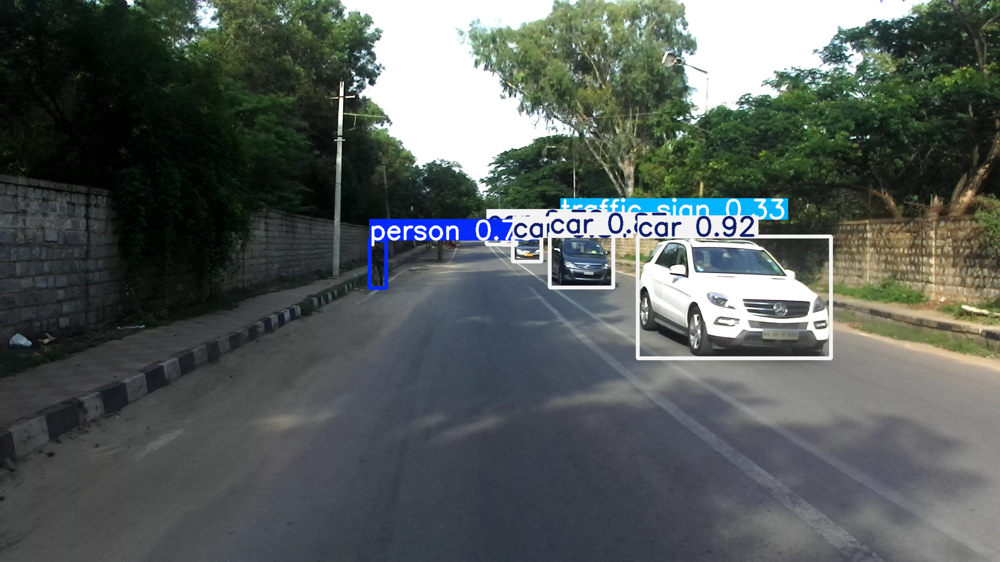

In [16]:
from ultralytics import YOLO

# Try loading and running inference with the trained model
model = YOLO("/workspace/yolo-distiller/runs/detect/v8nciousgdfromv8lciousgd_eiouadamw_kdidd/weights/best.pt")  # path to your trained model
results = model.predict("/workspace/0000240.jpg")  # use any sample image
results[0].show()


In [17]:
import numpy as np
import pandas as pd

# -----------------------------
# CLASSES
# -----------------------------
class_names = [
    "person", "rider", "car", "truck", "bus",
    "motorcycle", "bicycle", "autorickshaw",
    "animal", "traffic light", "traffic sign"
]

# -----------------------------
# CONFUSION MATRIX (RAW COUNTS)
# Rows = Predicted, Columns = Ground Truth
# -----------------------------
conf_matrix = np.array([
    [7103, 308, 108,   1,   0,  45,   5,   4,  28,  23, 1964],  # person
    [ 422,11142,145,  13,   1, 165,   3,  20,   3,   2, 2580],  # rider
    [  13,  67,14357,166, 110,  76,   0, 135,   1,   2, 3042],  # car
    [   0,   4, 105,3711, 241,   4,   0, 183,   0,   1, 1090],  # truck
    [   0,   0, 100, 155,2889,   0,   0,  10,   0,   3,  605],  # bus
    [ 145, 213, 160,   5,   3,14550, 79,   8,  16,   0, 3532],  # motorcycle
    [   2,   1,   0,   2,  16, 147,   0,   0,   1,   0,  126],  # bicycle
    [  17,  29, 115, 173,  15,   5,   0,4592,   2,   0,  990],  # autorickshaw
    [   4,   0,   0,   0,   0,   0,   0,   0, 212,   0,   89],  # animal
    [   0,   0,   0,   0,   0,   0,   0,   0,   0, 140,   85],  # traffic light
    [   2,   2,   1,   1,   0,   1,   0,   0,   0,   5, 1073],  # traffic sign
])

# -----------------------------
# YOLO METRICS (PROVIDED)
# -----------------------------
per_class_precision = [
    0.715, 0.752, 0.770, 0.689, 0.769,
    0.760, 0.555, 0.755, 0.630, 0.596, 0.574
]

per_class_recall = [
    0.400, 0.464, 0.579, 0.542, 0.606,
    0.578, 0.304, 0.597, 0.147, 0.156, 0.252
]

per_class_map50 = [
    0.468, 0.531, 0.643, 0.595, 0.667,
    0.631, 0.319, 0.657, 0.182, 0.187, 0.273
]

per_class_map5095 = [
    0.259, 0.306, 0.450, 0.423, 0.508,
    0.379, 0.194, 0.470, 0.0909, 0.087, 0.142
]

# -----------------------------
# COMPUTE METRICS
# -----------------------------
metrics_data = []
total_samples = np.sum(conf_matrix)

for i, cname in enumerate(class_names):
    TP = conf_matrix[i, i]
    FP = np.sum(conf_matrix[i, :]) - TP
    FN = np.sum(conf_matrix[:, i]) - TP
    TN = total_samples - (TP + FP + FN)

    P = per_class_precision[i]
    R = per_class_recall[i]
    F1 = 2 * P * R / (P + R) if (P + R) > 0 else 0

    metrics_data.append({
        "Class": cname,
        "TP": int(TP),
        "FP": int(FP),
        "FN": int(FN),
        "TN": int(TN),
        "Precision": round(P, 4),
        "Recall": round(R, 4),
        "F1 Score": round(F1, 4),
        "Accuracy": round((TP + TN) / total_samples, 4),
        "FPR": round(FP / (FP + TN), 4) if (FP + TN) > 0 else 0,
        "FNR": round(FN / (FN + TP), 4) if (FN + TP) > 0 else 0,
        "mAP@0.5": per_class_map50[i],
        "mAP@0.5:0.95": per_class_map5095[i]
    })

# -----------------------------
# OVERALL ROW
# -----------------------------
overall = {
    "Class": "all",
    "TP": sum(r["TP"] for r in metrics_data),
    "FP": sum(r["FP"] for r in metrics_data),
    "FN": sum(r["FN"] for r in metrics_data),
    "TN": sum(r["TN"] for r in metrics_data),
    "Precision": 0.688,
    "Recall": 0.420,
    "F1 Score": round(2 * 0.688 * 0.420 / (0.688 + 0.420), 4),
    "Accuracy": round(np.mean([r["Accuracy"] for r in metrics_data]), 4),
    "FPR": round(np.mean([r["FPR"] for r in metrics_data]), 4),
    "FNR": round(np.mean([r["FNR"] for r in metrics_data]), 4),
    "mAP@0.5": 0.468,
    "mAP@0.5:0.95": 0.301
}

metrics_data.append(overall)

# -----------------------------
# SAVE CSV
# -----------------------------
df = pd.DataFrame(metrics_data)
df.to_csv("idd_metrics_v8nciousgdfromv8lciousgd_eiouadamw_kdidd.csv", index=False)
print(df)


            Class     TP     FP     FN      TN  Precision  Recall  F1 Score  \
0          person   7103   2486    605   67520      0.715   0.400    0.5130   
1           rider  11142   3354    624   62594      0.752   0.464    0.5739   
2             car  14357   3612    734   59011      0.770   0.579    0.6610   
3           truck   3711   1628    516   71859      0.689   0.542    0.6067   
4             bus   2889    873    386   73566      0.769   0.606    0.6778   
5      motorcycle  14550   4161    443   58560      0.760   0.578    0.6566   
6         bicycle      0    295     87   77332      0.555   0.304    0.3928   
7    autorickshaw   4592   1346    360   71416      0.755   0.597    0.6668   
8          animal    212     93     51   77358      0.630   0.147    0.2384   
9   traffic light    140     85     36   77453      0.596   0.156    0.2473   
10   traffic sign   1073     12  14103   62526      0.574   0.252    0.3502   
11            all  59769  17945  17945  759195      

In [22]:
# ==============================================================
# YOLOv8 Speed Benchmark (H100 / MIG Safe)
# Resolution: 640 x 640
# Batch size: 1
# Metrics:
#   - Pure Inference Time (ms/frame)
#   - Inference FPS
#   - End-to-End Latency (ms/frame)
#   - Latency FPS
#   - Model Parameters (M)
#   - Model File Size (MB)
# ==============================================================

import torch
import cv2
import csv
import os
from pathlib import Path
from ultralytics import YOLO

# -----------------------------
# CONFIGURATION
# -----------------------------
weights = "/workspace/yolo-distiller/runs/detect/v8nciousgdfromv8lciousgd_eiouadamw_kdidd/weights/best.pt"          # Path to trained YOLOv8 model
img_path = "/workspace/0000240.jpg"      # Any validation image
img_size = 640
batch_size = 1
csv_file = "benchmark_results_v8nciousgdfromv8lciousgd_eiouadamw_kdidd.csv"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# -----------------------------
# DEVICE INFO
# -----------------------------
print(f"\nUsing device: {device}")
print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"CUDA Version: {torch.version.cuda}")
print(f"cuDNN Version: {torch.backends.cudnn.version()}\n")

# -----------------------------
# LOAD MODEL
# -----------------------------
model = YOLO(weights).to(device)
model.model.eval()

model_name = Path(weights).stem
model_size_mb = Path(weights).stat().st_size / (1024 ** 2)

params = sum(p.numel() for p in model.model.parameters())
params_million = params / 1e6

print(f"Model: {model_name}")
print(f"Parameters: {params_million:.2f} M")
print(f"Model file size: {model_size_mb:.2f} MB\n")

# ==============================================================
# 1️ PURE INFERENCE SPEED (FORWARD PASS ONLY)
# ==============================================================

dummy_input = torch.randn(
    batch_size, 3, img_size, img_size, device=device
) / 255.0

# Warm-up
for _ in range(10):
    _ = model.model(dummy_input)

torch.cuda.synchronize()

starter = torch.cuda.Event(enable_timing=True)
ender = torch.cuda.Event(enable_timing=True)

n_runs = 100

starter.record()
with torch.inference_mode():
    for _ in range(n_runs):
        _ = model.model(dummy_input)
ender.record()

torch.cuda.synchronize()

inference_time_ms = starter.elapsed_time(ender) / n_runs
inference_fps = 1000 / inference_time_ms

print("=== Pure Inference (Forward Pass Only) ===")
print(f"Inference Time:  {inference_time_ms:.2f} ms/frame")
print(f"Inference Speed: {inference_fps:.2f} FPS @ {img_size}x{img_size}\n")

# ==============================================================
# 2️ END-TO-END LATENCY (PRE + INFER + POST)
# ==============================================================

img = cv2.imread(img_path)
assert img is not None, "Failed to load image."

# Warm-up
for _ in range(5):
    _ = model.predict(
        img, imgsz=img_size, device=device, verbose=False
    )

torch.cuda.synchronize()

starter.record()
for _ in range(30):
    _ = model.predict(
        img, imgsz=img_size, device=device, verbose=False
    )
ender.record()

torch.cuda.synchronize()

latency_ms = starter.elapsed_time(ender) / 30
latency_fps = 1000 / latency_ms

print("=== End-to-End Latency (Full Pipeline) ===")
print(f"Latency:     {latency_ms:.2f} ms/frame")
print(f"Latency FPS:{latency_fps:.2f}\n")

# ==============================================================
# 3️ SAVE RESULTS TO CSV
# ==============================================================

fieldnames = [
    "Model",
    "GPU",
    "Batch_Size",
    "Image_Size",
    "Params_(M)",
    "Model_Size_(MB)",
    "Inference_Time_(ms)",
    "Inference_FPS",
    "Latency_(ms)",
    "Latency_FPS",
]

file_exists = os.path.isfile(csv_file)

with open(csv_file, mode="a", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    if not file_exists:
        writer.writeheader()

    writer.writerow({
        "Model": model_name,
        "GPU": torch.cuda.get_device_name(0),
        "Batch_Size": batch_size,
        "Image_Size": f"{img_size}x{img_size}",
        "Params_(M)": round(params_million, 2),
        "Model_Size_(MB)": round(model_size_mb, 2),
        "Inference_Time_(ms)": round(inference_time_ms, 2),
        "Inference_FPS": round(inference_fps, 2),
        "Latency_(ms)": round(latency_ms, 2),
        "Latency_FPS": round(latency_fps, 2),
    })

print(f"Benchmark results saved to: {csv_file}")

# ==============================================================
# SUMMARY
# ==============================================================
print("\n=== Benchmark Summary ===")
print(f"Model:            {model_name}")
print(f"GPU:              {torch.cuda.get_device_name(0)} (MIG Enabled)")
print(f"Input Resolution: {img_size}x{img_size}")
print(f"Batch Size:       {batch_size}")
print(f"Parameters:       {params_million:.2f} M")
print(f"Model Size:       {model_size_mb:.2f} MB")
print(f"Inference Time:   {inference_time_ms:.2f} ms ({inference_fps:.2f} FPS)")
print(f"Latency:          {latency_ms:.2f} ms ({latency_fps:.2f} FPS)")
print("=============================================================")



Using device: cuda:0
GPU: NVIDIA H100 80GB HBM3 MIG 3g.40gb
CUDA Version: 12.6
cuDNN Version: 90600

Model: best
Parameters: 3.01 M
Model file size: 5.97 MB

=== Pure Inference (Forward Pass Only) ===
Inference Time:  2.57 ms/frame
Inference Speed: 388.63 FPS @ 640x640

=== End-to-End Latency (Full Pipeline) ===
Latency:     4.08 ms/frame
Latency FPS:245.26

Benchmark results saved to: benchmark_results_v8nciousgdfromv8lciousgd_eiouadamw_kdidd.csv

=== Benchmark Summary ===
Model:            best
GPU:              NVIDIA H100 80GB HBM3 MIG 3g.40gb (MIG Enabled)
Input Resolution: 640x640
Batch Size:       1
Parameters:       3.01 M
Model Size:       5.97 MB
Inference Time:   2.57 ms (388.63 FPS)
Latency:          4.08 ms (245.26 FPS)
